In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
import os
import numpy as np
import astropy.units as u
from astropy.coordinates import SkyCoord, Angle
from regions import CircleSkyRegion
from gammapy.spectrum import (
    SpectrumDatasetOnOff,
    SpectrumDataset,
    SpectrumDatasetMaker,
    FluxPointsEstimator,
    FluxPointsDataset,
    ReflectedRegionsBackgroundMaker,
    plot_spectrum_datasets_off_regions,
)
from gammapy.modeling import Fit, Parameter
from gammapy.modeling.models import (
    PowerLawSpectralModel,
    SpectralModel,
    SkyModel,
    ExpCutoffPowerLawSpectralModel,
)
from gammapy.irf import load_cta_irfs
from gammapy.data import Observation
from gammapy.maps import MapAxis
from itertools import combinations

In [3]:
import scipy.stats as stats
import math

In [4]:
os.environ['CALDB'] = '/home/rishank/anaconda2/envs/cta/share/caldb/'
!echo $CALDB
!ls $CALDB

/home/rishank/anaconda2/envs/cta/share/caldb/
data


In [5]:
l = [0.02,0.05,0.1,0.5]
livetime = [10,8,5,4,2] * u.h
n_obs = [100,125,200,250,500]
model_name = ['PowerLaw', 'Cutoff_value = 50TeV', 'Cutoff_value = 20TeV', 'Cutoff_value = 10TeV', 'Cutoff_value = 2TeV']
pointing = SkyCoord(0, 0, unit="deg", frame="galactic")
offset = 0.5 * u.deg
# Reconstructed and true energy axis
energy_axis = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 10), unit="TeV", name="energy", interp="log"
)
energy_axis_true = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 10), unit="TeV", name="energy", interp="log"
)

on_region_radius = Angle("0.11 deg")
on_region = CircleSkyRegion(center=pointing, radius=on_region_radius)

In [6]:
irfs = load_cta_irfs(
    "$CALDB/data/cta/prod3b-v2/bcf/South_z20_50h/irf_file.fits"
)

In [7]:
rows, cols = (5, 5) 
model = [[0 for i in range(cols)] for j in range(rows)]
print(model) 

[[0, 0, 0, 0, 0], [0, 0, 0, 0, 0], [0, 0, 0, 0, 0], [0, 0, 0, 0, 0], [0, 0, 0, 0, 0]]


In [8]:
for i in range(5):
    model_simu = PowerLawSpectralModel(
        index=2.22,
        amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
        reference=1 * u.TeV,
    )
    print(model_simu) 
    mod = SkyModel(spectral_model=model_simu)
    model[i][0]=mod

PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --

In [9]:
simu = []
for j in range(4):
    for i in range(5):
        sim = ExpCutoffPowerLawSpectralModel(
            index=2.22,
            amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
            reference=1 * u.TeV,
            lambda_=l[j] * u.Unit("TeV-1"),
            alpha = 1,
        )
        mod = SkyModel(spectral_model=sim)
        model[i][j+1]=mod
    simu.append(sim)
    print(simu[j])

ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.000e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.000e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    inde

In [10]:
obs = [[0 for i in range(cols)] for j in range(rows)]
for j in range(5):
    for i in range(5):
        obs[i][j]=Observation.create(pointing=pointing, livetime=livetime[i], irfs=irfs)
        print(obs[i][j])

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 36000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 28800.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 18000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 14400.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 7200.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 36000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 28800.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 18000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 14400.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 7200.0 s

Info for OBS

In [11]:
dataset = [[0 for i in range(cols)] for j in range(rows)]
for j in range(5):
    for i in range(5):
        dataset_empty = SpectrumDataset.create(
            e_reco=energy_axis.edges, e_true=energy_axis_true.edges, region=on_region
        )
        maker = SpectrumDatasetMaker(selection=["aeff", "edisp", "background"])
        dataset[i][j]=maker.run(dataset_empty, obs[i][j])
        print(dataset[i][j])

SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 4231.13

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 3.60e+04 s

    Number of total bins            : 0 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 3384.90

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.88e+04 s

    Number of total bins            : 0 
    Number of fit bins  

SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 846.23

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 7.20e+03 s

    Number of total bins            : 0 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 4231.13

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 3.60e+04 s

    Number of total bins            : 0 
    Number of fit bins   

In [12]:
data = [[0 for i in range(cols)] for j in range(rows)]
for j in range(5):
    for i in range(5):
        dataset[i][j].model = model[i][j]
        dataset[i][j].fake(random_state=42)
        print(dataset[i][j])
        data[i][j]=dataset[i][j]

SpectrumDataset

    Name                            : 1 

    Total counts                    : 4219 
    Total predicted counts          : nan
    Total background counts         : 4231.13

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 3.60e+04 s

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : 3375 
    Total predicted counts          : nan
    Total background counts         : 3384.90

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.88e+04 s

    Number of total bins            : 9 
    Number of fit bins

In [13]:
data_onoff = [[0 for i in range(cols)] for j in range(rows)]
for j in range(5):
    for i in range(5):
        dataset_onoff = SpectrumDatasetOnOff(
            aeff=data[i][j].aeff,
            edisp=data[i][j].edisp,
            models=model[i][j],
            livetime=livetime[i],
            acceptance=1,
            acceptance_off=5,
        )
        dataset_onoff.fake(background_model=data[i][j].background)
        print(dataset_onoff)
        data_onoff[i][j]=dataset_onoff

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 7717 
    Total predicted counts          : 7940.56
    Total off counts                : 21252.00

    Total background counts         : 4250.40

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 1.00e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.34

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 6374 
    Total predicted counts          : 6366.53
    Total off counts                : 17072.00

    Total background counts         : 3414.40

    Effec

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 2980 
    Total predicted counts          : 3015.09
    Total off counts                : 8321.00

    Total background counts         : 1664.20

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 4.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 1536 
    Total predicted counts          : 1510.25
    Total off counts                : 4174.00

    Total background counts         : 834.80

    Effective

In [14]:
%%time
datas = [[0 for i in range(cols)] for j in range(rows)]
for j in range(5):
    for i in range(5):
        datasets = []
        for idx in range(n_obs[i]):
            data_onoff[i][j].fake(random_state=idx, background_model=data[i][j].background)
            data_onoff[i][j].name = f"obs_{idx}"
            datasets.append(data_onoff[i][j].copy())
        datas[i][j]=datasets

CPU times: user 31.1 s, sys: 270 ms, total: 31.4 s
Wall time: 31.6 s


In [15]:
print(*datas[0][0], sep = "\n")
print(*datas[4][4], sep = "\n")

SpectrumDatasetOnOff

    Name                            : obs_0 

    Total counts                    : 7894 
    Total predicted counts          : 7913.96
    Total off counts                : 21119.00

    Total background counts         : 4223.80

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 1.00e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.23

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1 

    Total counts                    : 7805 
    Total predicted counts          : 7945.36
    Total off counts                : 21276.00

    Total background counts         : 4255.20


SpectrumDatasetOnOff

    Name                            : obs_15 

    Total counts                    : 7734 
    Total predicted counts          : 7895.76
    Total off counts                : 21028.00

    Total background counts         : 4205.60

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 1.00e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.53

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_16 

    Total counts                    : 7832 
    Total predicted counts          : 7914.56
    Total off counts                : 21122.00

    Total background counts         : 4224.4

SpectrumDatasetOnOff

    Name                            : obs_37 

    Total counts                    : 7866 
    Total predicted counts          : 7943.96
    Total off counts                : 21269.00

    Total background counts         : 4253.80

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 1.00e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.72

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_38 

    Total counts                    : 7939 
    Total predicted counts          : 7896.56
    Total off counts                : 21032.00

    Total background counts         : 4206.4

SpectrumDatasetOnOff

    Name                            : obs_62 

    Total counts                    : 8024 
    Total predicted counts          : 7939.96
    Total off counts                : 21249.00

    Total background counts         : 4249.80

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 1.00e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.99

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_63 

    Total counts                    : 7882 
    Total predicted counts          : 7900.16
    Total off counts                : 21050.00

    Total background counts         : 4210.0

SpectrumDatasetOnOff

    Name                            : obs_82 

    Total counts                    : 7786 
    Total predicted counts          : 7921.56
    Total off counts                : 21157.00

    Total background counts         : 4231.40

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 1.00e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.62

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_83 

    Total counts                    : 7850 
    Total predicted counts          : 7908.56
    Total off counts                : 21092.00

    Total background counts         : 4218.40

SpectrumDatasetOnOff

    Name                            : obs_4 

    Total counts                    : 1507 
    Total predicted counts          : 1407.68
    Total off counts                : 4208.00

    Total background counts         : 841.60

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 21.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5 

    Total counts                    : 1394 
    Total predicted counts          : 1421.08
    Total off counts                : 4275.00

    Total background counts         : 855.00

   

SpectrumDatasetOnOff

    Name                            : obs_24 

    Total counts                    : 1401 
    Total predicted counts          : 1416.08
    Total off counts                : 4250.00

    Total background counts         : 850.00

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_25 

    Total counts                    : 1413 
    Total predicted counts          : 1423.68
    Total off counts                : 4288.00

    Total background counts         : 857.60

 

SpectrumDatasetOnOff

    Name                            : obs_40 

    Total counts                    : 1432 
    Total predicted counts          : 1396.88
    Total off counts                : 4154.00

    Total background counts         : 830.80

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_41 

    Total counts                    : 1404 
    Total predicted counts          : 1411.48
    Total off counts                : 4227.00

    Total background counts         : 845.40

  

SpectrumDatasetOnOff

    Name                            : obs_51 

    Total counts                    : 1407 
    Total predicted counts          : 1396.48
    Total off counts                : 4152.00

    Total background counts         : 830.40

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_52 

    Total counts                    : 1429 
    Total predicted counts          : 1400.28
    Total off counts                : 4171.00

    Total background counts         : 834.20

  

SpectrumDatasetOnOff

    Name                            : obs_65 

    Total counts                    : 1389 
    Total predicted counts          : 1402.08
    Total off counts                : 4180.00

    Total background counts         : 836.00

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_66 

    Total counts                    : 1398 
    Total predicted counts          : 1399.68
    Total off counts                : 4168.00

    Total background counts         : 833.60

 

SpectrumDatasetOnOff

    Name                            : obs_77 

    Total counts                    : 1389 
    Total predicted counts          : 1411.08
    Total off counts                : 4225.00

    Total background counts         : 845.00

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_78 

    Total counts                    : 1434 
    Total predicted counts          : 1423.68
    Total off counts                : 4288.00

    Total background counts         : 857.60

  

SpectrumDatasetOnOff

    Name                            : obs_97 

    Total counts                    : 1420 
    Total predicted counts          : 1418.68
    Total off counts                : 4263.00

    Total background counts         : 852.60

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_98 

    Total counts                    : 1347 
    Total predicted counts          : 1391.48
    Total off counts                : 4127.00

    Total background counts         : 825.40

  

SpectrumDatasetOnOff

    Name                            : obs_116 

    Total counts                    : 1416 
    Total predicted counts          : 1402.88
    Total off counts                : 4184.00

    Total background counts         : 836.80

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_117 

    Total counts                    : 1408 
    Total predicted counts          : 1429.28
    Total off counts                : 4316.00

    Total background counts         : 863.20


SpectrumDatasetOnOff

    Name                            : obs_127 

    Total counts                    : 1449 
    Total predicted counts          : 1402.88
    Total off counts                : 4184.00

    Total background counts         : 836.80

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_128 

    Total counts                    : 1386 
    Total predicted counts          : 1411.88
    Total off counts                : 4229.00

    Total background counts         : 845.80



SpectrumDatasetOnOff

    Name                            : obs_139 

    Total counts                    : 1379 
    Total predicted counts          : 1413.88
    Total off counts                : 4239.00

    Total background counts         : 847.80

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_140 

    Total counts                    : 1374 
    Total predicted counts          : 1415.48
    Total off counts                : 4247.00

    Total background counts         : 849.40



SpectrumDatasetOnOff

    Name                            : obs_150 

    Total counts                    : 1470 
    Total predicted counts          : 1395.68
    Total off counts                : 4148.00

    Total background counts         : 829.60

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_151 

    Total counts                    : 1385 
    Total predicted counts          : 1413.08
    Total off counts                : 4235.00

    Total background counts         : 847.00


SpectrumDatasetOnOff

    Name                            : obs_161 

    Total counts                    : 1423 
    Total predicted counts          : 1402.68
    Total off counts                : 4183.00

    Total background counts         : 836.60

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_162 

    Total counts                    : 1397 
    Total predicted counts          : 1392.68
    Total off counts                : 4133.00

    Total background counts         : 826.60



SpectrumDatasetOnOff

    Name                            : obs_173 

    Total counts                    : 1413 
    Total predicted counts          : 1433.48
    Total off counts                : 4337.00

    Total background counts         : 867.40

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_174 

    Total counts                    : 1433 
    Total predicted counts          : 1405.28
    Total off counts                : 4196.00

    Total background counts         : 839.20



SpectrumDatasetOnOff

    Name                            : obs_187 

    Total counts                    : 1367 
    Total predicted counts          : 1397.08
    Total off counts                : 4155.00

    Total background counts         : 831.00

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_188 

    Total counts                    : 1452 
    Total predicted counts          : 1398.48
    Total off counts                : 4162.00

    Total background counts         : 832.40



SpectrumDatasetOnOff

    Name                            : obs_199 

    Total counts                    : 1391 
    Total predicted counts          : 1397.28
    Total off counts                : 4156.00

    Total background counts         : 831.20

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_200 

    Total counts                    : 1477 
    Total predicted counts          : 1422.48
    Total off counts                : 4282.00

    Total background counts         : 856.40



SpectrumDatasetOnOff

    Name                            : obs_211 

    Total counts                    : 1477 
    Total predicted counts          : 1408.68
    Total off counts                : 4213.00

    Total background counts         : 842.60

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_212 

    Total counts                    : 1339 
    Total predicted counts          : 1420.48
    Total off counts                : 4272.00

    Total background counts         : 854.40



SpectrumDatasetOnOff

    Name                            : obs_237 

    Total counts                    : 1431 
    Total predicted counts          : 1401.48
    Total off counts                : 4177.00

    Total background counts         : 835.40

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_238 

    Total counts                    : 1341 
    Total predicted counts          : 1405.08
    Total off counts                : 4195.00

    Total background counts         : 839.00



SpectrumDatasetOnOff

    Name                            : obs_263 

    Total counts                    : 1458 
    Total predicted counts          : 1389.48
    Total off counts                : 4117.00

    Total background counts         : 823.40

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_264 

    Total counts                    : 1433 
    Total predicted counts          : 1409.28
    Total off counts                : 4216.00

    Total background counts         : 843.20


SpectrumDatasetOnOff

    Name                            : obs_291 

    Total counts                    : 1411 
    Total predicted counts          : 1408.08
    Total off counts                : 4210.00

    Total background counts         : 842.00

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_292 

    Total counts                    : 1395 
    Total predicted counts          : 1408.68
    Total off counts                : 4213.00

    Total background counts         : 842.60



SpectrumDatasetOnOff

    Name                            : obs_316 

    Total counts                    : 1428 
    Total predicted counts          : 1424.28
    Total off counts                : 4291.00

    Total background counts         : 858.20

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_317 

    Total counts                    : 1434 
    Total predicted counts          : 1412.28
    Total off counts                : 4231.00

    Total background counts         : 846.20



SpectrumDatasetOnOff

    Name                            : obs_349 

    Total counts                    : 1446 
    Total predicted counts          : 1394.68
    Total off counts                : 4143.00

    Total background counts         : 828.60

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_350 

    Total counts                    : 1462 
    Total predicted counts          : 1424.68
    Total off counts                : 4293.00

    Total background counts         : 858.60



SpectrumDatasetOnOff

    Name                            : obs_380 

    Total counts                    : 1380 
    Total predicted counts          : 1427.48
    Total off counts                : 4307.00

    Total background counts         : 861.40

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_381 

    Total counts                    : 1413 
    Total predicted counts          : 1408.88
    Total off counts                : 4214.00

    Total background counts         : 842.80



SpectrumDatasetOnOff

    Name                            : obs_391 

    Total counts                    : 1370 
    Total predicted counts          : 1403.48
    Total off counts                : 4187.00

    Total background counts         : 837.40

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_392 

    Total counts                    : 1446 
    Total predicted counts          : 1442.28
    Total off counts                : 4381.00

    Total background counts         : 876.20



SpectrumDatasetOnOff

    Name                            : obs_414 

    Total counts                    : 1428 
    Total predicted counts          : 1420.88
    Total off counts                : 4274.00

    Total background counts         : 854.80

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_415 

    Total counts                    : 1406 
    Total predicted counts          : 1421.88
    Total off counts                : 4279.00

    Total background counts         : 855.80



SpectrumDatasetOnOff

    Name                            : obs_426 

    Total counts                    : 1449 
    Total predicted counts          : 1406.28
    Total off counts                : 4201.00

    Total background counts         : 840.20

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_427 

    Total counts                    : 1399 
    Total predicted counts          : 1372.48
    Total off counts                : 4032.00

    Total background counts         : 806.40



SpectrumDatasetOnOff

    Name                            : obs_445 

    Total counts                    : 1426 
    Total predicted counts          : 1420.68
    Total off counts                : 4273.00

    Total background counts         : 854.60

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_446 

    Total counts                    : 1399 
    Total predicted counts          : 1417.08
    Total off counts                : 4255.00

    Total background counts         : 851.00



SpectrumDatasetOnOff

    Name                            : obs_479 

    Total counts                    : 1406 
    Total predicted counts          : 1391.68
    Total off counts                : 4128.00

    Total background counts         : 825.60

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_480 

    Total counts                    : 1447 
    Total predicted counts          : 1394.28
    Total off counts                : 4141.00

    Total background counts         : 828.20



/home/rishank/anaconda2/envs/gammapy-0.15/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


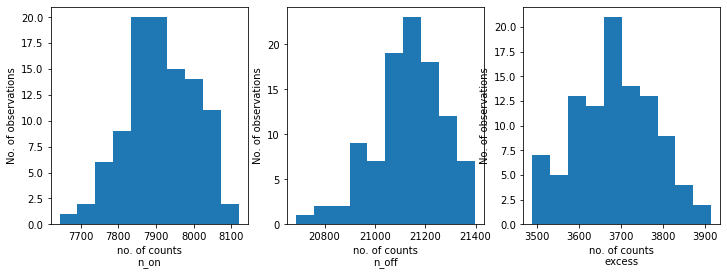

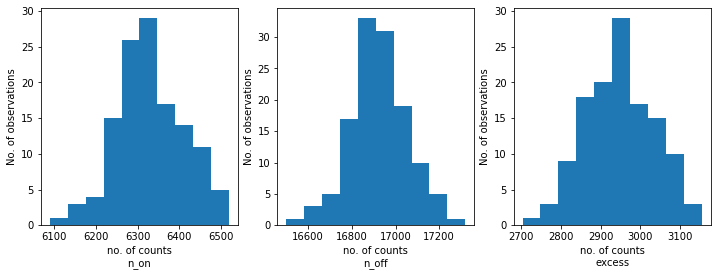

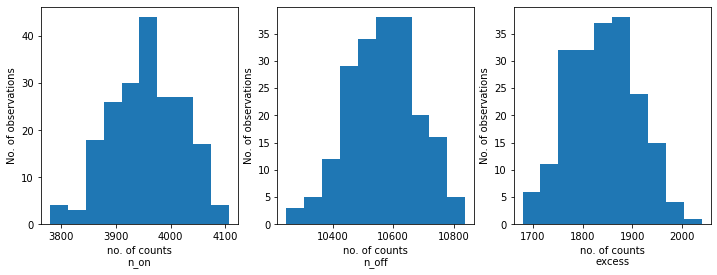

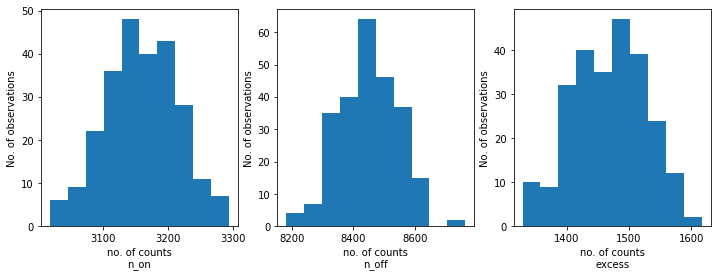

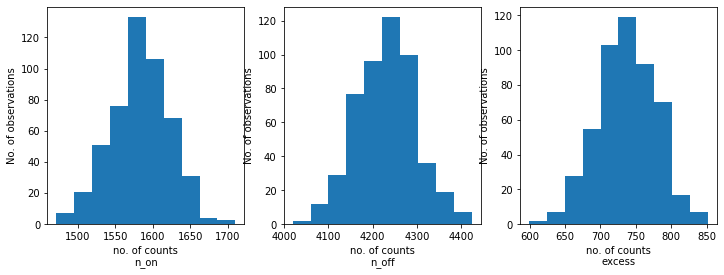

...

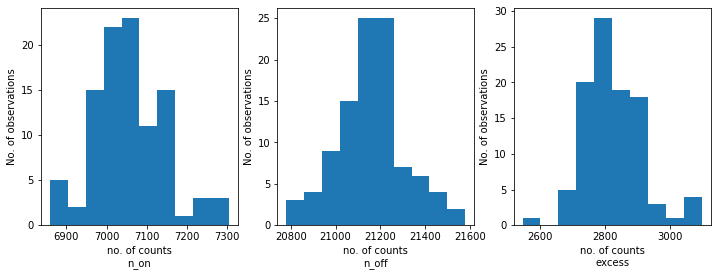

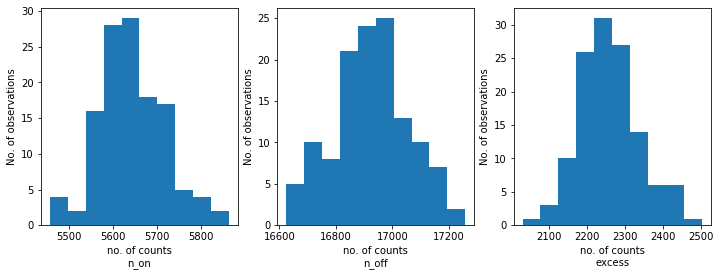

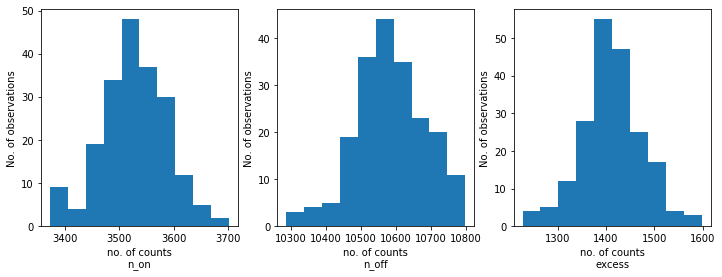

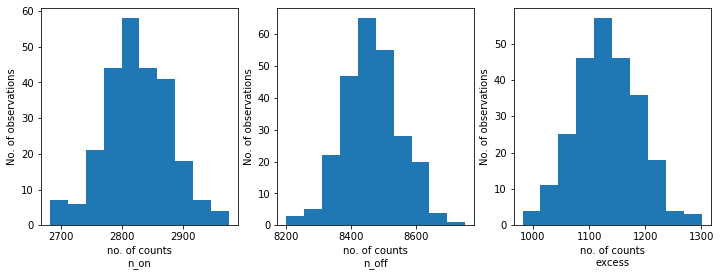

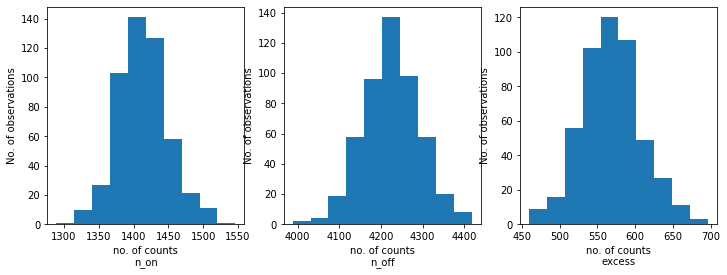

In [16]:
for j in range(5):
    for i in range(5):
        n_on = [dataset.counts.data.sum() for dataset in datas[i][j]]
        n_off = [dataset.counts_off.data.sum() for dataset in datas[i][j]]
        excess = [dataset.excess.data.sum() for dataset in datas[i][j]]
        
        fix, axes = plt.subplots(1, 3, figsize=(12, 4))
        axes[0].hist(n_on)
        axes[0].set_xlabel("no. of counts\nn_on")
        axes[0].set_ylabel("No. of observations")
        axes[1].hist(n_off)
        axes[1].set_xlabel("no. of counts\nn_off")
        axes[1].set_ylabel("No. of observations")
        axes[2].hist(excess)
        axes[2].set_xlabel("no. of counts\nexcess");
        axes[2].set_ylabel("No. of observations")

In [17]:
%%time
res = [[0 for i in range(cols)] for j in range(rows)]
fpes_all = [[0 for i in range(cols)] for j in range(rows)]
model_best_joints_all = [[0 for i in range(cols)] for j in range(rows)]
e_edges = np.logspace(-1.5, 2.0, 10) * u.TeV
for i in range(5):
    results = []
    fpes = []
    model_best_joints = []
    for dataset in datas[i][0]:
        dataset.models = model[i][0].copy()
        fit = Fit([dataset])
        result = fit.run()
        results.append(
            {
                "index": result.parameters["index"].value,
                "amplitude": result.parameters["amplitude"].value,
                "reference":result.parameters["reference"].value,
            }
        )
        print(result.parameters.to_table())
        fpe = FluxPointsEstimator(datasets=[dataset], e_edges=e_edges)
        flux_points = fpe.run()
        print(flux_points.table_formatted)
        fpes.append(flux_points)
        model_best_joint = model[i][0].copy()
        model_best_joint.spectral_model.parameters.covariance = (result.parameters.covariance)
        model_best_joints.append(model_best_joint)
    res[i][0]=results
    fpes_all[i][0]=fpes
    model_best_joints_all[i][0]=model_best_joints

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 1.379e-02                nan nan  False
amplitude 1.318e-12 3.071e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.913e-11       7.948e-11       7.879e-11
 0.121  0.077   0.190 ...       6.915e-12       6.911e-12       6.919e-12
 0.297  0.190   0.464 ...       8.613e-13       8.673e-13       8.553e-13
 0.726  0.464   1.136 ...       1.374e-13       1.393e-13       1.355e-13
 1.778  1.136   2.783 ...       2.135e-14       2.171e-14       2.099e-14
 4.354  2.783   6.813 ...       3.486e-15       3.561e-15       3.412e-15
10.661  6.813  16.681 ...       7.

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.943e-11       7.974e-11       7.911e-11
 0.121  0.077   0.190 ...       6.848e-12       6.870e-12       6.825e-12
 0.297  0.190   0.464 ...       8.793e-13       8.873e-13       8.714e-13
 0.726  0.464   1.136 ...       1.362e-13       1.382e-13       1.343e-13
 1.778  1.136   2.783 ...       2.033e-14       2.077e-14       1.991e-14
 4.354  2.783   6.813 ...       3.330e-15       3.420e-15       3.243e-15
10.661  6.813  16.681 ...       6.811e-16       7.049e-16       6.578e-16
26.102 16.681  40.842 ...       1.462e-16       1.551e-16       1.375e-16
63.908 40.842 100.000 ...       4.110e-17       4.416e-17       3.817e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.001e-11       8.048e-11       7.956e-11
 0.121  0.077   0.190 ...       7.023e-12       7.067e-12       6.979e-12
 0.297  0.190   0.464 ...       8.573e-13       8.651e-13       8.495e-13
 0.726  0.464   1.136 ...       1.387e-13       1.406e-13       1.368e-13
 1.778  1.136   2.783 ...       2.012e-14       2.046e-14       1.978e-14
 4.354  2.783   6.813 ...       3.474e-15       3.552e-15       3.397e-15
10.661  6.813  16.681 ...       7.079e-16       7.336e-16       6.829e-16
26.102 16.681  40.842 ...       1.649e-16       1.750e-16       1.552e-16
63.908 40.842 100.000 ...       4.108e-17       4.413e-17       3.814e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.887e-11       7.922e-11       7.853e-11
 0.121  0.077   0.190 ...       6.881e-12       6.886e-12       6.877e-12
 0.297  0.190   0.464 ...       8.699e-13       8.749e-13       8.648e-13
 0.726  0.464   1.136 ...       1.364e-13       1.383e-13       1.346e-13
 1.778  1.136   2.783 ...       1.962e-14       1.996e-14       1.928e-14
 4.354  2.783   6.813 ...       3.169e-15       3.242e-15       3.097e-15
10.661  6.813  16.681 ...       6.653e-16       6.912e-16       6.402e-16
26.102 16.681  40.842 ...       1.580e-16       1.672e-16       1.491e-16
63.908 40.842 100.000 ...       3.693e-17       3.998e-17       3.401e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.959e-11       7.991e-11       7.928e-11
 0.121  0.077   0.190 ...       6.864e-12       6.903e-12       6.825e-12
 0.297  0.190   0.464 ...       8.640e-13       8.719e-13       8.561e-13
 0.726  0.464   1.136 ...       1.363e-13       1.382e-13       1.345e-13
 1.778  1.136   2.783 ...       1.964e-14       2.000e-14       1.929e-14
 4.354  2.783   6.813 ...       3.319e-15       3.395e-15       3.245e-15
10.661  6.813  16.681 ...       6.991e-16       7.236e-16       6.750e-16
26.102 16.681  40.842 ...       1.509e-16       1.607e-16       1.414e-16
63.908 40.842 100.000 ...       3.802e-17       4.107e-17       3.509e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.965e-11       7.979e-11       7.951e-11
 0.121  0.077   0.190 ...       6.842e-12       6.833e-12       6.851e-12
 0.297  0.190   0.464 ...       8.851e-13       8.859e-13       8.840e-13
 0.726  0.464   1.136 ...       1.393e-13       1.412e-13       1.373e-13
 1.778  1.136   2.783 ...       2.044e-14       2.078e-14       2.009e-14
 4.354  2.783   6.813 ...       3.539e-15       3.613e-15       3.466e-15
10.661  6.813  16.681 ...       7.701e-16       7.942e-16       7.464e-16
26.102 16.681  40.842 ...       1.697e-16       1.790e-16       1.606e-16
63.908 40.842 100.000 ...       2.694e-17       3.002e-17       2.403e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.930e-11       7.931e-11       7.930e-11
 0.121  0.077   0.190 ...       6.930e-12       6.950e-12       6.909e-12
 0.297  0.190   0.464 ...       8.503e-13       8.515e-13       8.489e-13
 0.726  0.464   1.136 ...       1.390e-13       1.410e-13       1.371e-13
 1.778  1.136   2.783 ...       2.058e-14       2.092e-14       2.025e-14
 4.354  2.783   6.813 ...       3.267e-15       3.340e-15       3.195e-15
10.661  6.813  16.681 ...       6.808e-16       7.082e-16       6.544e-16
26.102 16.681  40.842 ...       1.558e-16       1.651e-16       1.468e-16
63.908 40.842 100.000 ...       3.470e-17       3.796e-17       3.163e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.931e-11       7.966e-11       7.897e-11
 0.121  0.077   0.190 ...       7.019e-12       7.063e-12       6.973e-12
 0.297  0.190   0.464 ...       8.883e-13       8.923e-13       8.841e-13
 0.726  0.464   1.136 ...       1.379e-13       1.401e-13       1.358e-13
 1.778  1.136   2.783 ...       2.061e-14       2.095e-14       2.027e-14
 4.354  2.783   6.813 ...       3.457e-15       3.551e-15       3.365e-15
10.661  6.813  16.681 ...       7.215e-16       7.481e-16       6.957e-16
26.102 16.681  40.842 ...       1.739e-16       1.831e-16       1.649e-16
63.908 40.842 100.000 ...       4.397e-17       4.702e-17       4.102e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.038e-11       8.073e-11       8.004e-11
 0.121  0.077   0.190 ...       6.743e-12       6.781e-12       6.704e-12
 0.297  0.190   0.464 ...       8.578e-13       8.649e-13       8.507e-13
 0.726  0.464   1.136 ...       1.423e-13       1.447e-13       1.400e-13
 1.778  1.136   2.783 ...       1.977e-14       2.027e-14       1.929e-14
 4.354  2.783   6.813 ...       3.557e-15       3.652e-15       3.464e-15
10.661  6.813  16.681 ...       7.188e-16       7.452e-16       6.931e-16
26.102 16.681  40.842 ...       1.740e-16       1.832e-16       1.650e-16
63.908 40.842 100.000 ...       3.240e-17       3.539e-17       2.953e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.041e-11       8.077e-11       8.006e-11
 0.121  0.077   0.190 ...       6.809e-12       6.822e-12       6.797e-12
 0.297  0.190   0.464 ...       8.495e-13       8.505e-13       8.484e-13
 0.726  0.464   1.136 ...       1.365e-13       1.384e-13       1.346e-13
 1.778  1.136   2.783 ...       2.042e-14       2.076e-14       2.008e-14
 4.354  2.783   6.813 ...       3.196e-15       3.267e-15       3.126e-15
10.661  6.813  16.681 ...       7.330e-16       7.568e-16       7.096e-16
26.102 16.681  40.842 ...       1.737e-16       1.834e-16       1.643e-16
63.908 40.842 100.000 ...       3.471e-17       3.792e-17       3.167e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.990e-11       8.030e-11       7.950e-11
 0.121  0.077   0.190 ...       6.840e-12       6.828e-12       6.853e-12
 0.297  0.190   0.464 ...       8.697e-13       8.770e-13       8.624e-13
 0.726  0.464   1.136 ...       1.407e-13       1.426e-13       1.388e-13
 1.778  1.136   2.783 ...       1.996e-14       2.030e-14       1.962e-14
 4.354  2.783   6.813 ...       3.372e-15       3.446e-15       3.299e-15
10.661  6.813  16.681 ...       7.069e-16       7.308e-16       6.834e-16
26.102 16.681  40.842 ...       1.436e-16       1.524e-16       1.350e-16
63.908 40.842 100.000 ...       3.696e-17       4.008e-17       3.398e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.920e-11       7.952e-11       7.888e-11
 0.121  0.077   0.190 ...       6.922e-12       6.981e-12       6.863e-12
 0.297  0.190   0.464 ...       8.342e-13       8.420e-13       8.264e-13
 0.726  0.464   1.136 ...       1.343e-13       1.362e-13       1.324e-13
 1.778  1.136   2.783 ...       1.935e-14       1.974e-14       1.898e-14
 4.354  2.783   6.813 ...       3.355e-15       3.429e-15       3.283e-15
10.661  6.813  16.681 ...       7.420e-16       7.668e-16       7.178e-16
26.102 16.681  40.842 ...       1.486e-16       1.578e-16       1.398e-16
63.908 40.842 100.000 ...       3.588e-17       3.896e-17       3.293e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.935e-11       7.923e-11       7.950e-11
 0.121  0.077   0.190 ...       6.852e-12       6.860e-12       6.844e-12
 0.297  0.190   0.464 ...       8.618e-13       8.697e-13       8.539e-13
 0.726  0.464   1.136 ...       1.378e-13       1.397e-13       1.359e-13
 1.778  1.136   2.783 ...       1.965e-14       1.998e-14       1.932e-14
 4.354  2.783   6.813 ...       3.677e-15       3.753e-15       3.602e-15
10.661  6.813  16.681 ...       7.193e-16       7.431e-16       6.959e-16
26.102 16.681  40.842 ...       1.762e-16       1.855e-16       1.673e-16
63.908 40.842 100.000 ...       4.216e-17       4.522e-17       3.922e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.992e-11       8.024e-11       7.959e-11
 0.121  0.077   0.190 ...       6.866e-12       6.907e-12       6.824e-12
 0.297  0.190   0.464 ...       8.679e-13       8.759e-13       8.601e-13
 0.726  0.464   1.136 ...       1.390e-13       1.409e-13       1.371e-13
 1.778  1.136   2.783 ...       2.106e-14       2.141e-14       2.071e-14
 4.354  2.783   6.813 ...       3.343e-15       3.431e-15       3.257e-15
10.661  6.813  16.681 ...       6.388e-16       6.601e-16       6.176e-16
26.102 16.681  40.842 ...       1.605e-16       1.697e-16       1.515e-16
63.908 40.842 100.000 ...       3.233e-17       3.538e-17       2.942e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.033e-11       8.068e-11       7.997e-11
 0.121  0.077   0.190 ...       6.733e-12       6.763e-12       6.703e-12
 0.297  0.190   0.464 ...       8.638e-13       8.693e-13       8.583e-13
 0.726  0.464   1.136 ...       1.387e-13       1.406e-13       1.367e-13
 1.778  1.136   2.783 ...       1.996e-14       2.035e-14       1.957e-14
 4.354  2.783   6.813 ...       3.358e-15       3.431e-15       3.285e-15
10.661  6.813  16.681 ...       7.666e-16       7.910e-16       7.426e-16
26.102 16.681  40.842 ...       1.538e-16       1.628e-16       1.450e-16
63.908 40.842 100.000 ...       4.309e-17       4.614e-17       4.014e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.910e-11       8.951e-11       8.869e-11
 0.121  0.077   0.190 ...       7.683e-12       7.701e-12       7.666e-12
 0.297  0.190   0.464 ...       9.776e-13       9.821e-13       9.728e-13
 0.726  0.464   1.136 ...       1.559e-13       1.584e-13       1.535e-13
 1.778  1.136   2.783 ...       2.140e-14       2.182e-14       2.099e-14
 4.354  2.783   6.813 ...       3.710e-15       3.828e-15       3.595e-15
10.661  6.813  16.681 ...       8.508e-16       8.824e-16       8.199e-16
26.102 16.681  40.842 ...       1.729e-16       1.856e-16       1.609e-16
63.908 40.842 100.000 ...       4.044e-17       4.427e-17       3.678e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.790e-11       8.820e-11       8.760e-11
 0.121  0.077   0.190 ...       7.656e-12       7.706e-12       7.606e-12
 0.297  0.190   0.464 ...       9.911e-13       9.948e-13       9.873e-13
 0.726  0.464   1.136 ...       1.616e-13       1.643e-13       1.589e-13
 1.778  1.136   2.783 ...       2.208e-14       2.250e-14       2.167e-14
 4.354  2.783   6.813 ...       4.124e-15       4.217e-15       4.032e-15
10.661  6.813  16.681 ...       7.949e-16       8.243e-16       7.659e-16
26.102 16.681  40.842 ...       1.922e-16       2.038e-16       1.810e-16
63.908 40.842 100.000 ...       4.202e-17       4.591e-17       3.832e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.811e-11       8.850e-11       8.770e-11
 0.121  0.077   0.190 ...       7.692e-12       7.722e-12       7.662e-12
 0.297  0.190   0.464 ...       9.664e-13       9.761e-13       9.568e-13
 0.726  0.464   1.136 ...       1.549e-13       1.573e-13       1.526e-13
 1.778  1.136   2.783 ...       2.164e-14       2.209e-14       2.120e-14
 4.354  2.783   6.813 ...       3.794e-15       3.887e-15       3.703e-15
10.661  6.813  16.681 ...       7.182e-16       7.478e-16       6.892e-16
26.102 16.681  40.842 ...       1.551e-16       1.665e-16       1.442e-16
63.908 40.842 100.000 ...       3.538e-17       3.921e-17       3.175e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.916e-11       8.959e-11       8.873e-11
 0.121  0.077   0.190 ...       7.777e-12       7.822e-12       7.732e-12
 0.297  0.190   0.464 ...       9.871e-13       9.934e-13       9.807e-13
 0.726  0.464   1.136 ...       1.535e-13       1.559e-13       1.512e-13
 1.778  1.136   2.783 ...       2.262e-14       2.318e-14       2.207e-14
 4.354  2.783   6.813 ...       3.625e-15       3.717e-15       3.535e-15
10.661  6.813  16.681 ...       7.630e-16       7.957e-16       7.314e-16
26.102 16.681  40.842 ...       1.623e-16       1.738e-16       1.513e-16
63.908 40.842 100.000 ...       3.875e-17       4.259e-17       3.510e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.818e-11       8.861e-11       8.775e-11
 0.121  0.077   0.190 ...       7.840e-12       7.896e-12       7.784e-12
 0.297  0.190   0.464 ...       9.902e-13       9.983e-13       9.820e-13
 0.726  0.464   1.136 ...       1.557e-13       1.582e-13       1.533e-13
 1.778  1.136   2.783 ...       2.119e-14       2.160e-14       2.080e-14
 4.354  2.783   6.813 ...       3.968e-15       4.061e-15       3.876e-15
10.661  6.813  16.681 ...       7.785e-16       8.117e-16       7.464e-16
26.102 16.681  40.842 ...       1.887e-16       2.003e-16       1.775e-16
63.908 40.842 100.000 ...       3.880e-17       4.272e-17       3.509e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.925e-11       8.969e-11       8.881e-11
 0.121  0.077   0.190 ...       7.825e-12       7.843e-12       7.808e-12
 0.297  0.190   0.464 ...       9.701e-13       9.788e-13       9.615e-13
 0.726  0.464   1.136 ...       1.541e-13       1.565e-13       1.517e-13
 1.778  1.136   2.783 ...       2.293e-14       2.340e-14       2.246e-14
 4.354  2.783   6.813 ...       3.888e-15       3.991e-15       3.787e-15
10.661  6.813  16.681 ...       7.722e-16       8.058e-16       7.399e-16
26.102 16.681  40.842 ...       1.946e-16       2.066e-16       1.831e-16
63.908 40.842 100.000 ...       2.963e-17       3.348e-17       2.602e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.968e-11       8.959e-11       8.980e-11
 0.121  0.077   0.190 ...       7.801e-12       7.809e-12       7.792e-12
 0.297  0.190   0.464 ...       9.778e-13       9.829e-13       9.726e-13
 0.726  0.464   1.136 ...       1.559e-13       1.583e-13       1.535e-13
 1.778  1.136   2.783 ...       2.187e-14       2.232e-14       2.142e-14
 4.354  2.783   6.813 ...       3.565e-15       3.656e-15       3.476e-15
10.661  6.813  16.681 ...       8.021e-16       8.321e-16       7.728e-16
26.102 16.681  40.842 ...       1.623e-16       1.738e-16       1.513e-16
63.908 40.842 100.000 ...       4.876e-17       5.257e-17       4.511e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.849e-11       8.890e-11       8.807e-11
 0.121  0.077   0.190 ...       7.669e-12       7.719e-12       7.619e-12
 0.297  0.190   0.464 ...       9.832e-13       9.879e-13       9.783e-13
 0.726  0.464   1.136 ...       1.579e-13       1.603e-13       1.555e-13
 1.778  1.136   2.783 ...       2.201e-14       2.244e-14       2.158e-14
 4.354  2.783   6.813 ...       3.650e-15       3.741e-15       3.559e-15
10.661  6.813  16.681 ...       7.988e-16       8.314e-16       7.673e-16
26.102 16.681  40.842 ...       1.661e-16       1.776e-16       1.551e-16
63.908 40.842 100.000 ...       3.364e-17       3.741e-17       3.005e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.972e-11       9.001e-11       8.943e-11
 0.121  0.077   0.190 ...       7.771e-12       7.823e-12       7.720e-12
 0.297  0.190   0.464 ...       1.006e-12       1.016e-12       9.960e-13
 0.726  0.464   1.136 ...       1.582e-13       1.607e-13       1.558e-13
 1.778  1.136   2.783 ...       2.185e-14       2.226e-14       2.143e-14
 4.354  2.783   6.813 ...       3.608e-15       3.697e-15       3.520e-15
10.661  6.813  16.681 ...       8.575e-16       8.912e-16       8.249e-16
26.102 16.681  40.842 ...       1.759e-16       1.874e-16       1.648e-16
63.908 40.842 100.000 ...       4.034e-17       4.421e-17       3.667e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.891e-11       8.929e-11       8.854e-11
 0.121  0.077   0.190 ...       7.692e-12       7.694e-12       7.690e-12
 0.297  0.190   0.464 ...       9.770e-13       9.866e-13       9.674e-13
 0.726  0.464   1.136 ...       1.585e-13       1.612e-13       1.559e-13
 1.778  1.136   2.783 ...       2.289e-14       2.332e-14       2.247e-14
 4.354  2.783   6.813 ...       3.946e-15       4.042e-15       3.852e-15
10.661  6.813  16.681 ...       7.824e-16       8.183e-16       7.480e-16
26.102 16.681  40.842 ...       1.920e-16       2.035e-16       1.808e-16
63.908 40.842 100.000 ...       2.968e-17       3.353e-17       2.606e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.858e-11       8.901e-11       8.815e-11
 0.121  0.077   0.190 ...       7.732e-12       7.766e-12       7.699e-12
 0.297  0.190   0.464 ...       9.848e-13       9.904e-13       9.793e-13
 0.726  0.464   1.136 ...       1.540e-13       1.564e-13       1.517e-13
 1.778  1.136   2.783 ...       2.195e-14       2.251e-14       2.140e-14
 4.354  2.783   6.813 ...       3.843e-15       3.936e-15       3.751e-15
10.661  6.813  16.681 ...       8.571e-16       8.877e-16       8.271e-16
26.102 16.681  40.842 ...       1.626e-16       1.738e-16       1.518e-16
63.908 40.842 100.000 ...       3.170e-17       3.554e-17       2.808e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.783e-11       8.825e-11       8.742e-11
 0.121  0.077   0.190 ...       7.721e-12       7.762e-12       7.681e-12
 0.297  0.190   0.464 ...       9.676e-13       9.716e-13       9.634e-13
 0.726  0.464   1.136 ...       1.517e-13       1.541e-13       1.494e-13
 1.778  1.136   2.783 ...       2.254e-14       2.299e-14       2.211e-14
 4.354  2.783   6.813 ...       3.724e-15       3.832e-15       3.618e-15
10.661  6.813  16.681 ...       8.033e-16       8.363e-16       7.714e-16
26.102 16.681  40.842 ...       1.399e-16       1.514e-16       1.288e-16
63.908 40.842 100.000 ...       4.486e-17       4.868e-17       4.120e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.963e-11       9.018e-11       8.907e-11
 0.121  0.077   0.190 ...       7.659e-12       7.693e-12       7.624e-12
 0.297  0.190   0.464 ...       9.722e-13       9.817e-13       9.628e-13
 0.726  0.464   1.136 ...       1.516e-13       1.539e-13       1.493e-13
 1.778  1.136   2.783 ...       2.126e-14       2.184e-14       2.070e-14
 4.354  2.783   6.813 ...       3.983e-15       4.083e-15       3.885e-15
10.661  6.813  16.681 ...       7.074e-16       7.366e-16       6.787e-16
26.102 16.681  40.842 ...       1.475e-16       1.591e-16       1.365e-16
63.908 40.842 100.000 ...       4.034e-17       4.415e-17       3.669e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.954e-11       8.991e-11       8.917e-11
 0.121  0.077   0.190 ...       7.778e-12       7.830e-12       7.726e-12
 0.297  0.190   0.464 ...       9.766e-13       9.826e-13       9.705e-13
 0.726  0.464   1.136 ...       1.476e-13       1.505e-13       1.447e-13
 1.778  1.136   2.783 ...       2.263e-14       2.318e-14       2.209e-14
 4.354  2.783   6.813 ...       3.694e-15       3.795e-15       3.595e-15
10.661  6.813  16.681 ...       7.981e-16       8.313e-16       7.660e-16
26.102 16.681  40.842 ...       1.660e-16       1.775e-16       1.550e-16
63.908 40.842 100.000 ...       4.038e-17       4.426e-17       3.669e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.906e-11       8.947e-11       8.864e-11
 0.121  0.077   0.190 ...       7.682e-12       7.725e-12       7.638e-12
 0.297  0.190   0.464 ...       9.705e-13       9.804e-13       9.608e-13
 0.726  0.464   1.136 ...       1.587e-13       1.612e-13       1.562e-13
 1.778  1.136   2.783 ...       2.169e-14       2.226e-14       2.114e-14
 4.354  2.783   6.813 ...       3.718e-15       3.826e-15       3.612e-15
10.661  6.813  16.681 ...       8.078e-16       8.425e-16       7.744e-16
26.102 16.681  40.842 ...       1.857e-16       1.972e-16       1.745e-16
63.908 40.842 100.000 ...       3.544e-17       3.925e-17       3.181e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.878e-11       8.915e-11       8.841e-11
 0.121  0.077   0.190 ...       7.638e-12       7.692e-12       7.585e-12
 0.297  0.190   0.464 ...       9.624e-13       9.722e-13       9.526e-13
 0.726  0.464   1.136 ...       1.542e-13       1.566e-13       1.519e-13
 1.778  1.136   2.783 ...       2.228e-14       2.279e-14       2.178e-14
 4.354  2.783   6.813 ...       3.587e-15       3.694e-15       3.482e-15
10.661  6.813  16.681 ...       7.717e-16       8.052e-16       7.394e-16
26.102 16.681  40.842 ...       1.437e-16       1.552e-16       1.326e-16
63.908 40.842 100.000 ...       3.358e-17       3.740e-17       2.996e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.918e-11       8.966e-11       8.871e-11
 0.121  0.077   0.190 ...       7.567e-12       7.618e-12       7.516e-12
 0.297  0.190   0.464 ...       9.562e-13       9.653e-13       9.472e-13
 0.726  0.464   1.136 ...       1.535e-13       1.560e-13       1.511e-13
 1.778  1.136   2.783 ...       2.131e-14       2.183e-14       2.080e-14
 4.354  2.783   6.813 ...       3.725e-15       3.830e-15       3.622e-15
10.661  6.813  16.681 ...       6.384e-16       6.683e-16       6.092e-16
26.102 16.681  40.842 ...       1.918e-16       2.033e-16       1.806e-16
63.908 40.842 100.000 ...       4.620e-17       5.002e-17       4.254e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.894e-11       8.935e-11       8.853e-11
 0.121  0.077   0.190 ...       7.737e-12       7.792e-12       7.683e-12
 0.297  0.190   0.464 ...       9.566e-13       9.644e-13       9.489e-13
 0.726  0.464   1.136 ...       1.561e-13       1.584e-13       1.537e-13
 1.778  1.136   2.783 ...       2.178e-14       2.230e-14       2.126e-14
 4.354  2.783   6.813 ...       3.831e-15       3.935e-15       3.730e-15
10.661  6.813  16.681 ...       7.791e-16       8.099e-16       7.492e-16
26.102 16.681  40.842 ...       1.762e-16       1.878e-16       1.651e-16
63.908 40.842 100.000 ...       3.881e-17       4.278e-17       3.508e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.159e-10       1.166e-10       1.152e-10
 0.121  0.077   0.190 ...       9.743e-12       9.787e-12       9.698e-12
 0.297  0.190   0.464 ...       1.203e-12       1.218e-12       1.188e-12
 0.726  0.464   1.136 ...       1.941e-13       1.979e-13       1.904e-13
 1.778  1.136   2.783 ...       2.772e-14       2.846e-14       2.699e-14
 4.354  2.783   6.813 ...       4.771e-15       4.925e-15       4.620e-15
10.661  6.813  16.681 ...       1.008e-15       1.062e-15       9.561e-16
26.102 16.681  40.842 ...       2.483e-16       2.667e-16       2.305e-16
63.908 40.842 100.000 ...       5.063e-17       5.685e-17       4.480e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.140e-10       1.147e-10       1.133e-10
 0.121  0.077   0.190 ...       9.603e-12       9.682e-12       9.525e-12
 0.297  0.190   0.464 ...       1.235e-12       1.242e-12       1.229e-12
 0.726  0.464   1.136 ...       1.897e-13       1.935e-13       1.858e-13
 1.778  1.136   2.783 ...       2.771e-14       2.849e-14       2.695e-14
 4.354  2.783   6.813 ...       4.652e-15       4.815e-15       4.493e-15
10.661  6.813  16.681 ...       1.132e-15       1.180e-15       1.085e-15
26.102 16.681  40.842 ...       2.101e-16       2.285e-16       1.925e-16
63.908 40.842 100.000 ...       3.586e-17       4.207e-17       3.015e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.129e-10       1.134e-10       1.123e-10
 0.121  0.077   0.190 ...       9.916e-12       1.002e-11       9.814e-12
 0.297  0.190   0.464 ...       1.193e-12       1.209e-12       1.178e-12
 0.726  0.464   1.136 ...       1.974e-13       2.011e-13       1.937e-13
 1.778  1.136   2.783 ...       2.759e-14       2.845e-14       2.675e-14
 4.354  2.783   6.813 ...       4.983e-15       5.132e-15       4.837e-15
10.661  6.813  16.681 ...       1.049e-15       1.097e-15       1.002e-15
26.102 16.681  40.842 ...       1.799e-16       1.984e-16       1.622e-16
63.908 40.842 100.000 ...       5.668e-17       6.281e-17       5.087e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.133e-10       1.140e-10       1.126e-10
 0.121  0.077   0.190 ...       9.632e-12       9.704e-12       9.560e-12
 0.297  0.190   0.464 ...       1.206e-12       1.222e-12       1.190e-12
 0.726  0.464   1.136 ...       2.014e-13       2.061e-13       1.968e-13
 1.778  1.136   2.783 ...       2.869e-14       2.951e-14       2.790e-14
 4.354  2.783   6.813 ...       4.987e-15       5.136e-15       4.842e-15
10.661  6.813  16.681 ...       9.044e-16       9.506e-16       8.593e-16
26.102 16.681  40.842 ...       2.096e-16       2.301e-16       1.906e-16
63.908 40.842 100.000 ...       3.104e-17       3.728e-17       2.537e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.107e-10       1.114e-10       1.100e-10
 0.121  0.077   0.190 ...       9.896e-12       9.908e-12       9.883e-12
 0.297  0.190   0.464 ...       1.224e-12       1.236e-12       1.212e-12
 0.726  0.464   1.136 ...       2.039e-13       2.082e-13       1.997e-13
 1.778  1.136   2.783 ...       2.908e-14       2.989e-14       2.829e-14
 4.354  2.783   6.813 ...       4.632e-15       4.779e-15       4.488e-15
10.661  6.813  16.681 ...       9.604e-16       1.007e-15       9.145e-16
26.102 16.681  40.842 ...       2.428e-16       2.613e-16       2.249e-16
63.908 40.842 100.000 ...       4.744e-17       5.376e-17       4.157e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.121e-10       1.129e-10       1.112e-10
 0.121  0.077   0.190 ...       9.684e-12       9.767e-12       9.601e-12
 0.297  0.190   0.464 ...       1.179e-12       1.194e-12       1.163e-12
 0.726  0.464   1.136 ...       1.882e-13       1.921e-13       1.845e-13
 1.778  1.136   2.783 ...       3.021e-14       3.093e-14       2.950e-14
 4.354  2.783   6.813 ...       4.687e-15       4.861e-15       4.519e-15
10.661  6.813  16.681 ...       9.275e-16       9.742e-16       8.819e-16
26.102 16.681  40.842 ...       2.240e-16       2.429e-16       2.060e-16
63.908 40.842 100.000 ...       5.388e-17       6.011e-17       4.802e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.106e-10       1.112e-10       1.099e-10
 0.121  0.077   0.190 ...       9.838e-12       9.856e-12       9.820e-12
 0.297  0.190   0.464 ...       1.255e-12       1.272e-12       1.239e-12
 0.726  0.464   1.136 ...       1.946e-13       1.983e-13       1.909e-13
 1.778  1.136   2.783 ...       2.669e-14       2.761e-14       2.581e-14
 4.354  2.783   6.813 ...       4.695e-15       4.844e-15       4.549e-15
10.661  6.813  16.681 ...       9.764e-16       1.029e-15       9.261e-16
26.102 16.681  40.842 ...       2.098e-16       2.285e-16       1.919e-16
63.908 40.842 100.000 ...       3.102e-17       3.726e-17       2.536e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.120e-10       1.126e-10       1.115e-10
 0.121  0.077   0.190 ...       9.694e-12       9.777e-12       9.611e-12
 0.297  0.190   0.464 ...       1.276e-12       1.293e-12       1.260e-12
 0.726  0.464   1.136 ...       1.870e-13       1.913e-13       1.827e-13
 1.778  1.136   2.783 ...       2.803e-14       2.871e-14       2.736e-14
 4.354  2.783   6.813 ...       4.780e-15       4.928e-15       4.635e-15
10.661  6.813  16.681 ...       9.793e-16       1.029e-15       9.311e-16
26.102 16.681  40.842 ...       2.486e-16       2.671e-16       2.309e-16
63.908 40.842 100.000 ...       4.394e-17       5.007e-17       3.819e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.130e-10       1.136e-10       1.125e-10
 0.121  0.077   0.190 ...       9.783e-12       9.867e-12       9.699e-12
 0.297  0.190   0.464 ...       1.236e-12       1.250e-12       1.221e-12
 0.726  0.464   1.136 ...       1.956e-13       1.993e-13       1.919e-13
 1.778  1.136   2.783 ...       2.889e-14       2.977e-14       2.804e-14
 4.354  2.783   6.813 ...       4.664e-15       4.812e-15       4.519e-15
10.661  6.813  16.681 ...       9.131e-16       9.605e-16       8.670e-16
26.102 16.681  40.842 ...       2.165e-16       2.352e-16       1.986e-16
63.908 40.842 100.000 ...       3.099e-17       3.722e-17       2.533e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.128e-10       1.134e-10       1.122e-10
 0.121  0.077   0.190 ...       9.733e-12       9.785e-12       9.682e-12
 0.297  0.190   0.464 ...       1.223e-12       1.239e-12       1.208e-12
 0.726  0.464   1.136 ...       1.871e-13       1.913e-13       1.829e-13
 1.778  1.136   2.783 ...       2.864e-14       2.938e-14       2.792e-14
 4.354  2.783   6.813 ...       4.916e-15       5.065e-15       4.769e-15
10.661  6.813  16.681 ...       8.694e-16       9.139e-16       8.256e-16
26.102 16.681  40.842 ...       2.423e-16       2.608e-16       2.246e-16
63.908 40.842 100.000 ...       4.381e-17       5.024e-17       3.791e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.132e-10       1.139e-10       1.125e-10
 0.121  0.077   0.190 ...       9.867e-12       9.959e-12       9.777e-12
 0.297  0.190   0.464 ...       1.178e-12       1.192e-12       1.164e-12
 0.726  0.464   1.136 ...       2.024e-13       2.067e-13       1.982e-13
 1.778  1.136   2.783 ...       2.657e-14       2.722e-14       2.593e-14
 4.354  2.783   6.813 ...       5.050e-15       5.200e-15       4.904e-15
10.661  6.813  16.681 ...       1.011e-15       1.059e-15       9.642e-16
26.102 16.681  40.842 ...       2.429e-16       2.615e-16       2.251e-16
63.908 40.842 100.000 ...       5.956e-17       6.569e-17       5.373e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.116e-10       1.123e-10       1.110e-10
 0.121  0.077   0.190 ...       9.738e-12       9.814e-12       9.664e-12
 0.297  0.190   0.464 ...       1.254e-12       1.270e-12       1.238e-12
 0.726  0.464   1.136 ...       1.948e-13       1.986e-13       1.911e-13
 1.778  1.136   2.783 ...       2.748e-14       2.827e-14       2.671e-14
 4.354  2.783   6.813 ...       4.865e-15       5.017e-15       4.716e-15
10.661  6.813  16.681 ...       9.904e-16       1.040e-15       9.425e-16
26.102 16.681  40.842 ...       2.238e-16       2.423e-16       2.060e-16
63.908 40.842 100.000 ...       4.011e-17       4.631e-17       3.437e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.124e-10       1.131e-10       1.117e-10
 0.121  0.077   0.190 ...       9.721e-12       9.807e-12       9.636e-12
 0.297  0.190   0.464 ...       1.222e-12       1.238e-12       1.207e-12
 0.726  0.464   1.136 ...       1.941e-13       1.979e-13       1.904e-13
 1.778  1.136   2.783 ...       2.830e-14       2.898e-14       2.763e-14
 4.354  2.783   6.813 ...       4.800e-15       4.951e-15       4.652e-15
10.661  6.813  16.681 ...       9.373e-16       9.845e-16       8.912e-16
26.102 16.681  40.842 ...       2.488e-16       2.672e-16       2.310e-16
63.908 40.842 100.000 ...       4.747e-17       5.366e-17       4.167e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.119e-10       1.126e-10       1.112e-10
 0.121  0.077   0.190 ...       1.000e-11       1.011e-11       9.891e-12
 0.297  0.190   0.464 ...       1.198e-12       1.207e-12       1.188e-12
 0.726  0.464   1.136 ...       1.865e-13       1.905e-13       1.825e-13
 1.778  1.136   2.783 ...       2.800e-14       2.869e-14       2.733e-14
 4.354  2.783   6.813 ...       4.534e-15       4.684e-15       4.386e-15
10.661  6.813  16.681 ...       9.022e-16       9.496e-16       8.561e-16
26.102 16.681  40.842 ...       2.162e-16       2.362e-16       1.975e-16
63.908 40.842 100.000 ...       5.059e-17       5.672e-17       4.481e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.111e-10       1.118e-10       1.104e-10
 0.121  0.077   0.190 ...       9.853e-12       9.947e-12       9.761e-12
 0.297  0.190   0.464 ...       1.193e-12       1.202e-12       1.184e-12
 0.726  0.464   1.136 ...       1.958e-13       1.997e-13       1.921e-13
 1.778  1.136   2.783 ...       2.903e-14       2.986e-14       2.822e-14
 4.354  2.783   6.813 ...       4.678e-15       4.858e-15       4.505e-15
10.661  6.813  16.681 ...       9.795e-16       1.030e-15       9.304e-16
26.102 16.681  40.842 ...       2.169e-16       2.368e-16       1.982e-16
63.908 40.842 100.000 ...       5.382e-17       5.996e-17       4.801e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.136e-10       1.144e-10       1.129e-10
 0.121  0.077   0.190 ...       9.695e-12       9.769e-12       9.622e-12
 0.297  0.190   0.464 ...       1.215e-12       1.230e-12       1.199e-12
 0.726  0.464   1.136 ...       1.891e-13       1.930e-13       1.853e-13
 1.778  1.136   2.783 ...       2.634e-14       2.701e-14       2.568e-14
 4.354  2.783   6.813 ...       4.886e-15       5.038e-15       4.736e-15
10.661  6.813  16.681 ...       9.984e-16       1.055e-15       9.446e-16
26.102 16.681  40.842 ...       1.711e-16       1.896e-16       1.536e-16
63.908 40.842 100.000 ...       5.365e-17       5.978e-17       4.786e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.136e-10       1.143e-10       1.129e-10
 0.121  0.077   0.190 ...       9.733e-12       9.806e-12       9.661e-12
 0.297  0.190   0.464 ...       1.194e-12       1.209e-12       1.178e-12
 0.726  0.464   1.136 ...       1.918e-13       1.957e-13       1.879e-13
 1.778  1.136   2.783 ...       2.913e-14       2.984e-14       2.842e-14
 4.354  2.783   6.813 ...       4.869e-15       5.018e-15       4.723e-15
10.661  6.813  16.681 ...       1.125e-15       1.176e-15       1.075e-15
26.102 16.681  40.842 ...       2.366e-16       2.559e-16       2.182e-16
63.908 40.842 100.000 ...       3.589e-17       4.211e-17       3.018e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.134e-10       1.120e-10
 0.121  0.077   0.190 ...       9.951e-12       1.007e-11       9.833e-12
 0.297  0.190   0.464 ...       1.182e-12       1.197e-12       1.166e-12
 0.726  0.464   1.136 ...       1.954e-13       1.992e-13       1.916e-13
 1.778  1.136   2.783 ...       2.857e-14       2.926e-14       2.789e-14
 4.354  2.783   6.813 ...       4.735e-15       4.881e-15       4.591e-15
10.661  6.813  16.681 ...       1.089e-15       1.138e-15       1.042e-15
26.102 16.681  40.842 ...       2.550e-16       2.737e-16       2.369e-16
63.908 40.842 100.000 ...       5.683e-17       6.297e-17       5.100e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.124e-10       1.131e-10       1.117e-10
 0.121  0.077   0.190 ...       9.859e-12       9.912e-12       9.807e-12
 0.297  0.190   0.464 ...       1.276e-12       1.293e-12       1.260e-12
 0.726  0.464   1.136 ...       2.096e-13       2.146e-13       2.048e-13
 1.778  1.136   2.783 ...       2.616e-14       2.676e-14       2.556e-14
 4.354  2.783   6.813 ...       4.781e-15       4.965e-15       4.605e-15
10.661  6.813  16.681 ...       1.158e-15       1.206e-15       1.112e-15
26.102 16.681  40.842 ...       2.100e-16       2.282e-16       1.925e-16
63.908 40.842 100.000 ...       4.007e-17       4.626e-17       3.433e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.134e-10       1.120e-10
 0.121  0.077   0.190 ...       9.642e-12       9.721e-12       9.564e-12
 0.297  0.190   0.464 ...       1.203e-12       1.218e-12       1.188e-12
 0.726  0.464   1.136 ...       1.918e-13       1.954e-13       1.882e-13
 1.778  1.136   2.783 ...       2.620e-14       2.686e-14       2.555e-14
 4.354  2.783   6.813 ...       4.832e-15       4.983e-15       4.684e-15
10.661  6.813  16.681 ...       1.029e-15       1.077e-15       9.811e-16
26.102 16.681  40.842 ...       2.233e-16       2.433e-16       2.045e-16
63.908 40.842 100.000 ...       4.384e-17       5.021e-17       3.798e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.121e-10       1.128e-10       1.115e-10
 0.121  0.077   0.190 ...       9.761e-12       9.843e-12       9.680e-12
 0.297  0.190   0.464 ...       1.235e-12       1.250e-12       1.221e-12
 0.726  0.464   1.136 ...       1.945e-13       1.984e-13       1.906e-13
 1.778  1.136   2.783 ...       2.994e-14       3.082e-14       2.909e-14
 4.354  2.783   6.813 ...       4.982e-15       5.138e-15       4.829e-15
10.661  6.813  16.681 ...       1.062e-15       1.110e-15       1.016e-15
26.102 16.681  40.842 ...       2.370e-16       2.559e-16       2.190e-16
63.908 40.842 100.000 ...       5.388e-17       6.028e-17       4.791e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.125e-10       1.128e-10       1.121e-10
 0.121  0.077   0.190 ...       9.757e-12       9.853e-12       9.662e-12
 0.297  0.190   0.464 ...       1.203e-12       1.215e-12       1.191e-12
 0.726  0.464   1.136 ...       1.882e-13       1.923e-13       1.842e-13
 1.778  1.136   2.783 ...       2.807e-14       2.875e-14       2.740e-14
 4.354  2.783   6.813 ...       4.944e-15       5.133e-15       4.762e-15
10.661  6.813  16.681 ...       1.051e-15       1.099e-15       1.004e-15
26.102 16.681  40.842 ...       2.364e-16       2.569e-16       2.173e-16
63.908 40.842 100.000 ...       4.013e-17       4.633e-17       3.439e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.134e-10       1.143e-10       1.126e-10
 0.121  0.077   0.190 ...       9.714e-12       9.738e-12       9.689e-12
 0.297  0.190   0.464 ...       1.219e-12       1.235e-12       1.203e-12
 0.726  0.464   1.136 ...       1.872e-13       1.915e-13       1.830e-13
 1.778  1.136   2.783 ...       2.764e-14       2.857e-14       2.675e-14
 4.354  2.783   6.813 ...       5.162e-15       5.316e-15       5.010e-15
10.661  6.813  16.681 ...       9.600e-16       1.007e-15       9.139e-16
26.102 16.681  40.842 ...       2.238e-16       2.435e-16       2.053e-16
63.908 40.842 100.000 ...       6.720e-17       7.332e-17       6.135e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.141e-10       1.150e-10       1.133e-10
 0.121  0.077   0.190 ...       9.723e-12       9.804e-12       9.643e-12
 0.297  0.190   0.464 ...       1.242e-12       1.258e-12       1.227e-12
 0.726  0.464   1.136 ...       2.025e-13       2.068e-13       1.984e-13
 1.778  1.136   2.783 ...       2.923e-14       2.995e-14       2.853e-14
 4.354  2.783   6.813 ...       4.769e-15       4.916e-15       4.625e-15
10.661  6.813  16.681 ...       1.080e-15       1.128e-15       1.033e-15
26.102 16.681  40.842 ...       2.101e-16       2.283e-16       1.926e-16
63.908 40.842 100.000 ...       4.393e-17       5.004e-17       3.820e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.144e-10       1.152e-10       1.136e-10
 0.121  0.077   0.190 ...       9.649e-12       9.729e-12       9.570e-12
 0.297  0.190   0.464 ...       1.253e-12       1.267e-12       1.239e-12
 0.726  0.464   1.136 ...       1.970e-13       2.008e-13       1.932e-13
 1.778  1.136   2.783 ...       2.913e-14       3.007e-14       2.823e-14
 4.354  2.783   6.813 ...       4.641e-15       4.819e-15       4.469e-15
10.661  6.813  16.681 ...       9.017e-16       9.478e-16       8.564e-16
26.102 16.681  40.842 ...       2.422e-16       2.606e-16       2.245e-16
63.908 40.842 100.000 ...       4.734e-17       5.357e-17       4.152e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.128e-10       1.134e-10       1.122e-10
 0.121  0.077   0.190 ...       9.863e-12       9.954e-12       9.774e-12
 0.297  0.190   0.464 ...       1.214e-12       1.229e-12       1.199e-12
 0.726  0.464   1.136 ...       1.919e-13       1.960e-13       1.879e-13
 1.778  1.136   2.783 ...       2.913e-14       2.983e-14       2.845e-14
 4.354  2.783   6.813 ...       4.703e-15       4.849e-15       4.559e-15
10.661  6.813  16.681 ...       1.152e-15       1.205e-15       1.101e-15
26.102 16.681  40.842 ...       2.550e-16       2.736e-16       2.370e-16
63.908 40.842 100.000 ...       4.401e-17       5.020e-17       3.824e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.111e-10       1.118e-10       1.105e-10
 0.121  0.077   0.190 ...       9.831e-12       9.920e-12       9.742e-12
 0.297  0.190   0.464 ...       1.255e-12       1.271e-12       1.239e-12
 0.726  0.464   1.136 ...       1.919e-13       1.958e-13       1.881e-13
 1.778  1.136   2.783 ...       2.865e-14       2.935e-14       2.795e-14
 4.354  2.783   6.813 ...       4.641e-15       4.787e-15       4.497e-15
10.661  6.813  16.681 ...       1.048e-15       1.097e-15       1.001e-15
26.102 16.681  40.842 ...       2.236e-16       2.421e-16       2.058e-16
63.908 40.842 100.000 ...       3.104e-17       3.729e-17       2.538e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.133e-10       1.140e-10       1.126e-10
 0.121  0.077   0.190 ...       9.702e-12       9.725e-12       9.679e-12
 0.297  0.190   0.464 ...       1.233e-12       1.248e-12       1.218e-12
 0.726  0.464   1.136 ...       1.916e-13       1.954e-13       1.879e-13
 1.778  1.136   2.783 ...       2.519e-14       2.584e-14       2.455e-14
 4.354  2.783   6.813 ...       4.700e-15       4.848e-15       4.554e-15
10.661  6.813  16.681 ...       9.843e-16       1.034e-15       9.364e-16
26.102 16.681  40.842 ...       1.792e-16       1.977e-16       1.617e-16
63.908 40.842 100.000 ...       5.051e-17       5.664e-17       4.474e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.256e-10       1.265e-10       1.247e-10
 0.121  0.077   0.190 ...       1.074e-11       1.085e-11       1.064e-11
 0.297  0.190   0.464 ...       1.351e-12       1.370e-12       1.332e-12
 0.726  0.464   1.136 ...       2.098e-13       2.142e-13       2.054e-13
 1.778  1.136   2.783 ...       3.077e-14       3.168e-14       2.987e-14
 4.354  2.783   6.813 ...       5.520e-15       5.707e-15       5.337e-15
10.661  6.813  16.681 ...       1.023e-15       1.090e-15       9.584e-16
26.102 16.681  40.842 ...       2.143e-16       2.375e-16       1.924e-16
63.908 40.842 100.000 ...       5.009e-17       5.786e-17       4.289e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.287e-10       1.296e-10       1.279e-10
 0.121  0.077   0.190 ...       1.064e-11       1.074e-11       1.054e-11
 0.297  0.190   0.464 ...       1.381e-12       1.399e-12       1.364e-12
 0.726  0.464   1.136 ...       2.064e-13       2.111e-13       2.018e-13
 1.778  1.136   2.783 ...       3.027e-14       3.109e-14       2.946e-14
 4.354  2.783   6.813 ...       6.006e-15       6.204e-15       5.812e-15
10.661  6.813  16.681 ...       1.184e-15       1.248e-15       1.122e-15
26.102 16.681  40.842 ...       2.962e-16       3.193e-16       2.740e-16
63.908 40.842 100.000 ...       7.102e-17       7.871e-17       6.373e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.247e-10       1.256e-10       1.239e-10
 0.121  0.077   0.190 ...       1.101e-11       1.112e-11       1.090e-11
 0.297  0.190   0.464 ...       1.374e-12       1.394e-12       1.355e-12
 0.726  0.464   1.136 ...       2.160e-13       2.208e-13       2.113e-13
 1.778  1.136   2.783 ...       3.178e-14       3.263e-14       3.095e-14
 4.354  2.783   6.813 ...       5.521e-15       5.718e-15       5.329e-15
10.661  6.813  16.681 ...       1.058e-15       1.117e-15       1.001e-15
26.102 16.681  40.842 ...       2.712e-16       2.945e-16       2.489e-16
63.908 40.842 100.000 ...       5.012e-17       5.784e-17       4.296e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.287e-10       1.295e-10       1.278e-10
 0.121  0.077   0.190 ...       1.097e-11       1.103e-11       1.091e-11
 0.297  0.190   0.464 ...       1.372e-12       1.388e-12       1.355e-12
 0.726  0.464   1.136 ...       2.139e-13       2.189e-13       2.089e-13
 1.778  1.136   2.783 ...       3.154e-14       3.241e-14       3.069e-14
 4.354  2.783   6.813 ...       5.650e-15       5.837e-15       5.467e-15
10.661  6.813  16.681 ...       1.222e-15       1.285e-15       1.161e-15
26.102 16.681  40.842 ...       2.248e-16       2.479e-16       2.028e-16
63.908 40.842 100.000 ...       3.880e-17       4.660e-17       3.172e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.263e-10       1.264e-10       1.263e-10
 0.121  0.077   0.190 ...       1.109e-11       1.114e-11       1.103e-11
 0.297  0.190   0.464 ...       1.436e-12       1.456e-12       1.416e-12
 0.726  0.464   1.136 ...       2.185e-13       2.233e-13       2.138e-13
 1.778  1.136   2.783 ...       2.968e-14       3.050e-14       2.887e-14
 4.354  2.783   6.813 ...       5.371e-15       5.555e-15       5.190e-15
10.661  6.813  16.681 ...       1.259e-15       1.319e-15       1.200e-15
26.102 16.681  40.842 ...       2.141e-16       2.372e-16       1.921e-16
63.908 40.842 100.000 ...       5.000e-17       5.785e-17       4.277e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.259e-10       1.268e-10       1.250e-10
 0.121  0.077   0.190 ...       1.076e-11       1.086e-11       1.065e-11
 0.297  0.190   0.464 ...       1.397e-12       1.417e-12       1.377e-12
 0.726  0.464   1.136 ...       2.069e-13       2.122e-13       2.017e-13
 1.778  1.136   2.783 ...       3.088e-14       3.186e-14       2.993e-14
 4.354  2.783   6.813 ...       5.550e-15       5.773e-15       5.335e-15
10.661  6.813  16.681 ...       1.103e-15       1.168e-15       1.040e-15
26.102 16.681  40.842 ...       2.960e-16       3.192e-16       2.738e-16
63.908 40.842 100.000 ...       5.021e-17       5.790e-17       4.305e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.272e-10       1.281e-10       1.264e-10
 0.121  0.077   0.190 ...       1.087e-11       1.092e-11       1.081e-11
 0.297  0.190   0.464 ...       1.350e-12       1.369e-12       1.331e-12
 0.726  0.464   1.136 ...       2.188e-13       2.236e-13       2.141e-13
 1.778  1.136   2.783 ...       3.172e-14       3.272e-14       3.075e-14
 4.354  2.783   6.813 ...       6.084e-15       6.286e-15       5.887e-15
10.661  6.813  16.681 ...       1.103e-15       1.162e-15       1.045e-15
26.102 16.681  40.842 ...       2.631e-16       2.866e-16       2.407e-16
63.908 40.842 100.000 ...       5.939e-17       6.728e-17       5.205e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.270e-10       1.276e-10       1.263e-10
 0.121  0.077   0.190 ...       1.101e-11       1.103e-11       1.099e-11
 0.297  0.190   0.464 ...       1.331e-12       1.344e-12       1.318e-12
 0.726  0.464   1.136 ...       2.190e-13       2.236e-13       2.143e-13
 1.778  1.136   2.783 ...       3.036e-14       3.131e-14       2.943e-14
 4.354  2.783   6.813 ...       5.393e-15       5.579e-15       5.211e-15
10.661  6.813  16.681 ...       1.085e-15       1.145e-15       1.027e-15
26.102 16.681  40.842 ...       2.345e-16       2.587e-16       2.118e-16
63.908 40.842 100.000 ...       5.485e-17       6.259e-17       4.764e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.260e-10       1.270e-10       1.250e-10
 0.121  0.077   0.190 ...       1.070e-11       1.079e-11       1.060e-11
 0.297  0.190   0.464 ...       1.393e-12       1.406e-12       1.380e-12
 0.726  0.464   1.136 ...       2.135e-13       2.183e-13       2.088e-13
 1.778  1.136   2.783 ...       3.272e-14       3.357e-14       3.188e-14
 4.354  2.783   6.813 ...       5.054e-15       5.236e-15       4.876e-15
10.661  6.813  16.681 ...       1.199e-15       1.260e-15       1.140e-15
26.102 16.681  40.842 ...       2.624e-16       2.878e-16       2.388e-16
63.908 40.842 100.000 ...       3.884e-17       4.666e-17       3.176e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.235e-10       1.244e-10       1.227e-10
 0.121  0.077   0.190 ...       1.064e-11       1.072e-11       1.056e-11
 0.297  0.190   0.464 ...       1.331e-12       1.350e-12       1.311e-12
 0.726  0.464   1.136 ...       2.210e-13       2.267e-13       2.154e-13
 1.778  1.136   2.783 ...       3.178e-14       3.264e-14       3.095e-14
 4.354  2.783   6.813 ...       5.056e-15       5.240e-15       4.876e-15
10.661  6.813  16.681 ...       9.961e-16       1.054e-15       9.395e-16
26.102 16.681  40.842 ...       2.447e-16       2.678e-16       2.226e-16
63.908 40.842 100.000 ...       4.486e-17       5.264e-17       3.771e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.254e-10       1.264e-10       1.244e-10
 0.121  0.077   0.190 ...       1.068e-11       1.077e-11       1.058e-11
 0.297  0.190   0.464 ...       1.362e-12       1.380e-12       1.345e-12
 0.726  0.464   1.136 ...       2.250e-13       2.300e-13       2.201e-13
 1.778  1.136   2.783 ...       2.882e-14       2.964e-14       2.801e-14
 4.354  2.783   6.813 ...       5.251e-15       5.440e-15       5.066e-15
10.661  6.813  16.681 ...       1.100e-15       1.161e-15       1.040e-15
26.102 16.681  40.842 ...       2.346e-16       2.589e-16       2.118e-16
63.908 40.842 100.000 ...       5.928e-17       6.698e-17       5.205e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.272e-10       1.283e-10       1.262e-10
 0.121  0.077   0.190 ...       1.071e-11       1.081e-11       1.060e-11
 0.297  0.190   0.464 ...       1.415e-12       1.427e-12       1.403e-12
 0.726  0.464   1.136 ...       2.253e-13       2.304e-13       2.203e-13
 1.778  1.136   2.783 ...       3.284e-14       3.372e-14       3.197e-14
 4.354  2.783   6.813 ...       5.610e-15       5.800e-15       5.423e-15
10.661  6.813  16.681 ...       1.117e-15       1.184e-15       1.053e-15
26.102 16.681  40.842 ...       2.250e-16       2.482e-16       2.030e-16
63.908 40.842 100.000 ...       5.016e-17       5.784e-17       4.302e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.249e-10       1.258e-10       1.240e-10
 0.121  0.077   0.190 ...       1.086e-11       1.096e-11       1.076e-11
 0.297  0.190   0.464 ...       1.370e-12       1.389e-12       1.352e-12
 0.726  0.464   1.136 ...       2.138e-13       2.186e-13       2.091e-13
 1.778  1.136   2.783 ...       3.342e-14       3.428e-14       3.258e-14
 4.354  2.783   6.813 ...       5.160e-15       5.340e-15       4.984e-15
10.661  6.813  16.681 ...       1.200e-15       1.266e-15       1.136e-15
26.102 16.681  40.842 ...       2.886e-16       3.120e-16       2.662e-16
63.908 40.842 100.000 ...       5.495e-17       6.326e-17       4.743e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.277e-10       1.287e-10       1.267e-10
 0.121  0.077   0.190 ...       1.063e-11       1.073e-11       1.053e-11
 0.297  0.190   0.464 ...       1.399e-12       1.416e-12       1.382e-12
 0.726  0.464   1.136 ...       2.188e-13       2.235e-13       2.141e-13
 1.778  1.136   2.783 ...       3.077e-14       3.190e-14       2.968e-14
 4.354  2.783   6.813 ...       5.678e-15       5.869e-15       5.491e-15
10.661  6.813  16.681 ...       1.114e-15       1.175e-15       1.056e-15
26.102 16.681  40.842 ...       2.146e-16       2.378e-16       1.926e-16
63.908 40.842 100.000 ...       5.495e-17       6.268e-17       4.773e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.252e-10       1.258e-10       1.246e-10
 0.121  0.077   0.190 ...       1.092e-11       1.100e-11       1.085e-11
 0.297  0.190   0.464 ...       1.381e-12       1.400e-12       1.362e-12
 0.726  0.464   1.136 ...       2.101e-13       2.157e-13       2.047e-13
 1.778  1.136   2.783 ...       3.335e-14       3.423e-14       3.250e-14
 4.354  2.783   6.813 ...       4.993e-15       5.166e-15       4.822e-15
10.661  6.813  16.681 ...       1.212e-15       1.273e-15       1.154e-15
26.102 16.681  40.842 ...       2.798e-16       3.032e-16       2.575e-16
63.908 40.842 100.000 ...       5.496e-17       6.269e-17       4.774e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.247e-10       1.256e-10       1.238e-10
 0.121  0.077   0.190 ...       1.109e-11       1.120e-11       1.098e-11
 0.297  0.190   0.464 ...       1.363e-12       1.381e-12       1.345e-12
 0.726  0.464   1.136 ...       2.162e-13       2.209e-13       2.115e-13
 1.778  1.136   2.783 ...       3.106e-14       3.191e-14       3.022e-14
 4.354  2.783   6.813 ...       5.568e-15       5.754e-15       5.385e-15
10.661  6.813  16.681 ...       1.099e-15       1.159e-15       1.040e-15
26.102 16.681  40.842 ...       1.916e-16       2.148e-16       1.697e-16
63.908 40.842 100.000 ...       4.478e-17       5.254e-17       3.765e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.263e-10       1.271e-10       1.254e-10
 0.121  0.077   0.190 ...       1.109e-11       1.120e-11       1.099e-11
 0.297  0.190   0.464 ...       1.410e-12       1.425e-12       1.396e-12
 0.726  0.464   1.136 ...       2.074e-13       2.134e-13       2.017e-13
 1.778  1.136   2.783 ...       3.230e-14       3.315e-14       3.146e-14
 4.354  2.783   6.813 ...       5.252e-15       5.439e-15       5.070e-15
10.661  6.813  16.681 ...       1.128e-15       1.194e-15       1.064e-15
26.102 16.681  40.842 ...       2.438e-16       2.674e-16       2.215e-16
63.908 40.842 100.000 ...       3.873e-17       4.652e-17       3.166e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.253e-10       1.262e-10       1.245e-10
 0.121  0.077   0.190 ...       1.089e-11       1.100e-11       1.079e-11
 0.297  0.190   0.464 ...       1.408e-12       1.429e-12       1.389e-12
 0.726  0.464   1.136 ...       2.186e-13       2.234e-13       2.139e-13
 1.778  1.136   2.783 ...       3.471e-14       3.562e-14       3.381e-14
 4.354  2.783   6.813 ...       5.199e-15       5.382e-15       5.019e-15
10.661  6.813  16.681 ...       1.073e-15       1.132e-15       1.016e-15
26.102 16.681  40.842 ...       2.348e-16       2.578e-16       2.129e-16
63.908 40.842 100.000 ...       3.169e-17       3.956e-17       2.470e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.288e-10       1.297e-10       1.279e-10
 0.121  0.077   0.190 ...       1.084e-11       1.094e-11       1.074e-11
 0.297  0.190   0.464 ...       1.314e-12       1.333e-12       1.295e-12
 0.726  0.464   1.136 ...       2.199e-13       2.248e-13       2.151e-13
 1.778  1.136   2.783 ...       3.083e-14       3.172e-14       2.996e-14
 4.354  2.783   6.813 ...       5.229e-15       5.416e-15       5.045e-15
10.661  6.813  16.681 ...       1.157e-15       1.217e-15       1.098e-15
26.102 16.681  40.842 ...       2.248e-16       2.477e-16       2.029e-16
63.908 40.842 100.000 ...       6.719e-17       7.485e-17       5.994e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.265e-10       1.267e-10       1.264e-10
 0.121  0.077   0.190 ...       1.047e-11       1.057e-11       1.037e-11
 0.297  0.190   0.464 ...       1.429e-12       1.450e-12       1.409e-12
 0.726  0.464   1.136 ...       2.214e-13       2.261e-13       2.167e-13
 1.778  1.136   2.783 ...       3.103e-14       3.188e-14       3.019e-14
 4.354  2.783   6.813 ...       5.199e-15       5.396e-15       5.007e-15
10.661  6.813  16.681 ...       1.045e-15       1.104e-15       9.877e-16
26.102 16.681  40.842 ...       2.535e-16       2.776e-16       2.308e-16
63.908 40.842 100.000 ...       5.004e-17       5.808e-17       4.271e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.275e-10       1.284e-10       1.267e-10
 0.121  0.077   0.190 ...       1.091e-11       1.096e-11       1.087e-11
 0.297  0.190   0.464 ...       1.358e-12       1.366e-12       1.349e-12
 0.726  0.464   1.136 ...       2.254e-13       2.305e-13       2.203e-13
 1.778  1.136   2.783 ...       3.074e-14       3.170e-14       2.981e-14
 4.354  2.783   6.813 ...       5.677e-15       5.865e-15       5.493e-15
10.661  6.813  16.681 ...       9.608e-16       1.021e-15       9.030e-16
26.102 16.681  40.842 ...       2.621e-16       2.854e-16       2.398e-16
63.908 40.842 100.000 ...       5.001e-17       5.777e-17       4.283e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.269e-10       1.278e-10       1.260e-10
 0.121  0.077   0.190 ...       1.097e-11       1.106e-11       1.089e-11
 0.297  0.190   0.464 ...       1.366e-12       1.379e-12       1.353e-12
 0.726  0.464   1.136 ...       2.227e-13       2.275e-13       2.180e-13
 1.778  1.136   2.783 ...       3.130e-14       3.215e-14       3.046e-14
 4.354  2.783   6.813 ...       5.009e-15       5.191e-15       4.830e-15
10.661  6.813  16.681 ...       1.138e-15       1.199e-15       1.078e-15
26.102 16.681  40.842 ...       2.621e-16       2.855e-16       2.398e-16
63.908 40.842 100.000 ...       5.480e-17       6.253e-17       4.759e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.228e-10       1.237e-10       1.219e-10
 0.121  0.077   0.190 ...       1.075e-11       1.085e-11       1.064e-11
 0.297  0.190   0.464 ...       1.382e-12       1.402e-12       1.362e-12
 0.726  0.464   1.136 ...       2.265e-13       2.332e-13       2.200e-13
 1.778  1.136   2.783 ...       3.157e-14       3.244e-14       3.071e-14
 4.354  2.783   6.813 ...       5.082e-15       5.266e-15       4.903e-15
10.661  6.813  16.681 ...       1.104e-15       1.164e-15       1.045e-15
26.102 16.681  40.842 ...       1.661e-16       1.895e-16       1.443e-16
63.908 40.842 100.000 ...       5.004e-17       5.809e-17       4.270e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.242e-10       1.251e-10       1.233e-10
 0.121  0.077   0.190 ...       1.112e-11       1.125e-11       1.099e-11
 0.297  0.190   0.464 ...       1.385e-12       1.405e-12       1.365e-12
 0.726  0.464   1.136 ...       2.249e-13       2.296e-13       2.203e-13
 1.778  1.136   2.783 ...       3.007e-14       3.089e-14       2.926e-14
 4.354  2.783   6.813 ...       5.280e-15       5.501e-15       5.068e-15
10.661  6.813  16.681 ...       1.234e-15       1.298e-15       1.172e-15
26.102 16.681  40.842 ...       2.877e-16       3.108e-16       2.655e-16
63.908 40.842 100.000 ...       5.489e-17       6.263e-17       4.767e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.234e-10       1.242e-10       1.225e-10
 0.121  0.077   0.190 ...       1.093e-11       1.103e-11       1.083e-11
 0.297  0.190   0.464 ...       1.391e-12       1.408e-12       1.374e-12
 0.726  0.464   1.136 ...       2.239e-13       2.287e-13       2.192e-13
 1.778  1.136   2.783 ...       3.399e-14       3.511e-14       3.291e-14
 4.354  2.783   6.813 ...       5.610e-15       5.796e-15       5.427e-15
10.661  6.813  16.681 ...       1.061e-15       1.117e-15       1.005e-15
26.102 16.681  40.842 ...       2.718e-16       2.951e-16       2.494e-16
63.908 40.842 100.000 ...       4.492e-17       5.270e-17       3.777e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.264e-10       1.264e-10       1.265e-10
 0.121  0.077   0.190 ...       1.101e-11       1.111e-11       1.091e-11
 0.297  0.190   0.464 ...       1.377e-12       1.396e-12       1.359e-12
 0.726  0.464   1.136 ...       2.208e-13       2.255e-13       2.161e-13
 1.778  1.136   2.783 ...       3.245e-14       3.331e-14       3.161e-14
 4.354  2.783   6.813 ...       5.581e-15       5.766e-15       5.399e-15
10.661  6.813  16.681 ...       1.224e-15       1.285e-15       1.165e-15
26.102 16.681  40.842 ...       2.037e-16       2.269e-16       1.817e-16
63.908 40.842 100.000 ...       7.096e-17       7.865e-17       6.368e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.258e-10       1.266e-10       1.250e-10
 0.121  0.077   0.190 ...       1.068e-11       1.079e-11       1.057e-11
 0.297  0.190   0.464 ...       1.374e-12       1.393e-12       1.355e-12
 0.726  0.464   1.136 ...       2.266e-13       2.315e-13       2.218e-13
 1.778  1.136   2.783 ...       3.212e-14       3.300e-14       3.125e-14
 4.354  2.783   6.813 ...       5.287e-15       5.467e-15       5.110e-15
10.661  6.813  16.681 ...       1.187e-15       1.247e-15       1.128e-15
26.102 16.681  40.842 ...       3.120e-16       3.351e-16       2.897e-16
63.908 40.842 100.000 ...       6.364e-17       7.138e-17       5.636e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.250e-10       1.259e-10       1.241e-10
 0.121  0.077   0.190 ...       1.066e-11       1.076e-11       1.056e-11
 0.297  0.190   0.464 ...       1.340e-12       1.359e-12       1.320e-12
 0.726  0.464   1.136 ...       2.265e-13       2.310e-13       2.220e-13
 1.778  1.136   2.783 ...       3.060e-14       3.148e-14       2.974e-14
 4.354  2.783   6.813 ...       5.251e-15       5.437e-15       5.068e-15
10.661  6.813  16.681 ...       1.143e-15       1.212e-15       1.077e-15
26.102 16.681  40.842 ...       2.036e-16       2.268e-16       1.816e-16
63.908 40.842 100.000 ...       4.486e-17       5.263e-17       3.771e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.245e-10       1.253e-10       1.236e-10
 0.121  0.077   0.190 ...       1.073e-11       1.084e-11       1.063e-11
 0.297  0.190   0.464 ...       1.391e-12       1.406e-12       1.376e-12
 0.726  0.464   1.136 ...       2.190e-13       2.239e-13       2.141e-13
 1.778  1.136   2.783 ...       3.298e-14       3.385e-14       3.213e-14
 4.354  2.783   6.813 ...       5.300e-15       5.502e-15       5.103e-15
10.661  6.813  16.681 ...       1.086e-15       1.150e-15       1.025e-15
26.102 16.681  40.842 ...       2.145e-16       2.377e-16       1.925e-16
63.908 40.842 100.000 ...       3.171e-17       3.959e-17       2.472e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.257e-10       1.266e-10       1.249e-10
 0.121  0.077   0.190 ...       1.078e-11       1.088e-11       1.067e-11
 0.297  0.190   0.464 ...       1.386e-12       1.395e-12       1.377e-12
 0.726  0.464   1.136 ...       2.172e-13       2.220e-13       2.124e-13
 1.778  1.136   2.783 ...       3.082e-14       3.170e-14       2.996e-14
 4.354  2.783   6.813 ...       4.787e-15       4.964e-15       4.613e-15
10.661  6.813  16.681 ...       1.072e-15       1.134e-15       1.013e-15
26.102 16.681  40.842 ...       2.874e-16       3.104e-16       2.652e-16
63.908 40.842 100.000 ...       5.923e-17       6.692e-17       5.202e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.267e-10       1.276e-10       1.259e-10
 0.121  0.077   0.190 ...       1.084e-11       1.095e-11       1.074e-11
 0.297  0.190   0.464 ...       1.368e-12       1.388e-12       1.349e-12
 0.726  0.464   1.136 ...       2.148e-13       2.195e-13       2.102e-13
 1.778  1.136   2.783 ...       3.067e-14       3.157e-14       2.978e-14
 4.354  2.783   6.813 ...       5.373e-15       5.563e-15       5.187e-15
10.661  6.813  16.681 ...       1.087e-15       1.149e-15       1.027e-15
26.102 16.681  40.842 ...       2.875e-16       3.106e-16       2.654e-16
63.908 40.842 100.000 ...       3.880e-17       4.660e-17       3.172e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.247e-10       1.256e-10       1.239e-10
 0.121  0.077   0.190 ...       1.115e-11       1.127e-11       1.103e-11
 0.297  0.190   0.464 ...       1.348e-12       1.359e-12       1.337e-12
 0.726  0.464   1.136 ...       2.127e-13       2.173e-13       2.080e-13
 1.778  1.136   2.783 ...       3.253e-14       3.342e-14       3.167e-14
 4.354  2.783   6.813 ...       4.770e-15       4.953e-15       4.590e-15
10.661  6.813  16.681 ...       9.402e-16       9.994e-16       8.828e-16
26.102 16.681  40.842 ...       1.909e-16       2.140e-16       1.690e-16
63.908 40.842 100.000 ...       3.863e-17       4.640e-17       3.158e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.275e-10       1.283e-10       1.266e-10
 0.121  0.077   0.190 ...       1.084e-11       1.093e-11       1.076e-11
 0.297  0.190   0.464 ...       1.384e-12       1.403e-12       1.364e-12
 0.726  0.464   1.136 ...       2.135e-13       2.182e-13       2.088e-13
 1.778  1.136   2.783 ...       3.040e-14       3.124e-14       2.957e-14
 4.354  2.783   6.813 ...       5.373e-15       5.560e-15       5.189e-15
10.661  6.813  16.681 ...       1.141e-15       1.212e-15       1.073e-15
26.102 16.681  40.842 ...       2.875e-16       3.105e-16       2.653e-16
63.908 40.842 100.000 ...       4.479e-17       5.255e-17       3.766e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.254e-10       1.261e-10       1.246e-10
 0.121  0.077   0.190 ...       1.097e-11       1.108e-11       1.086e-11
 0.297  0.190   0.464 ...       1.370e-12       1.390e-12       1.351e-12
 0.726  0.464   1.136 ...       2.080e-13       2.129e-13       2.032e-13
 1.778  1.136   2.783 ...       3.099e-14       3.189e-14       3.011e-14
 4.354  2.783   6.813 ...       5.604e-15       5.791e-15       5.420e-15
10.661  6.813  16.681 ...       1.099e-15       1.159e-15       1.040e-15
26.102 16.681  40.842 ...       2.538e-16       2.773e-16       2.314e-16
63.908 40.842 100.000 ...       5.002e-17       5.825e-17       4.259e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.258e-10       1.265e-10       1.251e-10
 0.121  0.077   0.190 ...       1.106e-11       1.109e-11       1.102e-11
 0.297  0.190   0.464 ...       1.398e-12       1.418e-12       1.378e-12
 0.726  0.464   1.136 ...       2.137e-13       2.193e-13       2.083e-13
 1.778  1.136   2.783 ...       3.330e-14       3.434e-14       3.229e-14
 4.354  2.783   6.813 ...       5.658e-15       5.858e-15       5.464e-15
10.661  6.813  16.681 ...       1.160e-15       1.221e-15       1.101e-15
26.102 16.681  40.842 ...       2.629e-16       2.860e-16       2.408e-16
63.908 40.842 100.000 ...       5.493e-17       6.279e-17       4.765e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.262e-10       1.268e-10       1.256e-10
 0.121  0.077   0.190 ...       1.099e-11       1.108e-11       1.091e-11
 0.297  0.190   0.464 ...       1.393e-12       1.411e-12       1.375e-12
 0.726  0.464   1.136 ...       2.249e-13       2.296e-13       2.202e-13
 1.778  1.136   2.783 ...       3.251e-14       3.336e-14       3.167e-14
 4.354  2.783   6.813 ...       5.278e-15       5.485e-15       5.077e-15
10.661  6.813  16.681 ...       1.067e-15       1.137e-15       1.002e-15
26.102 16.681  40.842 ...       2.953e-16       3.184e-16       2.732e-16
63.908 40.842 100.000 ...       4.479e-17       5.254e-17       3.765e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.796e-10       1.813e-10       1.778e-10
 0.121  0.077   0.190 ...       1.629e-11       1.655e-11       1.604e-11
 0.297  0.190   0.464 ...       1.902e-12       1.927e-12       1.877e-12
 0.726  0.464   1.136 ...       3.117e-13       3.211e-13       3.025e-13
 1.778  1.136   2.783 ...       4.265e-14       4.442e-14       4.094e-14
 4.354  2.783   6.813 ...       7.361e-15       7.756e-15       6.981e-15
10.661  6.813  16.681 ...       1.380e-15       1.499e-15       1.266e-15
26.102 16.681  40.842 ...       3.571e-16       4.034e-16       3.136e-16
63.908 40.842 100.000 ...       6.303e-17       7.888e-17       4.906e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.751e-10       1.768e-10       1.735e-10
 0.121  0.077   0.190 ...       1.502e-11       1.523e-11       1.481e-11
 0.297  0.190   0.464 ...       1.944e-12       1.983e-12       1.905e-12
 0.726  0.464   1.136 ...       3.338e-13       3.435e-13       3.244e-13
 1.778  1.136   2.783 ...       4.758e-14       4.968e-14       4.557e-14
 4.354  2.783   6.813 ...       8.268e-15       8.646e-15       7.900e-15
10.661  6.813  16.681 ...       1.346e-15       1.466e-15       1.232e-15
26.102 16.681  40.842 ...       1.921e-16       2.399e-16       1.497e-16
63.908 40.842 100.000 ...       7.773e-17       9.352e-17       6.347e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.768e-10       1.784e-10       1.752e-10
 0.121  0.077   0.190 ...       1.598e-11       1.620e-11       1.575e-11
 0.297  0.190   0.464 ...       1.966e-12       2.006e-12       1.927e-12
 0.726  0.464   1.136 ...       3.006e-13       3.105e-13       2.910e-13
 1.778  1.136   2.783 ...       4.462e-14       4.633e-14       4.296e-14
 4.354  2.783   6.813 ...       7.872e-15       8.244e-15       7.511e-15
10.661  6.813  16.681 ...       1.290e-15       1.409e-15       1.176e-15
26.102 16.681  40.842 ...       4.281e-16       4.745e-16       3.842e-16
63.908 40.842 100.000 ...       7.726e-17       9.370e-17       6.278e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.810e-10       1.828e-10       1.792e-10
 0.121  0.077   0.190 ...       1.514e-11       1.534e-11       1.495e-11
 0.297  0.190   0.464 ...       1.970e-12       2.008e-12       1.933e-12
 0.726  0.464   1.136 ...       3.136e-13       3.230e-13       3.044e-13
 1.778  1.136   2.783 ...       4.545e-14       4.715e-14       4.379e-14
 4.354  2.783   6.813 ...       7.468e-15       7.849e-15       7.098e-15
10.661  6.813  16.681 ...       1.512e-15       1.637e-15       1.393e-15
26.102 16.681  40.842 ...       3.828e-16       4.292e-16       3.390e-16
63.908 40.842 100.000 ...       7.721e-17       9.368e-17       6.272e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.810e-10       1.831e-10       1.789e-10
 0.121  0.077   0.190 ...       1.566e-11       1.587e-11       1.544e-11
 0.297  0.190   0.464 ...       1.974e-12       2.014e-12       1.935e-12
 0.726  0.464   1.136 ...       3.080e-13       3.175e-13       2.986e-13
 1.778  1.136   2.783 ...       4.112e-14       4.277e-14       3.949e-14
 4.354  2.783   6.813 ...       7.935e-15       8.310e-15       7.570e-15
10.661  6.813  16.681 ...       1.669e-15       1.791e-15       1.552e-15
26.102 16.681  40.842 ...       3.026e-16       3.493e-16       2.592e-16
63.908 40.842 100.000 ...       8.945e-17       1.049e-16       7.520e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.791e-10       1.802e-10       1.781e-10
 0.121  0.077   0.190 ...       1.580e-11       1.605e-11       1.557e-11
 0.297  0.190   0.464 ...       1.952e-12       1.992e-12       1.912e-12
 0.726  0.464   1.136 ...       3.002e-13       3.094e-13       2.912e-13
 1.778  1.136   2.783 ...       4.474e-14       4.681e-14       4.276e-14
 4.354  2.783   6.813 ...       8.413e-15       8.794e-15       8.042e-15
10.661  6.813  16.681 ...       1.677e-15       1.799e-15       1.560e-15
26.102 16.681  40.842 ...       4.073e-16       4.542e-16       3.630e-16
63.908 40.842 100.000 ...       7.769e-17       9.350e-17       6.343e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.788e-10       1.806e-10       1.771e-10
 0.121  0.077   0.190 ...       1.509e-11       1.530e-11       1.488e-11
 0.297  0.190   0.464 ...       1.908e-12       1.947e-12       1.870e-12
 0.726  0.464   1.136 ...       3.250e-13       3.357e-13       3.147e-13
 1.778  1.136   2.783 ...       4.474e-14       4.648e-14       4.304e-14
 4.354  2.783   6.813 ...       7.382e-15       7.788e-15       6.992e-15
10.661  6.813  16.681 ...       1.820e-15       1.941e-15       1.704e-15
26.102 16.681  40.842 ...       2.715e-16       3.185e-16       2.282e-16
63.908 40.842 100.000 ...       4.487e-17       6.092e-17       3.133e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.788e-10       1.805e-10       1.771e-10
 0.121  0.077   0.190 ...       1.564e-11       1.578e-11       1.550e-11
 0.297  0.190   0.464 ...       1.940e-12       1.973e-12       1.907e-12
 0.726  0.464   1.136 ...       3.171e-13       3.264e-13       3.079e-13
 1.778  1.136   2.783 ...       4.488e-14       4.661e-14       4.318e-14
 4.354  2.783   6.813 ...       6.663e-15       7.029e-15       6.307e-15
10.661  6.813  16.681 ...       1.065e-15       1.186e-15       9.513e-16
26.102 16.681  40.842 ...       4.048e-16       4.510e-16       3.611e-16
63.908 40.842 100.000 ...       4.460e-17       6.056e-17       3.114e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.708e-10       1.725e-10       1.691e-10
 0.121  0.077   0.190 ...       1.511e-11       1.532e-11       1.490e-11
 0.297  0.190   0.464 ...       1.953e-12       1.994e-12       1.913e-12
 0.726  0.464   1.136 ...       3.091e-13       3.185e-13       2.999e-13
 1.778  1.136   2.783 ...       4.264e-14       4.472e-14       4.065e-14
 4.354  2.783   6.813 ...       8.204e-15       8.587e-15       7.832e-15
10.661  6.813  16.681 ...       1.294e-15       1.414e-15       1.179e-15
26.102 16.681  40.842 ...       3.042e-16       3.511e-16       2.606e-16
63.908 40.842 100.000 ...       1.101e-16       1.256e-16       9.569e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.838e-10       1.856e-10       1.820e-10
 0.121  0.077   0.190 ...       1.545e-11       1.565e-11       1.525e-11
 0.297  0.190   0.464 ...       1.797e-12       1.831e-12       1.763e-12
 0.726  0.464   1.136 ...       3.161e-13       3.266e-13       3.059e-13
 1.778  1.136   2.783 ...       4.722e-14       4.903e-14       4.547e-14
 4.354  2.783   6.813 ...       7.020e-15       7.389e-15       6.661e-15
10.661  6.813  16.681 ...       1.376e-15       1.501e-15       1.259e-15
26.102 16.681  40.842 ...       2.336e-16       2.806e-16       1.910e-16
63.908 40.842 100.000 ...       1.202e-19       2.229e-17       1.619e-22
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.766e-10       1.783e-10       1.748e-10
 0.121  0.077   0.190 ...       1.591e-11       1.614e-11       1.568e-11
 0.297  0.190   0.464 ...       1.886e-12       1.925e-12       1.848e-12
 0.726  0.464   1.136 ...       3.127e-13       3.227e-13       3.029e-13
 1.778  1.136   2.783 ...       4.487e-14       4.659e-14       4.319e-14
 4.354  2.783   6.813 ...       8.307e-15       8.679e-15       7.944e-15
10.661  6.813  16.681 ...       1.191e-15       1.310e-15       1.079e-15
26.102 16.681  40.842 ...       2.343e-16       2.814e-16       1.915e-16
63.908 40.842 100.000 ...       6.326e-17       7.889e-17       4.934e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.741e-10       1.758e-10       1.726e-10
 0.121  0.077   0.190 ...       1.551e-11       1.572e-11       1.530e-11
 0.297  0.190   0.464 ...       1.885e-12       1.923e-12       1.848e-12
 0.726  0.464   1.136 ...       2.747e-13       2.865e-13       2.634e-13
 1.778  1.136   2.783 ...       4.393e-14       4.563e-14       4.227e-14
 4.354  2.783   6.813 ...       7.978e-15       8.355e-15       7.611e-15
10.661  6.813  16.681 ...       1.387e-15       1.508e-15       1.271e-15
26.102 16.681  40.842 ...       4.302e-16       4.767e-16       3.861e-16
63.908 40.842 100.000 ...       8.993e-17       1.055e-16       7.560e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.752e-10       1.770e-10       1.735e-10
 0.121  0.077   0.190 ...       1.578e-11       1.599e-11       1.557e-11
 0.297  0.190   0.464 ...       2.014e-12       2.054e-12       1.974e-12
 0.726  0.464   1.136 ...       3.100e-13       3.194e-13       3.007e-13
 1.778  1.136   2.783 ...       4.247e-14       4.414e-14       4.083e-14
 4.354  2.783   6.813 ...       8.380e-15       8.751e-15       8.017e-15
10.661  6.813  16.681 ...       1.232e-15       1.353e-15       1.117e-15
26.102 16.681  40.842 ...       3.571e-16       4.070e-16       3.116e-16
63.908 40.842 100.000 ...       4.470e-17       6.070e-17       3.121e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.765e-10       1.782e-10       1.747e-10
 0.121  0.077   0.190 ...       1.564e-11       1.584e-11       1.545e-11
 0.297  0.190   0.464 ...       1.931e-12       1.967e-12       1.896e-12
 0.726  0.464   1.136 ...       3.142e-13       3.253e-13       3.034e-13
 1.778  1.136   2.783 ...       4.362e-14       4.532e-14       4.195e-14
 4.354  2.783   6.813 ...       7.550e-15       7.934e-15       7.180e-15
10.661  6.813  16.681 ...       1.383e-15       1.501e-15       1.271e-15
26.102 16.681  40.842 ...       3.029e-16       3.497e-16       2.595e-16
63.908 40.842 100.000 ...       7.727e-17       9.382e-17       6.274e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.792e-10       1.797e-10       1.787e-10
 0.121  0.077   0.190 ...       1.506e-11       1.528e-11       1.485e-11
 0.297  0.190   0.464 ...       1.951e-12       1.991e-12       1.911e-12
 0.726  0.464   1.136 ...       2.932e-13       3.023e-13       2.843e-13
 1.778  1.136   2.783 ...       4.422e-14       4.619e-14       4.234e-14
 4.354  2.783   6.813 ...       7.714e-15       8.087e-15       7.351e-15
10.661  6.813  16.681 ...       1.384e-15       1.503e-15       1.271e-15
26.102 16.681  40.842 ...       3.028e-16       3.492e-16       2.596e-16
63.908 40.842 100.000 ...       4.475e-17       6.076e-17       3.124e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.782e-10       1.800e-10       1.765e-10
 0.121  0.077   0.190 ...       1.572e-11       1.592e-11       1.551e-11
 0.297  0.190   0.464 ...       2.035e-12       2.076e-12       1.995e-12
 0.726  0.464   1.136 ...       3.010e-13       3.104e-13       2.917e-13
 1.778  1.136   2.783 ...       4.071e-14       4.238e-14       3.907e-14
 4.354  2.783   6.813 ...       6.551e-15       6.917e-15       6.194e-15
10.661  6.813  16.681 ...       1.586e-15       1.706e-15       1.471e-15
26.102 16.681  40.842 ...       3.012e-16       3.476e-16       2.580e-16
63.908 40.842 100.000 ...       4.452e-17       6.044e-17       3.108e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.749e-10       1.766e-10       1.732e-10
 0.121  0.077   0.190 ...       1.557e-11       1.580e-11       1.534e-11
 0.297  0.190   0.464 ...       1.961e-12       1.988e-12       1.934e-12
 0.726  0.464   1.136 ...       3.049e-13       3.144e-13       2.957e-13
 1.778  1.136   2.783 ...       3.873e-14       4.029e-14       3.720e-14
 4.354  2.783   6.813 ...       8.025e-15       8.409e-15       7.652e-15
10.661  6.813  16.681 ...       1.748e-15       1.868e-15       1.631e-15
26.102 16.681  40.842 ...       3.033e-16       3.501e-16       2.599e-16
63.908 40.842 100.000 ...       6.341e-17       7.916e-17       4.942e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.801e-10       1.819e-10       1.784e-10
 0.121  0.077   0.190 ...       1.520e-11       1.540e-11       1.501e-11
 0.297  0.190   0.464 ...       1.973e-12       2.000e-12       1.945e-12
 0.726  0.464   1.136 ...       3.041e-13       3.136e-13       2.948e-13
 1.778  1.136   2.783 ...       4.378e-14       4.555e-14       4.206e-14
 4.354  2.783   6.813 ...       7.478e-15       7.851e-15       7.115e-15
10.661  6.813  16.681 ...       1.558e-15       1.679e-15       1.443e-15
26.102 16.681  40.842 ...       4.069e-16       4.533e-16       3.630e-16
63.908 40.842 100.000 ...       6.339e-17       7.914e-17       4.941e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.769e-10       1.777e-10       1.761e-10
 0.121  0.077   0.190 ...       1.514e-11       1.532e-11       1.497e-11
 0.297  0.190   0.464 ...       1.901e-12       1.941e-12       1.862e-12
 0.726  0.464   1.136 ...       3.020e-13       3.117e-13       2.925e-13
 1.778  1.136   2.783 ...       4.676e-14       4.864e-14       4.494e-14
 4.354  2.783   6.813 ...       8.056e-15       8.436e-15       7.686e-15
10.661  6.813  16.681 ...       1.680e-15       1.803e-15       1.562e-15
26.102 16.681  40.842 ...       4.083e-16       4.565e-16       3.633e-16
63.908 40.842 100.000 ...       8.992e-17       1.060e-16       7.538e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.838e-10       1.856e-10       1.821e-10
 0.121  0.077   0.190 ...       1.545e-11       1.557e-11       1.534e-11
 0.297  0.190   0.464 ...       1.894e-12       1.932e-12       1.857e-12
 0.726  0.464   1.136 ...       3.174e-13       3.270e-13       3.081e-13
 1.778  1.136   2.783 ...       4.645e-14       4.817e-14       4.476e-14
 4.354  2.783   6.813 ...       7.902e-15       8.330e-15       7.495e-15
10.661  6.813  16.681 ...       1.792e-15       1.918e-15       1.672e-15
26.102 16.681  40.842 ...       4.512e-16       4.977e-16       4.070e-16
63.908 40.842 100.000 ...       1.101e-16       1.256e-16       9.568e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.807e-10       1.826e-10       1.788e-10
 0.121  0.077   0.190 ...       1.559e-11       1.580e-11       1.539e-11
 0.297  0.190   0.464 ...       1.968e-12       2.008e-12       1.929e-12
 0.726  0.464   1.136 ...       2.999e-13       3.108e-13       2.894e-13
 1.778  1.136   2.783 ...       4.686e-14       4.878e-14       4.500e-14
 4.354  2.783   6.813 ...       7.548e-15       7.940e-15       7.168e-15
10.661  6.813  16.681 ...       1.744e-15       1.868e-15       1.624e-15
26.102 16.681  40.842 ...       4.284e-16       4.748e-16       3.845e-16
63.908 40.842 100.000 ...       1.429e-19       2.239e-17       2.279e-22
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.821e-10       1.839e-10       1.804e-10
 0.121  0.077   0.190 ...       1.489e-11       1.510e-11       1.468e-11
 0.297  0.190   0.464 ...       1.960e-12       1.999e-12       1.921e-12
 0.726  0.464   1.136 ...       3.355e-13       3.451e-13       3.261e-13
 1.778  1.136   2.783 ...       4.354e-14       4.522e-14       4.190e-14
 4.354  2.783   6.813 ...       7.731e-15       8.172e-15       7.313e-15
10.661  6.813  16.681 ...       1.960e-15       2.081e-15       1.843e-15
26.102 16.681  40.842 ...       3.599e-16       4.063e-16       3.163e-16
63.908 40.842 100.000 ...       6.358e-17       7.938e-17       4.956e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.796e-10       1.814e-10       1.779e-10
 0.121  0.077   0.190 ...       1.545e-11       1.566e-11       1.523e-11
 0.297  0.190   0.464 ...       1.953e-12       1.993e-12       1.914e-12
 0.726  0.464   1.136 ...       3.111e-13       3.206e-13       3.017e-13
 1.778  1.136   2.783 ...       4.736e-14       4.919e-14       4.559e-14
 4.354  2.783   6.813 ...       7.234e-15       7.599e-15       6.877e-15
10.661  6.813  16.681 ...       1.471e-15       1.590e-15       1.357e-15
26.102 16.681  40.842 ...       4.502e-16       4.966e-16       4.061e-16
63.908 40.842 100.000 ...       8.973e-17       1.053e-16       7.544e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.755e-10       1.773e-10       1.738e-10
 0.121  0.077   0.190 ...       1.517e-11       1.537e-11       1.496e-11
 0.297  0.190   0.464 ...       2.033e-12       2.074e-12       1.993e-12
 0.726  0.464   1.136 ...       3.155e-13       3.256e-13       3.055e-13
 1.778  1.136   2.783 ...       4.201e-14       4.365e-14       4.039e-14
 4.354  2.783   6.813 ...       8.202e-15       8.640e-15       7.784e-15
10.661  6.813  16.681 ...       1.750e-15       1.872e-15       1.633e-15
26.102 16.681  40.842 ...       3.598e-16       4.064e-16       3.160e-16
63.908 40.842 100.000 ...       6.356e-17       7.935e-17       4.955e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.757e-10       1.773e-10       1.742e-10
 0.121  0.077   0.190 ...       1.528e-11       1.547e-11       1.510e-11
 0.297  0.190   0.464 ...       1.924e-12       1.961e-12       1.887e-12
 0.726  0.464   1.136 ...       2.909e-13       2.981e-13       2.837e-13
 1.778  1.136   2.783 ...       4.353e-14       4.524e-14       4.186e-14
 4.354  2.783   6.813 ...       7.774e-15       8.160e-15       7.400e-15
10.661  6.813  16.681 ...       1.375e-15       1.506e-15       1.254e-15
26.102 16.681  40.842 ...       2.342e-16       2.813e-16       1.915e-16
63.908 40.842 100.000 ...       4.470e-17       6.069e-17       3.121e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.855e-10       1.872e-10       1.837e-10
 0.121  0.077   0.190 ...       1.569e-11       1.586e-11       1.552e-11
 0.297  0.190   0.464 ...       1.890e-12       1.927e-12       1.855e-12
 0.726  0.464   1.136 ...       3.257e-13       3.353e-13       3.164e-13
 1.778  1.136   2.783 ...       4.687e-14       4.863e-14       4.516e-14
 4.354  2.783   6.813 ...       7.774e-15       8.156e-15       7.403e-15
10.661  6.813  16.681 ...       1.670e-15       1.790e-15       1.553e-15
26.102 16.681  40.842 ...       3.827e-16       4.295e-16       3.388e-16
63.908 40.842 100.000 ...       6.326e-17       7.898e-17       4.931e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.791e-10       1.807e-10       1.776e-10
 0.121  0.077   0.190 ...       1.541e-11       1.562e-11       1.520e-11
 0.297  0.190   0.464 ...       1.969e-12       2.001e-12       1.937e-12
 0.726  0.464   1.136 ...       2.898e-13       3.014e-13       2.787e-13
 1.778  1.136   2.783 ...       4.966e-14       5.146e-14       4.791e-14
 4.354  2.783   6.813 ...       6.528e-15       6.898e-15       6.171e-15
10.661  6.813  16.681 ...       1.750e-15       1.872e-15       1.633e-15
26.102 16.681  40.842 ...       3.323e-16       3.787e-16       2.888e-16
63.908 40.842 100.000 ...       1.002e-16       1.157e-16       8.589e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.747e-10       1.764e-10       1.729e-10
 0.121  0.077   0.190 ...       1.572e-11       1.586e-11       1.558e-11
 0.297  0.190   0.464 ...       2.053e-12       2.094e-12       2.012e-12
 0.726  0.464   1.136 ...       3.093e-13       3.187e-13       3.000e-13
 1.778  1.136   2.783 ...       4.291e-14       4.459e-14       4.127e-14
 4.354  2.783   6.813 ...       7.785e-15       8.205e-15       7.384e-15
10.661  6.813  16.681 ...       1.554e-15       1.676e-15       1.437e-15
26.102 16.681  40.842 ...       2.713e-16       3.183e-16       2.281e-16
63.908 40.842 100.000 ...       1.003e-16       1.157e-16       8.590e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.826e-10       1.844e-10       1.809e-10
 0.121  0.077   0.190 ...       1.562e-11       1.583e-11       1.541e-11
 0.297  0.190   0.464 ...       1.951e-12       1.984e-12       1.918e-12
 0.726  0.464   1.136 ...       3.069e-13       3.166e-13       2.973e-13
 1.778  1.136   2.783 ...       4.539e-14       4.742e-14       4.345e-14
 4.354  2.783   6.813 ...       8.496e-15       8.873e-15       8.128e-15
10.661  6.813  16.681 ...       1.749e-15       1.870e-15       1.632e-15
26.102 16.681  40.842 ...       4.293e-16       4.758e-16       3.853e-16
63.908 40.842 100.000 ...       6.346e-17       7.922e-17       4.947e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.817e-10       1.831e-10       1.804e-10
 0.121  0.077   0.190 ...       1.578e-11       1.597e-11       1.559e-11
 0.297  0.190   0.464 ...       1.996e-12       2.033e-12       1.960e-12
 0.726  0.464   1.136 ...       2.956e-13       3.062e-13       2.855e-13
 1.778  1.136   2.783 ...       4.421e-14       4.590e-14       4.255e-14
 4.354  2.783   6.813 ...       6.734e-15       7.101e-15       6.376e-15
10.661  6.813  16.681 ...       1.667e-15       1.787e-15       1.552e-15
26.102 16.681  40.842 ...       3.571e-16       4.035e-16       3.136e-16
63.908 40.842 100.000 ...       7.728e-17       9.281e-17       6.318e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.733e-10       1.750e-10       1.716e-10
 0.121  0.077   0.190 ...       1.555e-11       1.578e-11       1.533e-11
 0.297  0.190   0.464 ...       1.869e-12       1.907e-12       1.832e-12
 0.726  0.464   1.136 ...       2.992e-13       3.087e-13       2.900e-13
 1.778  1.136   2.783 ...       4.463e-14       4.666e-14       4.269e-14
 4.354  2.783   6.813 ...       6.800e-15       7.160e-15       6.448e-15
10.661  6.813  16.681 ...       1.677e-15       1.799e-15       1.561e-15
26.102 16.681  40.842 ...       3.841e-16       4.311e-16       3.400e-16
63.908 40.842 100.000 ...       6.350e-17       7.927e-17       4.950e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.811e-10       1.829e-10       1.794e-10
 0.121  0.077   0.190 ...       1.502e-11       1.524e-11       1.482e-11
 0.297  0.190   0.464 ...       2.053e-12       2.093e-12       2.012e-12
 0.726  0.464   1.136 ...       3.206e-13       3.301e-13       3.114e-13
 1.778  1.136   2.783 ...       4.483e-14       4.653e-14       4.316e-14
 4.354  2.783   6.813 ...       7.306e-15       7.675e-15       6.948e-15
10.661  6.813  16.681 ...       1.676e-15       1.795e-15       1.561e-15
26.102 16.681  40.842 ...       3.026e-16       3.493e-16       2.593e-16
63.908 40.842 100.000 ...       7.723e-17       9.363e-17       6.277e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.766e-10       1.778e-10       1.755e-10
 0.121  0.077   0.190 ...       1.531e-11       1.551e-11       1.510e-11
 0.297  0.190   0.464 ...       1.878e-12       1.908e-12       1.849e-12
 0.726  0.464   1.136 ...       3.005e-13       3.099e-13       2.913e-13
 1.778  1.136   2.783 ...       4.077e-14       4.257e-14       3.902e-14
 4.354  2.783   6.813 ...       7.271e-15       7.646e-15       6.907e-15
10.661  6.813  16.681 ...       1.423e-15       1.543e-15       1.307e-15
26.102 16.681  40.842 ...       3.020e-16       3.493e-16       2.584e-16
63.908 40.842 100.000 ...       4.466e-17       6.064e-17       3.119e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.806e-10       1.827e-10       1.787e-10
 0.121  0.077   0.190 ...       1.526e-11       1.547e-11       1.505e-11
 0.297  0.190   0.464 ...       1.970e-12       1.997e-12       1.943e-12
 0.726  0.464   1.136 ...       2.813e-13       2.904e-13       2.724e-13
 1.778  1.136   2.783 ...       4.434e-14       4.605e-14       4.267e-14
 4.354  2.783   6.813 ...       8.610e-15       8.984e-15       8.245e-15
10.661  6.813  16.681 ...       1.242e-15       1.361e-15       1.129e-15
26.102 16.681  40.842 ...       3.317e-16       3.785e-16       2.880e-16
63.908 40.842 100.000 ...       4.476e-17       6.078e-17       3.125e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.812e-10       1.829e-10       1.794e-10
 0.121  0.077   0.190 ...       1.468e-11       1.488e-11       1.448e-11
 0.297  0.190   0.464 ...       1.852e-12       1.892e-12       1.813e-12
 0.726  0.464   1.136 ...       3.068e-13       3.161e-13       2.977e-13
 1.778  1.136   2.783 ...       4.208e-14       4.378e-14       4.043e-14
 4.354  2.783   6.813 ...       7.110e-15       7.493e-15       6.739e-15
10.661  6.813  16.681 ...       1.547e-15       1.671e-15       1.429e-15
26.102 16.681  40.842 ...       2.705e-16       3.173e-16       2.274e-16
63.908 40.842 100.000 ...       4.470e-17       6.069e-17       3.121e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.774e-10       1.792e-10       1.757e-10
 0.121  0.077   0.190 ...       1.607e-11       1.632e-11       1.582e-11
 0.297  0.190   0.464 ...       1.979e-12       2.013e-12       1.945e-12
 0.726  0.464   1.136 ...       2.882e-13       2.976e-13       2.790e-13
 1.778  1.136   2.783 ...       4.840e-14       5.018e-14       4.665e-14
 4.354  2.783   6.813 ...       7.615e-15       8.006e-15       7.238e-15
10.661  6.813  16.681 ...       1.377e-15       1.496e-15       1.264e-15
26.102 16.681  40.842 ...       3.312e-16       3.782e-16       2.875e-16
63.908 40.842 100.000 ...       4.470e-17       6.070e-17       3.121e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.811e-10       1.829e-10       1.794e-10
 0.121  0.077   0.190 ...       1.544e-11       1.562e-11       1.526e-11
 0.297  0.190   0.464 ...       2.046e-12       2.074e-12       2.018e-12
 0.726  0.464   1.136 ...       3.113e-13       3.212e-13       3.017e-13
 1.778  1.136   2.783 ...       4.552e-14       4.743e-14       4.368e-14
 4.354  2.783   6.813 ...       8.714e-15       9.095e-15       8.343e-15
10.661  6.813  16.681 ...       1.514e-15       1.633e-15       1.400e-15
26.102 16.681  40.842 ...       4.503e-16       4.967e-16       4.062e-16
63.908 40.842 100.000 ...       4.488e-17       6.093e-17       3.133e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.754e-10       1.772e-10       1.737e-10
 0.121  0.077   0.190 ...       1.492e-11       1.510e-11       1.473e-11
 0.297  0.190   0.464 ...       2.020e-12       2.061e-12       1.979e-12
 0.726  0.464   1.136 ...       3.075e-13       3.170e-13       2.982e-13
 1.778  1.136   2.783 ...       4.776e-14       4.949e-14       4.606e-14
 4.354  2.783   6.813 ...       6.895e-15       7.241e-15       6.554e-15
10.661  6.813  16.681 ...       1.712e-15       1.834e-15       1.596e-15
26.102 16.681  40.842 ...       3.036e-16       3.504e-16       2.601e-16
63.908 40.842 100.000 ...       7.772e-17       9.337e-17       6.353e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.772e-10       1.790e-10       1.755e-10
 0.121  0.077   0.190 ...       1.478e-11       1.498e-11       1.458e-11
 0.297  0.190   0.464 ...       1.892e-12       1.923e-12       1.861e-12
 0.726  0.464   1.136 ...       2.932e-13       3.025e-13       2.840e-13
 1.778  1.136   2.783 ...       4.280e-14       4.453e-14       4.112e-14
 4.354  2.783   6.813 ...       7.132e-15       7.503e-15       6.771e-15
10.661  6.813  16.681 ...       1.385e-15       1.504e-15       1.272e-15
26.102 16.681  40.842 ...       3.833e-16       4.297e-16       3.395e-16
63.908 40.842 100.000 ...       6.337e-17       7.904e-17       4.942e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.781e-10       1.787e-10       1.775e-10
 0.121  0.077   0.190 ...       1.539e-11       1.548e-11       1.530e-11
 0.297  0.190   0.464 ...       1.937e-12       1.967e-12       1.907e-12
 0.726  0.464   1.136 ...       3.224e-13       3.342e-13       3.110e-13
 1.778  1.136   2.783 ...       4.575e-14       4.778e-14       4.380e-14
 4.354  2.783   6.813 ...       7.459e-15       7.840e-15       7.089e-15
10.661  6.813  16.681 ...       1.381e-15       1.499e-15       1.267e-15
26.102 16.681  40.842 ...       2.708e-16       3.177e-16       2.277e-16
63.908 40.842 100.000 ...       4.475e-17       6.077e-17       3.125e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.812e-10       1.814e-10       1.810e-10
 0.121  0.077   0.190 ...       1.543e-11       1.566e-11       1.521e-11
 0.297  0.190   0.464 ...       1.859e-12       1.895e-12       1.823e-12
 0.726  0.464   1.136 ...       2.671e-13       2.776e-13       2.570e-13
 1.778  1.136   2.783 ...       4.181e-14       4.352e-14       4.015e-14
 4.354  2.783   6.813 ...       7.042e-15       7.420e-15       6.676e-15
10.661  6.813  16.681 ...       1.632e-15       1.752e-15       1.517e-15
26.102 16.681  40.842 ...       3.021e-16       3.488e-16       2.589e-16
63.908 40.842 100.000 ...       4.466e-17       6.064e-17       3.119e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.752e-10       1.769e-10       1.734e-10
 0.121  0.077   0.190 ...       1.573e-11       1.595e-11       1.551e-11
 0.297  0.190   0.464 ...       1.990e-12       2.030e-12       1.950e-12
 0.726  0.464   1.136 ...       2.832e-13       2.945e-13       2.723e-13
 1.778  1.136   2.783 ...       4.329e-14       4.498e-14       4.164e-14
 4.354  2.783   6.813 ...       8.268e-15       8.653e-15       7.894e-15
10.661  6.813  16.681 ...       1.680e-15       1.804e-15       1.562e-15
26.102 16.681  40.842 ...       3.594e-16       4.075e-16       3.148e-16
63.908 40.842 100.000 ...       8.988e-17       1.054e-16       7.556e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.801e-10       1.819e-10       1.782e-10
 0.121  0.077   0.190 ...       1.565e-11       1.588e-11       1.542e-11
 0.297  0.190   0.464 ...       1.935e-12       1.963e-12       1.907e-12
 0.726  0.464   1.136 ...       2.864e-13       2.979e-13       2.754e-13
 1.778  1.136   2.783 ...       4.340e-14       4.523e-14       4.164e-14
 4.354  2.783   6.813 ...       8.335e-15       8.724e-15       7.957e-15
10.661  6.813  16.681 ...       1.429e-15       1.548e-15       1.315e-15
26.102 16.681  40.842 ...       4.286e-16       4.750e-16       3.846e-16
63.908 40.842 100.000 ...       6.336e-17       7.910e-17       4.939e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.790e-10       1.808e-10       1.773e-10
 0.121  0.077   0.190 ...       1.548e-11       1.567e-11       1.529e-11
 0.297  0.190   0.464 ...       1.935e-12       1.974e-12       1.897e-12
 0.726  0.464   1.136 ...       3.218e-13       3.315e-13       3.124e-13
 1.778  1.136   2.783 ...       4.683e-14       4.856e-14       4.514e-14
 4.354  2.783   6.813 ...       6.402e-15       6.773e-15       6.043e-15
10.661  6.813  16.681 ...       1.669e-15       1.794e-15       1.551e-15
26.102 16.681  40.842 ...       2.707e-16       3.176e-16       2.276e-16
63.908 40.842 100.000 ...       4.474e-17       6.075e-17       3.124e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.744e-10       1.762e-10       1.727e-10
 0.121  0.077   0.190 ...       1.510e-11       1.527e-11       1.493e-11
 0.297  0.190   0.464 ...       1.990e-12       2.030e-12       1.950e-12
 0.726  0.464   1.136 ...       3.115e-13       3.207e-13       3.025e-13
 1.778  1.136   2.783 ...       3.953e-14       4.120e-14       3.790e-14
 4.354  2.783   6.813 ...       7.293e-15       7.681e-15       6.918e-15
10.661  6.813  16.681 ...       1.429e-15       1.556e-15       1.310e-15
26.102 16.681  40.842 ...       3.313e-16       3.784e-16       2.875e-16
63.908 40.842 100.000 ...       6.300e-17       7.943e-17       4.884e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.785e-10       1.804e-10       1.767e-10
 0.121  0.077   0.190 ...       1.524e-11       1.545e-11       1.503e-11
 0.297  0.190   0.464 ...       1.981e-12       2.022e-12       1.941e-12
 0.726  0.464   1.136 ...       2.874e-13       2.982e-13       2.771e-13
 1.778  1.136   2.783 ...       4.441e-14       4.614e-14       4.273e-14
 4.354  2.783   6.813 ...       8.490e-15       8.888e-15       8.106e-15
10.661  6.813  16.681 ...       1.386e-15       1.507e-15       1.271e-15
26.102 16.681  40.842 ...       3.036e-16       3.505e-16       2.602e-16
63.908 40.842 100.000 ...       1.004e-16       1.159e-16       8.598e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.798e-10       1.815e-10       1.780e-10
 0.121  0.077   0.190 ...       1.583e-11       1.596e-11       1.570e-11
 0.297  0.190   0.464 ...       2.012e-12       2.045e-12       1.979e-12
 0.726  0.464   1.136 ...       2.927e-13       3.036e-13       2.823e-13
 1.778  1.136   2.783 ...       4.327e-14       4.503e-14       4.155e-14
 4.354  2.783   6.813 ...       7.025e-15       7.394e-15       6.665e-15
10.661  6.813  16.681 ...       1.589e-15       1.710e-15       1.472e-15
26.102 16.681  40.842 ...       3.311e-16       3.776e-16       2.877e-16
63.908 40.842 100.000 ...       9.991e-17       1.153e-16       8.560e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.815e-10       1.833e-10       1.797e-10
 0.121  0.077   0.190 ...       1.490e-11       1.510e-11       1.469e-11
 0.297  0.190   0.464 ...       1.878e-12       1.917e-12       1.841e-12
 0.726  0.464   1.136 ...       2.869e-13       2.964e-13       2.777e-13
 1.778  1.136   2.783 ...       3.978e-14       4.175e-14       3.791e-14
 4.354  2.783   6.813 ...       7.286e-15       7.659e-15       6.923e-15
10.661  6.813  16.681 ...       1.378e-15       1.500e-15       1.262e-15
26.102 16.681  40.842 ...       3.824e-16       4.288e-16       3.387e-16
63.908 40.842 100.000 ...       4.469e-17       6.068e-17       3.120e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.752e-10       1.769e-10       1.735e-10
 0.121  0.077   0.190 ...       1.499e-11       1.511e-11       1.487e-11
 0.297  0.190   0.464 ...       1.963e-12       2.003e-12       1.923e-12
 0.726  0.464   1.136 ...       3.042e-13       3.137e-13       2.950e-13
 1.778  1.136   2.783 ...       4.181e-14       4.353e-14       4.014e-14
 4.354  2.783   6.813 ...       6.682e-15       7.049e-15       6.324e-15
10.661  6.813  16.681 ...       1.387e-15       1.505e-15       1.274e-15
26.102 16.681  40.842 ...       3.030e-16       3.495e-16       2.597e-16
63.908 40.842 100.000 ...       1.001e-16       1.156e-16       8.578e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.763e-10       1.780e-10       1.745e-10
 0.121  0.077   0.190 ...       1.579e-11       1.604e-11       1.556e-11
 0.297  0.190   0.464 ...       1.922e-12       1.959e-12       1.885e-12
 0.726  0.464   1.136 ...       3.133e-13       3.228e-13       3.040e-13
 1.778  1.136   2.783 ...       4.658e-14       4.828e-14       4.492e-14
 4.354  2.783   6.813 ...       6.772e-15       7.136e-15       6.418e-15
10.661  6.813  16.681 ...       1.504e-15       1.636e-15       1.380e-15
26.102 16.681  40.842 ...       3.023e-16       3.487e-16       2.591e-16
63.908 40.842 100.000 ...       1.282e-19       2.234e-17       1.839e-22
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.739e-10       1.757e-10       1.722e-10
 0.121  0.077   0.190 ...       1.535e-11       1.555e-11       1.515e-11
 0.297  0.190   0.464 ...       1.998e-12       2.038e-12       1.958e-12
 0.726  0.464   1.136 ...       3.265e-13       3.387e-13       3.149e-13
 1.778  1.136   2.783 ...       4.584e-14       4.754e-14       4.419e-14
 4.354  2.783   6.813 ...       7.552e-15       7.932e-15       7.183e-15
10.661  6.813  16.681 ...       1.556e-15       1.680e-15       1.438e-15
26.102 16.681  40.842 ...       2.711e-16       3.180e-16       2.279e-16
63.908 40.842 100.000 ...       4.480e-17       6.083e-17       3.128e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.760e-10       1.777e-10       1.742e-10
 0.121  0.077   0.190 ...       1.554e-11       1.577e-11       1.530e-11
 0.297  0.190   0.464 ...       1.978e-12       2.018e-12       1.939e-12
 0.726  0.464   1.136 ...       3.009e-13       3.115e-13       2.906e-13
 1.778  1.136   2.783 ...       4.606e-14       4.794e-14       4.424e-14
 4.354  2.783   6.813 ...       8.220e-15       8.601e-15       7.851e-15
10.661  6.813  16.681 ...       1.861e-15       1.984e-15       1.743e-15
26.102 16.681  40.842 ...       4.301e-16       4.773e-16       3.855e-16
63.908 40.842 100.000 ...       6.360e-17       7.940e-17       4.957e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.750e-10       1.755e-10       1.746e-10
 0.121  0.077   0.190 ...       1.463e-11       1.484e-11       1.442e-11
 0.297  0.190   0.464 ...       1.822e-12       1.862e-12       1.783e-12
 0.726  0.464   1.136 ...       3.267e-13       3.358e-13       3.178e-13
 1.778  1.136   2.783 ...       4.089e-14       4.256e-14       3.925e-14
 4.354  2.783   6.813 ...       7.993e-15       8.368e-15       7.626e-15
10.661  6.813  16.681 ...       1.441e-15       1.561e-15       1.326e-15
26.102 16.681  40.842 ...       3.339e-16       3.809e-16       2.901e-16
63.908 40.842 100.000 ...       1.104e-16       1.259e-16       9.590e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.754e-10       1.770e-10       1.738e-10
 0.121  0.077   0.190 ...       1.514e-11       1.534e-11       1.495e-11
 0.297  0.190   0.464 ...       1.880e-12       1.918e-12       1.843e-12
 0.726  0.464   1.136 ...       3.433e-13       3.547e-13       3.322e-13
 1.778  1.136   2.783 ...       4.982e-14       5.159e-14       4.810e-14
 4.354  2.783   6.813 ...       7.999e-15       8.402e-15       7.612e-15
10.661  6.813  16.681 ...       1.561e-15       1.679e-15       1.447e-15
26.102 16.681  40.842 ...       1.926e-16       2.405e-16       1.501e-16
63.908 40.842 100.000 ...       1.103e-16       1.258e-16       9.581e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.812e-10       1.832e-10       1.792e-10
 0.121  0.077   0.190 ...       1.535e-11       1.557e-11       1.515e-11
 0.297  0.190   0.464 ...       1.902e-12       1.937e-12       1.868e-12
 0.726  0.464   1.136 ...       3.119e-13       3.214e-13       3.025e-13
 1.778  1.136   2.783 ...       4.512e-14       4.681e-14       4.345e-14
 4.354  2.783   6.813 ...       6.781e-15       7.146e-15       6.426e-15
10.661  6.813  16.681 ...       1.474e-15       1.594e-15       1.359e-15
26.102 16.681  40.842 ...       2.704e-16       3.172e-16       2.273e-16
63.908 40.842 100.000 ...       8.937e-17       1.048e-16       7.514e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.764e-10       1.780e-10       1.747e-10
 0.121  0.077   0.190 ...       1.548e-11       1.558e-11       1.538e-11
 0.297  0.190   0.464 ...       1.881e-12       1.920e-12       1.843e-12
 0.726  0.464   1.136 ...       3.016e-13       3.111e-13       2.924e-13
 1.778  1.136   2.783 ...       4.440e-14       4.614e-14       4.271e-14
 4.354  2.783   6.813 ...       7.567e-15       7.946e-15       7.200e-15
10.661  6.813  16.681 ...       1.516e-15       1.643e-15       1.397e-15
26.102 16.681  40.842 ...       3.839e-16       4.308e-16       3.398e-16
63.908 40.842 100.000 ...       6.346e-17       7.922e-17       4.947e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.785e-10       1.794e-10       1.777e-10
 0.121  0.077   0.190 ...       1.541e-11       1.553e-11       1.529e-11
 0.297  0.190   0.464 ...       1.988e-12       2.014e-12       1.962e-12
 0.726  0.464   1.136 ...       2.878e-13       2.965e-13       2.792e-13
 1.778  1.136   2.783 ...       4.125e-14       4.292e-14       3.962e-14
 4.354  2.783   6.813 ...       7.700e-15       8.136e-15       7.286e-15
10.661  6.813  16.681 ...       1.986e-15       2.106e-15       1.870e-15
26.102 16.681  40.842 ...       2.347e-16       2.819e-16       1.919e-16
63.908 40.842 100.000 ...       7.741e-17       9.359e-17       6.303e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.774e-10       1.776e-10       1.772e-10
 0.121  0.077   0.190 ...       1.565e-11       1.585e-11       1.546e-11
 0.297  0.190   0.464 ...       1.922e-12       1.958e-12       1.887e-12
 0.726  0.464   1.136 ...       3.272e-13       3.370e-13       3.175e-13
 1.778  1.136   2.783 ...       4.431e-14       4.601e-14       4.266e-14
 4.354  2.783   6.813 ...       7.458e-15       7.833e-15       7.093e-15
10.661  6.813  16.681 ...       1.550e-15       1.676e-15       1.431e-15
26.102 16.681  40.842 ...       2.708e-16       3.176e-16       2.276e-16
63.908 40.842 100.000 ...       4.474e-17       6.076e-17       3.124e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.766e-10       1.784e-10       1.749e-10
 0.121  0.077   0.190 ...       1.586e-11       1.611e-11       1.562e-11
 0.297  0.190   0.464 ...       1.908e-12       1.947e-12       1.870e-12
 0.726  0.464   1.136 ...       3.090e-13       3.186e-13       2.997e-13
 1.778  1.136   2.783 ...       4.794e-14       4.970e-14       4.621e-14
 4.354  2.783   6.813 ...       6.670e-15       7.028e-15       6.319e-15
10.661  6.813  16.681 ...       1.469e-15       1.597e-15       1.349e-15
26.102 16.681  40.842 ...       3.027e-16       3.494e-16       2.593e-16
63.908 40.842 100.000 ...       7.747e-17       9.311e-17       6.331e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.721e-10       1.739e-10       1.704e-10
 0.121  0.077   0.190 ...       1.538e-11       1.561e-11       1.515e-11
 0.297  0.190   0.464 ...       1.892e-12       1.931e-12       1.854e-12
 0.726  0.464   1.136 ...       3.063e-13       3.158e-13       2.971e-13
 1.778  1.136   2.783 ...       4.679e-14       4.852e-14       4.509e-14
 4.354  2.783   6.813 ...       7.845e-15       8.221e-15       7.479e-15
10.661  6.813  16.681 ...       1.479e-15       1.600e-15       1.363e-15
26.102 16.681  40.842 ...       3.854e-16       4.323e-16       3.413e-16
63.908 40.842 100.000 ...       8.989e-17       1.063e-16       7.520e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.785e-10       1.801e-10       1.768e-10
 0.121  0.077   0.190 ...       1.485e-11       1.505e-11       1.466e-11
 0.297  0.190   0.464 ...       1.992e-12       2.034e-12       1.952e-12
 0.726  0.464   1.136 ...       2.878e-13       2.975e-13       2.783e-13
 1.778  1.136   2.783 ...       4.376e-14       4.548e-14       4.209e-14
 4.354  2.783   6.813 ...       6.664e-15       7.033e-15       6.305e-15
10.661  6.813  16.681 ...       1.632e-15       1.756e-15       1.513e-15
26.102 16.681  40.842 ...       3.317e-16       3.783e-16       2.881e-16
63.908 40.842 100.000 ...       4.476e-17       6.077e-17       3.125e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.823e-10       1.840e-10       1.805e-10
 0.121  0.077   0.190 ...       1.500e-11       1.522e-11       1.480e-11
 0.297  0.190   0.464 ...       1.959e-12       1.990e-12       1.928e-12
 0.726  0.464   1.136 ...       2.986e-13       3.081e-13       2.893e-13
 1.778  1.136   2.783 ...       4.364e-14       4.536e-14       4.196e-14
 4.354  2.783   6.813 ...       7.393e-15       7.763e-15       7.033e-15
10.661  6.813  16.681 ...       1.385e-15       1.504e-15       1.273e-15
26.102 16.681  40.842 ...       2.707e-16       3.175e-16       2.275e-16
63.908 40.842 100.000 ...       1.000e-16       1.155e-16       8.570e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.784e-10       1.800e-10       1.768e-10
 0.121  0.077   0.190 ...       1.485e-11       1.506e-11       1.464e-11
 0.297  0.190   0.464 ...       1.898e-12       1.937e-12       1.860e-12
 0.726  0.464   1.136 ...       3.119e-13       3.215e-13       3.026e-13
 1.778  1.136   2.783 ...       4.794e-14       4.965e-14       4.627e-14
 4.354  2.783   6.813 ...       8.037e-15       8.413e-15       7.671e-15
10.661  6.813  16.681 ...       1.518e-15       1.637e-15       1.403e-15
26.102 16.681  40.842 ...       3.330e-16       3.798e-16       2.893e-16
63.908 40.842 100.000 ...       4.493e-17       6.101e-17       3.137e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.784e-10       1.793e-10       1.776e-10
 0.121  0.077   0.190 ...       1.529e-11       1.543e-11       1.515e-11
 0.297  0.190   0.464 ...       1.902e-12       1.940e-12       1.865e-12
 0.726  0.464   1.136 ...       3.241e-13       3.344e-13       3.141e-13
 1.778  1.136   2.783 ...       4.408e-14       4.604e-14       4.219e-14
 4.354  2.783   6.813 ...       7.557e-15       7.965e-15       7.165e-15
10.661  6.813  16.681 ...       1.474e-15       1.591e-15       1.360e-15
26.102 16.681  40.842 ...       3.843e-16       4.315e-16       3.400e-16
63.908 40.842 100.000 ...       1.189e-16       1.343e-16       1.044e-16
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.785e-10       1.792e-10       1.779e-10
 0.121  0.077   0.190 ...       1.594e-11       1.615e-11       1.573e-11
 0.297  0.190   0.464 ...       1.805e-12       1.837e-12       1.772e-12
 0.726  0.464   1.136 ...       2.945e-13       3.041e-13       2.852e-13
 1.778  1.136   2.783 ...       4.219e-14       4.413e-14       4.033e-14
 4.354  2.783   6.813 ...       8.082e-15       8.455e-15       7.717e-15
10.661  6.813  16.681 ...       1.427e-15       1.547e-15       1.313e-15
26.102 16.681  40.842 ...       3.582e-16       4.049e-16       3.144e-16
63.908 40.842 100.000 ...       6.329e-17       7.901e-17       4.934e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.799e-10       1.817e-10       1.782e-10
 0.121  0.077   0.190 ...       1.504e-11       1.526e-11       1.483e-11
 0.297  0.190   0.464 ...       1.761e-12       1.795e-12       1.728e-12
 0.726  0.464   1.136 ...       3.217e-13       3.333e-13       3.105e-13
 1.778  1.136   2.783 ...       4.712e-14       4.918e-14       4.514e-14
 4.354  2.783   6.813 ...       7.989e-15       8.367e-15       7.622e-15
10.661  6.813  16.681 ...       1.716e-15       1.843e-15       1.595e-15
26.102 16.681  40.842 ...       3.605e-16       4.069e-16       3.168e-16
63.908 40.842 100.000 ...       6.368e-17       7.950e-17       4.964e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.794e-10       1.813e-10       1.776e-10
 0.121  0.077   0.190 ...       1.491e-11       1.510e-11       1.472e-11
 0.297  0.190   0.464 ...       1.933e-12       1.973e-12       1.894e-12
 0.726  0.464   1.136 ...       3.121e-13       3.216e-13       3.029e-13
 1.778  1.136   2.783 ...       5.042e-14       5.240e-14       4.850e-14
 4.354  2.783   6.813 ...       7.242e-15       7.607e-15       6.885e-15
10.661  6.813  16.681 ...       1.521e-15       1.640e-15       1.408e-15
26.102 16.681  40.842 ...       3.328e-16       3.790e-16       2.895e-16
63.908 40.842 100.000 ...       6.349e-17       7.926e-17       4.949e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.761e-10       1.778e-10       1.744e-10
 0.121  0.077   0.190 ...       1.579e-11       1.601e-11       1.556e-11
 0.297  0.190   0.464 ...       1.891e-12       1.922e-12       1.860e-12
 0.726  0.464   1.136 ...       3.106e-13       3.201e-13       3.014e-13
 1.778  1.136   2.783 ...       4.923e-14       5.109e-14       4.743e-14
 4.354  2.783   6.813 ...       7.784e-15       8.207e-15       7.380e-15
10.661  6.813  16.681 ...       1.130e-15       1.251e-15       1.017e-15
26.102 16.681  40.842 ...       2.707e-16       3.176e-16       2.276e-16
63.908 40.842 100.000 ...       6.327e-17       7.899e-17       4.932e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.780e-10       1.793e-10       1.767e-10
 0.121  0.077   0.190 ...       1.564e-11       1.573e-11       1.555e-11
 0.297  0.190   0.464 ...       1.981e-12       2.022e-12       1.942e-12
 0.726  0.464   1.136 ...       2.685e-13       2.779e-13       2.594e-13
 1.778  1.136   2.783 ...       4.557e-14       4.736e-14       4.382e-14
 4.354  2.783   6.813 ...       8.213e-15       8.586e-15       7.849e-15
10.661  6.813  16.681 ...       1.473e-15       1.593e-15       1.359e-15
26.102 16.681  40.842 ...       3.840e-16       4.307e-16       3.400e-16
63.908 40.842 100.000 ...       8.975e-17       1.053e-16       7.546e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.827e-10       1.844e-10       1.809e-10
 0.121  0.077   0.190 ...       1.506e-11       1.528e-11       1.485e-11
 0.297  0.190   0.464 ...       1.925e-12       1.965e-12       1.887e-12
 0.726  0.464   1.136 ...       3.218e-13       3.325e-13       3.115e-13
 1.778  1.136   2.783 ...       4.277e-14       4.447e-14       4.111e-14
 4.354  2.783   6.813 ...       6.953e-15       7.316e-15       6.598e-15
10.661  6.813  16.681 ...       1.675e-15       1.795e-15       1.558e-15
26.102 16.681  40.842 ...       4.498e-16       4.962e-16       4.057e-16
63.908 40.842 100.000 ...       6.339e-17       7.914e-17       4.942e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.804e-10       1.822e-10       1.786e-10
 0.121  0.077   0.190 ...       1.560e-11       1.581e-11       1.539e-11
 0.297  0.190   0.464 ...       2.010e-12       2.049e-12       1.971e-12
 0.726  0.464   1.136 ...       3.187e-13       3.281e-13       3.095e-13
 1.778  1.136   2.783 ...       4.398e-14       4.587e-14       4.215e-14
 4.354  2.783   6.813 ...       7.464e-15       7.856e-15       7.085e-15
10.661  6.813  16.681 ...       1.959e-15       2.079e-15       1.844e-15
26.102 16.681  40.842 ...       2.347e-16       2.819e-16       1.919e-16
63.908 40.842 100.000 ...       7.752e-17       9.332e-17       6.329e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

In [40]:
%%time
for j in range(4):
    for i in range(5):
        results = []
        model_best_joints = []
        fpes = []
        for dataset in datas[i][j+1]:
            dataset.models = model[i][j+1].copy()
            fit = Fit([dataset])
            result = fit.run()
            results.append(
                {
                    "index": result.parameters["index"].value,
                    "amplitude": result.parameters["amplitude"].value,
                    "lambda_": result.parameters["lambda_"].value,
                    "reference":result.parameters["reference"].value,
                    "alpha":result.parameters["alpha"].value,
                }
            )
            print(result.parameters.to_table())
            fpe = FluxPointsEstimator(datasets=[dataset], e_edges=e_edges)
            flux_points = fpe.run()
            print(flux_points.table_formatted)
            fpes.append(flux_points)
            model_best_joint = model[i][j+1].copy()
            model_best_joint.spectral_model.parameters.covariance = (result.parameters.covariance)
            model_best_joints.append(model_best_joint)
        res[i][j+1]=results
        fpes_all[i][j+1]=fpes
        model_best_joints_all[i][j+1]=model_best_joints

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.173e+00 2.157e-02                nan nan  False
amplitude 1.407e-12 4.947e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.333e-02 9.415e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.046e-11       8.080e-11       8.012e-11
 0.121  0.077   0.190 ...       6.932e-12       6.956e-12       6.908e-12
 0.297  0.190   0.464 ...       8.587e-13       8.665e-13       8.509e-13
 0.726  0.464   1.136 ...       1.372e-13       1.394e-13       1.351e-13
 1.778  1.136   2.783 ...       2.097e-14       2.132e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.037e-11       8.078e-11       7.997e-11
 0.121  0.077   0.190 ...       6.914e-12       6.933e-12       6.895e-12
 0.297  0.190   0.464 ...       8.457e-13       8.534e-13       8.381e-13
 0.726  0.464   1.136 ...       1.374e-13       1.393e-13       1.354e-13
 1.778  1.136   2.783 ...       1.965e-14       2.002e-14       1.929e-14
 4.354  2.783   6.813 ...       3.214e-15       3.288e-15       3.141e-15
10.661  6.813  16.681 ...       6.483e-16       6.720e-16       6.250e-16
26.102 16.681  40.842 ...       1.356e-16       1.462e-16       1.257e-16
63.908 40.842 100.000 ...       1.992e-17       2.297e-17       1.707e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.003e-11       8.040e-11       7.967e-11
 0.121  0.077   0.190 ...       6.949e-12       6.976e-12       6.921e-12
 0.297  0.190   0.464 ...       8.730e-13       8.799e-13       8.662e-13
 0.726  0.464   1.136 ...       1.291e-13       1.320e-13       1.264e-13
 1.778  1.136   2.783 ...       1.955e-14       1.990e-14       1.919e-14
 4.354  2.783   6.813 ...       3.159e-15       3.245e-15       3.074e-15
10.661  6.813  16.681 ...       7.109e-16       7.350e-16       6.874e-16
26.102 16.681  40.842 ...       1.149e-16       1.247e-16       1.057e-16
63.908 40.842 100.000 ...       8.714e-18       1.183e-17       6.085e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.012e-11       7.992e-11       8.031e-11
 0.121  0.077   0.190 ...       6.969e-12       6.991e-12       6.948e-12
 0.297  0.190   0.464 ...       8.609e-13       8.647e-13       8.568e-13
 0.726  0.464   1.136 ...       1.388e-13       1.407e-13       1.369e-13
 1.778  1.136   2.783 ...       1.921e-14       1.955e-14       1.888e-14
 4.354  2.783   6.813 ...       3.365e-15       3.440e-15       3.291e-15
10.661  6.813  16.681 ...       6.633e-16       6.874e-16       6.398e-16
26.102 16.681  40.842 ...       1.015e-16       1.107e-16       9.267e-17
63.908 40.842 100.000 ...       1.955e-17       2.259e-17       1.674e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.178e+00 2.107e-02                nan nan  False
amplitude 1.379e-12 4.783e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.716e-02 8.734e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.959e-11       7.986e-11       7.932e-11
 0.121  0.077   0.190 ...       6.904e-12       6.938e-12       6.870e-12
 0.297  0.190   0.464 ...       8.703e-13       8.782e-13       8.624e-13
 0.726  0.464   1.136 ...       1.419e-13       1.438e-13       1.400e-13
 1.778  1.136   2.783 ...       2.014e-14       2.050e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.060e-11       8.107e-11       8.013e-11
 0.121  0.077   0.190 ...       6.883e-12       6.924e-12       6.843e-12
 0.297  0.190   0.464 ...       8.784e-13       8.835e-13       8.733e-13
 0.726  0.464   1.136 ...       1.377e-13       1.396e-13       1.359e-13
 1.778  1.136   2.783 ...       1.880e-14       1.913e-14       1.847e-14
 4.354  2.783   6.813 ...       3.376e-15       3.452e-15       3.301e-15
10.661  6.813  16.681 ...       6.279e-16       6.523e-16       6.041e-16
26.102 16.681  40.842 ...       1.301e-16       1.394e-16       1.212e-16
63.908 40.842 100.000 ...       1.522e-17       1.828e-17       1.244e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.010e-11       8.045e-11       7.975e-11
 0.121  0.077   0.190 ...       6.955e-12       6.939e-12       6.972e-12
 0.297  0.190   0.464 ...       8.613e-13       8.637e-13       8.588e-13
 0.726  0.464   1.136 ...       1.372e-13       1.391e-13       1.353e-13
 1.778  1.136   2.783 ...       1.991e-14       2.026e-14       1.957e-14
 4.354  2.783   6.813 ...       3.334e-15       3.426e-15       3.245e-15
10.661  6.813  16.681 ...       6.231e-16       6.468e-16       5.999e-16
26.102 16.681  40.842 ...       1.357e-16       1.456e-16       1.262e-16
63.908 40.842 100.000 ...       2.182e-17       2.491e-17       1.895e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.053e-11       8.087e-11       8.017e-11
 0.121  0.077   0.190 ...       6.960e-12       6.950e-12       6.970e-12
 0.297  0.190   0.464 ...       8.797e-13       8.859e-13       8.735e-13
 0.726  0.464   1.136 ...       1.382e-13       1.401e-13       1.364e-13
 1.778  1.136   2.783 ...       1.995e-14       2.036e-14       1.954e-14
 4.354  2.783   6.813 ...       3.171e-15       3.252e-15       3.091e-15
10.661  6.813  16.681 ...       5.684e-16       5.913e-16       5.459e-16
26.102 16.681  40.842 ...       1.269e-16       1.361e-16       1.180e-16
63.908 40.842 100.000 ...       1.478e-17       1.775e-17       1.208e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.906e-11       7.930e-11       7.882e-11
 0.121  0.077   0.190 ...       6.851e-12       6.893e-12       6.810e-12
 0.297  0.190   0.464 ...       8.716e-13       8.751e-13       8.678e-13
 0.726  0.464   1.136 ...       1.386e-13       1.405e-13       1.367e-13
 1.778  1.136   2.783 ...       1.953e-14       1.987e-14       1.919e-14
 4.354  2.783   6.813 ...       3.147e-15       3.249e-15       3.048e-15
10.661  6.813  16.681 ...       6.461e-16       6.718e-16       6.212e-16
26.102 16.681  40.842 ...       1.151e-16       1.247e-16       1.060e-16
63.908 40.842 100.000 ...       1.726e-17       2.026e-17       1.451e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.026e-11       8.060e-11       7.990e-11
 0.121  0.077   0.190 ...       6.925e-12       6.967e-12       6.883e-12
 0.297  0.190   0.464 ...       8.994e-13       9.020e-13       8.967e-13
 0.726  0.464   1.136 ...       1.414e-13       1.436e-13       1.394e-13
 1.778  1.136   2.783 ...       1.938e-14       1.985e-14       1.893e-14
 4.354  2.783   6.813 ...       3.117e-15       3.189e-15       3.045e-15
10.661  6.813  16.681 ...       6.751e-16       6.997e-16       6.510e-16
26.102 16.681  40.842 ...       1.209e-16       1.312e-16       1.113e-16
63.908 40.842 100.000 ...       1.214e-17       1.515e-17       9.460e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.919e-11       7.950e-11       7.887e-11
 0.121  0.077   0.190 ...       6.943e-12       6.987e-12       6.899e-12
 0.297  0.190   0.464 ...       8.779e-13       8.859e-13       8.700e-13
 0.726  0.464   1.136 ...       1.385e-13       1.404e-13       1.367e-13
 1.778  1.136   2.783 ...       2.002e-14       2.040e-14       1.966e-14
 4.354  2.783   6.813 ...       3.397e-15       3.483e-15       3.313e-15
10.661  6.813  16.681 ...       6.466e-16       6.718e-16       6.221e-16
26.102 16.681  40.842 ...       1.330e-16       1.425e-16       1.239e-16
63.908 40.842 100.000 ...       1.211e-17       1.512e-17       9.440e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.926e-11       7.956e-11       7.897e-11
 0.121  0.077   0.190 ...       6.934e-12       6.981e-12       6.886e-12
 0.297  0.190   0.464 ...       8.609e-13       8.685e-13       8.533e-13
 0.726  0.464   1.136 ...       1.352e-13       1.371e-13       1.332e-13
 1.778  1.136   2.783 ...       1.956e-14       1.994e-14       1.918e-14
 4.354  2.783   6.813 ...       3.298e-15       3.372e-15       3.225e-15
10.661  6.813  16.681 ...       7.040e-16       7.293e-16       6.793e-16
26.102 16.681  40.842 ...       1.085e-16       1.176e-16       9.977e-17
63.908 40.842 100.000 ...       1.205e-17       1.505e-17       9.395e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.933e-11       7.969e-11       7.900e-11
 0.121  0.077   0.190 ...       6.909e-12       6.946e-12       6.873e-12
 0.297  0.190   0.464 ...       8.713e-13       8.792e-13       8.635e-13
 0.726  0.464   1.136 ...       1.341e-13       1.361e-13       1.321e-13
 1.778  1.136   2.783 ...       2.004e-14       2.050e-14       1.960e-14
 4.354  2.783   6.813 ...       3.175e-15       3.271e-15       3.082e-15
10.661  6.813  16.681 ...       6.580e-16       6.823e-16       6.343e-16
26.102 16.681  40.842 ...       9.360e-17       1.028e-16       8.481e-17
63.908 40.842 100.000 ...       1.437e-17       1.725e-17       1.174e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.976e-11       8.013e-11       7.939e-11
 0.121  0.077   0.190 ...       6.848e-12       6.884e-12       6.812e-12
 0.297  0.190   0.464 ...       8.761e-13       8.826e-13       8.696e-13
 0.726  0.464   1.136 ...       1.335e-13       1.354e-13       1.315e-13
 1.778  1.136   2.783 ...       1.883e-14       1.933e-14       1.834e-14
 4.354  2.783   6.813 ...       3.409e-15       3.488e-15       3.331e-15
10.661  6.813  16.681 ...       5.775e-16       6.012e-16       5.542e-16
26.102 16.681  40.842 ...       9.741e-17       1.064e-16       8.875e-17
63.908 40.842 100.000 ...       1.452e-17       1.744e-17       1.187e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.958e-11       7.986e-11       7.930e-11
 0.121  0.077   0.190 ...       6.919e-12       6.965e-12       6.874e-12
 0.297  0.190   0.464 ...       8.449e-13       8.527e-13       8.372e-13
 0.726  0.464   1.136 ...       1.389e-13       1.409e-13       1.369e-13
 1.778  1.136   2.783 ...       1.961e-14       1.996e-14       1.927e-14
 4.354  2.783   6.813 ...       3.263e-15       3.340e-15       3.187e-15
10.661  6.813  16.681 ...       6.040e-16       6.307e-16       5.783e-16
26.102 16.681  40.842 ...       1.270e-16       1.362e-16       1.181e-16
63.908 40.842 100.000 ...       8.419e-18       1.143e-17       5.879e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.913e-11       8.956e-11       8.871e-11
 0.121  0.077   0.190 ...       7.614e-12       7.599e-12       7.630e-12
 0.297  0.190   0.464 ...       9.819e-13       9.920e-13       9.719e-13
 0.726  0.464   1.136 ...       1.509e-13       1.533e-13       1.486e-13
 1.778  1.136   2.783 ...       2.052e-14       2.093e-14       2.012e-14
 4.354  2.783   6.813 ...       3.699e-15       3.792e-15       3.608e-15
10.661  6.813  16.681 ...       7.376e-16       7.677e-16       7.081e-16
26.102 16.681  40.842 ...       1.222e-16       1.336e-16       1.113e-16
63.908 40.842 100.000 ...       1.891e-17       2.276e-17       1.544e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.981e-11       9.027e-11       8.934e-11
 0.121  0.077   0.190 ...       7.719e-12       7.771e-12       7.668e-12
 0.297  0.190   0.464 ...       9.700e-13       9.798e-13       9.603e-13
 0.726  0.464   1.136 ...       1.505e-13       1.529e-13       1.481e-13
 1.778  1.136   2.783 ...       2.133e-14       2.189e-14       2.078e-14
 4.354  2.783   6.813 ...       3.739e-15       3.860e-15       3.622e-15
10.661  6.813  16.681 ...       7.432e-16       7.753e-16       7.121e-16
26.102 16.681  40.842 ...       1.630e-16       1.746e-16       1.519e-16
63.908 40.842 100.000 ...       1.570e-17       1.960e-17       1.224e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.878e-11       8.905e-11       8.852e-11
 0.121  0.077   0.190 ...       7.645e-12       7.667e-12       7.624e-12
 0.297  0.190   0.464 ...       9.714e-13       9.780e-13       9.648e-13
 0.726  0.464   1.136 ...       1.558e-13       1.582e-13       1.534e-13
 1.778  1.136   2.783 ...       2.014e-14       2.054e-14       1.975e-14
 4.354  2.783   6.813 ...       3.909e-15       4.011e-15       3.808e-15
10.661  6.813  16.681 ...       6.071e-16       6.372e-16       5.778e-16
26.102 16.681  40.842 ...       1.399e-16       1.515e-16       1.287e-16
63.908 40.842 100.000 ...       1.866e-17       2.251e-17       1.522e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.898e-11       8.877e-11       8.923e-11
 0.121  0.077   0.190 ...       7.704e-12       7.757e-12       7.651e-12
 0.297  0.190   0.464 ...       9.688e-13       9.786e-13       9.591e-13
 0.726  0.464   1.136 ...       1.571e-13       1.596e-13       1.546e-13
 1.778  1.136   2.783 ...       2.224e-14       2.267e-14       2.181e-14
 4.354  2.783   6.813 ...       3.718e-15       3.816e-15       3.622e-15
10.661  6.813  16.681 ...       7.160e-16       7.456e-16       6.871e-16
26.102 16.681  40.842 ...       1.558e-16       1.674e-16       1.447e-16
63.908 40.842 100.000 ...       2.960e-17       3.347e-17       2.597e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.938e-11       8.963e-11       8.912e-11
 0.121  0.077   0.190 ...       7.723e-12       7.782e-12       7.665e-12
 0.297  0.190   0.464 ...       9.364e-13       9.461e-13       9.268e-13
 0.726  0.464   1.136 ...       1.468e-13       1.493e-13       1.445e-13
 1.778  1.136   2.783 ...       2.236e-14       2.280e-14       2.194e-14
 4.354  2.783   6.813 ...       3.240e-15       3.328e-15       3.153e-15
10.661  6.813  16.681 ...       7.139e-16       7.446e-16       6.840e-16
26.102 16.681  40.842 ...       1.266e-16       1.381e-16       1.156e-16
63.908 40.842 100.000 ...       1.535e-17       1.916e-17       1.197e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.879e-11       8.910e-11       8.847e-11
 0.121  0.077   0.190 ...       7.783e-12       7.816e-12       7.750e-12
 0.297  0.190   0.464 ...       9.755e-13       9.828e-13       9.682e-13
 0.726  0.464   1.136 ...       1.500e-13       1.524e-13       1.477e-13
 1.778  1.136   2.783 ...       2.131e-14       2.174e-14       2.089e-14
 4.354  2.783   6.813 ...       3.504e-15       3.597e-15       3.413e-15
10.661  6.813  16.681 ...       7.073e-16       7.375e-16       6.778e-16
26.102 16.681  40.842 ...       1.354e-16       1.469e-16       1.244e-16
63.908 40.842 100.000 ...       2.733e-17       3.118e-17       2.373e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.898e-11       8.896e-11       8.901e-11
 0.121  0.077   0.190 ...       7.602e-12       7.658e-12       7.547e-12
 0.297  0.190   0.464 ...       9.327e-13       9.391e-13       9.263e-13
 0.726  0.464   1.136 ...       1.469e-13       1.494e-13       1.443e-13
 1.778  1.136   2.783 ...       2.278e-14       2.321e-14       2.236e-14
 4.354  2.783   6.813 ...       3.700e-15       3.804e-15       3.598e-15
10.661  6.813  16.681 ...       6.955e-16       7.281e-16       6.641e-16
26.102 16.681  40.842 ...       1.358e-16       1.479e-16       1.244e-16
63.908 40.842 100.000 ...       1.506e-17       1.880e-17       1.174e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.936e-11       8.991e-11       8.881e-11
 0.121  0.077   0.190 ...       7.721e-12       7.776e-12       7.666e-12
 0.297  0.190   0.464 ...       9.422e-13       9.520e-13       9.325e-13
 0.726  0.464   1.136 ...       1.565e-13       1.588e-13       1.541e-13
 1.778  1.136   2.783 ...       2.256e-14       2.299e-14       2.214e-14
 4.354  2.783   6.813 ...       3.758e-15       3.850e-15       3.666e-15
10.661  6.813  16.681 ...       7.829e-16       8.141e-16       7.524e-16
26.102 16.681  40.842 ...       1.268e-16       1.391e-16       1.152e-16
63.908 40.842 100.000 ...       1.051e-17       1.428e-17       7.342e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.934e-11       8.954e-11       8.914e-11
 0.121  0.077   0.190 ...       7.736e-12       7.787e-12       7.686e-12
 0.297  0.190   0.464 ...       9.772e-13       9.859e-13       9.687e-13
 0.726  0.464   1.136 ...       1.537e-13       1.560e-13       1.513e-13
 1.778  1.136   2.783 ...       2.135e-14       2.177e-14       2.093e-14
 4.354  2.783   6.813 ...       3.723e-15       3.845e-15       3.606e-15
10.661  6.813  16.681 ...       7.166e-16       7.500e-16       6.845e-16
26.102 16.681  40.842 ...       1.218e-16       1.341e-16       1.103e-16
63.908 40.842 100.000 ...       1.497e-17       1.888e-17       1.160e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.831e-11       8.874e-11       8.788e-11
 0.121  0.077   0.190 ...       7.572e-12       7.627e-12       7.518e-12
 0.297  0.190   0.464 ...       9.480e-13       9.517e-13       9.442e-13
 0.726  0.464   1.136 ...       1.536e-13       1.563e-13       1.510e-13
 1.778  1.136   2.783 ...       2.239e-14       2.302e-14       2.178e-14
 4.354  2.783   6.813 ...       3.370e-15       3.459e-15       3.282e-15
10.661  6.813  16.681 ...       6.845e-16       7.179e-16       6.525e-16
26.102 16.681  40.842 ...       1.357e-16       1.473e-16       1.246e-16
63.908 40.842 100.000 ...       1.838e-17       2.208e-17       1.503e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       9.102e-11       9.146e-11       9.058e-11
 0.121  0.077   0.190 ...       7.617e-12       7.656e-12       7.578e-12
 0.297  0.190   0.464 ...       9.727e-13       9.813e-13       9.641e-13
 0.726  0.464   1.136 ...       1.513e-13       1.536e-13       1.490e-13
 1.778  1.136   2.783 ...       2.220e-14       2.278e-14       2.165e-14
 4.354  2.783   6.813 ...       3.589e-15       3.689e-15       3.492e-15
10.661  6.813  16.681 ...       6.811e-16       7.108e-16       6.521e-16
26.102 16.681  40.842 ...       1.120e-16       1.236e-16       1.011e-16
63.908 40.842 100.000 ...       1.862e-17       2.236e-17       1.522e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.951e-11       8.989e-11       8.912e-11
 0.121  0.077   0.190 ...       7.633e-12       7.684e-12       7.583e-12
 0.297  0.190   0.464 ...       9.878e-13       9.980e-13       9.778e-13
 0.726  0.464   1.136 ...       1.505e-13       1.530e-13       1.482e-13
 1.778  1.136   2.783 ...       2.155e-14       2.205e-14       2.105e-14
 4.354  2.783   6.813 ...       3.529e-15       3.649e-15       3.414e-15
10.661  6.813  16.681 ...       7.660e-16       7.963e-16       7.365e-16
26.102 16.681  40.842 ...       1.518e-16       1.633e-16       1.407e-16
63.908 40.842 100.000 ...       1.091e-17       1.481e-17       7.615e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.909e-11       8.939e-11       8.878e-11
 0.121  0.077   0.190 ...       7.799e-12       7.834e-12       7.764e-12
 0.297  0.190   0.464 ...       9.783e-13       9.858e-13       9.708e-13
 0.726  0.464   1.136 ...       1.531e-13       1.555e-13       1.507e-13
 1.778  1.136   2.783 ...       2.316e-14       2.358e-14       2.274e-14
 4.354  2.783   6.813 ...       3.695e-15       3.788e-15       3.603e-15
10.661  6.813  16.681 ...       6.764e-16       7.061e-16       6.474e-16
26.102 16.681  40.842 ...       1.312e-16       1.427e-16       1.202e-16
63.908 40.842 100.000 ...       1.847e-17       2.220e-17       1.509e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.959e-11       9.015e-11       8.903e-11
 0.121  0.077   0.190 ...       7.691e-12       7.729e-12       7.653e-12
 0.297  0.190   0.464 ...       9.816e-13       9.907e-13       9.725e-13
 0.726  0.464   1.136 ...       1.549e-13       1.573e-13       1.525e-13
 1.778  1.136   2.783 ...       2.345e-14       2.388e-14       2.303e-14
 4.354  2.783   6.813 ...       3.726e-15       3.825e-15       3.630e-15
10.661  6.813  16.681 ...       6.966e-16       7.264e-16       6.675e-16
26.102 16.681  40.842 ...       1.476e-16       1.592e-16       1.365e-16
63.908 40.842 100.000 ...       1.040e-17       1.412e-17       7.261e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.844e-11       8.877e-11       8.808e-11
 0.121  0.077   0.190 ...       7.764e-12       7.754e-12       7.773e-12
 0.297  0.190   0.464 ...       9.630e-13       9.720e-13       9.539e-13
 0.726  0.464   1.136 ...       1.569e-13       1.596e-13       1.543e-13
 1.778  1.136   2.783 ...       2.202e-14       2.247e-14       2.157e-14
 4.354  2.783   6.813 ...       3.503e-15       3.592e-15       3.414e-15
10.661  6.813  16.681 ...       8.264e-16       8.564e-16       7.969e-16
26.102 16.681  40.842 ...       1.019e-16       1.135e-16       9.088e-17
63.908 40.842 100.000 ...       2.157e-17       2.531e-17       1.814e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.914e-11       8.950e-11       8.878e-11
 0.121  0.077   0.190 ...       7.756e-12       7.799e-12       7.715e-12
 0.297  0.190   0.464 ...       9.795e-13       9.893e-13       9.697e-13
 0.726  0.464   1.136 ...       1.588e-13       1.613e-13       1.563e-13
 1.778  1.136   2.783 ...       2.210e-14       2.260e-14       2.161e-14
 4.354  2.783   6.813 ...       3.592e-15       3.684e-15       3.502e-15
10.661  6.813  16.681 ...       7.751e-16       8.065e-16       7.446e-16
26.102 16.681  40.842 ...       1.439e-16       1.555e-16       1.327e-16
63.908 40.842 100.000 ...       1.074e-17       1.458e-17       7.498e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.826e-11       8.865e-11       8.787e-11
 0.121  0.077   0.190 ...       7.566e-12       7.616e-12       7.517e-12
 0.297  0.190   0.464 ...       9.777e-13       9.853e-13       9.701e-13
 0.726  0.464   1.136 ...       1.584e-13       1.617e-13       1.552e-13
 1.778  1.136   2.783 ...       2.205e-14       2.248e-14       2.164e-14
 4.354  2.783   6.813 ...       3.646e-15       3.739e-15       3.555e-15
10.661  6.813  16.681 ...       6.267e-16       6.567e-16       5.975e-16
26.102 16.681  40.842 ...       1.127e-16       1.243e-16       1.017e-16
63.908 40.842 100.000 ...       3.512e-17       3.892e-17       3.152e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.805e-11       8.847e-11       8.762e-11
 0.121  0.077   0.190 ...       7.716e-12       7.771e-12       7.662e-12
 0.297  0.190   0.464 ...       9.557e-13       9.634e-13       9.480e-13
 0.726  0.464   1.136 ...       1.555e-13       1.579e-13       1.531e-13
 1.778  1.136   2.783 ...       2.097e-14       2.138e-14       2.055e-14
 4.354  2.783   6.813 ...       3.623e-15       3.722e-15       3.526e-15
10.661  6.813  16.681 ...       6.633e-16       6.926e-16       6.347e-16
26.102 16.681  40.842 ...       1.399e-16       1.517e-16       1.287e-16
63.908 40.842 100.000 ...       2.723e-17       3.105e-17       2.365e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.113e-10       1.120e-10       1.106e-10
 0.121  0.077   0.190 ...       1.005e-11       1.017e-11       9.936e-12
 0.297  0.190   0.464 ...       1.213e-12       1.218e-12       1.208e-12
 0.726  0.464   1.136 ...       1.988e-13       2.027e-13       1.950e-13
 1.778  1.136   2.783 ...       2.670e-14       2.748e-14       2.594e-14
 4.354  2.783   6.813 ...       4.512e-15       4.667e-15       4.361e-15
10.661  6.813  16.681 ...       8.336e-16       8.806e-16       7.879e-16
26.102 16.681  40.842 ...       1.797e-16       1.982e-16       1.620e-16
63.908 40.842 100.000 ...       3.569e-17       4.188e-17       3.001e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.108e-10       1.115e-10       1.101e-10
 0.121  0.077   0.190 ...       9.814e-12       9.906e-12       9.723e-12
 0.297  0.190   0.464 ...       1.228e-12       1.238e-12       1.218e-12
 0.726  0.464   1.136 ...       2.011e-13       2.050e-13       1.973e-13
 1.778  1.136   2.783 ...       2.946e-14       3.035e-14       2.859e-14
 4.354  2.783   6.813 ...       4.384e-15       4.528e-15       4.242e-15
10.661  6.813  16.681 ...       8.618e-16       9.124e-16       8.130e-16
26.102 16.681  40.842 ...       1.500e-16       1.682e-16       1.329e-16
63.908 40.842 100.000 ...       1.824e-20       7.100e-18       1.172e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.146e-10       1.155e-10       1.138e-10
 0.121  0.077   0.190 ...       9.858e-12       9.886e-12       9.829e-12
 0.297  0.190   0.464 ...       1.257e-12       1.273e-12       1.241e-12
 0.726  0.464   1.136 ...       1.875e-13       1.918e-13       1.832e-13
 1.778  1.136   2.783 ...       2.836e-14       2.931e-14       2.746e-14
 4.354  2.783   6.813 ...       4.741e-15       4.892e-15       4.594e-15
10.661  6.813  16.681 ...       7.940e-16       8.403e-16       7.490e-16
26.102 16.681  40.842 ...       1.431e-16       1.616e-16       1.256e-16
63.908 40.842 100.000 ...       3.542e-17       4.155e-17       2.977e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.146e-10       1.153e-10       1.139e-10
 0.121  0.077   0.190 ...       9.694e-12       9.772e-12       9.618e-12
 0.297  0.190   0.464 ...       1.222e-12       1.237e-12       1.208e-12
 0.726  0.464   1.136 ...       1.984e-13       2.023e-13       1.946e-13
 1.778  1.136   2.783 ...       2.794e-14       2.862e-14       2.728e-14
 4.354  2.783   6.813 ...       4.620e-15       4.776e-15       4.468e-15
10.661  6.813  16.681 ...       8.850e-16       9.329e-16       8.386e-16
26.102 16.681  40.842 ...       1.324e-16       1.510e-16       1.150e-16
63.908 40.842 100.000 ...       2.374e-17       2.964e-17       1.850e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.132e-10       1.138e-10       1.125e-10
 0.121  0.077   0.190 ...       9.858e-12       9.927e-12       9.789e-12
 0.297  0.190   0.464 ...       1.254e-12       1.270e-12       1.238e-12
 0.726  0.464   1.136 ...       1.823e-13       1.862e-13       1.785e-13
 1.778  1.136   2.783 ...       2.770e-14       2.837e-14       2.703e-14
 4.354  2.783   6.813 ...       4.174e-15       4.319e-15       4.031e-15
10.661  6.813  16.681 ...       9.239e-16       9.725e-16       8.767e-16
26.102 16.681  40.842 ...       1.793e-16       1.980e-16       1.616e-16
63.908 40.842 100.000 ...       1.762e-17       2.392e-17       1.230e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.131e-10       1.123e-10
 0.121  0.077   0.190 ...       9.878e-12       9.967e-12       9.789e-12
 0.297  0.190   0.464 ...       1.216e-12       1.231e-12       1.200e-12
 0.726  0.464   1.136 ...       1.935e-13       1.973e-13       1.897e-13
 1.778  1.136   2.783 ...       2.812e-14       2.880e-14       2.745e-14
 4.354  2.783   6.813 ...       4.971e-15       5.120e-15       4.824e-15
10.661  6.813  16.681 ...       9.160e-16       9.671e-16       8.669e-16
26.102 16.681  40.842 ...       1.883e-16       2.069e-16       1.706e-16
63.908 40.842 100.000 ...       3.084e-17       3.711e-17       2.519e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.141e-10       1.148e-10       1.134e-10
 0.121  0.077   0.190 ...       9.723e-12       9.769e-12       9.677e-12
 0.297  0.190   0.464 ...       1.207e-12       1.219e-12       1.196e-12
 0.726  0.464   1.136 ...       1.789e-13       1.843e-13       1.738e-13
 1.778  1.136   2.783 ...       2.915e-14       2.985e-14       2.845e-14
 4.354  2.783   6.813 ...       4.578e-15       4.726e-15       4.433e-15
10.661  6.813  16.681 ...       9.057e-16       9.547e-16       8.583e-16
26.102 16.681  40.842 ...       2.033e-16       2.218e-16       1.856e-16
63.908 40.842 100.000 ...       4.804e-20       8.755e-18       6.590e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.136e-10       1.143e-10       1.130e-10
 0.121  0.077   0.190 ...       9.735e-12       9.816e-12       9.654e-12
 0.297  0.190   0.464 ...       1.231e-12       1.245e-12       1.217e-12
 0.726  0.464   1.136 ...       1.965e-13       2.004e-13       1.926e-13
 1.778  1.136   2.783 ...       2.747e-14       2.819e-14       2.676e-14
 4.354  2.783   6.813 ...       4.326e-15       4.490e-15       4.167e-15
10.661  6.813  16.681 ...       7.291e-16       7.770e-16       6.829e-16
26.102 16.681  40.842 ...       1.618e-16       1.804e-16       1.442e-16
63.908 40.842 100.000 ...       2.383e-17       2.975e-17       1.857e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.126e-10       1.128e-10       1.125e-10
 0.121  0.077   0.190 ...       9.706e-12       9.759e-12       9.653e-12
 0.297  0.190   0.464 ...       1.221e-12       1.237e-12       1.206e-12
 0.726  0.464   1.136 ...       2.004e-13       2.045e-13       1.965e-13
 1.778  1.136   2.783 ...       2.682e-14       2.772e-14       2.595e-14
 4.354  2.783   6.813 ...       4.775e-15       4.923e-15       4.629e-15
10.661  6.813  16.681 ...       7.859e-16       8.314e-16       7.414e-16
26.102 16.681  40.842 ...       1.533e-16       1.718e-16       1.358e-16
63.908 40.842 100.000 ...       2.974e-17       3.572e-17       2.431e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.129e-10       1.136e-10       1.121e-10
 0.121  0.077   0.190 ...       9.803e-12       9.902e-12       9.704e-12
 0.297  0.190   0.464 ...       1.175e-12       1.190e-12       1.160e-12
 0.726  0.464   1.136 ...       1.901e-13       1.942e-13       1.862e-13
 1.778  1.136   2.783 ...       2.921e-14       2.989e-14       2.853e-14
 4.354  2.783   6.813 ...       4.873e-15       5.023e-15       4.726e-15
10.661  6.813  16.681 ...       8.518e-16       9.077e-16       7.991e-16
26.102 16.681  40.842 ...       1.424e-16       1.622e-16       1.243e-16
63.908 40.842 100.000 ...       1.595e-17       2.172e-17       1.112e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.119e-10       1.126e-10       1.112e-10
 0.121  0.077   0.190 ...       9.964e-12       1.006e-11       9.873e-12
 0.297  0.190   0.464 ...       1.205e-12       1.220e-12       1.190e-12
 0.726  0.464   1.136 ...       2.004e-13       2.046e-13       1.963e-13
 1.778  1.136   2.783 ...       2.817e-14       2.885e-14       2.750e-14
 4.354  2.783   6.813 ...       4.842e-15       4.992e-15       4.696e-15
10.661  6.813  16.681 ...       7.886e-16       8.350e-16       7.434e-16
26.102 16.681  40.842 ...       1.515e-16       1.715e-16       1.333e-16
63.908 40.842 100.000 ...       1.581e-17       2.147e-17       1.104e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.135e-10       1.137e-10       1.134e-10
 0.121  0.077   0.190 ...       9.856e-12       9.946e-12       9.768e-12
 0.297  0.190   0.464 ...       1.192e-12       1.198e-12       1.186e-12
 0.726  0.464   1.136 ...       1.816e-13       1.859e-13       1.774e-13
 1.778  1.136   2.783 ...       2.750e-14       2.829e-14       2.674e-14
 4.354  2.783   6.813 ...       4.721e-15       4.876e-15       4.569e-15
10.661  6.813  16.681 ...       8.292e-16       8.814e-16       7.793e-16
26.102 16.681  40.842 ...       1.326e-16       1.512e-16       1.152e-16
63.908 40.842 100.000 ...       3.559e-17       4.176e-17       2.992e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.137e-10       1.144e-10       1.130e-10
 0.121  0.077   0.190 ...       9.802e-12       9.833e-12       9.771e-12
 0.297  0.190   0.464 ...       1.220e-12       1.234e-12       1.207e-12
 0.726  0.464   1.136 ...       2.009e-13       2.051e-13       1.968e-13
 1.778  1.136   2.783 ...       2.656e-14       2.721e-14       2.592e-14
 4.354  2.783   6.813 ...       5.029e-15       5.188e-15       4.874e-15
10.661  6.813  16.681 ...       8.825e-16       9.306e-16       8.357e-16
26.102 16.681  40.842 ...       1.527e-16       1.726e-16       1.345e-16
63.908 40.842 100.000 ...       1.684e-17       2.287e-17       1.176e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.116e-10       1.116e-10       1.116e-10
 0.121  0.077   0.190 ...       9.836e-12       9.919e-12       9.753e-12
 0.297  0.190   0.464 ...       1.216e-12       1.232e-12       1.200e-12
 0.726  0.464   1.136 ...       1.963e-13       2.001e-13       1.926e-13
 1.778  1.136   2.783 ...       2.769e-14       2.836e-14       2.702e-14
 4.354  2.783   6.813 ...       4.509e-15       4.665e-15       4.357e-15
10.661  6.813  16.681 ...       8.352e-16       8.827e-16       7.890e-16
26.102 16.681  40.842 ...       2.031e-16       2.216e-16       1.854e-16
63.908 40.842 100.000 ...       1.737e-17       2.358e-17       1.213e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.116e-10       1.123e-10       1.110e-10
 0.121  0.077   0.190 ...       9.749e-12       9.840e-12       9.660e-12
 0.297  0.190   0.464 ...       1.216e-12       1.231e-12       1.201e-12
 0.726  0.464   1.136 ...       1.915e-13       1.952e-13       1.877e-13
 1.778  1.136   2.783 ...       2.738e-14       2.807e-14       2.671e-14
 4.354  2.783   6.813 ...       4.630e-15       4.777e-15       4.485e-15
10.661  6.813  16.681 ...       8.255e-16       8.721e-16       7.802e-16
26.102 16.681  40.842 ...       1.959e-16       2.144e-16       1.782e-16
63.908 40.842 100.000 ...       2.479e-17       3.103e-17       1.930e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.146e-10       1.150e-10       1.143e-10
 0.121  0.077   0.190 ...       9.832e-12       9.917e-12       9.748e-12
 0.297  0.190   0.464 ...       1.241e-12       1.255e-12       1.228e-12
 0.726  0.464   1.136 ...       1.934e-13       1.972e-13       1.897e-13
 1.778  1.136   2.783 ...       2.662e-14       2.730e-14       2.595e-14
 4.354  2.783   6.813 ...       4.231e-15       4.381e-15       4.085e-15
10.661  6.813  16.681 ...       8.812e-16       9.285e-16       8.352e-16
26.102 16.681  40.842 ...       1.524e-16       1.709e-16       1.350e-16
63.908 40.842 100.000 ...       1.726e-17       2.343e-17       1.205e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.126e-10       1.133e-10       1.119e-10
 0.121  0.077   0.190 ...       9.984e-12       1.013e-11       9.837e-12
 0.297  0.190   0.464 ...       1.154e-12       1.167e-12       1.140e-12
 0.726  0.464   1.136 ...       1.909e-13       1.947e-13       1.872e-13
 1.778  1.136   2.783 ...       2.577e-14       2.644e-14       2.511e-14
 4.354  2.783   6.813 ...       4.802e-15       4.957e-15       4.649e-15
10.661  6.813  16.681 ...       9.496e-16       9.988e-16       9.020e-16
26.102 16.681  40.842 ...       1.435e-16       1.621e-16       1.260e-16
63.908 40.842 100.000 ...       1.744e-17       2.367e-17       1.218e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.135e-10       1.139e-10       1.130e-10
 0.121  0.077   0.190 ...       9.603e-12       9.686e-12       9.521e-12
 0.297  0.190   0.464 ...       1.227e-12       1.241e-12       1.213e-12
 0.726  0.464   1.136 ...       1.941e-13       1.981e-13       1.902e-13
 1.778  1.136   2.783 ...       2.730e-14       2.801e-14       2.661e-14
 4.354  2.783   6.813 ...       4.637e-15       4.797e-15       4.481e-15
10.661  6.813  16.681 ...       8.725e-16       9.276e-16       8.205e-16
26.102 16.681  40.842 ...       1.437e-16       1.624e-16       1.262e-16
63.908 40.842 100.000 ...       3.518e-17       4.128e-17       2.958e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.102e-10       1.109e-10       1.095e-10
 0.121  0.077   0.190 ...       9.768e-12       9.830e-12       9.707e-12
 0.297  0.190   0.464 ...       1.239e-12       1.252e-12       1.226e-12
 0.726  0.464   1.136 ...       1.962e-13       2.001e-13       1.924e-13
 1.778  1.136   2.783 ...       2.890e-14       2.957e-14       2.823e-14
 4.354  2.783   6.813 ...       4.775e-15       4.925e-15       4.629e-15
10.661  6.813  16.681 ...       9.296e-16       9.808e-16       8.802e-16
26.102 16.681  40.842 ...       1.441e-16       1.628e-16       1.266e-16
63.908 40.842 100.000 ...       3.939e-17       4.547e-17       3.375e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.144e-10       1.153e-10       1.135e-10
 0.121  0.077   0.190 ...       9.917e-12       9.970e-12       9.866e-12
 0.297  0.190   0.464 ...       1.230e-12       1.245e-12       1.215e-12
 0.726  0.464   1.136 ...       2.039e-13       2.079e-13       1.999e-13
 1.778  1.136   2.783 ...       2.874e-14       2.943e-14       2.807e-14
 4.354  2.783   6.813 ...       4.817e-15       4.965e-15       4.672e-15
10.661  6.813  16.681 ...       9.405e-16       9.891e-16       8.933e-16
26.102 16.681  40.842 ...       2.030e-16       2.215e-16       1.854e-16
63.908 40.842 100.000 ...       4.328e-20       8.576e-18       5.459e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.133e-10       1.121e-10
 0.121  0.077   0.190 ...       9.673e-12       9.752e-12       9.594e-12
 0.297  0.190   0.464 ...       1.267e-12       1.283e-12       1.251e-12
 0.726  0.464   1.136 ...       1.956e-13       1.994e-13       1.919e-13
 1.778  1.136   2.783 ...       2.832e-14       2.902e-14       2.763e-14
 4.354  2.783   6.813 ...       4.650e-15       4.798e-15       4.505e-15
10.661  6.813  16.681 ...       9.931e-16       1.041e-15       9.460e-16
26.102 16.681  40.842 ...       1.804e-16       2.006e-16       1.617e-16
63.908 40.842 100.000 ...       3.051e-17       3.689e-17       2.484e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.142e-10       1.149e-10       1.135e-10
 0.121  0.077   0.190 ...       9.523e-12       9.601e-12       9.446e-12
 0.297  0.190   0.464 ...       1.233e-12       1.248e-12       1.217e-12
 0.726  0.464   1.136 ...       1.926e-13       1.966e-13       1.886e-13
 1.778  1.136   2.783 ...       2.810e-14       2.892e-14       2.731e-14
 4.354  2.783   6.813 ...       5.120e-15       5.270e-15       4.972e-15
10.661  6.813  16.681 ...       9.947e-16       1.043e-15       9.473e-16
26.102 16.681  40.842 ...       2.113e-16       2.299e-16       1.934e-16
63.908 40.842 100.000 ...       2.521e-17       3.147e-17       1.965e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.130e-10       1.135e-10       1.125e-10
 0.121  0.077   0.190 ...       9.738e-12       9.763e-12       9.711e-12
 0.297  0.190   0.464 ...       1.228e-12       1.243e-12       1.213e-12
 0.726  0.464   1.136 ...       1.948e-13       1.986e-13       1.910e-13
 1.778  1.136   2.783 ...       2.843e-14       2.911e-14       2.776e-14
 4.354  2.783   6.813 ...       4.465e-15       4.611e-15       4.322e-15
10.661  6.813  16.681 ...       9.669e-16       1.021e-15       9.153e-16
26.102 16.681  40.842 ...       1.328e-16       1.515e-16       1.154e-16
63.908 40.842 100.000 ...       5.075e-17       5.691e-17       4.495e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.133e-10       1.138e-10       1.128e-10
 0.121  0.077   0.190 ...       9.823e-12       9.912e-12       9.736e-12
 0.297  0.190   0.464 ...       1.210e-12       1.219e-12       1.202e-12
 0.726  0.464   1.136 ...       2.000e-13       2.038e-13       1.962e-13
 1.778  1.136   2.783 ...       2.880e-14       2.947e-14       2.813e-14
 4.354  2.783   6.813 ...       4.855e-15       5.007e-15       4.705e-15
10.661  6.813  16.681 ...       9.501e-16       9.983e-16       9.032e-16
26.102 16.681  40.842 ...       1.804e-16       2.006e-16       1.616e-16
63.908 40.842 100.000 ...       3.049e-17       3.688e-17       2.482e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.122e-10       1.129e-10       1.115e-10
 0.121  0.077   0.190 ...       9.711e-12       9.730e-12       9.691e-12
 0.297  0.190   0.464 ...       1.223e-12       1.239e-12       1.208e-12
 0.726  0.464   1.136 ...       1.871e-13       1.912e-13       1.831e-13
 1.778  1.136   2.783 ...       2.704e-14       2.783e-14       2.627e-14
 4.354  2.783   6.813 ...       4.796e-15       4.950e-15       4.645e-15
10.661  6.813  16.681 ...       8.495e-16       8.983e-16       8.024e-16
26.102 16.681  40.842 ...       1.072e-16       1.258e-16       9.016e-17
63.908 40.842 100.000 ...       1.569e-17       2.130e-17       1.095e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.147e-10       1.154e-10       1.140e-10
 0.121  0.077   0.190 ...       9.766e-12       9.844e-12       9.688e-12
 0.297  0.190   0.464 ...       1.215e-12       1.231e-12       1.200e-12
 0.726  0.464   1.136 ...       2.017e-13       2.056e-13       1.979e-13
 1.778  1.136   2.783 ...       2.916e-14       3.003e-14       2.833e-14
 4.354  2.783   6.813 ...       4.673e-15       4.849e-15       4.503e-15
10.661  6.813  16.681 ...       9.325e-16       9.808e-16       8.856e-16
26.102 16.681  40.842 ...       2.103e-16       2.288e-16       1.926e-16
63.908 40.842 100.000 ...       4.305e-20       8.572e-18       5.404e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.138e-10       1.146e-10       1.130e-10
 0.121  0.077   0.190 ...       9.718e-12       9.784e-12       9.653e-12
 0.297  0.190   0.464 ...       1.233e-12       1.248e-12       1.218e-12
 0.726  0.464   1.136 ...       1.880e-13       1.918e-13       1.842e-13
 1.778  1.136   2.783 ...       2.590e-14       2.657e-14       2.524e-14
 4.354  2.783   6.813 ...       4.661e-15       4.810e-15       4.515e-15
10.661  6.813  16.681 ...       8.568e-16       9.126e-16       8.041e-16
26.102 16.681  40.842 ...       1.522e-16       1.717e-16       1.342e-16
63.908 40.842 100.000 ...       3.367e-20       8.390e-18       3.377e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.122e-10       1.129e-10       1.115e-10
 0.121  0.077   0.190 ...       9.669e-12       9.697e-12       9.641e-12
 0.297  0.190   0.464 ...       1.250e-12       1.266e-12       1.234e-12
 0.726  0.464   1.136 ...       1.961e-13       1.999e-13       1.924e-13
 1.778  1.136   2.783 ...       2.707e-14       2.774e-14       2.641e-14
 4.354  2.783   6.813 ...       4.739e-15       4.888e-15       4.593e-15
10.661  6.813  16.681 ...       9.177e-16       9.663e-16       8.704e-16
26.102 16.681  40.842 ...       1.961e-16       2.146e-16       1.784e-16
63.908 40.842 100.000 ...       1.738e-17       2.360e-17       1.214e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 3.246e-02                nan nan  False
amplitude 1.449e-12 7.812e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.919e-02 1.416e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.288e-10       1.297e-10       1.280e-10
 0.121  0.077   0.190 ...       1.092e-11       1.103e-11       1.082e-11
 0.297  0.190   0.464 ...       1.383e-12       1.394e-12       1.371e-12
 0.726  0.464   1.136 ...       2.158e-13       2.216e-13       2.101e-13
 1.778  1.136   2.783 ...       3.442e-14       3.531e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.256e-10       1.259e-10       1.253e-10
 0.121  0.077   0.190 ...       1.100e-11       1.106e-11       1.094e-11
 0.297  0.190   0.464 ...       1.360e-12       1.380e-12       1.340e-12
 0.726  0.464   1.136 ...       2.143e-13       2.190e-13       2.097e-13
 1.778  1.136   2.783 ...       3.045e-14       3.130e-14       2.962e-14
 4.354  2.783   6.813 ...       5.068e-15       5.253e-15       4.887e-15
10.661  6.813  16.681 ...       9.928e-16       1.053e-15       9.344e-16
26.102 16.681  40.842 ...       2.346e-16       2.577e-16       2.126e-16
63.908 40.842 100.000 ...       3.162e-17       3.947e-17       2.465e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 3.007e-02                nan nan  False
amplitude 1.233e-12 6.184e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.595e-03 9.158e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.267e-10       1.276e-10       1.259e-10
 0.121  0.077   0.190 ...       1.090e-11       1.098e-11       1.082e-11
 0.297  0.190   0.464 ...       1.388e-12       1.401e-12       1.375e-12
 0.726  0.464   1.136 ...       1.945e-13       1.992e-13       1.899e-13
 1.778  1.136   2.783 ...       3.117e-14       3.219e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.257e-10       1.262e-10       1.252e-10
 0.121  0.077   0.190 ...       1.082e-11       1.093e-11       1.072e-11
 0.297  0.190   0.464 ...       1.337e-12       1.354e-12       1.321e-12
 0.726  0.464   1.136 ...       2.216e-13       2.277e-13       2.158e-13
 1.778  1.136   2.783 ...       2.934e-14       3.018e-14       2.852e-14
 4.354  2.783   6.813 ...       5.197e-15       5.426e-15       4.978e-15
10.661  6.813  16.681 ...       8.779e-16       9.379e-16       8.203e-16
26.102 16.681  40.842 ...       2.253e-16       2.485e-16       2.032e-16
63.908 40.842 100.000 ...       3.133e-17       3.912e-17       2.442e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.261e+00 2.807e-02                nan nan  False
amplitude 1.236e-12 5.952e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.940e-04 7.487e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.244e-10       1.252e-10       1.235e-10
 0.121  0.077   0.190 ...       1.085e-11       1.094e-11       1.076e-11
 0.297  0.190   0.464 ...       1.398e-12       1.418e-12       1.378e-12
 0.726  0.464   1.136 ...       2.112e-13       2.159e-13       2.065e-13
 1.778  1.136   2.783 ...       3.132e-14       3.217e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.272e-10       1.273e-10       1.271e-10
 0.121  0.077   0.190 ...       1.099e-11       1.106e-11       1.092e-11
 0.297  0.190   0.464 ...       1.383e-12       1.396e-12       1.369e-12
 0.726  0.464   1.136 ...       2.036e-13       2.088e-13       1.986e-13
 1.778  1.136   2.783 ...       3.101e-14       3.186e-14       3.018e-14
 4.354  2.783   6.813 ...       4.719e-15       4.902e-15       4.541e-15
10.661  6.813  16.681 ...       1.053e-15       1.114e-15       9.938e-16
26.102 16.681  40.842 ...       2.029e-16       2.262e-16       1.809e-16
63.908 40.842 100.000 ...       3.155e-17       3.939e-17       2.459e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.218e+00 3.061e-02                nan nan  False
amplitude 1.339e-12 6.802e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.030e-02 1.068e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.267e-10       1.276e-10       1.258e-10
 0.121  0.077   0.190 ...       1.104e-11       1.114e-11       1.093e-11
 0.297  0.190   0.464 ...       1.389e-12       1.408e-12       1.370e-12
 0.726  0.464   1.136 ...       2.152e-13       2.201e-13       2.104e-13
 1.778  1.136   2.783 ...       3.115e-14       3.204e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.240e-10       1.246e-10       1.234e-10
 0.121  0.077   0.190 ...       1.091e-11       1.102e-11       1.080e-11
 0.297  0.190   0.464 ...       1.301e-12       1.320e-12       1.281e-12
 0.726  0.464   1.136 ...       2.084e-13       2.133e-13       2.037e-13
 1.778  1.136   2.783 ...       3.243e-14       3.329e-14       3.158e-14
 4.354  2.783   6.813 ...       5.256e-15       5.446e-15       5.070e-15
10.661  6.813  16.681 ...       9.838e-16       1.052e-15       9.197e-16
26.102 16.681  40.842 ...       1.802e-16       2.035e-16       1.583e-16
63.908 40.842 100.000 ...       3.050e-17       3.807e-17       2.377e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.280e-10       1.289e-10       1.271e-10
 0.121  0.077   0.190 ...       1.088e-11       1.099e-11       1.078e-11
 0.297  0.190   0.464 ...       1.331e-12       1.350e-12       1.312e-12
 0.726  0.464   1.136 ...       2.170e-13       2.218e-13       2.124e-13
 1.778  1.136   2.783 ...       3.251e-14       3.360e-14       3.146e-14
 4.354  2.783   6.813 ...       5.362e-15       5.547e-15       5.181e-15
10.661  6.813  16.681 ...       1.159e-15       1.221e-15       1.100e-15
26.102 16.681  40.842 ...       1.925e-16       2.158e-16       1.705e-16
63.908 40.842 100.000 ...       3.878e-17       4.657e-17       3.170e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.227e+00 3.130e-02                nan nan  False
amplitude 1.307e-12 6.928e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.433e-02 1.197e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.249e-10       1.258e-10       1.241e-10
 0.121  0.077   0.190 ...       1.116e-11       1.128e-11       1.105e-11
 0.297  0.190   0.464 ...       1.372e-12       1.392e-12       1.353e-12
 0.726  0.464   1.136 ...       2.109e-13       2.160e-13       2.059e-13
 1.778  1.136   2.783 ...       3.082e-14       3.168e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.252e-10       1.256e-10       1.248e-10
 0.121  0.077   0.190 ...       1.083e-11       1.093e-11       1.072e-11
 0.297  0.190   0.464 ...       1.364e-12       1.383e-12       1.346e-12
 0.726  0.464   1.136 ...       2.217e-13       2.263e-13       2.171e-13
 1.778  1.136   2.783 ...       3.059e-14       3.149e-14       2.971e-14
 4.354  2.783   6.813 ...       4.875e-15       5.085e-15       4.674e-15
10.661  6.813  16.681 ...       8.769e-16       9.367e-16       8.191e-16
26.102 16.681  40.842 ...       1.783e-16       2.016e-16       1.564e-16
63.908 40.842 100.000 ...       2.055e-17       2.790e-17       1.435e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.218e-10       1.227e-10       1.210e-10
 0.121  0.077   0.190 ...       1.100e-11       1.111e-11       1.088e-11
 0.297  0.190   0.464 ...       1.349e-12       1.369e-12       1.329e-12
 0.726  0.464   1.136 ...       2.253e-13       2.303e-13       2.204e-13
 1.778  1.136   2.783 ...       2.818e-14       2.899e-14       2.738e-14
 4.354  2.783   6.813 ...       4.994e-15       5.182e-15       4.809e-15
10.661  6.813  16.681 ...       9.978e-16       1.059e-15       9.385e-16
26.102 16.681  40.842 ...       2.250e-16       2.482e-16       2.029e-16
63.908 40.842 100.000 ...       4.643e-20       1.075e-17       5.014e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.163e+00 3.431e-02                nan nan  False
amplitude 1.463e-12 8.264e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.960e-02 1.582e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.277e-10       1.285e-10       1.268e-10
 0.121  0.077   0.190 ...       1.075e-11       1.083e-11       1.067e-11
 0.297  0.190   0.464 ...       1.419e-12       1.434e-12       1.403e-12
 0.726  0.464   1.136 ...       2.254e-13       2.302e-13       2.207e-13
 1.778  1.136   2.783 ...       3.252e-14       3.342e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.272e-10       1.281e-10       1.263e-10
 0.121  0.077   0.190 ...       1.079e-11       1.086e-11       1.071e-11
 0.297  0.190   0.464 ...       1.357e-12       1.374e-12       1.340e-12
 0.726  0.464   1.136 ...       2.158e-13       2.205e-13       2.111e-13
 1.778  1.136   2.783 ...       3.176e-14       3.262e-14       3.092e-14
 4.354  2.783   6.813 ...       5.620e-15       5.810e-15       5.435e-15
10.661  6.813  16.681 ...       9.670e-16       1.026e-15       9.094e-16
26.102 16.681  40.842 ...       1.520e-16       1.754e-16       1.302e-16
63.908 40.842 100.000 ...       3.766e-17       4.579e-17       3.056e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.280e-10       1.282e-10       1.277e-10
 0.121  0.077   0.190 ...       1.091e-11       1.101e-11       1.080e-11
 0.297  0.190   0.464 ...       1.354e-12       1.373e-12       1.336e-12
 0.726  0.464   1.136 ...       2.176e-13       2.223e-13       2.129e-13
 1.778  1.136   2.783 ...       3.180e-14       3.295e-14       3.070e-14
 4.354  2.783   6.813 ...       4.918e-15       5.147e-15       4.700e-15
10.661  6.813  16.681 ...       9.799e-16       1.043e-15       9.198e-16
26.102 16.681  40.842 ...       2.249e-16       2.480e-16       2.029e-16
63.908 40.842 100.000 ...       2.197e-17       2.983e-17       1.534e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.264e-10       1.270e-10       1.257e-10
 0.121  0.077   0.190 ...       1.088e-11       1.098e-11       1.078e-11
 0.297  0.190   0.464 ...       1.397e-12       1.410e-12       1.384e-12
 0.726  0.464   1.136 ...       2.109e-13       2.161e-13       2.058e-13
 1.778  1.136   2.783 ...       3.262e-14       3.347e-14       3.177e-14
 4.354  2.783   6.813 ...       5.039e-15       5.221e-15       4.861e-15
10.661  6.813  16.681 ...       1.174e-15       1.235e-15       1.116e-15
26.102 16.681  40.842 ...       2.042e-16       2.275e-16       1.821e-16
63.908 40.842 100.000 ...       2.191e-17       2.974e-17       1.530e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.237e-10       1.246e-10       1.229e-10
 0.121  0.077   0.190 ...       1.086e-11       1.091e-11       1.081e-11
 0.297  0.190   0.464 ...       1.428e-12       1.449e-12       1.407e-12
 0.726  0.464   1.136 ...       2.162e-13       2.209e-13       2.116e-13
 1.778  1.136   2.783 ...       2.801e-14       2.882e-14       2.721e-14
 4.354  2.783   6.813 ...       4.819e-15       5.042e-15       4.606e-15
10.661  6.813  16.681 ...       1.040e-15       1.101e-15       9.817e-16
26.102 16.681  40.842 ...       2.248e-16       2.479e-16       2.028e-16
63.908 40.842 100.000 ...       2.216e-17       3.009e-17       1.547e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.272e-10       1.282e-10       1.263e-10
 0.121  0.077   0.190 ...       1.108e-11       1.119e-11       1.097e-11
 0.297  0.190   0.464 ...       1.340e-12       1.359e-12       1.322e-12
 0.726  0.464   1.136 ...       2.245e-13       2.295e-13       2.196e-13
 1.778  1.136   2.783 ...       3.123e-14       3.208e-14       3.039e-14
 4.354  2.783   6.813 ...       5.292e-15       5.481e-15       5.106e-15
10.661  6.813  16.681 ...       1.090e-15       1.158e-15       1.025e-15
26.102 16.681  40.842 ...       1.923e-16       2.155e-16       1.704e-16
63.908 40.842 100.000 ...       3.121e-17       3.898e-17       2.432e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 3.269e-02                nan nan  False
amplitude 1.295e-12 7.052e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.900e-02 1.283e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.270e-10       1.279e-10       1.261e-10
 0.121  0.077   0.190 ...       1.072e-11       1.081e-11       1.062e-11
 0.297  0.190   0.464 ...       1.377e-12       1.385e-12       1.369e-12
 0.726  0.464   1.136 ...       2.188e-13       2.236e-13       2.140e-13
 1.778  1.136   2.783 ...       2.968e-14       3.052e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.252e-10       1.261e-10       1.244e-10
 0.121  0.077   0.190 ...       1.069e-11       1.078e-11       1.060e-11
 0.297  0.190   0.464 ...       1.418e-12       1.438e-12       1.398e-12
 0.726  0.464   1.136 ...       2.144e-13       2.192e-13       2.098e-13
 1.778  1.136   2.783 ...       3.115e-14       3.199e-14       3.031e-14
 4.354  2.783   6.813 ...       5.345e-15       5.556e-15       5.142e-15
10.661  6.813  16.681 ...       9.623e-16       1.021e-15       9.051e-16
26.102 16.681  40.842 ...       1.797e-16       2.031e-16       1.578e-16
63.908 40.842 100.000 ...       5.008e-17       5.782e-17       4.291e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.250e+00 3.020e-02                nan nan  False
amplitude 1.201e-12 6.082e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.529e-03 8.738e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.271e-10       1.280e-10       1.263e-10
 0.121  0.077   0.190 ...       1.055e-11       1.063e-11       1.046e-11
 0.297  0.190   0.464 ...       1.368e-12       1.384e-12       1.353e-12
 0.726  0.464   1.136 ...       2.116e-13       2.163e-13       2.070e-13
 1.778  1.136   2.783 ...       3.129e-14       3.243e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.263e-10       1.268e-10       1.259e-10
 0.121  0.077   0.190 ...       1.092e-11       1.101e-11       1.084e-11
 0.297  0.190   0.464 ...       1.381e-12       1.395e-12       1.367e-12
 0.726  0.464   1.136 ...       2.083e-13       2.132e-13       2.035e-13
 1.778  1.136   2.783 ...       2.919e-14       3.002e-14       2.837e-14
 4.354  2.783   6.813 ...       5.126e-15       5.344e-15       4.918e-15
10.661  6.813  16.681 ...       1.052e-15       1.114e-15       9.925e-16
26.102 16.681  40.842 ...       2.028e-16       2.272e-16       1.802e-16
63.908 40.842 100.000 ...       2.221e-17       3.016e-17       1.551e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 3.121e-02                nan nan  False
amplitude 1.348e-12 6.758e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.018e-02 1.029e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.266e-10       1.275e-10       1.258e-10
 0.121  0.077   0.190 ...       1.080e-11       1.083e-11       1.076e-11
 0.297  0.190   0.464 ...       1.364e-12       1.381e-12       1.346e-12
 0.726  0.464   1.136 ...       2.167e-13       2.215e-13       2.119e-13
 1.778  1.136   2.783 ...       3.360e-14       3.446e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.267e-10       1.268e-10       1.266e-10
 0.121  0.077   0.190 ...       1.061e-11       1.071e-11       1.051e-11
 0.297  0.190   0.464 ...       1.371e-12       1.379e-12       1.362e-12
 0.726  0.464   1.136 ...       2.023e-13       2.077e-13       1.971e-13
 1.778  1.136   2.783 ...       3.205e-14       3.292e-14       3.120e-14
 4.354  2.783   6.813 ...       5.143e-15       5.341e-15       4.950e-15
10.661  6.813  16.681 ...       7.853e-16       8.447e-16       7.289e-16
26.102 16.681  40.842 ...       2.146e-16       2.380e-16       1.924e-16
63.908 40.842 100.000 ...       3.845e-17       4.618e-17       3.143e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.173e+00 3.489e-02                nan nan  False
amplitude 1.447e-12 8.464e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.445e-02 1.723e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.271e-10       1.279e-10       1.263e-10
 0.121  0.077   0.190 ...       1.108e-11       1.119e-11       1.098e-11
 0.297  0.190   0.464 ...       1.399e-12       1.419e-12       1.379e-12
 0.726  0.464   1.136 ...       2.213e-13       2.261e-13       2.166e-13
 1.778  1.136   2.783 ...       3.355e-14       3.441e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.257e-10       1.263e-10       1.252e-10
 0.121  0.077   0.190 ...       1.076e-11       1.085e-11       1.067e-11
 0.297  0.190   0.464 ...       1.460e-12       1.481e-12       1.439e-12
 0.726  0.464   1.136 ...       2.176e-13       2.223e-13       2.129e-13
 1.778  1.136   2.783 ...       2.967e-14       3.049e-14       2.887e-14
 4.354  2.783   6.813 ...       5.444e-15       5.647e-15       5.247e-15
10.661  6.813  16.681 ...       1.102e-15       1.163e-15       1.043e-15
26.102 16.681  40.842 ...       1.924e-16       2.156e-16       1.705e-16
63.908 40.842 100.000 ...       3.110e-17       3.883e-17       2.425e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.201e+00 3.520e-02                nan nan  False
amplitude 1.306e-12 7.806e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.692e-02 1.673e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.255e-10       1.254e-10       1.256e-10
 0.121  0.077   0.190 ...       1.084e-11       1.096e-11       1.073e-11
 0.297  0.190   0.464 ...       1.368e-12       1.388e-12       1.348e-12
 0.726  0.464   1.136 ...       2.080e-13       2.132e-13       2.030e-13
 1.778  1.136   2.783 ...       3.024e-14       3.132e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.270e-10       1.279e-10       1.262e-10
 0.121  0.077   0.190 ...       1.090e-11       1.094e-11       1.085e-11
 0.297  0.190   0.464 ...       1.347e-12       1.360e-12       1.334e-12
 0.726  0.464   1.136 ...       2.253e-13       2.301e-13       2.206e-13
 1.778  1.136   2.783 ...       2.926e-14       3.009e-14       2.845e-14
 4.354  2.783   6.813 ...       5.132e-15       5.321e-15       4.947e-15
10.661  6.813  16.681 ...       1.075e-15       1.137e-15       1.015e-15
26.102 16.681  40.842 ...       2.035e-16       2.267e-16       1.815e-16
63.908 40.842 100.000 ...       4.506e-20       1.067e-17       4.755e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 3.260e-02                nan nan  False
amplitude 1.340e-12 7.179e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.206e-02 1.283e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.249e-10       1.258e-10       1.241e-10
 0.121  0.077   0.190 ...       1.108e-11       1.122e-11       1.094e-11
 0.297  0.190   0.464 ...       1.339e-12       1.358e-12       1.319e-12
 0.726  0.464   1.136 ...       2.171e-13       2.219e-13       2.124e-13
 1.778  1.136   2.783 ...       3.268e-14       3.353e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.255e-10       1.265e-10       1.246e-10
 0.121  0.077   0.190 ...       1.069e-11       1.079e-11       1.058e-11
 0.297  0.190   0.464 ...       1.353e-12       1.369e-12       1.337e-12
 0.726  0.464   1.136 ...       2.295e-13       2.364e-13       2.229e-13
 1.778  1.136   2.783 ...       2.949e-14       3.032e-14       2.866e-14
 4.354  2.783   6.813 ...       5.109e-15       5.306e-15       4.917e-15
10.661  6.813  16.681 ...       8.797e-16       9.477e-16       8.160e-16
26.102 16.681  40.842 ...       1.329e-16       1.558e-16       1.118e-16
63.908 40.842 100.000 ...       1.809e-17       2.457e-17       1.263e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.264e-10       1.268e-10       1.260e-10
 0.121  0.077   0.190 ...       1.099e-11       1.109e-11       1.088e-11
 0.297  0.190   0.464 ...       1.384e-12       1.404e-12       1.365e-12
 0.726  0.464   1.136 ...       2.175e-13       2.225e-13       2.126e-13
 1.778  1.136   2.783 ...       3.293e-14       3.382e-14       3.205e-14
 4.354  2.783   6.813 ...       5.144e-15       5.334e-15       4.958e-15
10.661  6.813  16.681 ...       9.844e-16       1.054e-15       9.192e-16
26.102 16.681  40.842 ...       1.313e-16       1.544e-16       1.103e-16
63.908 40.842 100.000 ...       1.709e-20       8.473e-18       8.611e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.260e-10       1.263e-10       1.258e-10
 0.121  0.077   0.190 ...       1.105e-11       1.111e-11       1.100e-11
 0.297  0.190   0.464 ...       1.328e-12       1.347e-12       1.309e-12
 0.726  0.464   1.136 ...       2.259e-13       2.324e-13       2.195e-13
 1.778  1.136   2.783 ...       3.068e-14       3.152e-14       2.985e-14
 4.354  2.783   6.813 ...       4.814e-15       5.019e-15       4.616e-15
10.661  6.813  16.681 ...       8.959e-16       9.546e-16       8.393e-16
26.102 16.681  40.842 ...       1.910e-16       2.157e-16       1.683e-16
63.908 40.842 100.000 ...       3.082e-17       3.847e-17       2.402e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 3.319e-02                nan nan  False
amplitude 1.252e-12 6.911e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.637e-02 1.278e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.274e-10       1.283e-10       1.266e-10
 0.121  0.077   0.190 ...       1.068e-11       1.079e-11       1.058e-11
 0.297  0.190   0.464 ...       1.358e-12       1.372e-12       1.344e-12
 0.726  0.464   1.136 ...       2.082e-13       2.131e-13       2.034e-13
 1.778  1.136   2.783 ...       3.063e-14       3.148e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.267e-10       1.276e-10       1.258e-10
 0.121  0.077   0.190 ...       1.083e-11       1.086e-11       1.080e-11
 0.297  0.190   0.464 ...       1.408e-12       1.416e-12       1.400e-12
 0.726  0.464   1.136 ...       2.166e-13       2.214e-13       2.120e-13
 1.778  1.136   2.783 ...       2.798e-14       2.876e-14       2.720e-14
 4.354  2.783   6.813 ...       5.514e-15       5.708e-15       5.325e-15
10.661  6.813  16.681 ...       1.011e-15       1.072e-15       9.522e-16
26.102 16.681  40.842 ...       2.249e-16       2.481e-16       2.029e-16
63.908 40.842 100.000 ...       5.424e-20       1.096e-17       6.712e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.263e-10       1.267e-10       1.260e-10
 0.121  0.077   0.190 ...       1.073e-11       1.075e-11       1.072e-11
 0.297  0.190   0.464 ...       1.398e-12       1.416e-12       1.380e-12
 0.726  0.464   1.136 ...       2.206e-13       2.256e-13       2.157e-13
 1.778  1.136   2.783 ...       3.033e-14       3.117e-14       2.950e-14
 4.354  2.783   6.813 ...       5.642e-15       5.831e-15       5.456e-15
10.661  6.813  16.681 ...       1.000e-15       1.059e-15       9.423e-16
26.102 16.681  40.842 ...       1.926e-16       2.157e-16       1.708e-16
63.908 40.842 100.000 ...       3.825e-17       4.594e-17       3.127e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.243e-10       1.252e-10       1.235e-10
 0.121  0.077   0.190 ...       1.074e-11       1.085e-11       1.064e-11
 0.297  0.190   0.464 ...       1.344e-12       1.364e-12       1.325e-12
 0.726  0.464   1.136 ...       2.224e-13       2.275e-13       2.175e-13
 1.778  1.136   2.783 ...       2.902e-14       2.985e-14       2.820e-14
 4.354  2.783   6.813 ...       5.240e-15       5.459e-15       5.030e-15
10.661  6.813  16.681 ...       9.138e-16       9.733e-16       8.562e-16
26.102 16.681  40.842 ...       2.351e-16       2.583e-16       2.130e-16
63.908 40.842 100.000 ...       4.615e-20       1.072e-17       4.965e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.276e-10       1.285e-10       1.266e-10
 0.121  0.077   0.190 ...       1.088e-11       1.096e-11       1.079e-11
 0.297  0.190   0.464 ...       1.391e-12       1.409e-12       1.373e-12
 0.726  0.464   1.136 ...       2.171e-13       2.220e-13       2.124e-13
 1.778  1.136   2.783 ...       2.994e-14       3.076e-14       2.913e-14
 4.354  2.783   6.813 ...       5.788e-15       6.002e-15       5.581e-15
10.661  6.813  16.681 ...       1.014e-15       1.075e-15       9.546e-16
26.102 16.681  40.842 ...       1.662e-16       1.896e-16       1.444e-16
63.908 40.842 100.000 ...       3.081e-17       3.848e-17       2.401e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.223e-10       1.231e-10       1.214e-10
 0.121  0.077   0.190 ...       1.105e-11       1.120e-11       1.090e-11
 0.297  0.190   0.464 ...       1.373e-12       1.384e-12       1.363e-12
 0.726  0.464   1.136 ...       1.984e-13       2.031e-13       1.937e-13
 1.778  1.136   2.783 ...       3.125e-14       3.236e-14       3.019e-14
 4.354  2.783   6.813 ...       4.954e-15       5.148e-15       4.765e-15
10.661  6.813  16.681 ...       1.045e-15       1.106e-15       9.868e-16
26.102 16.681  40.842 ...       2.038e-16       2.280e-16       1.812e-16
63.908 40.842 100.000 ...       3.873e-17       4.669e-17       3.159e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.776e-10       1.792e-10       1.761e-10
 0.121  0.077   0.190 ...       1.537e-11       1.557e-11       1.518e-11
 0.297  0.190   0.464 ...       1.971e-12       1.997e-12       1.944e-12
 0.726  0.464   1.136 ...       2.945e-13       3.041e-13       2.851e-13
 1.778  1.136   2.783 ...       3.898e-14       4.062e-14       3.737e-14
 4.354  2.783   6.813 ...       7.479e-15       7.863e-15       7.107e-15
10.661  6.813  16.681 ...       1.472e-15       1.593e-15       1.356e-15
26.102 16.681  40.842 ...       1.338e-16       1.817e-16       9.345e-17
63.908 40.842 100.000 ...       3.953e-20       1.971e-17       1.981e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.792e-10       1.806e-10       1.777e-10
 0.121  0.077   0.190 ...       1.554e-11       1.569e-11       1.539e-11
 0.297  0.190   0.464 ...       1.951e-12       1.986e-12       1.916e-12
 0.726  0.464   1.136 ...       2.939e-13       3.030e-13       2.850e-13
 1.778  1.136   2.783 ...       4.030e-14       4.198e-14       3.866e-14
 4.354  2.783   6.813 ...       7.722e-15       8.105e-15       7.349e-15
10.661  6.813  16.681 ...       1.565e-15       1.686e-15       1.449e-15
26.102 16.681  40.842 ...       3.040e-16       3.511e-16       2.603e-16
63.908 40.842 100.000 ...       7.997e-20       2.201e-17       7.264e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.115e+00 4.743e-02                nan nan  False
amplitude 1.460e-12 1.114e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.501e-02 1.976e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.730e-10       1.748e-10       1.713e-10
 0.121  0.077   0.190 ...       1.513e-11       1.530e-11       1.496e-11
 0.297  0.190   0.464 ...       2.039e-12       2.080e-12       1.998e-12
 0.726  0.464   1.136 ...       3.041e-13       3.146e-13       2.939e-13
 1.778  1.136   2.783 ...       4.876e-14       5.089e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.834e-10       1.852e-10       1.817e-10
 0.121  0.077   0.190 ...       1.549e-11       1.568e-11       1.530e-11
 0.297  0.190   0.464 ...       1.936e-12       1.973e-12       1.900e-12
 0.726  0.464   1.136 ...       2.822e-13       2.916e-13       2.731e-13
 1.778  1.136   2.783 ...       4.411e-14       4.585e-14       4.241e-14
 4.354  2.783   6.813 ...       7.945e-15       8.334e-15       7.567e-15
10.661  6.813  16.681 ...       1.638e-15       1.758e-15       1.522e-15
26.102 16.681  40.842 ...       2.711e-16       3.194e-16       2.272e-16
63.908 40.842 100.000 ...       8.329e-20       2.207e-17       7.858e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.769e-10       1.787e-10       1.752e-10
 0.121  0.077   0.190 ...       1.545e-11       1.564e-11       1.525e-11
 0.297  0.190   0.464 ...       2.062e-12       2.105e-12       2.020e-12
 0.726  0.464   1.136 ...       3.072e-13       3.167e-13       2.980e-13
 1.778  1.136   2.783 ...       4.089e-14       4.255e-14       3.927e-14
 4.354  2.783   6.813 ...       7.314e-15       7.698e-15       6.944e-15
10.661  6.813  16.681 ...       1.710e-15       1.831e-15       1.594e-15
26.102 16.681  40.842 ...       2.351e-16       2.824e-16       1.922e-16
63.908 40.842 100.000 ...       6.338e-17       7.913e-17       4.941e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.780e-10       1.798e-10       1.763e-10
 0.121  0.077   0.190 ...       1.514e-11       1.534e-11       1.495e-11
 0.297  0.190   0.464 ...       1.994e-12       2.035e-12       1.953e-12
 0.726  0.464   1.136 ...       2.839e-13       2.935e-13       2.746e-13
 1.778  1.136   2.783 ...       4.180e-14       4.349e-14       4.015e-14
 4.354  2.783   6.813 ...       7.833e-15       8.212e-15       7.463e-15
10.661  6.813  16.681 ...       1.650e-15       1.773e-15       1.532e-15
26.102 16.681  40.842 ...       2.723e-16       3.197e-16       2.289e-16
63.908 40.842 100.000 ...       7.168e-20       2.165e-17       5.931e-23
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.792e-10       1.810e-10       1.774e-10
 0.121  0.077   0.190 ...       1.536e-11       1.558e-11       1.515e-11
 0.297  0.190   0.464 ...       1.964e-12       2.000e-12       1.929e-12
 0.726  0.464   1.136 ...       3.036e-13       3.138e-13       2.938e-13
 1.778  1.136   2.783 ...       4.312e-14       4.482e-14       4.146e-14
 4.354  2.783   6.813 ...       8.718e-15       9.092e-15       8.353e-15
10.661  6.813  16.681 ...       1.341e-15       1.460e-15       1.228e-15
26.102 16.681  40.842 ...       3.329e-16       3.797e-16       2.892e-16
63.908 40.842 100.000 ...       7.661e-20       2.177e-17       6.740e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.803e-10       1.815e-10       1.791e-10
 0.121  0.077   0.190 ...       1.531e-11       1.552e-11       1.511e-11
 0.297  0.190   0.464 ...       1.921e-12       1.950e-12       1.892e-12
 0.726  0.464   1.136 ...       3.045e-13       3.141e-13       2.951e-13
 1.778  1.136   2.783 ...       4.108e-14       4.295e-14       3.928e-14
 4.354  2.783   6.813 ...       7.365e-15       7.739e-15       7.001e-15
10.661  6.813  16.681 ...       1.380e-15       1.501e-15       1.264e-15
26.102 16.681  40.842 ...       2.346e-16       2.818e-16       1.918e-16
63.908 40.842 100.000 ...       6.326e-17       7.897e-17       4.931e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.759e-10       1.777e-10       1.742e-10
 0.121  0.077   0.190 ...       1.546e-11       1.568e-11       1.524e-11
 0.297  0.190   0.464 ...       1.907e-12       1.946e-12       1.870e-12
 0.726  0.464   1.136 ...       2.904e-13       2.999e-13       2.811e-13
 1.778  1.136   2.783 ...       4.532e-14       4.703e-14       4.366e-14
 4.354  2.783   6.813 ...       6.618e-15       6.984e-15       6.262e-15
10.661  6.813  16.681 ...       1.559e-15       1.681e-15       1.443e-15
26.102 16.681  40.842 ...       1.919e-16       2.396e-16       1.496e-16
63.908 40.842 100.000 ...       4.338e-17       5.890e-17       3.029e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.740e-10       1.757e-10       1.723e-10
 0.121  0.077   0.190 ...       1.501e-11       1.511e-11       1.492e-11
 0.297  0.190   0.464 ...       1.863e-12       1.902e-12       1.824e-12
 0.726  0.464   1.136 ...       3.142e-13       3.243e-13       3.044e-13
 1.778  1.136   2.783 ...       4.439e-14       4.619e-14       4.265e-14
 4.354  2.783   6.813 ...       6.769e-15       7.137e-15       6.413e-15
10.661  6.813  16.681 ...       1.138e-15       1.261e-15       1.022e-15
26.102 16.681  40.842 ...       2.709e-16       3.178e-16       2.277e-16
63.908 40.842 100.000 ...       4.069e-17       5.525e-17       2.841e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.778e-10       1.795e-10       1.761e-10
 0.121  0.077   0.190 ...       1.548e-11       1.570e-11       1.526e-11
 0.297  0.190   0.464 ...       1.847e-12       1.881e-12       1.814e-12
 0.726  0.464   1.136 ...       3.137e-13       3.229e-13       3.047e-13
 1.778  1.136   2.783 ...       3.890e-14       4.056e-14       3.728e-14
 4.354  2.783   6.813 ...       7.033e-15       7.429e-15       6.653e-15
10.661  6.813  16.681 ...       1.333e-15       1.454e-15       1.218e-15
26.102 16.681  40.842 ...       3.319e-16       3.785e-16       2.883e-16
63.908 40.842 100.000 ...       7.830e-20       2.206e-17       6.948e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 4.631e-02                nan nan  False
amplitude 1.488e-12 1.153e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.659e-02 2.117e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.786e-10       1.803e-10       1.768e-10
 0.121  0.077   0.190 ...       1.579e-11       1.602e-11       1.557e-11
 0.297  0.190   0.464 ...       2.004e-12       2.044e-12       1.964e-12
 0.726  0.464   1.136 ...       3.154e-13       3.251e-13       3.059e-13
 1.778  1.136   2.783 ...       4.606e-14       4.785e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.804e-10       1.822e-10       1.786e-10
 0.121  0.077   0.190 ...       1.517e-11       1.528e-11       1.507e-11
 0.297  0.190   0.464 ...       1.905e-12       1.942e-12       1.870e-12
 0.726  0.464   1.136 ...       2.954e-13       3.054e-13       2.858e-13
 1.778  1.136   2.783 ...       4.544e-14       4.717e-14       4.376e-14
 4.354  2.783   6.813 ...       8.308e-15       8.700e-15       7.929e-15
10.661  6.813  16.681 ...       1.350e-15       1.469e-15       1.236e-15
26.102 16.681  40.842 ...       1.918e-16       2.394e-16       1.495e-16
63.908 40.842 100.000 ...       4.187e-17       5.735e-17       2.912e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.764e-10       1.774e-10       1.754e-10
 0.121  0.077   0.190 ...       1.507e-11       1.528e-11       1.487e-11
 0.297  0.190   0.464 ...       1.966e-12       2.007e-12       1.926e-12
 0.726  0.464   1.136 ...       2.961e-13       3.055e-13       2.869e-13
 1.778  1.136   2.783 ...       4.549e-14       4.720e-14       4.382e-14
 4.354  2.783   6.813 ...       6.970e-15       7.338e-15       6.612e-15
10.661  6.813  16.681 ...       1.386e-15       1.505e-15       1.273e-15
26.102 16.681  40.842 ...       3.590e-16       4.057e-16       3.153e-16
63.908 40.842 100.000 ...       6.350e-17       7.927e-17       4.950e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.812e-10       1.830e-10       1.795e-10
 0.121  0.077   0.190 ...       1.540e-11       1.561e-11       1.519e-11
 0.297  0.190   0.464 ...       1.929e-12       1.966e-12       1.893e-12
 0.726  0.464   1.136 ...       2.879e-13       2.981e-13       2.780e-13
 1.778  1.136   2.783 ...       4.545e-14       4.715e-14       4.378e-14
 4.354  2.783   6.813 ...       6.890e-15       7.256e-15       6.535e-15
10.661  6.813  16.681 ...       1.711e-15       1.831e-15       1.595e-15
26.102 16.681  40.842 ...       2.714e-16       3.180e-16       2.284e-16
63.908 40.842 100.000 ...       4.476e-17       6.077e-17       3.125e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.311e+00 4.267e-02                nan nan  False
amplitude 1.107e-12 8.351e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.666e-03 1.329e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.795e-10       1.812e-10       1.777e-10
 0.121  0.077   0.190 ...       1.541e-11       1.551e-11       1.532e-11
 0.297  0.190   0.464 ...       1.969e-12       2.009e-12       1.930e-12
 0.726  0.464   1.136 ...       2.945e-13       3.038e-13       2.855e-13
 1.778  1.136   2.783 ...       3.790e-14       3.959e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.762e-10       1.779e-10       1.745e-10
 0.121  0.077   0.190 ...       1.579e-11       1.601e-11       1.557e-11
 0.297  0.190   0.464 ...       2.018e-12       2.048e-12       1.988e-12
 0.726  0.464   1.136 ...       3.236e-13       3.334e-13       3.142e-13
 1.778  1.136   2.783 ...       4.304e-14       4.471e-14       4.141e-14
 4.354  2.783   6.813 ...       7.142e-15       7.552e-15       6.750e-15
10.661  6.813  16.681 ...       1.560e-15       1.681e-15       1.444e-15
26.102 16.681  40.842 ...       2.325e-16       2.792e-16       1.901e-16
63.908 40.842 100.000 ...       4.466e-20       1.991e-17       2.504e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.269e+00 4.182e-02                nan nan  False
amplitude 1.173e-12 8.301e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.706e-03 1.147e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.797e-10       1.817e-10       1.778e-10
 0.121  0.077   0.190 ...       1.516e-11       1.536e-11       1.496e-11
 0.297  0.190   0.464 ...       1.982e-12       2.023e-12       1.942e-12
 0.726  0.464   1.136 ...       2.845e-13       2.941e-13       2.751e-13
 1.778  1.136   2.783 ...       3.913e-14       4.080e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.778e-10       1.786e-10       1.770e-10
 0.121  0.077   0.190 ...       1.577e-11       1.601e-11       1.554e-11
 0.297  0.190   0.464 ...       1.849e-12       1.887e-12       1.812e-12
 0.726  0.464   1.136 ...       3.084e-13       3.187e-13       2.984e-13
 1.778  1.136   2.783 ...       4.327e-14       4.499e-14       4.159e-14
 4.354  2.783   6.813 ...       6.769e-15       7.133e-15       6.414e-15
10.661  6.813  16.681 ...       1.703e-15       1.824e-15       1.587e-15
26.102 16.681  40.842 ...       3.019e-16       3.485e-16       2.586e-16
63.908 40.842 100.000 ...       7.698e-17       9.246e-17       6.293e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.778e-10       1.796e-10       1.761e-10
 0.121  0.077   0.190 ...       1.551e-11       1.566e-11       1.536e-11
 0.297  0.190   0.464 ...       1.988e-12       2.020e-12       1.955e-12
 0.726  0.464   1.136 ...       3.522e-13       3.618e-13       3.428e-13
 1.778  1.136   2.783 ...       3.729e-14       3.901e-14       3.563e-14
 4.354  2.783   6.813 ...       7.350e-15       7.719e-15       6.990e-15
10.661  6.813  16.681 ...       1.827e-15       1.948e-15       1.710e-15
26.102 16.681  40.842 ...       2.715e-16       3.189e-16       2.281e-16
63.908 40.842 100.000 ...       6.975e-20       2.148e-17       5.662e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.789e-10       1.807e-10       1.770e-10
 0.121  0.077   0.190 ...       1.497e-11       1.517e-11       1.477e-11
 0.297  0.190   0.464 ...       1.921e-12       1.950e-12       1.892e-12
 0.726  0.464   1.136 ...       3.051e-13       3.150e-13       2.955e-13
 1.778  1.136   2.783 ...       3.999e-14       4.166e-14       3.835e-14
 4.354  2.783   6.813 ...       7.348e-15       7.718e-15       6.990e-15
10.661  6.813  16.681 ...       1.430e-15       1.556e-15       1.311e-15
26.102 16.681  40.842 ...       3.326e-16       3.794e-16       2.890e-16
63.908 40.842 100.000 ...       7.704e-20       2.196e-17       6.756e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.789e-10       1.809e-10       1.770e-10
 0.121  0.077   0.190 ...       1.532e-11       1.550e-11       1.514e-11
 0.297  0.190   0.464 ...       1.937e-12       1.966e-12       1.907e-12
 0.726  0.464   1.136 ...       3.000e-13       3.103e-13       2.900e-13
 1.778  1.136   2.783 ...       4.885e-14       5.058e-14       4.715e-14
 4.354  2.783   6.813 ...       7.692e-15       8.071e-15       7.323e-15
10.661  6.813  16.681 ...       1.572e-15       1.694e-15       1.457e-15
26.102 16.681  40.842 ...       2.728e-16       3.199e-16       2.295e-16
63.908 40.842 100.000 ...       4.316e-17       5.907e-17       3.003e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.806e-10       1.824e-10       1.789e-10
 0.121  0.077   0.190 ...       1.547e-11       1.566e-11       1.528e-11
 0.297  0.190   0.464 ...       1.932e-12       1.968e-12       1.897e-12
 0.726  0.464   1.136 ...       2.823e-13       2.936e-13       2.715e-13
 1.778  1.136   2.783 ...       4.405e-14       4.575e-14       4.238e-14
 4.354  2.783   6.813 ...       7.799e-15       8.179e-15       7.430e-15
10.661  6.813  16.681 ...       1.568e-15       1.695e-15       1.449e-15
26.102 16.681  40.842 ...       2.352e-16       2.825e-16       1.923e-16
63.908 40.842 100.000 ...       4.421e-17       6.003e-17       3.087e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.795e-10       1.813e-10       1.777e-10
 0.121  0.077   0.190 ...       1.499e-11       1.517e-11       1.481e-11
 0.297  0.190   0.464 ...       1.986e-12       2.026e-12       1.947e-12
 0.726  0.464   1.136 ...       2.983e-13       3.077e-13       2.891e-13
 1.778  1.136   2.783 ...       4.211e-14       4.396e-14       4.032e-14
 4.354  2.783   6.813 ...       7.275e-15       7.668e-15       6.897e-15
10.661  6.813  16.681 ...       1.422e-15       1.545e-15       1.304e-15
26.102 16.681  40.842 ...       4.058e-16       4.521e-16       3.620e-16
63.908 40.842 100.000 ...       4.472e-17       6.072e-17       3.123e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.808e-10       1.826e-10       1.790e-10
 0.121  0.077   0.190 ...       1.513e-11       1.533e-11       1.493e-11
 0.297  0.190   0.464 ...       1.951e-12       1.991e-12       1.911e-12
 0.726  0.464   1.136 ...       3.239e-13       3.346e-13       3.135e-13
 1.778  1.136   2.783 ...       4.627e-14       4.798e-14       4.460e-14
 4.354  2.783   6.813 ...       7.161e-15       7.531e-15       6.800e-15
10.661  6.813  16.681 ...       1.602e-15       1.726e-15       1.483e-15
26.102 16.681  40.842 ...       2.354e-16       2.828e-16       1.925e-16
63.908 40.842 100.000 ...       4.277e-17       5.807e-17       2.987e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.197e+00 4.636e-02                nan nan  False
amplitude 1.355e-12 1.050e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.626e-02 1.974e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.774e-10       1.788e-10       1.761e-10
 0.121  0.077   0.190 ...       1.531e-11       1.547e-11       1.516e-11
 0.297  0.190   0.464 ...       1.901e-12       1.937e-12       1.867e-12
 0.726  0.464   1.136 ...       3.058e-13       3.153e-13       2.965e-13
 1.778  1.136   2.783 ...       4.644e-14       4.816e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.771e-10       1.788e-10       1.755e-10
 0.121  0.077   0.190 ...       1.562e-11       1.584e-11       1.541e-11
 0.297  0.190   0.464 ...       2.035e-12       2.076e-12       1.995e-12
 0.726  0.464   1.136 ...       3.037e-13       3.148e-13       2.931e-13
 1.778  1.136   2.783 ...       4.635e-14       4.807e-14       4.467e-14
 4.354  2.783   6.813 ...       7.112e-15       7.490e-15       6.745e-15
10.661  6.813  16.681 ...       1.284e-15       1.404e-15       1.169e-15
26.102 16.681  40.842 ...       2.226e-19       5.989e-17       2.067e-22
63.908 40.842 100.000 ...       5.736e-21       1.027e-17       7.975e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.754e-10       1.771e-10       1.738e-10
 0.121  0.077   0.190 ...       1.500e-11       1.520e-11       1.481e-11
 0.297  0.190   0.464 ...       1.963e-12       1.988e-12       1.938e-12
 0.726  0.464   1.136 ...       3.146e-13       3.253e-13       3.042e-13
 1.778  1.136   2.783 ...       4.343e-14       4.513e-14       4.177e-14
 4.354  2.783   6.813 ...       7.527e-15       7.902e-15       7.161e-15
10.661  6.813  16.681 ...       1.441e-15       1.562e-15       1.325e-15
26.102 16.681  40.842 ...       1.911e-16       2.386e-16       1.490e-16
63.908 40.842 100.000 ...       4.026e-17       5.466e-17       2.811e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.797e-10       1.815e-10       1.779e-10
 0.121  0.077   0.190 ...       1.545e-11       1.566e-11       1.525e-11
 0.297  0.190   0.464 ...       1.866e-12       1.905e-12       1.827e-12
 0.726  0.464   1.136 ...       3.199e-13       3.298e-13       3.103e-13
 1.778  1.136   2.783 ...       4.477e-14       4.652e-14       4.306e-14
 4.354  2.783   6.813 ...       7.246e-15       7.683e-15       6.832e-15
10.661  6.813  16.681 ...       1.755e-15       1.876e-15       1.638e-15
26.102 16.681  40.842 ...       2.716e-16       3.196e-16       2.279e-16
63.908 40.842 100.000 ...       7.451e-20       2.172e-17       6.391e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.790e-10       1.806e-10       1.773e-10
 0.121  0.077   0.190 ...       1.521e-11       1.541e-11       1.502e-11
 0.297  0.190   0.464 ...       1.959e-12       2.000e-12       1.919e-12
 0.726  0.464   1.136 ...       2.919e-13       3.015e-13       2.826e-13
 1.778  1.136   2.783 ...       4.094e-14       4.263e-14       3.930e-14
 4.354  2.783   6.813 ...       7.635e-15       8.010e-15       7.271e-15
10.661  6.813  16.681 ...       1.381e-15       1.509e-15       1.261e-15
26.102 16.681  40.842 ...       2.714e-16       3.184e-16       2.281e-16
63.908 40.842 100.000 ...       6.340e-17       7.915e-17       4.942e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.773e-10       1.791e-10       1.756e-10
 0.121  0.077   0.190 ...       1.544e-11       1.563e-11       1.525e-11
 0.297  0.190   0.464 ...       1.899e-12       1.938e-12       1.859e-12
 0.726  0.464   1.136 ...       3.242e-13       3.328e-13       3.157e-13
 1.778  1.136   2.783 ...       4.374e-14       4.546e-14       4.206e-14
 4.354  2.783   6.813 ...       6.508e-15       6.867e-15       6.157e-15
10.661  6.813  16.681 ...       1.336e-15       1.456e-15       1.220e-15
26.102 16.681  40.842 ...       3.327e-16       3.794e-16       2.890e-16
63.908 40.842 100.000 ...       4.432e-17       6.028e-17       3.093e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.756e-10       1.774e-10       1.738e-10
 0.121  0.077   0.190 ...       1.521e-11       1.541e-11       1.500e-11
 0.297  0.190   0.464 ...       1.942e-12       1.982e-12       1.903e-12
 0.726  0.464   1.136 ...       3.285e-13       3.401e-13       3.174e-13
 1.778  1.136   2.783 ...       4.379e-14       4.547e-14       4.214e-14
 4.354  2.783   6.813 ...       8.020e-15       8.396e-15       7.653e-15
10.661  6.813  16.681 ...       1.342e-15       1.477e-15       1.216e-15
26.102 16.681  40.842 ...       2.681e-16       3.145e-16       2.254e-16
63.908 40.842 100.000 ...       3.824e-20       1.890e-17       1.933e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.802e-10       1.820e-10       1.784e-10
 0.121  0.077   0.190 ...       1.561e-11       1.586e-11       1.536e-11
 0.297  0.190   0.464 ...       1.766e-12       1.805e-12       1.728e-12
 0.726  0.464   1.136 ...       3.235e-13       3.328e-13       3.143e-13
 1.778  1.136   2.783 ...       4.697e-14       4.871e-14       4.527e-14
 4.354  2.783   6.813 ...       7.579e-15       7.953e-15       7.215e-15
10.661  6.813  16.681 ...       1.074e-15       1.196e-15       9.596e-16
26.102 16.681  40.842 ...       3.012e-16       3.477e-16       2.580e-16
63.908 40.842 100.000 ...       4.812e-20       2.031e-17       2.850e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.738e-10       1.756e-10       1.721e-10
 0.121  0.077   0.190 ...       1.580e-11       1.603e-11       1.558e-11
 0.297  0.190   0.464 ...       1.924e-12       1.963e-12       1.884e-12
 0.726  0.464   1.136 ...       3.018e-13       3.112e-13       2.927e-13
 1.778  1.136   2.783 ...       4.271e-14       4.453e-14       4.094e-14
 4.354  2.783   6.813 ...       7.381e-15       7.754e-15       7.019e-15
10.661  6.813  16.681 ...       1.672e-15       1.793e-15       1.556e-15
26.102 16.681  40.842 ...       2.713e-16       3.183e-16       2.281e-16
63.908 40.842 100.000 ...       6.346e-17       7.925e-17       4.946e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.730e-10       1.748e-10       1.713e-10
 0.121  0.077   0.190 ...       1.514e-11       1.527e-11       1.501e-11
 0.297  0.190   0.464 ...       2.006e-12       2.047e-12       1.966e-12
 0.726  0.464   1.136 ...       3.179e-13       3.275e-13       3.084e-13
 1.778  1.136   2.783 ...       4.561e-14       4.745e-14       4.383e-14
 4.354  2.783   6.813 ...       6.977e-15       7.397e-15       6.576e-15
10.661  6.813  16.681 ...       1.122e-15       1.246e-15       1.005e-15
26.102 16.681  40.842 ...       1.122e-16       1.523e-16       7.832e-17
63.908 40.842 100.000 ...       2.641e-21       7.364e-18       2.368e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.799e-10       1.805e-10       1.793e-10
 0.121  0.077   0.190 ...       1.548e-11       1.556e-11       1.539e-11
 0.297  0.190   0.464 ...       1.910e-12       1.949e-12       1.872e-12
 0.726  0.464   1.136 ...       3.121e-13       3.214e-13       3.031e-13
 1.778  1.136   2.783 ...       3.981e-14       4.149e-14       3.818e-14
 4.354  2.783   6.813 ...       7.302e-15       7.709e-15       6.914e-15
10.661  6.813  16.681 ...       1.464e-15       1.585e-15       1.349e-15
26.102 16.681  40.842 ...       3.022e-16       3.488e-16       2.589e-16
63.908 40.842 100.000 ...       8.349e-20       2.216e-17       7.865e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.778e-10       1.795e-10       1.761e-10
 0.121  0.077   0.190 ...       1.552e-11       1.573e-11       1.531e-11
 0.297  0.190   0.464 ...       1.970e-12       2.009e-12       1.931e-12
 0.726  0.464   1.136 ...       3.030e-13       3.124e-13       2.938e-13
 1.778  1.136   2.783 ...       4.626e-14       4.800e-14       4.456e-14
 4.354  2.783   6.813 ...       7.323e-15       7.700e-15       6.959e-15
10.661  6.813  16.681 ...       1.286e-15       1.407e-15       1.170e-15
26.102 16.681  40.842 ...       2.715e-16       3.185e-16       2.282e-16
63.908 40.842 100.000 ...       7.775e-17       9.339e-17       6.356e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.247e+00 4.018e-02                nan nan  False
amplitude 1.282e-12 8.653e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.654e-03 1.134e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.812e-10       1.832e-10       1.793e-10
 0.121  0.077   0.190 ...       1.515e-11       1.533e-11       1.497e-11
 0.297  0.190   0.464 ...       2.013e-12       2.054e-12       1.973e-12
 0.726  0.464   1.136 ...       3.032e-13       3.127e-13       2.939e-13
 1.778  1.136   2.783 ...       4.329e-14       4.500e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.777e-10       1.793e-10       1.760e-10
 0.121  0.077   0.190 ...       1.509e-11       1.530e-11       1.488e-11
 0.297  0.190   0.464 ...       2.011e-12       2.052e-12       1.971e-12
 0.726  0.464   1.136 ...       3.047e-13       3.144e-13       2.953e-13
 1.778  1.136   2.783 ...       4.191e-14       4.359e-14       4.027e-14
 4.354  2.783   6.813 ...       7.499e-15       7.879e-15       7.130e-15
10.661  6.813  16.681 ...       1.789e-15       1.910e-15       1.672e-15
26.102 16.681  40.842 ...       2.723e-16       3.195e-16       2.289e-16
63.908 40.842 100.000 ...       4.463e-17       6.060e-17       3.116e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.745e-10       1.762e-10       1.729e-10
 0.121  0.077   0.190 ...       1.527e-11       1.549e-11       1.506e-11
 0.297  0.190   0.464 ...       1.861e-12       1.893e-12       1.829e-12
 0.726  0.464   1.136 ...       2.933e-13       3.027e-13       2.840e-13
 1.778  1.136   2.783 ...       4.280e-14       4.464e-14       4.102e-14
 4.354  2.783   6.813 ...       6.804e-15       7.176e-15       6.444e-15
10.661  6.813  16.681 ...       1.237e-15       1.367e-15       1.116e-15
26.102 16.681  40.842 ...       2.339e-16       2.825e-16       1.905e-16
63.908 40.842 100.000 ...       4.361e-17       5.921e-17       3.045e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.107e+00 5.687e-02                nan nan  False
amplitude 1.457e-12 1.335e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.934e-02 3.005e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.800e-10       1.818e-10       1.783e-10
 0.121  0.077   0.190 ...       1.467e-11       1.488e-11       1.446e-11
 0.297  0.190   0.464 ...       1.948e-12       1.988e-12       1.909e-12
 0.726  0.464   1.136 ...       3.329e-13       3.423e-13       3.237e-13
 1.778  1.136   2.783 ...       4.543e-14       4.716e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.837e-10       1.855e-10       1.820e-10
 0.121  0.077   0.190 ...       1.547e-11       1.568e-11       1.527e-11
 0.297  0.190   0.464 ...       1.881e-12       1.919e-12       1.843e-12
 0.726  0.464   1.136 ...       3.128e-13       3.240e-13       3.020e-13
 1.778  1.136   2.783 ...       4.197e-14       4.365e-14       4.032e-14
 4.354  2.783   6.813 ...       7.493e-15       7.903e-15       7.100e-15
10.661  6.813  16.681 ...       1.643e-15       1.763e-15       1.527e-15
26.102 16.681  40.842 ...       1.909e-16       2.383e-16       1.488e-16
63.908 40.842 100.000 ...       5.372e-20       2.077e-17       3.473e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 4.379e-02                nan nan  False
amplitude 1.165e-12 8.475e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.983e-03 1.286e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.751e-10       1.769e-10       1.734e-10
 0.121  0.077   0.190 ...       1.558e-11       1.584e-11       1.532e-11
 0.297  0.190   0.464 ...       1.846e-12       1.881e-12       1.811e-12
 0.726  0.464   1.136 ...       2.769e-13       2.874e-13       2.668e-13
 1.778  1.136   2.783 ...       4.402e-14       4.603e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.735e-10       1.753e-10       1.718e-10
 0.121  0.077   0.190 ...       1.595e-11       1.616e-11       1.573e-11
 0.297  0.190   0.464 ...       1.948e-12       1.985e-12       1.912e-12
 0.726  0.464   1.136 ...       3.131e-13       3.227e-13       3.036e-13
 1.778  1.136   2.783 ...       4.615e-14       4.787e-14       4.446e-14
 4.354  2.783   6.813 ...       7.757e-15       8.159e-15       7.369e-15
10.661  6.813  16.681 ...       1.685e-15       1.807e-15       1.569e-15
26.102 16.681  40.842 ...       3.049e-16       3.525e-16       2.610e-16
63.908 40.842 100.000 ...       4.389e-17       5.983e-17       3.059e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 5.194e-02                nan nan  False
amplitude 1.342e-12 1.189e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.971e-02 2.747e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.816e-10       1.834e-10       1.798e-10
 0.121  0.077   0.190 ...       1.507e-11       1.528e-11       1.486e-11
 0.297  0.190   0.464 ...       2.040e-12       2.081e-12       2.000e-12
 0.726  0.464   1.136 ...       2.915e-13       3.022e-13       2.813e-13
 1.778  1.136   2.783 ...       4.194e-14       4.386e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.792e-10       1.801e-10       1.784e-10
 0.121  0.077   0.190 ...       1.528e-11       1.546e-11       1.510e-11
 0.297  0.190   0.464 ...       1.862e-12       1.892e-12       1.831e-12
 0.726  0.464   1.136 ...       3.065e-13       3.167e-13       2.966e-13
 1.778  1.136   2.783 ...       4.169e-14       4.340e-14       4.003e-14
 4.354  2.783   6.813 ...       7.776e-15       8.157e-15       7.407e-15
10.661  6.813  16.681 ...       1.180e-15       1.300e-15       1.066e-15
26.102 16.681  40.842 ...       1.350e-16       1.833e-16       9.423e-17
63.908 40.842 100.000 ...       8.922e-17       1.047e-16       7.501e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.820e-10       1.838e-10       1.802e-10
 0.121  0.077   0.190 ...       1.508e-11       1.529e-11       1.487e-11
 0.297  0.190   0.464 ...       1.888e-12       1.923e-12       1.853e-12
 0.726  0.464   1.136 ...       3.068e-13       3.164e-13       2.975e-13
 1.778  1.136   2.783 ...       5.115e-14       5.302e-14       4.933e-14
 4.354  2.783   6.813 ...       7.514e-15       7.888e-15       7.150e-15
10.661  6.813  16.681 ...       1.198e-15       1.318e-15       1.085e-15
26.102 16.681  40.842 ...       3.039e-16       3.508e-16       2.604e-16
63.908 40.842 100.000 ...       4.299e-17       5.836e-17       3.002e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.297e+00 4.171e-02                nan nan  False
amplitude 1.236e-12 9.183e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.387e-02 1.513e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.804e-10       1.811e-10       1.798e-10
 0.121  0.077   0.190 ...       1.568e-11       1.589e-11       1.547e-11
 0.297  0.190   0.464 ...       2.025e-12       2.066e-12       1.985e-12
 0.726  0.464   1.136 ...       2.767e-13       2.864e-13       2.672e-13
 1.778  1.136   2.783 ...       4.136e-14       4.320e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.758e-10       1.776e-10       1.741e-10
 0.121  0.077   0.190 ...       1.569e-11       1.596e-11       1.542e-11
 0.297  0.190   0.464 ...       1.894e-12       1.933e-12       1.855e-12
 0.726  0.464   1.136 ...       3.021e-13       3.119e-13       2.927e-13
 1.778  1.136   2.783 ...       4.504e-14       4.683e-14       4.330e-14
 4.354  2.783   6.813 ...       7.275e-15       7.651e-15       6.911e-15
10.661  6.813  16.681 ...       1.523e-15       1.644e-15       1.407e-15
26.102 16.681  40.842 ...       1.895e-16       2.366e-16       1.477e-16
63.908 40.842 100.000 ...       3.948e-20       1.944e-17       2.004e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 4.092e-02                nan nan  False
amplitude 1.350e-12 9.213e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.265e-02 1.261e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.756e-10       1.773e-10       1.739e-10
 0.121  0.077   0.190 ...       1.527e-11       1.539e-11       1.516e-11
 0.297  0.190   0.464 ...       2.083e-12       2.125e-12       2.042e-12
 0.726  0.464   1.136 ...       3.042e-13       3.140e-13       2.947e-13
 1.778  1.136   2.783 ...       4.374e-14       4.569e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.775e-10       1.792e-10       1.758e-10
 0.121  0.077   0.190 ...       1.590e-11       1.613e-11       1.568e-11
 0.297  0.190   0.464 ...       1.946e-12       1.986e-12       1.907e-12
 0.726  0.464   1.136 ...       3.078e-13       3.175e-13       2.984e-13
 1.778  1.136   2.783 ...       4.257e-14       4.426e-14       4.091e-14
 4.354  2.783   6.813 ...       7.894e-15       8.285e-15       7.516e-15
10.661  6.813  16.681 ...       1.292e-15       1.413e-15       1.177e-15
26.102 16.681  40.842 ...       1.868e-16       2.355e-16       1.448e-16
63.908 40.842 100.000 ...       3.156e-20       1.849e-17       1.346e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.255e+00 4.466e-02                nan nan  False
amplitude 1.367e-12 1.067e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.380e-02 2.011e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.805e-10       1.823e-10       1.787e-10
 0.121  0.077   0.190 ...       1.590e-11       1.611e-11       1.569e-11
 0.297  0.190   0.464 ...       1.944e-12       1.983e-12       1.906e-12
 0.726  0.464   1.136 ...       3.129e-13       3.224e-13       3.036e-13
 1.778  1.136   2.783 ...       4.630e-14       4.800e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.783e-10       1.800e-10       1.767e-10
 0.121  0.077   0.190 ...       1.578e-11       1.598e-11       1.557e-11
 0.297  0.190   0.464 ...       1.940e-12       1.980e-12       1.902e-12
 0.726  0.464   1.136 ...       3.123e-13       3.221e-13       3.027e-13
 1.778  1.136   2.783 ...       4.201e-14       4.371e-14       4.035e-14
 4.354  2.783   6.813 ...       6.682e-15       7.047e-15       6.328e-15
10.661  6.813  16.681 ...       1.422e-15       1.543e-15       1.307e-15
26.102 16.681  40.842 ...       3.017e-16       3.483e-16       2.585e-16
63.908 40.842 100.000 ...       6.304e-17       7.889e-17       4.907e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.817e-10       1.820e-10       1.816e-10
 0.121  0.077   0.190 ...       1.504e-11       1.524e-11       1.484e-11
 0.297  0.190   0.464 ...       2.062e-12       2.103e-12       2.022e-12
 0.726  0.464   1.136 ...       2.944e-13       3.045e-13       2.845e-13
 1.778  1.136   2.783 ...       4.323e-14       4.493e-14       4.157e-14
 4.354  2.783   6.813 ...       7.301e-15       7.672e-15       6.941e-15
10.661  6.813  16.681 ...       1.388e-15       1.518e-15       1.268e-15
26.102 16.681  40.842 ...       3.316e-16       3.782e-16       2.880e-16
63.908 40.842 100.000 ...       4.460e-17       6.056e-17       3.114e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.779e-10       1.796e-10       1.762e-10
 0.121  0.077   0.190 ...       1.562e-11       1.584e-11       1.540e-11
 0.297  0.190   0.464 ...       1.936e-12       1.976e-12       1.898e-12
 0.726  0.464   1.136 ...       3.067e-13       3.161e-13       2.975e-13
 1.778  1.136   2.783 ...       4.058e-14       4.240e-14       3.882e-14
 4.354  2.783   6.813 ...       6.923e-15       7.291e-15       6.565e-15
10.661  6.813  16.681 ...       1.463e-15       1.591e-15       1.344e-15
26.102 16.681  40.842 ...       2.331e-16       2.799e-16       1.905e-16
63.908 40.842 100.000 ...       7.686e-17       9.231e-17       6.284e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.776e-10       1.792e-10       1.760e-10
 0.121  0.077   0.190 ...       1.566e-11       1.584e-11       1.549e-11
 0.297  0.190   0.464 ...       2.010e-12       2.050e-12       1.971e-12
 0.726  0.464   1.136 ...       3.164e-13       3.258e-13       3.071e-13
 1.778  1.136   2.783 ...       4.576e-14       4.747e-14       4.409e-14
 4.354  2.783   6.813 ...       8.126e-15       8.499e-15       7.764e-15
10.661  6.813  16.681 ...       1.237e-15       1.358e-15       1.122e-15
26.102 16.681  40.842 ...       3.037e-16       3.508e-16       2.602e-16
63.908 40.842 100.000 ...       6.298e-17       7.863e-17       4.910e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.772e-10       1.786e-10       1.759e-10
 0.121  0.077   0.190 ...       1.574e-11       1.599e-11       1.549e-11
 0.297  0.190   0.464 ...       1.943e-12       1.983e-12       1.905e-12
 0.726  0.464   1.136 ...       2.704e-13       2.798e-13       2.613e-13
 1.778  1.136   2.783 ...       4.411e-14       4.582e-14       4.245e-14
 4.354  2.783   6.813 ...       7.965e-15       8.353e-15       7.588e-15
10.661  6.813  16.681 ...       1.602e-15       1.725e-15       1.484e-15
26.102 16.681  40.842 ...       1.923e-16       2.401e-16       1.499e-16
63.908 40.842 100.000 ...       4.409e-17       5.988e-17       3.079e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.759e-10       1.777e-10       1.741e-10
 0.121  0.077   0.190 ...       1.502e-11       1.517e-11       1.488e-11
 0.297  0.190   0.464 ...       1.874e-12       1.910e-12       1.838e-12
 0.726  0.464   1.136 ...       2.923e-13       3.017e-13       2.831e-13
 1.778  1.136   2.783 ...       4.625e-14       4.804e-14       4.451e-14
 4.354  2.783   6.813 ...       6.492e-15       6.859e-15       6.135e-15
10.661  6.813  16.681 ...       1.384e-15       1.505e-15       1.269e-15
26.102 16.681  40.842 ...       1.355e-16       1.840e-16       9.462e-17
63.908 40.842 100.000 ...       7.754e-17       9.313e-17       6.339e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.772e-10       1.790e-10       1.755e-10
 0.121  0.077   0.190 ...       1.580e-11       1.594e-11       1.566e-11
 0.297  0.190   0.464 ...       2.025e-12       2.050e-12       2.000e-12
 0.726  0.464   1.136 ...       3.101e-13       3.199e-13       3.005e-13
 1.778  1.136   2.783 ...       4.395e-14       4.574e-14       4.222e-14
 4.354  2.783   6.813 ...       6.641e-15       7.015e-15       6.278e-15
10.661  6.813  16.681 ...       1.329e-15       1.449e-15       1.215e-15
26.102 16.681  40.842 ...       2.253e-19       6.053e-17       2.096e-22
63.908 40.842 100.000 ...       6.592e-21       1.105e-17       9.795e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.804e-10       1.821e-10       1.786e-10
 0.121  0.077   0.190 ...       1.563e-11       1.584e-11       1.543e-11
 0.297  0.190   0.464 ...       1.889e-12       1.920e-12       1.859e-12
 0.726  0.464   1.136 ...       2.982e-13       3.077e-13       2.889e-13
 1.778  1.136   2.783 ...       4.522e-14       4.727e-14       4.326e-14
 4.354  2.783   6.813 ...       7.149e-15       7.520e-15       6.789e-15
10.661  6.813  16.681 ...       1.470e-15       1.593e-15       1.352e-15
26.102 16.681  40.842 ...       1.917e-16       2.393e-16       1.494e-16
63.908 40.842 100.000 ...       4.328e-17       5.943e-17       3.007e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.892e-10       1.910e-10       1.874e-10
 0.121  0.077   0.190 ...       1.498e-11       1.519e-11       1.477e-11
 0.297  0.190   0.464 ...       1.992e-12       2.032e-12       1.954e-12
 0.726  0.464   1.136 ...       3.129e-13       3.232e-13       3.029e-13
 1.778  1.136   2.783 ...       4.905e-14       5.105e-14       4.712e-14
 4.354  2.783   6.813 ...       8.144e-15       8.519e-15       7.779e-15
10.661  6.813  16.681 ...       1.484e-15       1.610e-15       1.366e-15
26.102 16.681  40.842 ...       3.029e-16       3.497e-16       2.595e-16
63.908 40.842 100.000 ...       6.039e-20       2.086e-17       4.371e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.745e-10       1.762e-10       1.728e-10
 0.121  0.077   0.190 ...       1.588e-11       1.610e-11       1.567e-11
 0.297  0.190   0.464 ...       1.942e-12       1.980e-12       1.904e-12
 0.726  0.464   1.136 ...       3.024e-13       3.120e-13       2.929e-13
 1.778  1.136   2.783 ...       4.105e-14       4.272e-14       3.941e-14
 4.354  2.783   6.813 ...       8.527e-15       8.900e-15       8.163e-15
10.661  6.813  16.681 ...       8.836e-16       1.004e-15       7.726e-16
26.102 16.681  40.842 ...       2.653e-16       3.145e-16       2.216e-16
63.908 40.842 100.000 ...       3.319e-20       1.873e-17       1.469e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.764e-10       1.781e-10       1.748e-10
 0.121  0.077   0.190 ...       1.575e-11       1.585e-11       1.564e-11
 0.297  0.190   0.464 ...       1.964e-12       1.989e-12       1.938e-12
 0.726  0.464   1.136 ...       2.991e-13       3.089e-13       2.896e-13
 1.778  1.136   2.783 ...       4.082e-14       4.245e-14       3.922e-14
 4.354  2.783   6.813 ...       8.183e-15       8.583e-15       7.797e-15
10.661  6.813  16.681 ...       1.432e-15       1.552e-15       1.317e-15
26.102 16.681  40.842 ...       4.085e-16       4.550e-16       3.644e-16
63.908 40.842 100.000 ...       1.037e-19       2.239e-17       1.200e-22
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.828e-10       1.846e-10       1.810e-10
 0.121  0.077   0.190 ...       1.578e-11       1.596e-11       1.560e-11
 0.297  0.190   0.464 ...       1.973e-12       2.011e-12       1.935e-12
 0.726  0.464   1.136 ...       2.932e-13       3.034e-13       2.834e-13
 1.778  1.136   2.783 ...       4.558e-14       4.729e-14       4.391e-14
 4.354  2.783   6.813 ...       7.112e-15       7.484e-15       6.751e-15
10.661  6.813  16.681 ...       1.463e-15       1.594e-15       1.340e-15
26.102 16.681  40.842 ...       2.342e-16       2.813e-16       1.915e-16
63.908 40.842 100.000 ...       6.319e-17       7.888e-17       4.925e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.806e-10       1.818e-10       1.795e-10
 0.121  0.077   0.190 ...       1.563e-11       1.578e-11       1.549e-11
 0.297  0.190   0.464 ...       1.949e-12       1.982e-12       1.916e-12
 0.726  0.464   1.136 ...       3.138e-13       3.233e-13       3.045e-13
 1.778  1.136   2.783 ...       4.467e-14       4.652e-14       4.289e-14
 4.354  2.783   6.813 ...       7.747e-15       8.118e-15       7.386e-15
10.661  6.813  16.681 ...       1.718e-15       1.842e-15       1.599e-15
26.102 16.681  40.842 ...       2.721e-16       3.192e-16       2.288e-16
63.908 40.842 100.000 ...       4.441e-17       6.025e-17       3.102e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 4.645e-02                nan nan  False
amplitude 1.211e-12 9.236e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.179e-02 1.592e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.749e-10       1.766e-10       1.732e-10
 0.121  0.077   0.190 ...       1.551e-11       1.573e-11       1.530e-11
 0.297  0.190   0.464 ...       1.897e-12       1.930e-12       1.865e-12
 0.726  0.464   1.136 ...       2.966e-13       3.060e-13       2.874e-13
 1.778  1.136   2.783 ...       4.116e-14       4.284e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.795e-10       1.809e-10       1.781e-10
 0.121  0.077   0.190 ...       1.560e-11       1.583e-11       1.538e-11
 0.297  0.190   0.464 ...       1.811e-12       1.850e-12       1.772e-12
 0.726  0.464   1.136 ...       2.945e-13       3.039e-13       2.852e-13
 1.778  1.136   2.783 ...       4.046e-14       4.251e-14       3.852e-14
 4.354  2.783   6.813 ...       7.860e-15       8.255e-15       7.479e-15
10.661  6.813  16.681 ...       1.286e-15       1.406e-15       1.173e-15
26.102 16.681  40.842 ...       2.706e-16       3.178e-16       2.273e-16
63.908 40.842 100.000 ...       4.437e-17       6.069e-17       3.087e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.168e+00 4.662e-02                nan nan  False
amplitude 1.308e-12 9.550e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.372e-02 1.555e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.786e-10       1.800e-10       1.771e-10
 0.121  0.077   0.190 ...       1.574e-11       1.596e-11       1.553e-11
 0.297  0.190   0.464 ...       1.767e-12       1.804e-12       1.732e-12
 0.726  0.464   1.136 ...       3.128e-13       3.224e-13       3.033e-13
 1.778  1.136   2.783 ...       4.610e-14       4.788e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.825e-10       1.843e-10       1.808e-10
 0.121  0.077   0.190 ...       1.552e-11       1.575e-11       1.530e-11
 0.297  0.190   0.464 ...       1.788e-12       1.825e-12       1.751e-12
 0.726  0.464   1.136 ...       2.799e-13       2.888e-13       2.711e-13
 1.778  1.136   2.783 ...       4.098e-14       4.272e-14       3.928e-14
 4.354  2.783   6.813 ...       7.509e-15       7.904e-15       7.128e-15
10.661  6.813  16.681 ...       1.326e-15       1.449e-15       1.209e-15
26.102 16.681  40.842 ...       3.011e-16       3.478e-16       2.578e-16
63.908 40.842 100.000 ...       6.249e-17       7.880e-17       4.843e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 4.289e-02                nan nan  False
amplitude 1.289e-12 9.008e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.268e-02 1.317e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.800e-10       1.818e-10       1.783e-10
 0.121  0.077   0.190 ...       1.543e-11       1.565e-11       1.521e-11
 0.297  0.190   0.464 ...       1.860e-12       1.899e-12       1.822e-12
 0.726  0.464   1.136 ...       2.913e-13       3.018e-13       2.812e-13
 1.778  1.136   2.783 ...       4.661e-14       4.834e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.766e-10       1.782e-10       1.750e-10
 0.121  0.077   0.190 ...       1.554e-11       1.577e-11       1.532e-11
 0.297  0.190   0.464 ...       1.910e-12       1.948e-12       1.872e-12
 0.726  0.464   1.136 ...       2.846e-13       2.951e-13       2.745e-13
 1.778  1.136   2.783 ...       4.262e-14       4.437e-14       4.092e-14
 4.354  2.783   6.813 ...       7.513e-15       7.889e-15       7.148e-15
10.661  6.813  16.681 ...       1.392e-15       1.517e-15       1.274e-15
26.102 16.681  40.842 ...       2.334e-16       2.804e-16       1.907e-16
63.908 40.842 100.000 ...       4.475e-20       2.003e-17       2.499e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.189e+00 4.129e-02                nan nan  False
amplitude 1.400e-12 9.458e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.548e-02 1.291e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.766e-10       1.782e-10       1.750e-10
 0.121  0.077   0.190 ...       1.562e-11       1.578e-11       1.546e-11
 0.297  0.190   0.464 ...       1.981e-12       2.020e-12       1.943e-12
 0.726  0.464   1.136 ...       3.255e-13       3.356e-13       3.156e-13
 1.778  1.136   2.783 ...       4.440e-14       4.649e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.739e-10       1.757e-10       1.722e-10
 0.121  0.077   0.190 ...       1.567e-11       1.589e-11       1.545e-11
 0.297  0.190   0.464 ...       1.918e-12       1.952e-12       1.883e-12
 0.726  0.464   1.136 ...       2.912e-13       3.016e-13       2.811e-13
 1.778  1.136   2.783 ...       4.492e-14       4.663e-14       4.325e-14
 4.354  2.783   6.813 ...       7.934e-15       8.314e-15       7.565e-15
10.661  6.813  16.681 ...       1.251e-15       1.370e-15       1.139e-15
26.102 16.681  40.842 ...       1.907e-16       2.381e-16       1.487e-16
63.908 40.842 100.000 ...       3.983e-17       5.409e-17       2.781e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 4.867e-02                nan nan  False
amplitude 1.322e-12 1.069e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.967e-02 2.104e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.801e-10       1.818e-10       1.785e-10
 0.121  0.077   0.190 ...       1.557e-11       1.577e-11       1.538e-11
 0.297  0.190   0.464 ...       1.930e-12       1.970e-12       1.891e-12
 0.726  0.464   1.136 ...       3.061e-13       3.154e-13       2.969e-13
 1.778  1.136   2.783 ...       4.372e-14       4.557e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.957e-11       7.988e-11       7.928e-11
 0.121  0.077   0.190 ...       7.033e-12       7.078e-12       6.989e-12
 0.297  0.190   0.464 ...       8.608e-13       8.656e-13       8.560e-13
 0.726  0.464   1.136 ...       1.377e-13       1.396e-13       1.358e-13
 1.778  1.136   2.783 ...       1.867e-14       1.903e-14       1.831e-14
 4.354  2.783   6.813 ...       3.045e-15       3.128e-15       2.964e-15
10.661  6.813  16.681 ...       5.058e-16       5.294e-16       4.829e-16
26.102 16.681  40.842 ...       7.870e-17       8.779e-17       7.013e-17
63.908 40.842 100.000 ...       7.053e-18       9.577e-18       4.925e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.148e+00 2.496e-02                nan nan  False
amplitude 1.455e-12 6.178e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.757e-02 1.487e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.949e-11       7.987e-11       7.912e-11
 0.121  0.077   0.190 ...       6.842e-12       6.879e-12       6.805e-12
 0.297  0.190   0.464 ...       8.691e-13       8.769e-13       8.615e-13
 0.726  0.464   1.136 ...       1.422e-13       1.441e-13       1.403e-13
 1.778  1.136   2.783 ...       1.984e-14       2.025e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.000e-11       8.038e-11       7.958e-11
 0.121  0.077   0.190 ...       6.807e-12       6.847e-12       6.768e-12
 0.297  0.190   0.464 ...       8.766e-13       8.846e-13       8.686e-13
 0.726  0.464   1.136 ...       1.374e-13       1.393e-13       1.355e-13
 1.778  1.136   2.783 ...       1.797e-14       1.828e-14       1.765e-14
 4.354  2.783   6.813 ...       3.292e-15       3.370e-15       3.215e-15
10.661  6.813  16.681 ...       5.447e-16       5.692e-16       5.209e-16
26.102 16.681  40.842 ...       7.417e-17       8.313e-17       6.572e-17
63.908 40.842 100.000 ...       1.015e-20       3.414e-18       7.543e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.978e-11       8.024e-11       7.932e-11
 0.121  0.077   0.190 ...       6.760e-12       6.802e-12       6.720e-12
 0.297  0.190   0.464 ...       8.606e-13       8.686e-13       8.528e-13
 0.726  0.464   1.136 ...       1.375e-13       1.394e-13       1.357e-13
 1.778  1.136   2.783 ...       1.946e-14       1.982e-14       1.911e-14
 4.354  2.783   6.813 ...       3.082e-15       3.166e-15       3.001e-15
10.661  6.813  16.681 ...       5.591e-16       5.884e-16       5.312e-16
26.102 16.681  40.842 ...       1.170e-16       1.261e-16       1.082e-16
63.908 40.842 100.000 ...       1.841e-20       3.961e-18       2.140e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.945e-11       7.980e-11       7.911e-11
 0.121  0.077   0.190 ...       6.925e-12       6.971e-12       6.879e-12
 0.297  0.190   0.464 ...       8.312e-13       8.387e-13       8.237e-13
 0.726  0.464   1.136 ...       1.312e-13       1.331e-13       1.293e-13
 1.778  1.136   2.783 ...       1.916e-14       1.950e-14       1.882e-14
 4.354  2.783   6.813 ...       2.778e-15       2.851e-15       2.706e-15
10.661  6.813  16.681 ...       5.302e-16       5.550e-16       5.062e-16
26.102 16.681  40.842 ...       8.333e-17       9.240e-17       7.474e-17
63.908 40.842 100.000 ...       1.176e-20       3.653e-18       9.467e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.891e-11       7.925e-11       7.857e-11
 0.121  0.077   0.190 ...       6.984e-12       7.032e-12       6.937e-12
 0.297  0.190   0.464 ...       8.575e-13       8.653e-13       8.497e-13
 0.726  0.464   1.136 ...       1.332e-13       1.351e-13       1.313e-13
 1.778  1.136   2.783 ...       1.891e-14       1.928e-14       1.854e-14
 4.354  2.783   6.813 ...       2.938e-15       3.031e-15       2.847e-15
10.661  6.813  16.681 ...       5.486e-16       5.766e-16       5.220e-16
26.102 16.681  40.842 ...       1.110e-16       1.201e-16       1.022e-16
63.908 40.842 100.000 ...       1.188e-17       1.488e-17       9.242e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.994e-11       8.029e-11       7.959e-11
 0.121  0.077   0.190 ...       6.892e-12       6.936e-12       6.847e-12
 0.297  0.190   0.464 ...       8.474e-13       8.534e-13       8.414e-13
 0.726  0.464   1.136 ...       1.323e-13       1.343e-13       1.303e-13
 1.778  1.136   2.783 ...       1.969e-14       2.015e-14       1.925e-14
 4.354  2.783   6.813 ...       3.113e-15       3.207e-15       3.023e-15
10.661  6.813  16.681 ...       5.357e-16       5.599e-16       5.121e-16
26.102 16.681  40.842 ...       6.944e-17       7.846e-17       6.098e-17
63.908 40.842 100.000 ...       6.909e-18       9.381e-18       4.825e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.194e+00 2.249e-02                nan nan  False
amplitude 1.296e-12 4.838e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.309e-02 1.008e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.000e-11       8.035e-11       7.965e-11
 0.121  0.077   0.190 ...       6.773e-12       6.814e-12       6.733e-12
 0.297  0.190   0.464 ...       8.489e-13       8.526e-13       8.450e-13
 0.726  0.464   1.136 ...       1.389e-13       1.408e-13       1.370e-13
 1.778  1.136   2.783 ...       1.964e-14       1.998e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.000e-11       8.036e-11       7.963e-11
 0.121  0.077   0.190 ...       6.875e-12       6.901e-12       6.849e-12
 0.297  0.190   0.464 ...       8.674e-13       8.751e-13       8.598e-13
 0.726  0.464   1.136 ...       1.346e-13       1.365e-13       1.327e-13
 1.778  1.136   2.783 ...       1.961e-14       2.005e-14       1.918e-14
 4.354  2.783   6.813 ...       2.956e-15       3.029e-15       2.884e-15
10.661  6.813  16.681 ...       5.780e-16       6.020e-16       5.546e-16
26.102 16.681  40.842 ...       7.378e-17       8.291e-17       6.524e-17
63.908 40.842 100.000 ...       9.324e-21       3.345e-18       6.498e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.199e+00 2.453e-02                nan nan  False
amplitude 1.317e-12 5.627e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.180e-02 1.425e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.949e-11       7.975e-11       7.921e-11
 0.121  0.077   0.190 ...       6.881e-12       6.919e-12       6.843e-12
 0.297  0.190   0.464 ...       8.642e-13       8.709e-13       8.575e-13
 0.726  0.464   1.136 ...       1.378e-13       1.399e-13       1.356e-13
 1.778  1.136   2.783 ...       1.908e-14       1.943e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.903e-11       7.936e-11       7.869e-11
 0.121  0.077   0.190 ...       6.896e-12       6.912e-12       6.879e-12
 0.297  0.190   0.464 ...       8.780e-13       8.838e-13       8.722e-13
 0.726  0.464   1.136 ...       1.376e-13       1.396e-13       1.355e-13
 1.778  1.136   2.783 ...       1.894e-14       1.934e-14       1.855e-14
 4.354  2.783   6.813 ...       2.926e-15       2.999e-15       2.855e-15
10.661  6.813  16.681 ...       5.920e-16       6.158e-16       5.687e-16
26.102 16.681  40.842 ...       7.419e-17       8.314e-17       6.573e-17
63.908 40.842 100.000 ...       6.900e-18       9.369e-18       4.818e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.225e+00 2.225e-02                nan nan  False
amplitude 1.275e-12 4.912e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.654e-02 1.094e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.957e-11       7.986e-11       7.930e-11
 0.121  0.077   0.190 ...       6.939e-12       6.985e-12       6.893e-12
 0.297  0.190   0.464 ...       8.738e-13       8.792e-13       8.683e-13
 0.726  0.464   1.136 ...       1.277e-13       1.303e-13       1.252e-13
 1.778  1.136   2.783 ...       1.969e-14       2.003e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.907e-11       7.947e-11       7.865e-11
 0.121  0.077   0.190 ...       6.828e-12       6.870e-12       6.785e-12
 0.297  0.190   0.464 ...       8.441e-13       8.513e-13       8.370e-13
 0.726  0.464   1.136 ...       1.341e-13       1.359e-13       1.322e-13
 1.778  1.136   2.783 ...       1.884e-14       1.929e-14       1.840e-14
 4.354  2.783   6.813 ...       3.345e-15       3.422e-15       3.270e-15
10.661  6.813  16.681 ...       5.657e-16       5.917e-16       5.407e-16
26.102 16.681  40.842 ...       8.850e-17       9.842e-17       7.932e-17
63.908 40.842 100.000 ...       7.696e-18       1.044e-17       5.376e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.965e-11       7.999e-11       7.929e-11
 0.121  0.077   0.190 ...       6.928e-12       6.949e-12       6.907e-12
 0.297  0.190   0.464 ...       8.633e-13       8.688e-13       8.578e-13
 0.726  0.464   1.136 ...       1.378e-13       1.397e-13       1.359e-13
 1.778  1.136   2.783 ...       2.033e-14       2.067e-14       1.999e-14
 4.354  2.783   6.813 ...       3.079e-15       3.158e-15       3.001e-15
10.661  6.813  16.681 ...       4.962e-16       5.233e-16       4.703e-16
26.102 16.681  40.842 ...       5.537e-17       6.440e-17       4.719e-17
63.908 40.842 100.000 ...       5.002e-18       6.793e-18       3.492e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.040e-11       8.074e-11       8.004e-11
 0.121  0.077   0.190 ...       6.861e-12       6.902e-12       6.819e-12
 0.297  0.190   0.464 ...       8.625e-13       8.703e-13       8.547e-13
 0.726  0.464   1.136 ...       1.353e-13       1.372e-13       1.334e-13
 1.778  1.136   2.783 ...       1.933e-14       1.970e-14       1.897e-14
 4.354  2.783   6.813 ...       3.012e-15       3.101e-15       2.927e-15
10.661  6.813  16.681 ...       6.144e-16       6.397e-16       5.898e-16
26.102 16.681  40.842 ...       8.849e-17       9.815e-17       7.948e-17
63.908 40.842 100.000 ...       1.708e-20       3.931e-18       1.855e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 2.569e-02                nan nan  False
amplitude 1.279e-12 5.800e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.591e-02 1.390e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.846e-11       8.889e-11       8.803e-11
 0.121  0.077   0.190 ...       7.812e-12       7.813e-12       7.812e-12
 0.297  0.190   0.464 ...       9.710e-13       9.808e-13       9.612e-13
 0.726  0.464   1.136 ...       1.534e-13       1.558e-13       1.510e-13
 1.778  1.136   2.783 ...       2.126e-14       2.168e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.887e-11       8.947e-11       8.828e-11
 0.121  0.077   0.190 ...       7.660e-12       7.647e-12       7.673e-12
 0.297  0.190   0.464 ...       9.732e-13       9.828e-13       9.638e-13
 0.726  0.464   1.136 ...       1.597e-13       1.622e-13       1.571e-13
 1.778  1.136   2.783 ...       2.213e-14       2.269e-14       2.159e-14
 4.354  2.783   6.813 ...       3.639e-15       3.733e-15       3.546e-15
10.661  6.813  16.681 ...       5.516e-16       5.857e-16       5.193e-16
26.102 16.681  40.842 ...       5.200e-17       6.246e-17       4.251e-17
63.908 40.842 100.000 ...       7.346e-18       9.171e-18       5.726e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 2.420e-02                nan nan  False
amplitude 1.277e-12 5.420e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.171e-02 1.171e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.882e-11       8.925e-11       8.839e-11
 0.121  0.077   0.190 ...       7.833e-12       7.889e-12       7.777e-12
 0.297  0.190   0.464 ...       9.706e-13       9.800e-13       9.613e-13
 0.726  0.464   1.136 ...       1.500e-13       1.524e-13       1.477e-13
 1.778  1.136   2.783 ...       2.173e-14       2.219e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.845e-11       8.820e-11       8.872e-11
 0.121  0.077   0.190 ...       7.639e-12       7.631e-12       7.648e-12
 0.297  0.190   0.464 ...       9.494e-13       9.592e-13       9.398e-13
 0.726  0.464   1.136 ...       1.544e-13       1.569e-13       1.519e-13
 1.778  1.136   2.783 ...       2.149e-14       2.192e-14       2.108e-14
 4.354  2.783   6.813 ...       3.467e-15       3.562e-15       3.374e-15
10.661  6.813  16.681 ...       6.227e-16       6.520e-16       5.942e-16
26.102 16.681  40.842 ...       1.348e-16       1.463e-16       1.238e-16
63.908 40.842 100.000 ...       1.028e-17       1.396e-17       7.178e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.803e-11       8.846e-11       8.759e-11
 0.121  0.077   0.190 ...       7.746e-12       7.802e-12       7.690e-12
 0.297  0.190   0.464 ...       9.439e-13       9.538e-13       9.342e-13
 0.726  0.464   1.136 ...       1.449e-13       1.473e-13       1.427e-13
 1.778  1.136   2.783 ...       2.138e-14       2.181e-14       2.096e-14
 4.354  2.783   6.813 ...       3.074e-15       3.164e-15       2.986e-15
10.661  6.813  16.681 ...       5.920e-16       6.224e-16       5.625e-16
26.102 16.681  40.842 ...       9.375e-17       1.053e-16       8.293e-17
63.908 40.842 100.000 ...       9.422e-18       1.296e-17       6.540e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.274e+00 2.260e-02                nan nan  False
amplitude 1.161e-12 4.607e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.935e-02 8.642e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.803e-11       8.845e-11       8.761e-11
 0.121  0.077   0.190 ...       7.761e-12       7.818e-12       7.706e-12
 0.297  0.190   0.464 ...       9.647e-13       9.721e-13       9.573e-13
 0.726  0.464   1.136 ...       1.461e-13       1.484e-13       1.437e-13
 1.778  1.136   2.783 ...       2.073e-14       2.115e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.974e-11       8.972e-11       8.978e-11
 0.121  0.077   0.190 ...       7.675e-12       7.712e-12       7.638e-12
 0.297  0.190   0.464 ...       9.531e-13       9.593e-13       9.470e-13
 0.726  0.464   1.136 ...       1.523e-13       1.547e-13       1.500e-13
 1.778  1.136   2.783 ...       2.148e-14       2.193e-14       2.103e-14
 4.354  2.783   6.813 ...       3.790e-15       3.888e-15       3.694e-15
10.661  6.813  16.681 ...       5.972e-16       6.253e-16       5.695e-16
26.102 16.681  40.842 ...       1.059e-16       1.178e-16       9.481e-17
63.908 40.842 100.000 ...       1.388e-17       1.746e-17       1.077e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.992e-11       9.034e-11       8.948e-11
 0.121  0.077   0.190 ...       7.611e-12       7.611e-12       7.612e-12
 0.297  0.190   0.464 ...       9.464e-13       9.562e-13       9.368e-13
 0.726  0.464   1.136 ...       1.535e-13       1.560e-13       1.510e-13
 1.778  1.136   2.783 ...       2.099e-14       2.144e-14       2.056e-14
 4.354  2.783   6.813 ...       3.460e-15       3.572e-15       3.352e-15
10.661  6.813  16.681 ...       6.050e-16       6.351e-16       5.757e-16
26.102 16.681  40.842 ...       9.427e-17       1.057e-16       8.352e-17
63.908 40.842 100.000 ...       9.692e-18       1.318e-17       6.764e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.795e-11       8.837e-11       8.751e-11
 0.121  0.077   0.190 ...       7.757e-12       7.813e-12       7.701e-12
 0.297  0.190   0.464 ...       9.669e-13       9.761e-13       9.579e-13
 0.726  0.464   1.136 ...       1.504e-13       1.527e-13       1.481e-13
 1.778  1.136   2.783 ...       2.206e-14       2.257e-14       2.156e-14
 4.354  2.783   6.813 ...       3.294e-15       3.384e-15       3.204e-15
10.661  6.813  16.681 ...       6.755e-16       7.071e-16       6.449e-16
26.102 16.681  40.842 ...       7.373e-17       8.511e-17       6.317e-17
63.908 40.842 100.000 ...       8.827e-18       1.205e-17       6.147e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 2.701e-02                nan nan  False
amplitude 1.288e-12 6.096e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.458e-02 1.524e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.885e-11       8.925e-11       8.846e-11
 0.121  0.077   0.190 ...       7.687e-12       7.707e-12       7.666e-12
 0.297  0.190   0.464 ...       9.624e-13       9.690e-13       9.558e-13
 0.726  0.464   1.136 ...       1.543e-13       1.567e-13       1.519e-13
 1.778  1.136   2.783 ...       2.131e-14       2.174e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.857e-11       8.898e-11       8.816e-11
 0.121  0.077   0.190 ...       7.646e-12       7.660e-12       7.633e-12
 0.297  0.190   0.464 ...       1.002e-12       1.013e-12       9.922e-13
 0.726  0.464   1.136 ...       1.578e-13       1.606e-13       1.550e-13
 1.778  1.136   2.783 ...       2.101e-14       2.143e-14       2.060e-14
 4.354  2.783   6.813 ...       3.275e-15       3.366e-15       3.186e-15
10.661  6.813  16.681 ...       5.498e-16       5.847e-16       5.169e-16
26.102 16.681  40.842 ...       1.007e-16       1.115e-16       9.034e-17
63.908 40.842 100.000 ...       6.789e-21       3.655e-18       3.152e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.775e-11       8.816e-11       8.732e-11
 0.121  0.077   0.190 ...       7.766e-12       7.821e-12       7.711e-12
 0.297  0.190   0.464 ...       1.003e-12       1.014e-12       9.928e-13
 0.726  0.464   1.136 ...       1.411e-13       1.434e-13       1.388e-13
 1.778  1.136   2.783 ...       2.181e-14       2.232e-14       2.131e-14
 4.354  2.783   6.813 ...       3.475e-15       3.567e-15       3.384e-15
10.661  6.813  16.681 ...       6.213e-16       6.519e-16       5.916e-16
26.102 16.681  40.842 ...       9.953e-17       1.111e-16       8.869e-17
63.908 40.842 100.000 ...       9.304e-18       1.263e-17       6.497e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 2.702e-02                nan nan  False
amplitude 1.333e-12 6.055e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.380e-02 1.426e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.982e-11       9.026e-11       8.938e-11
 0.121  0.077   0.190 ...       7.661e-12       7.707e-12       7.616e-12
 0.297  0.190   0.464 ...       9.612e-13       9.689e-13       9.535e-13
 0.726  0.464   1.136 ...       1.498e-13       1.522e-13       1.474e-13
 1.778  1.136   2.783 ...       2.214e-14       2.261e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.894e-11       8.933e-11       8.856e-11
 0.121  0.077   0.190 ...       7.741e-12       7.754e-12       7.728e-12
 0.297  0.190   0.464 ...       9.660e-13       9.681e-13       9.637e-13
 0.726  0.464   1.136 ...       1.542e-13       1.566e-13       1.519e-13
 1.778  1.136   2.783 ...       2.286e-14       2.329e-14       2.244e-14
 4.354  2.783   6.813 ...       3.388e-15       3.484e-15       3.295e-15
10.661  6.813  16.681 ...       5.387e-16       5.678e-16       5.105e-16
26.102 16.681  40.842 ...       7.030e-17       8.117e-17       6.022e-17
63.908 40.842 100.000 ...       6.722e-18       9.129e-18       4.694e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.236e+00 2.395e-02                nan nan  False
amplitude 1.255e-12 5.202e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.732e-02 1.090e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.873e-11       8.900e-11       8.847e-11
 0.121  0.077   0.190 ...       7.735e-12       7.788e-12       7.681e-12
 0.297  0.190   0.464 ...       9.734e-13       9.805e-13       9.662e-13
 0.726  0.464   1.136 ...       1.509e-13       1.533e-13       1.486e-13
 1.778  1.136   2.783 ...       2.094e-14       2.142e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.803e-11       8.832e-11       8.774e-11
 0.121  0.077   0.190 ...       7.659e-12       7.714e-12       7.605e-12
 0.297  0.190   0.464 ...       9.410e-13       9.455e-13       9.363e-13
 0.726  0.464   1.136 ...       1.487e-13       1.511e-13       1.464e-13
 1.778  1.136   2.783 ...       2.153e-14       2.205e-14       2.103e-14
 4.354  2.783   6.813 ...       3.345e-15       3.440e-15       3.251e-15
10.661  6.813  16.681 ...       6.024e-16       6.349e-16       5.712e-16
26.102 16.681  40.842 ...       1.101e-16       1.214e-16       9.931e-17
63.908 40.842 100.000 ...       1.516e-20       4.655e-18       1.234e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.237e+00 2.494e-02                nan nan  False
amplitude 1.235e-12 5.362e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.428e-02 1.223e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.801e-11       8.831e-11       8.772e-11
 0.121  0.077   0.190 ...       7.703e-12       7.758e-12       7.648e-12
 0.297  0.190   0.464 ...       9.447e-13       9.516e-13       9.379e-13
 0.726  0.464   1.136 ...       1.489e-13       1.513e-13       1.466e-13
 1.778  1.136   2.783 ...       2.050e-14       2.102e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.996e-11       9.055e-11       8.936e-11
 0.121  0.077   0.190 ...       7.635e-12       7.681e-12       7.589e-12
 0.297  0.190   0.464 ...       9.296e-13       9.390e-13       9.202e-13
 0.726  0.464   1.136 ...       1.554e-13       1.577e-13       1.531e-13
 1.778  1.136   2.783 ...       2.031e-14       2.076e-14       1.987e-14
 4.354  2.783   6.813 ...       3.360e-15       3.453e-15       3.269e-15
10.661  6.813  16.681 ...       4.480e-16       4.775e-16       4.197e-16
26.102 16.681  40.842 ...       8.541e-17       9.650e-17       7.500e-17
63.908 40.842 100.000 ...       8.058e-18       1.095e-17       5.625e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 2.506e-02                nan nan  False
amplitude 1.322e-12 5.753e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.257e-02 1.282e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.775e-11       8.817e-11       8.733e-11
 0.121  0.077   0.190 ...       7.748e-12       7.810e-12       7.687e-12
 0.297  0.190   0.464 ...       9.727e-13       9.820e-13       9.635e-13
 0.726  0.464   1.136 ...       1.538e-13       1.562e-13       1.515e-13
 1.778  1.136   2.783 ...       2.145e-14       2.195e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.117e-10       1.124e-10       1.111e-10
 0.121  0.077   0.190 ...       9.617e-12       9.693e-12       9.542e-12
 0.297  0.190   0.464 ...       1.254e-12       1.271e-12       1.238e-12
 0.726  0.464   1.136 ...       1.976e-13       2.021e-13       1.932e-13
 1.778  1.136   2.783 ...       2.637e-14       2.704e-14       2.571e-14
 4.354  2.783   6.813 ...       3.888e-15       4.026e-15       3.752e-15
10.661  6.813  16.681 ...       7.696e-16       8.176e-16       7.232e-16
26.102 16.681  40.842 ...       1.261e-16       1.438e-16       1.095e-16
63.908 40.842 100.000 ...       1.015e-20       6.177e-18       4.169e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.115e-10       1.116e-10       1.114e-10
 0.121  0.077   0.190 ...       9.703e-12       9.784e-12       9.622e-12
 0.297  0.190   0.464 ...       1.247e-12       1.261e-12       1.233e-12
 0.726  0.464   1.136 ...       2.066e-13       2.114e-13       2.019e-13
 1.778  1.136   2.783 ...       2.661e-14       2.727e-14       2.596e-14
 4.354  2.783   6.813 ...       4.400e-15       4.549e-15       4.254e-15
10.661  6.813  16.681 ...       8.225e-16       8.708e-16       7.758e-16
26.102 16.681  40.842 ...       7.069e-17       8.824e-17       5.510e-17
63.908 40.842 100.000 ...       6.394e-21       5.190e-18       1.968e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.252e+00 3.174e-02                nan nan  False
amplitude 1.160e-12 6.431e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.482e-02 1.444e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.117e-10       1.120e-10       1.115e-10
 0.121  0.077   0.190 ...       9.548e-12       9.619e-12       9.478e-12
 0.297  0.190   0.464 ...       1.200e-12       1.215e-12       1.185e-12
 0.726  0.464   1.136 ...       1.904e-13       1.941e-13       1.868e-13
 1.778  1.136   2.783 ...       2.623e-14       2.693e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.135e-10       1.143e-10       1.127e-10
 0.121  0.077   0.190 ...       9.706e-12       9.789e-12       9.624e-12
 0.297  0.190   0.464 ...       1.226e-12       1.242e-12       1.210e-12
 0.726  0.464   1.136 ...       1.947e-13       1.985e-13       1.910e-13
 1.778  1.136   2.783 ...       2.774e-14       2.845e-14       2.704e-14
 4.354  2.783   6.813 ...       4.315e-15       4.465e-15       4.168e-15
10.661  6.813  16.681 ...       7.595e-16       8.107e-16       7.108e-16
26.102 16.681  40.842 ...       1.053e-16       1.235e-16       8.862e-17
63.908 40.842 100.000 ...       1.412e-17       1.918e-17       9.860e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.285e+00 3.004e-02                nan nan  False
amplitude 1.128e-12 5.925e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.248e-02 1.213e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.145e-10       1.155e-10       1.135e-10
 0.121  0.077   0.190 ...       9.580e-12       9.655e-12       9.507e-12
 0.297  0.190   0.464 ...       1.213e-12       1.223e-12       1.204e-12
 0.726  0.464   1.136 ...       1.805e-13       1.842e-13       1.768e-13
 1.778  1.136   2.783 ...       2.662e-14       2.730e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.117e-10       1.124e-10       1.110e-10
 0.121  0.077   0.190 ...       9.928e-12       1.002e-11       9.840e-12
 0.297  0.190   0.464 ...       1.226e-12       1.241e-12       1.211e-12
 0.726  0.464   1.136 ...       1.842e-13       1.880e-13       1.804e-13
 1.778  1.136   2.783 ...       2.644e-14       2.717e-14       2.573e-14
 4.354  2.783   6.813 ...       4.126e-15       4.277e-15       3.979e-15
10.661  6.813  16.681 ...       7.567e-16       8.076e-16       7.085e-16
26.102 16.681  40.842 ...       1.607e-16       1.790e-16       1.433e-16
63.908 40.842 100.000 ...       2.853e-20       8.235e-18       2.471e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 3.579e-02                nan nan  False
amplitude 1.266e-12 7.472e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.510e-02 1.852e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.125e-10       1.133e-10       1.117e-10
 0.121  0.077   0.190 ...       9.576e-12       9.670e-12       9.483e-12
 0.297  0.190   0.464 ...       1.168e-12       1.183e-12       1.152e-12
 0.726  0.464   1.136 ...       1.822e-13       1.858e-13       1.787e-13
 1.778  1.136   2.783 ...       2.842e-14       2.912e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.133e-10       1.139e-10       1.126e-10
 0.121  0.077   0.190 ...       9.717e-12       9.797e-12       9.638e-12
 0.297  0.190   0.464 ...       1.210e-12       1.225e-12       1.194e-12
 0.726  0.464   1.136 ...       1.927e-13       1.965e-13       1.890e-13
 1.778  1.136   2.783 ...       2.620e-14       2.696e-14       2.545e-14
 4.354  2.783   6.813 ...       4.399e-15       4.548e-15       4.253e-15
10.661  6.813  16.681 ...       7.435e-16       7.929e-16       6.960e-16
26.102 16.681  40.842 ...       9.135e-17       1.097e-16       7.468e-17
63.908 40.842 100.000 ...       1.435e-17       1.949e-17       1.002e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.119e-10       1.126e-10       1.113e-10
 0.121  0.077   0.190 ...       9.771e-12       9.805e-12       9.735e-12
 0.297  0.190   0.464 ...       1.212e-12       1.228e-12       1.197e-12
 0.726  0.464   1.136 ...       1.861e-13       1.900e-13       1.824e-13
 1.778  1.136   2.783 ...       2.790e-14       2.858e-14       2.723e-14
 4.354  2.783   6.813 ...       4.139e-15       4.286e-15       3.996e-15
10.661  6.813  16.681 ...       8.112e-16       8.592e-16       7.648e-16
26.102 16.681  40.842 ...       7.413e-17       9.255e-17       5.778e-17
63.908 40.842 100.000 ...       1.362e-17       1.870e-17       9.463e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.169e+00 4.486e-02                nan nan  False
amplitude 1.310e-12 1.046e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.573e-02 3.161e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.110e-10       1.116e-10       1.104e-10
 0.121  0.077   0.190 ...       9.574e-12       9.660e-12       9.489e-12
 0.297  0.190   0.464 ...       1.195e-12       1.210e-12       1.180e-12
 0.726  0.464   1.136 ...       1.956e-13       1.997e-13       1.915e-13
 1.778  1.136   2.783 ...       2.743e-14       2.817e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.117e-10       1.124e-10       1.110e-10
 0.121  0.077   0.190 ...       9.673e-12       9.754e-12       9.594e-12
 0.297  0.190   0.464 ...       1.279e-12       1.296e-12       1.263e-12
 0.726  0.464   1.136 ...       2.013e-13       2.055e-13       1.971e-13
 1.778  1.136   2.783 ...       2.642e-14       2.709e-14       2.576e-14
 4.354  2.783   6.813 ...       4.053e-15       4.196e-15       3.913e-15
10.661  6.813  16.681 ...       8.474e-16       8.960e-16       8.004e-16
26.102 16.681  40.842 ...       1.285e-16       1.465e-16       1.116e-16
63.908 40.842 100.000 ...       1.476e-20       6.869e-18       7.932e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 3.058e-02                nan nan  False
amplitude 1.259e-12 6.753e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.143e-02 1.466e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.107e-10       1.114e-10       1.101e-10
 0.121  0.077   0.190 ...       9.914e-12       1.000e-11       9.824e-12
 0.297  0.190   0.464 ...       1.244e-12       1.261e-12       1.228e-12
 0.726  0.464   1.136 ...       1.790e-13       1.834e-13       1.748e-13
 1.778  1.136   2.783 ...       2.715e-14       2.783e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.129e-10       1.138e-10       1.119e-10
 0.121  0.077   0.190 ...       9.552e-12       9.607e-12       9.497e-12
 0.297  0.190   0.464 ...       1.193e-12       1.201e-12       1.185e-12
 0.726  0.464   1.136 ...       1.902e-13       1.940e-13       1.864e-13
 1.778  1.136   2.783 ...       2.696e-14       2.764e-14       2.630e-14
 4.354  2.783   6.813 ...       4.895e-15       5.052e-15       4.742e-15
10.661  6.813  16.681 ...       8.138e-16       8.625e-16       7.667e-16
26.102 16.681  40.842 ...       1.183e-16       1.377e-16       1.008e-16
63.908 40.842 100.000 ...       1.803e-20       7.166e-18       1.135e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.135e+00 3.727e-02                nan nan  False
amplitude 1.530e-12 9.892e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.171e-01 2.555e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.126e-10       1.131e-10       1.120e-10
 0.121  0.077   0.190 ...       9.842e-12       9.932e-12       9.753e-12
 0.297  0.190   0.464 ...       1.219e-12       1.228e-12       1.210e-12
 0.726  0.464   1.136 ...       1.977e-13       2.016e-13       1.939e-13
 1.778  1.136   2.783 ...       2.950e-14       3.020e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.132e-10       1.138e-10       1.126e-10
 0.121  0.077   0.190 ...       9.789e-12       9.803e-12       9.774e-12
 0.297  0.190   0.464 ...       1.186e-12       1.198e-12       1.174e-12
 0.726  0.464   1.136 ...       1.851e-13       1.889e-13       1.814e-13
 1.778  1.136   2.783 ...       2.729e-14       2.809e-14       2.651e-14
 4.354  2.783   6.813 ...       4.054e-15       4.209e-15       3.902e-15
10.661  6.813  16.681 ...       6.834e-16       7.320e-16       6.369e-16
26.102 16.681  40.842 ...       1.029e-16       1.207e-16       8.648e-17
63.908 40.842 100.000 ...       9.858e-21       6.233e-18       3.896e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.126e-10       1.125e-10       1.127e-10
 0.121  0.077   0.190 ...       9.824e-12       9.881e-12       9.767e-12
 0.297  0.190   0.464 ...       1.186e-12       1.194e-12       1.177e-12
 0.726  0.464   1.136 ...       1.921e-13       1.959e-13       1.884e-13
 1.778  1.136   2.783 ...       2.715e-14       2.786e-14       2.645e-14
 4.354  2.783   6.813 ...       4.266e-15       4.414e-15       4.120e-15
10.661  6.813  16.681 ...       7.711e-16       8.204e-16       7.237e-16
26.102 16.681  40.842 ...       1.042e-16       1.222e-16       8.757e-17
63.908 40.842 100.000 ...       1.270e-20       6.627e-18       6.079e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.123e-10       1.130e-10       1.117e-10
 0.121  0.077   0.190 ...       9.748e-12       9.837e-12       9.660e-12
 0.297  0.190   0.464 ...       1.205e-12       1.220e-12       1.189e-12
 0.726  0.464   1.136 ...       1.875e-13       1.913e-13       1.838e-13
 1.778  1.136   2.783 ...       2.519e-14       2.586e-14       2.453e-14
 4.354  2.783   6.813 ...       4.401e-15       4.550e-15       4.255e-15
10.661  6.813  16.681 ...       8.100e-16       8.575e-16       7.641e-16
26.102 16.681  40.842 ...       1.519e-16       1.703e-16       1.345e-16
63.908 40.842 100.000 ...       3.028e-20       8.287e-18       2.766e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.139e-10       1.147e-10       1.131e-10
 0.121  0.077   0.190 ...       9.872e-12       9.957e-12       9.788e-12
 0.297  0.190   0.464 ...       1.212e-12       1.223e-12       1.201e-12
 0.726  0.464   1.136 ...       1.914e-13       1.953e-13       1.876e-13
 1.778  1.136   2.783 ...       2.837e-14       2.929e-14       2.749e-14
 4.354  2.783   6.813 ...       4.405e-15       4.557e-15       4.257e-15
10.661  6.813  16.681 ...       8.731e-16       9.212e-16       8.265e-16
26.102 16.681  40.842 ...       9.218e-17       1.107e-16       7.536e-17
63.908 40.842 100.000 ...       1.495e-17       2.051e-17       1.039e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.124e-10       1.122e-10       1.127e-10
 0.121  0.077   0.190 ...       9.862e-12       9.958e-12       9.768e-12
 0.297  0.190   0.464 ...       1.189e-12       1.204e-12       1.174e-12
 0.726  0.464   1.136 ...       1.927e-13       1.965e-13       1.890e-13
 1.778  1.136   2.783 ...       2.728e-14       2.814e-14       2.645e-14
 4.354  2.783   6.813 ...       4.224e-15       4.387e-15       4.067e-15
10.661  6.813  16.681 ...       8.470e-16       8.953e-16       8.003e-16
26.102 16.681  40.842 ...       1.323e-16       1.509e-16       1.149e-16
63.908 40.842 100.000 ...       2.415e-17       3.015e-17       1.883e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.122e-10       1.129e-10       1.115e-10
 0.121  0.077   0.190 ...       9.757e-12       9.781e-12       9.733e-12
 0.297  0.190   0.464 ...       1.216e-12       1.229e-12       1.203e-12
 0.726  0.464   1.136 ...       2.060e-13       2.098e-13       2.022e-13
 1.778  1.136   2.783 ...       2.422e-14       2.481e-14       2.364e-14
 4.354  2.783   6.813 ...       4.312e-15       4.476e-15       4.152e-15
10.661  6.813  16.681 ...       9.584e-16       1.006e-15       9.116e-16
26.102 16.681  40.842 ...       1.198e-16       1.383e-16       1.027e-16
63.908 40.842 100.000 ...       2.633e-20       7.987e-18       2.170e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.229e+00 3.127e-02                nan nan  False
amplitude 1.191e-12 6.357e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.608e-02 1.377e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.114e-10       1.121e-10       1.108e-10
 0.121  0.077   0.190 ...       9.636e-12       9.701e-12       9.571e-12
 0.297  0.190   0.464 ...       1.211e-12       1.225e-12       1.198e-12
 0.726  0.464   1.136 ...       1.847e-13       1.884e-13       1.809e-13
 1.778  1.136   2.783 ...       2.553e-14       2.643e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.125e-10       1.133e-10       1.117e-10
 0.121  0.077   0.190 ...       9.616e-12       9.670e-12       9.562e-12
 0.297  0.190   0.464 ...       1.232e-12       1.247e-12       1.217e-12
 0.726  0.464   1.136 ...       1.924e-13       1.962e-13       1.886e-13
 1.778  1.136   2.783 ...       2.749e-14       2.824e-14       2.675e-14
 4.354  2.783   6.813 ...       4.784e-15       4.936e-15       4.634e-15
10.661  6.813  16.681 ...       6.713e-16       7.182e-16       6.260e-16
26.102 16.681  40.842 ...       1.019e-16       1.195e-16       8.561e-17
63.908 40.842 100.000 ...       8.322e-21       5.685e-18       3.043e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.153e-10       1.160e-10       1.146e-10
 0.121  0.077   0.190 ...       9.331e-12       9.393e-12       9.271e-12
 0.297  0.190   0.464 ...       1.177e-12       1.186e-12       1.167e-12
 0.726  0.464   1.136 ...       1.804e-13       1.841e-13       1.768e-13
 1.778  1.136   2.783 ...       2.824e-14       2.895e-14       2.755e-14
 4.354  2.783   6.813 ...       4.343e-15       4.492e-15       4.196e-15
10.661  6.813  16.681 ...       5.921e-16       6.398e-16       5.468e-16
26.102 16.681  40.842 ...       1.504e-16       1.686e-16       1.332e-16
63.908 40.842 100.000 ...       2.050e-20       7.652e-18       1.373e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.129e-10       1.136e-10       1.122e-10
 0.121  0.077   0.190 ...       9.657e-12       9.743e-12       9.573e-12
 0.297  0.190   0.464 ...       1.213e-12       1.228e-12       1.198e-12
 0.726  0.464   1.136 ...       1.896e-13       1.936e-13       1.857e-13
 1.778  1.136   2.783 ...       2.777e-14       2.849e-14       2.707e-14
 4.354  2.783   6.813 ...       4.837e-15       4.991e-15       4.685e-15
10.661  6.813  16.681 ...       7.904e-16       8.456e-16       7.386e-16
26.102 16.681  40.842 ...       1.174e-16       1.355e-16       1.006e-16
63.908 40.842 100.000 ...       1.427e-20       6.673e-18       7.625e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.226e+00 3.336e-02                nan nan  False
amplitude 1.270e-12 7.529e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.069e-02 1.881e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.124e-10       1.131e-10       1.117e-10
 0.121  0.077   0.190 ...       9.760e-12       9.846e-12       9.675e-12
 0.297  0.190   0.464 ...       1.234e-12       1.241e-12       1.226e-12
 0.726  0.464   1.136 ...       1.901e-13       1.939e-13       1.864e-13
 1.778  1.136   2.783 ...       2.713e-14       2.782e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.103e-10       1.110e-10       1.097e-10
 0.121  0.077   0.190 ...       9.875e-12       9.994e-12       9.757e-12
 0.297  0.190   0.464 ...       1.233e-12       1.249e-12       1.217e-12
 0.726  0.464   1.136 ...       1.934e-13       1.972e-13       1.896e-13
 1.778  1.136   2.783 ...       2.656e-14       2.723e-14       2.590e-14
 4.354  2.783   6.813 ...       4.526e-15       4.680e-15       4.375e-15
10.661  6.813  16.681 ...       6.556e-16       7.028e-16       6.106e-16
26.102 16.681  40.842 ...       8.531e-17       1.025e-16       6.971e-17
63.908 40.842 100.000 ...       5.101e-21       4.852e-18       1.339e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.133e-10       1.122e-10
 0.121  0.077   0.190 ...       9.817e-12       9.897e-12       9.737e-12
 0.297  0.190   0.464 ...       1.228e-12       1.242e-12       1.213e-12
 0.726  0.464   1.136 ...       1.985e-13       2.031e-13       1.940e-13
 1.778  1.136   2.783 ...       2.808e-14       2.878e-14       2.740e-14
 4.354  2.783   6.813 ...       4.358e-15       4.540e-15       4.184e-15
10.661  6.813  16.681 ...       8.117e-16       8.630e-16       7.627e-16
26.102 16.681  40.842 ...       1.198e-16       1.382e-16       1.026e-16
63.908 40.842 100.000 ...       2.233e-17       2.788e-17       1.741e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.134e-10       1.120e-10
 0.121  0.077   0.190 ...       9.730e-12       9.812e-12       9.650e-12
 0.297  0.190   0.464 ...       1.236e-12       1.251e-12       1.221e-12
 0.726  0.464   1.136 ...       1.865e-13       1.905e-13       1.826e-13
 1.778  1.136   2.783 ...       2.944e-14       3.018e-14       2.872e-14
 4.354  2.783   6.813 ...       3.838e-15       3.969e-15       3.707e-15
10.661  6.813  16.681 ...       8.218e-16       8.699e-16       7.752e-16
26.102 16.681  40.842 ...       1.057e-16       1.240e-16       8.886e-17
63.908 40.842 100.000 ...       1.455e-17       1.976e-17       1.016e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.136e-10       1.144e-10       1.128e-10
 0.121  0.077   0.190 ...       9.922e-12       9.940e-12       9.903e-12
 0.297  0.190   0.464 ...       1.245e-12       1.261e-12       1.230e-12
 0.726  0.464   1.136 ...       1.969e-13       2.007e-13       1.931e-13
 1.778  1.136   2.783 ...       2.624e-14       2.691e-14       2.558e-14
 4.354  2.783   6.813 ...       4.408e-15       4.558e-15       4.261e-15
10.661  6.813  16.681 ...       7.807e-16       8.287e-16       7.342e-16
26.102 16.681  40.842 ...       8.999e-17       1.081e-16       7.357e-17
63.908 40.842 100.000 ...       1.267e-20       6.638e-18       6.045e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.150e+00 3.780e-02                nan nan  False
amplitude 1.537e-12 9.804e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.451e-02 2.211e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.283e-10       1.293e-10       1.274e-10
 0.121  0.077   0.190 ...       1.111e-11       1.122e-11       1.100e-11
 0.297  0.190   0.464 ...       1.386e-12       1.395e-12       1.376e-12
 0.726  0.464   1.136 ...       2.168e-13       2.229e-13       2.109e-13
 1.778  1.136   2.783 ...       3.442e-14       3.530e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.279e-10       1.289e-10       1.269e-10
 0.121  0.077   0.190 ...       1.103e-11       1.114e-11       1.092e-11
 0.297  0.190   0.464 ...       1.319e-12       1.338e-12       1.300e-12
 0.726  0.464   1.136 ...       2.117e-13       2.165e-13       2.071e-13
 1.778  1.136   2.783 ...       2.976e-14       3.062e-14       2.891e-14
 4.354  2.783   6.813 ...       4.846e-15       5.065e-15       4.636e-15
10.661  6.813  16.681 ...       8.790e-16       9.398e-16       8.211e-16
26.102 16.681  40.842 ...       1.640e-16       1.871e-16       1.425e-16
63.908 40.842 100.000 ...       3.056e-20       1.016e-17       2.297e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.283e-10       1.292e-10       1.275e-10
 0.121  0.077   0.190 ...       1.102e-11       1.108e-11       1.096e-11
 0.297  0.190   0.464 ...       1.348e-12       1.367e-12       1.329e-12
 0.726  0.464   1.136 ...       2.126e-13       2.176e-13       2.078e-13
 1.778  1.136   2.783 ...       3.032e-14       3.119e-14       2.947e-14
 4.354  2.783   6.813 ...       5.387e-15       5.596e-15       5.185e-15
10.661  6.813  16.681 ...       8.389e-16       8.986e-16       7.816e-16
26.102 16.681  40.842 ...       6.458e-17       8.768e-17       4.509e-17
63.908 40.842 100.000 ...       1.236e-20       7.911e-18       4.827e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.259e-10       1.267e-10       1.251e-10
 0.121  0.077   0.190 ...       1.107e-11       1.119e-11       1.096e-11
 0.297  0.190   0.464 ...       1.317e-12       1.336e-12       1.297e-12
 0.726  0.464   1.136 ...       2.170e-13       2.219e-13       2.122e-13
 1.778  1.136   2.783 ...       2.939e-14       3.030e-14       2.850e-14
 4.354  2.783   6.813 ...       5.044e-15       5.231e-15       4.862e-15
10.661  6.813  16.681 ...       7.580e-16       8.181e-16       7.006e-16
26.102 16.681  40.842 ...       1.644e-16       1.876e-16       1.427e-16
63.908 40.842 100.000 ...       2.051e-17       2.785e-17       1.432e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.255e-10       1.266e-10       1.244e-10
 0.121  0.077   0.190 ...       1.091e-11       1.100e-11       1.082e-11
 0.297  0.190   0.464 ...       1.378e-12       1.393e-12       1.363e-12
 0.726  0.464   1.136 ...       2.263e-13       2.313e-13       2.214e-13
 1.778  1.136   2.783 ...       3.140e-14       3.236e-14       3.047e-14
 4.354  2.783   6.813 ...       5.348e-15       5.535e-15       5.164e-15
10.661  6.813  16.681 ...       7.395e-16       7.979e-16       6.836e-16
26.102 16.681  40.842 ...       1.062e-16       1.275e-16       8.680e-17
63.908 40.842 100.000 ...       5.438e-21       5.796e-18       1.274e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.248e-10       1.255e-10       1.242e-10
 0.121  0.077   0.190 ...       1.077e-11       1.088e-11       1.067e-11
 0.297  0.190   0.464 ...       1.366e-12       1.385e-12       1.347e-12
 0.726  0.464   1.136 ...       2.267e-13       2.320e-13       2.216e-13
 1.778  1.136   2.783 ...       3.147e-14       3.242e-14       3.054e-14
 4.354  2.783   6.813 ...       4.688e-15       4.872e-15       4.508e-15
10.661  6.813  16.681 ...       8.270e-16       8.858e-16       7.707e-16
26.102 16.681  40.842 ...       1.473e-16       1.701e-16       1.262e-16
63.908 40.842 100.000 ...       1.729e-17       2.377e-17       1.201e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.254e-10       1.261e-10       1.247e-10
 0.121  0.077   0.190 ...       1.108e-11       1.120e-11       1.096e-11
 0.297  0.190   0.464 ...       1.328e-12       1.348e-12       1.309e-12
 0.726  0.464   1.136 ...       2.083e-13       2.135e-13       2.033e-13
 1.778  1.136   2.783 ...       3.253e-14       3.341e-14       3.166e-14
 4.354  2.783   6.813 ...       4.657e-15       4.860e-15       4.461e-15
10.661  6.813  16.681 ...       7.591e-16       8.187e-16       7.023e-16
26.102 16.681  40.842 ...       1.085e-16       1.303e-16       8.871e-17
63.908 40.842 100.000 ...       7.254e-21       6.606e-18       1.990e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.183e+00 3.798e-02                nan nan  False
amplitude 1.312e-12 8.754e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.993e-02 2.161e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.224e-10       1.233e-10       1.216e-10
 0.121  0.077   0.190 ...       1.093e-11       1.104e-11       1.083e-11
 0.297  0.190   0.464 ...       1.412e-12       1.433e-12       1.391e-12
 0.726  0.464   1.136 ...       2.175e-13       2.222e-13       2.129e-13
 1.778  1.136   2.783 ...       2.853e-14       2.936e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.260e-10       1.265e-10       1.255e-10
 0.121  0.077   0.190 ...       1.075e-11       1.084e-11       1.067e-11
 0.297  0.190   0.464 ...       1.410e-12       1.430e-12       1.390e-12
 0.726  0.464   1.136 ...       2.150e-13       2.197e-13       2.103e-13
 1.778  1.136   2.783 ...       3.047e-14       3.132e-14       2.964e-14
 4.354  2.783   6.813 ...       4.551e-15       4.735e-15       4.371e-15
10.661  6.813  16.681 ...       7.992e-16       8.591e-16       7.419e-16
26.102 16.681  40.842 ...       1.273e-16       1.494e-16       1.070e-16
63.908 40.842 100.000 ...       9.604e-21       7.353e-18       3.134e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.264e+00 3.295e-02                nan nan  False
amplitude 1.316e-12 7.838e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.279e-02 1.685e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.271e-10       1.277e-10       1.265e-10
 0.121  0.077   0.190 ...       1.098e-11       1.109e-11       1.088e-11
 0.297  0.190   0.464 ...       1.436e-12       1.456e-12       1.416e-12
 0.726  0.464   1.136 ...       2.220e-13       2.272e-13       2.169e-13
 1.778  1.136   2.783 ...       2.926e-14       3.009e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.260e-10       1.268e-10       1.252e-10
 0.121  0.077   0.190 ...       1.126e-11       1.142e-11       1.110e-11
 0.297  0.190   0.464 ...       1.317e-12       1.336e-12       1.299e-12
 0.726  0.464   1.136 ...       2.182e-13       2.229e-13       2.135e-13
 1.778  1.136   2.783 ...       3.180e-14       3.265e-14       3.096e-14
 4.354  2.783   6.813 ...       4.693e-15       4.880e-15       4.511e-15
10.661  6.813  16.681 ...       7.738e-16       8.359e-16       7.152e-16
26.102 16.681  40.842 ...       6.025e-17       8.180e-17       4.207e-17
63.908 40.842 100.000 ...       4.305e-21       5.511e-18       8.390e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.234e-10       1.243e-10       1.226e-10
 0.121  0.077   0.190 ...       1.123e-11       1.133e-11       1.112e-11
 0.297  0.190   0.464 ...       1.358e-12       1.378e-12       1.339e-12
 0.726  0.464   1.136 ...       2.235e-13       2.283e-13       2.189e-13
 1.778  1.136   2.783 ...       3.118e-14       3.205e-14       3.032e-14
 4.354  2.783   6.813 ...       5.100e-15       5.289e-15       4.916e-15
10.661  6.813  16.681 ...       6.604e-16       7.191e-16       6.045e-16
26.102 16.681  40.842 ...       5.540e-17       7.585e-17       3.854e-17
63.908 40.842 100.000 ...       1.715e-21       3.728e-18       1.972e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.279e+00 3.403e-02                nan nan  False
amplitude 1.237e-12 7.712e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.618e-02 1.845e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.251e-10       1.260e-10       1.243e-10
 0.121  0.077   0.190 ...       1.133e-11       1.147e-11       1.119e-11
 0.297  0.190   0.464 ...       1.382e-12       1.400e-12       1.364e-12
 0.726  0.464   1.136 ...       2.069e-13       2.118e-13       2.021e-13
 1.778  1.136   2.783 ...       2.757e-14       2.840e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.261e-10       1.264e-10       1.258e-10
 0.121  0.077   0.190 ...       1.106e-11       1.117e-11       1.095e-11
 0.297  0.190   0.464 ...       1.382e-12       1.400e-12       1.365e-12
 0.726  0.464   1.136 ...       2.146e-13       2.197e-13       2.097e-13
 1.778  1.136   2.783 ...       3.264e-14       3.351e-14       3.179e-14
 4.354  2.783   6.813 ...       5.007e-15       5.193e-15       4.824e-15
10.661  6.813  16.681 ...       7.795e-16       8.380e-16       7.230e-16
26.102 16.681  40.842 ...       1.131e-16       1.357e-16       9.254e-17
63.908 40.842 100.000 ...       1.676e-17       2.276e-17       1.171e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.278e-10       1.287e-10       1.269e-10
 0.121  0.077   0.190 ...       1.076e-11       1.078e-11       1.075e-11
 0.297  0.190   0.464 ...       1.371e-12       1.389e-12       1.352e-12
 0.726  0.464   1.136 ...       2.124e-13       2.181e-13       2.068e-13
 1.778  1.136   2.783 ...       3.379e-14       3.466e-14       3.294e-14
 4.354  2.783   6.813 ...       5.032e-15       5.225e-15       4.843e-15
10.661  6.813  16.681 ...       7.813e-16       8.469e-16       7.204e-16
26.102 16.681  40.842 ...       8.607e-17       1.075e-16       6.709e-17
63.908 40.842 100.000 ...       4.929e-21       5.618e-18       1.079e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.263e-10       1.270e-10       1.257e-10
 0.121  0.077   0.190 ...       1.080e-11       1.090e-11       1.070e-11
 0.297  0.190   0.464 ...       1.358e-12       1.375e-12       1.341e-12
 0.726  0.464   1.136 ...       2.203e-13       2.250e-13       2.156e-13
 1.778  1.136   2.783 ...       3.094e-14       3.179e-14       3.011e-14
 4.354  2.783   6.813 ...       4.642e-15       4.825e-15       4.462e-15
10.661  6.813  16.681 ...       1.059e-15       1.120e-15       1.001e-15
26.102 16.681  40.842 ...       1.151e-16       1.382e-16       9.409e-17
63.908 40.842 100.000 ...       2.203e-20       9.235e-18       1.314e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 3.631e-02                nan nan  False
amplitude 1.307e-12 8.098e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.269e-02 1.825e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.264e-10       1.273e-10       1.256e-10
 0.121  0.077   0.190 ...       1.073e-11       1.077e-11       1.069e-11
 0.297  0.190   0.464 ...       1.362e-12       1.378e-12       1.347e-12
 0.726  0.464   1.136 ...       2.205e-13       2.254e-13       2.156e-13
 1.778  1.136   2.783 ...       3.093e-14       3.179e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.261e-10       1.268e-10       1.255e-10
 0.121  0.077   0.190 ...       1.107e-11       1.117e-11       1.096e-11
 0.297  0.190   0.464 ...       1.402e-12       1.415e-12       1.389e-12
 0.726  0.464   1.136 ...       2.043e-13       2.097e-13       1.989e-13
 1.778  1.136   2.783 ...       3.107e-14       3.192e-14       3.023e-14
 4.354  2.783   6.813 ...       4.735e-15       4.925e-15       4.549e-15
10.661  6.813  16.681 ...       8.769e-16       9.363e-16       8.200e-16
26.102 16.681  40.842 ...       1.151e-16       1.383e-16       9.412e-17
63.908 40.842 100.000 ...       1.929e-17       2.619e-17       1.347e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.215e+00 3.645e-02                nan nan  False
amplitude 1.420e-12 9.261e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.272e-02 2.207e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.262e-10       1.268e-10       1.257e-10
 0.121  0.077   0.190 ...       1.105e-11       1.116e-11       1.095e-11
 0.297  0.190   0.464 ...       1.404e-12       1.424e-12       1.384e-12
 0.726  0.464   1.136 ...       2.163e-13       2.213e-13       2.114e-13
 1.778  1.136   2.783 ...       3.270e-14       3.355e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.264e-10       1.276e-10       1.253e-10
 0.121  0.077   0.190 ...       1.100e-11       1.110e-11       1.089e-11
 0.297  0.190   0.464 ...       1.337e-12       1.351e-12       1.322e-12
 0.726  0.464   1.136 ...       2.111e-13       2.159e-13       2.063e-13
 1.778  1.136   2.783 ...       3.085e-14       3.179e-14       2.994e-14
 4.354  2.783   6.813 ...       5.277e-15       5.469e-15       5.090e-15
10.661  6.813  16.681 ...       7.605e-16       8.183e-16       7.047e-16
26.102 16.681  40.842 ...       9.281e-17       1.159e-16       7.234e-17
63.908 40.842 100.000 ...       1.719e-17       2.375e-17       1.191e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.260e+00 3.588e-02                nan nan  False
amplitude 1.234e-12 7.905e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.780e-02 1.897e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.278e-10       1.288e-10       1.268e-10
 0.121  0.077   0.190 ...       1.084e-11       1.094e-11       1.074e-11
 0.297  0.190   0.464 ...       1.365e-12       1.385e-12       1.346e-12
 0.726  0.464   1.136 ...       2.183e-13       2.230e-13       2.137e-13
 1.778  1.136   2.783 ...       2.923e-14       3.008e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.281e-10       1.290e-10       1.272e-10
 0.121  0.077   0.190 ...       1.071e-11       1.081e-11       1.062e-11
 0.297  0.190   0.464 ...       1.332e-12       1.351e-12       1.313e-12
 0.726  0.464   1.136 ...       2.233e-13       2.284e-13       2.184e-13
 1.778  1.136   2.783 ...       2.981e-14       3.066e-14       2.898e-14
 4.354  2.783   6.813 ...       4.417e-15       4.599e-15       4.239e-15
10.661  6.813  16.681 ...       9.288e-16       9.886e-16       8.710e-16
26.102 16.681  40.842 ...       9.157e-17       1.143e-16       7.138e-17
63.908 40.842 100.000 ...       1.249e-20       8.020e-18       4.861e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.250e-10       1.255e-10       1.245e-10
 0.121  0.077   0.190 ...       1.107e-11       1.118e-11       1.096e-11
 0.297  0.190   0.464 ...       1.327e-12       1.347e-12       1.308e-12
 0.726  0.464   1.136 ...       2.140e-13       2.188e-13       2.094e-13
 1.778  1.136   2.783 ...       3.080e-14       3.192e-14       2.973e-14
 4.354  2.783   6.813 ...       4.416e-15       4.600e-15       4.236e-15
10.661  6.813  16.681 ...       7.932e-16       8.535e-16       7.355e-16
26.102 16.681  40.842 ...       6.117e-17       8.305e-17       4.271e-17
63.908 40.842 100.000 ...       5.136e-21       5.969e-18       1.103e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.269e+00 3.164e-02                nan nan  False
amplitude 1.254e-12 7.054e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.700e-02 1.359e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.260e-10       1.268e-10       1.251e-10
 0.121  0.077   0.190 ...       1.116e-11       1.127e-11       1.105e-11
 0.297  0.190   0.464 ...       1.366e-12       1.386e-12       1.346e-12
 0.726  0.464   1.136 ...       2.234e-13       2.282e-13       2.187e-13
 1.778  1.136   2.783 ...       2.888e-14       2.972e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.268e-10       1.267e-10       1.269e-10
 0.121  0.077   0.190 ...       1.085e-11       1.096e-11       1.075e-11
 0.297  0.190   0.464 ...       1.391e-12       1.408e-12       1.374e-12
 0.726  0.464   1.136 ...       2.085e-13       2.136e-13       2.035e-13
 1.778  1.136   2.783 ...       2.942e-14       3.048e-14       2.840e-14
 4.354  2.783   6.813 ...       5.368e-15       5.565e-15       5.176e-15
10.661  6.813  16.681 ...       8.230e-16       8.902e-16       7.606e-16
26.102 16.681  40.842 ...       1.126e-16       1.362e-16       9.161e-17
63.908 40.842 100.000 ...       1.450e-20       8.301e-18       6.326e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.188e+00 3.702e-02                nan nan  False
amplitude 1.385e-12 8.791e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.464e-02 2.021e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.276e-10       1.287e-10       1.264e-10
 0.121  0.077   0.190 ...       1.077e-11       1.088e-11       1.067e-11
 0.297  0.190   0.464 ...       1.381e-12       1.400e-12       1.362e-12
 0.726  0.464   1.136 ...       2.227e-13       2.276e-13       2.179e-13
 1.778  1.136   2.783 ...       3.176e-14       3.261e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.246e-10       1.254e-10       1.237e-10
 0.121  0.077   0.190 ...       1.099e-11       1.111e-11       1.088e-11
 0.297  0.190   0.464 ...       1.357e-12       1.371e-12       1.342e-12
 0.726  0.464   1.136 ...       2.085e-13       2.132e-13       2.039e-13
 1.778  1.136   2.783 ...       2.783e-14       2.867e-14       2.702e-14
 4.354  2.783   6.813 ...       4.787e-15       4.978e-15       4.601e-15
10.661  6.813  16.681 ...       8.386e-16       8.978e-16       7.819e-16
26.102 16.681  40.842 ...       2.018e-16       2.249e-16       1.800e-16
63.908 40.842 100.000 ...       3.827e-20       1.060e-17       3.453e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.255e-10       1.263e-10       1.246e-10
 0.121  0.077   0.190 ...       1.100e-11       1.110e-11       1.089e-11
 0.297  0.190   0.464 ...       1.416e-12       1.436e-12       1.396e-12
 0.726  0.464   1.136 ...       2.145e-13       2.197e-13       2.094e-13
 1.778  1.136   2.783 ...       3.124e-14       3.212e-14       3.037e-14
 4.354  2.783   6.813 ...       4.766e-15       4.956e-15       4.581e-15
10.661  6.813  16.681 ...       7.892e-16       8.497e-16       7.315e-16
26.102 16.681  40.842 ...       1.221e-19       2.855e-17       1.306e-22
63.908 40.842 100.000 ...       2.258e-21       4.206e-18       3.017e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.277e-10       1.286e-10       1.268e-10
 0.121  0.077   0.190 ...       1.067e-11       1.075e-11       1.058e-11
 0.297  0.190   0.464 ...       1.390e-12       1.401e-12       1.378e-12
 0.726  0.464   1.136 ...       2.161e-13       2.208e-13       2.114e-13
 1.778  1.136   2.783 ...       3.005e-14       3.100e-14       2.913e-14
 4.354  2.783   6.813 ...       4.874e-15       5.076e-15       4.678e-15
10.661  6.813  16.681 ...       8.550e-16       9.233e-16       7.914e-16
26.102 16.681  40.842 ...       9.035e-17       1.128e-16       7.043e-17
63.908 40.842 100.000 ...       1.014e-20       7.437e-18       3.454e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.266e-10       1.275e-10       1.257e-10
 0.121  0.077   0.190 ...       1.089e-11       1.098e-11       1.080e-11
 0.297  0.190   0.464 ...       1.328e-12       1.348e-12       1.309e-12
 0.726  0.464   1.136 ...       2.215e-13       2.265e-13       2.166e-13
 1.778  1.136   2.783 ...       3.043e-14       3.130e-14       2.959e-14
 4.354  2.783   6.813 ...       4.807e-15       5.025e-15       4.599e-15
10.661  6.813  16.681 ...       1.043e-15       1.103e-15       9.846e-16
26.102 16.681  40.842 ...       1.339e-16       1.571e-16       1.125e-16
63.908 40.842 100.000 ...       2.821e-20       9.861e-18       2.017e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.238e+00 3.484e-02                nan nan  False
amplitude 1.223e-12 7.446e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.898e-02 1.634e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.249e-10       1.258e-10       1.240e-10
 0.121  0.077   0.190 ...       1.086e-11       1.093e-11       1.080e-11
 0.297  0.190   0.464 ...       1.373e-12       1.389e-12       1.357e-12
 0.726  0.464   1.136 ...       2.104e-13       2.151e-13       2.057e-13
 1.778  1.136   2.783 ...       2.958e-14       3.049e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.260e-10       1.260e-10       1.260e-10
 0.121  0.077   0.190 ...       1.092e-11       1.100e-11       1.084e-11
 0.297  0.190   0.464 ...       1.377e-12       1.388e-12       1.367e-12
 0.726  0.464   1.136 ...       2.146e-13       2.193e-13       2.101e-13
 1.778  1.136   2.783 ...       3.034e-14       3.122e-14       2.948e-14
 4.354  2.783   6.813 ...       4.296e-15       4.475e-15       4.120e-15
10.661  6.813  16.681 ...       8.904e-16       9.523e-16       8.312e-16
26.102 16.681  40.842 ...       1.126e-16       1.353e-16       9.208e-17
63.908 40.842 100.000 ...       1.401e-20       8.372e-18       5.862e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.247e+00 3.468e-02                nan nan  False
amplitude 1.206e-12 7.354e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.990e-02 1.659e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.229e-10       1.238e-10       1.220e-10
 0.121  0.077   0.190 ...       1.113e-11       1.129e-11       1.097e-11
 0.297  0.190   0.464 ...       1.333e-12       1.352e-12       1.314e-12
 0.726  0.464   1.136 ...       2.083e-13       2.130e-13       2.036e-13
 1.778  1.136   2.783 ...       3.004e-14       3.097e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.260e-10       1.269e-10       1.251e-10
 0.121  0.077   0.190 ...       1.101e-11       1.112e-11       1.091e-11
 0.297  0.190   0.464 ...       1.384e-12       1.401e-12       1.368e-12
 0.726  0.464   1.136 ...       2.094e-13       2.147e-13       2.043e-13
 1.778  1.136   2.783 ...       3.060e-14       3.148e-14       2.973e-14
 4.354  2.783   6.813 ...       5.094e-15       5.318e-15       4.880e-15
10.661  6.813  16.681 ...       9.490e-16       1.009e-15       8.909e-16
26.102 16.681  40.842 ...       1.140e-16       1.370e-16       9.324e-17
63.908 40.842 100.000 ...       1.799e-20       8.767e-18       9.227e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 3.382e-02                nan nan  False
amplitude 1.222e-12 6.821e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.910e-02 1.304e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.229e-10       1.238e-10       1.220e-10
 0.121  0.077   0.190 ...       1.107e-11       1.118e-11       1.097e-11
 0.297  0.190   0.464 ...       1.298e-12       1.317e-12       1.279e-12
 0.726  0.464   1.136 ...       2.164e-13       2.216e-13       2.114e-13
 1.778  1.136   2.783 ...       2.913e-14       2.998e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.250e-10       1.259e-10       1.241e-10
 0.121  0.077   0.190 ...       1.068e-11       1.078e-11       1.057e-11
 0.297  0.190   0.464 ...       1.357e-12       1.376e-12       1.339e-12
 0.726  0.464   1.136 ...       2.034e-13       2.080e-13       1.988e-13
 1.778  1.136   2.783 ...       2.949e-14       3.037e-14       2.863e-14
 4.354  2.783   6.813 ...       5.083e-15       5.275e-15       4.894e-15
10.661  6.813  16.681 ...       8.767e-16       9.370e-16       8.186e-16
26.102 16.681  40.842 ...       9.450e-17       1.180e-16       7.366e-17
63.908 40.842 100.000 ...       1.935e-17       2.627e-17       1.351e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.211e+00 3.593e-02                nan nan  False
amplitude 1.359e-12 8.331e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.538e-02 1.864e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.277e-10       1.286e-10       1.268e-10
 0.121  0.077   0.190 ...       1.104e-11       1.109e-11       1.099e-11
 0.297  0.190   0.464 ...       1.359e-12       1.371e-12       1.347e-12
 0.726  0.464   1.136 ...       2.148e-13       2.196e-13       2.100e-13
 1.778  1.136   2.783 ...       3.214e-14       3.299e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.262e-10       1.265e-10       1.260e-10
 0.121  0.077   0.190 ...       1.091e-11       1.098e-11       1.083e-11
 0.297  0.190   0.464 ...       1.403e-12       1.423e-12       1.383e-12
 0.726  0.464   1.136 ...       2.067e-13       2.115e-13       2.020e-13
 1.778  1.136   2.783 ...       2.994e-14       3.079e-14       2.910e-14
 4.354  2.783   6.813 ...       4.641e-15       4.842e-15       4.446e-15
10.661  6.813  16.681 ...       8.747e-16       9.372e-16       8.152e-16
26.102 16.681  40.842 ...       1.484e-16       1.712e-16       1.271e-16
63.908 40.842 100.000 ...       2.249e-20       9.498e-18       1.331e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.193e+00 5.567e-02                nan nan  False
amplitude 1.225e-12 1.133e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.930e-02 2.864e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.794e-10       1.811e-10       1.776e-10
 0.121  0.077   0.190 ...       1.514e-11       1.525e-11       1.502e-11
 0.297  0.190   0.464 ...       1.858e-12       1.893e-12       1.823e-12
 0.726  0.464   1.136 ...       2.703e-13       2.818e-13       2.594e-13
 1.778  1.136   2.783 ...       4.413e-14       4.587e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.815e-10       1.833e-10       1.798e-10
 0.121  0.077   0.190 ...       1.571e-11       1.591e-11       1.552e-11
 0.297  0.190   0.464 ...       1.931e-12       1.964e-12       1.899e-12
 0.726  0.464   1.136 ...       2.852e-13       2.947e-13       2.760e-13
 1.778  1.136   2.783 ...       4.867e-14       5.053e-14       4.686e-14
 4.354  2.783   6.813 ...       7.281e-15       7.685e-15       6.894e-15
10.661  6.813  16.681 ...       1.479e-15       1.603e-15       1.361e-15
26.102 16.681  40.842 ...       1.890e-16       2.360e-16       1.474e-16
63.908 40.842 100.000 ...       3.587e-20       1.883e-17       1.708e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.747e-10       1.764e-10       1.730e-10
 0.121  0.077   0.190 ...       1.561e-11       1.585e-11       1.537e-11
 0.297  0.190   0.464 ...       1.905e-12       1.943e-12       1.868e-12
 0.726  0.464   1.136 ...       3.175e-13       3.276e-13       3.077e-13
 1.778  1.136   2.783 ...       4.318e-14       4.528e-14       4.118e-14
 4.354  2.783   6.813 ...       7.395e-15       7.806e-15       7.002e-15
10.661  6.813  16.681 ...       1.082e-15       1.201e-15       9.713e-16
26.102 16.681  40.842 ...       1.742e-16       2.193e-16       1.351e-16
63.908 40.842 100.000 ...       8.411e-21       1.189e-17       1.484e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.187e+00 5.204e-02                nan nan  False
amplitude 1.290e-12 1.099e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.866e-02 2.400e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.797e-10       1.814e-10       1.779e-10
 0.121  0.077   0.190 ...       1.534e-11       1.554e-11       1.515e-11
 0.297  0.190   0.464 ...       1.869e-12       1.905e-12       1.833e-12
 0.726  0.464   1.136 ...       2.880e-13       2.981e-13       2.782e-13
 1.778  1.136   2.783 ...       4.363e-14       4.534e-14     

Fit failed for flux point between 0.032 TeV and 0.077 TeV, setting NaN.


   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- --- ------
    index -4.076e+02       nan                nan nan  False
amplitude -7.611e-11       nan cm-2 s-1 TeV-1 nan nan  False
reference  1.000e+00 0.000e+00            TeV nan nan   True
  lambda_  3.504e-02       nan          TeV-1 nan nan  False
    alpha  1.000e+00 0.000e+00                nan nan   True


Fit failed for flux point between 0.077 TeV and 0.190 TeV, setting NaN.
Fit failed for flux point between 0.190 TeV and 0.464 TeV, setting NaN.
Fit failed for flux point between 0.464 TeV and 1.136 TeV, setting NaN.
Fit failed for flux point between 1.136 TeV and 2.783 TeV, setting NaN.
Fit failed for flux point between 2.783 TeV and 6.813 TeV, setting NaN.
Fit failed for flux point between 6.813 TeV and 16.681 TeV, setting NaN.
Fit failed for flux point between 16.681 TeV and 40.842 TeV, setting NaN.
Fit failed for flux point between 40.842 TeV and 100.000 TeV, setting NaN.


e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...             nan             nan             nan
 0.121  0.077   0.190 ...             nan             nan             nan
 0.297  0.190   0.464 ...             nan             nan             nan
 0.726  0.464   1.136 ...             nan             nan             nan
 1.778  1.136   2.783 ...             nan             nan             nan
 4.354  2.783   6.813 ...             nan             nan             nan
10.661  6.813  16.681 ...             nan             nan             nan
26.102 16.681  40.842 ...             nan             nan             nan
63.908 40.842 100.000 ...             nan             nan             nan
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.281e+00 5.340e-02                nan nan  False
amplitude 1.079e-12 1.026e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.355e-02 2.742e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.751e-10       1.767e-10       1.734e-10
 0.121  0.077   0.190 ...       1.571e-11       1.595e-11       1.547e-11
 0.297  0.190   0.464 ...       1.793e-12       1.830e-12       1.757e-12
 0.726  0.464   1.136 ...       2.834e-13       2.925e-13       2.746e-13
 1.778  1.136   2.783 ...       4.346e-14       4.537e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.776e-10       1.794e-10       1.759e-10
 0.121  0.077   0.190 ...       1.509e-11       1.528e-11       1.490e-11
 0.297  0.190   0.464 ...       1.979e-12       2.021e-12       1.939e-12
 0.726  0.464   1.136 ...       2.816e-13       2.907e-13       2.728e-13
 1.778  1.136   2.783 ...       4.070e-14       4.276e-14       3.874e-14
 4.354  2.783   6.813 ...       7.320e-15       7.695e-15       6.954e-15
10.661  6.813  16.681 ...       1.436e-15       1.566e-15       1.315e-15
26.102 16.681  40.842 ...       2.711e-16       3.183e-16       2.278e-16
63.908 40.842 100.000 ...       6.270e-20       2.145e-17       4.581e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 4.664e-02                nan nan  False
amplitude 1.285e-12 9.870e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.707e-02 1.759e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.808e-10       1.826e-10       1.790e-10
 0.121  0.077   0.190 ...       1.557e-11       1.572e-11       1.543e-11
 0.297  0.190   0.464 ...       1.889e-12       1.927e-12       1.851e-12
 0.726  0.464   1.136 ...       3.080e-13       3.174e-13       2.987e-13
 1.778  1.136   2.783 ...       4.233e-14       4.442e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.830e-10       1.847e-10       1.812e-10
 0.121  0.077   0.190 ...       1.539e-11       1.546e-11       1.531e-11
 0.297  0.190   0.464 ...       1.909e-12       1.947e-12       1.871e-12
 0.726  0.464   1.136 ...       3.251e-13       3.362e-13       3.143e-13
 1.778  1.136   2.783 ...       4.269e-14       4.438e-14       4.103e-14
 4.354  2.783   6.813 ...       7.984e-15       8.359e-15       7.618e-15
10.661  6.813  16.681 ...       1.144e-15       1.262e-15       1.034e-15
26.102 16.681  40.842 ...       1.846e-16       2.308e-16       1.438e-16
63.908 40.842 100.000 ...       2.185e-20       1.663e-17       7.172e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.141e+00 7.145e-02                nan nan  False
amplitude 1.288e-12 1.579e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.133e-02 4.772e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.760e-10       1.778e-10       1.742e-10
 0.121  0.077   0.190 ...       1.481e-11       1.501e-11       1.461e-11
 0.297  0.190   0.464 ...       1.895e-12       1.934e-12       1.856e-12
 0.726  0.464   1.136 ...       3.047e-13       3.147e-13       2.950e-13
 1.778  1.136   2.783 ...       4.349e-14       4.531e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.794e-10       1.812e-10       1.777e-10
 0.121  0.077   0.190 ...       1.455e-11       1.476e-11       1.435e-11
 0.297  0.190   0.464 ...       1.886e-12       1.925e-12       1.849e-12
 0.726  0.464   1.136 ...       3.107e-13       3.185e-13       3.029e-13
 1.778  1.136   2.783 ...       4.313e-14       4.483e-14       4.146e-14
 4.354  2.783   6.813 ...       5.931e-15       6.283e-15       5.589e-15
10.661  6.813  16.681 ...       1.388e-15       1.515e-15       1.269e-15
26.102 16.681  40.842 ...       2.341e-16       2.832e-16       1.906e-16
63.908 40.842 100.000 ...       4.362e-17       5.922e-17       3.046e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.176e+00 5.617e-02                nan nan  False
amplitude 1.458e-12 1.435e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.848e-02 3.716e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.786e-10       1.796e-10       1.775e-10
 0.121  0.077   0.190 ...       1.570e-11       1.592e-11       1.548e-11
 0.297  0.190   0.464 ...       1.858e-12       1.897e-12       1.820e-12
 0.726  0.464   1.136 ...       3.257e-13       3.373e-13       3.146e-13
 1.778  1.136   2.783 ...       4.359e-14       4.531e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.813e-10       1.831e-10       1.795e-10
 0.121  0.077   0.190 ...       1.485e-11       1.506e-11       1.465e-11
 0.297  0.190   0.464 ...       2.049e-12       2.091e-12       2.008e-12
 0.726  0.464   1.136 ...       2.797e-13       2.898e-13       2.699e-13
 1.778  1.136   2.783 ...       4.614e-14       4.785e-14       4.446e-14
 4.354  2.783   6.813 ...       7.059e-15       7.443e-15       6.688e-15
10.661  6.813  16.681 ...       1.343e-15       1.462e-15       1.229e-15
26.102 16.681  40.842 ...       3.593e-16       4.060e-16       3.156e-16
63.908 40.842 100.000 ...       7.966e-20       2.201e-17       7.206e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.789e-10       1.803e-10       1.775e-10
 0.121  0.077   0.190 ...       1.584e-11       1.605e-11       1.563e-11
 0.297  0.190   0.464 ...       1.999e-12       2.033e-12       1.966e-12
 0.726  0.464   1.136 ...       2.996e-13       3.089e-13       2.905e-13
 1.778  1.136   2.783 ...       4.085e-14       4.274e-14       3.904e-14
 4.354  2.783   6.813 ...       6.854e-15       7.227e-15       6.492e-15
10.661  6.813  16.681 ...       1.120e-15       1.244e-15       1.003e-15
26.102 16.681  40.842 ...       1.294e-16       1.756e-16       9.033e-17
63.908 40.842 100.000 ...       1.875e-20       1.664e-17       5.275e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.175e+00 5.213e-02                nan nan  False
amplitude 1.271e-12 1.116e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.103e-02 2.496e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.725e-10       1.742e-10       1.708e-10
 0.121  0.077   0.190 ...       1.551e-11       1.573e-11       1.529e-11
 0.297  0.190   0.464 ...       1.935e-12       1.964e-12       1.907e-12
 0.726  0.464   1.136 ...       2.959e-13       3.054e-13       2.866e-13
 1.778  1.136   2.783 ...       4.493e-14       4.684e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.787e-10       1.807e-10       1.768e-10
 0.121  0.077   0.190 ...       1.566e-11       1.584e-11       1.549e-11
 0.297  0.190   0.464 ...       1.888e-12       1.912e-12       1.864e-12
 0.726  0.464   1.136 ...       3.060e-13       3.155e-13       2.967e-13
 1.778  1.136   2.783 ...       4.170e-14       4.349e-14       3.997e-14
 4.354  2.783   6.813 ...       6.999e-15       7.373e-15       6.636e-15
10.661  6.813  16.681 ...       1.067e-15       1.186e-15       9.568e-16
26.102 16.681  40.842 ...       1.935e-19       5.957e-17       1.571e-22
63.908 40.842 100.000 ...       5.222e-21       1.052e-17       6.446e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 5.069e-02                nan nan  False
amplitude 1.318e-12 1.188e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.813e-02 2.776e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.767e-10       1.784e-10       1.752e-10
 0.121  0.077   0.190 ...       1.545e-11       1.564e-11       1.525e-11
 0.297  0.190   0.464 ...       1.956e-12       1.995e-12       1.917e-12
 0.726  0.464   1.136 ...       3.186e-13       3.282e-13       3.092e-13
 1.778  1.136   2.783 ...       4.107e-14       4.276e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.827e-10       1.845e-10       1.810e-10
 0.121  0.077   0.190 ...       1.558e-11       1.578e-11       1.539e-11
 0.297  0.190   0.464 ...       1.959e-12       1.998e-12       1.920e-12
 0.726  0.464   1.136 ...       3.024e-13       3.121e-13       2.931e-13
 1.778  1.136   2.783 ...       4.057e-14       4.228e-14       3.891e-14
 4.354  2.783   6.813 ...       5.559e-15       5.915e-15       5.216e-15
10.661  6.813  16.681 ...       1.280e-15       1.400e-15       1.167e-15
26.102 16.681  40.842 ...       1.861e-16       2.346e-16       1.442e-16
63.908 40.842 100.000 ...       3.212e-20       1.954e-17       1.319e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.231e+00 5.120e-02                nan nan  False
amplitude 1.175e-12 1.035e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.248e-02 2.424e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.750e-10       1.768e-10       1.733e-10
 0.121  0.077   0.190 ...       1.568e-11       1.589e-11       1.546e-11
 0.297  0.190   0.464 ...       1.857e-12       1.888e-12       1.825e-12
 0.726  0.464   1.136 ...       2.946e-13       3.040e-13       2.854e-13
 1.778  1.136   2.783 ...       3.737e-14       3.900e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.774e-10       1.786e-10       1.762e-10
 0.121  0.077   0.190 ...       1.536e-11       1.557e-11       1.515e-11
 0.297  0.190   0.464 ...       1.965e-12       1.989e-12       1.940e-12
 0.726  0.464   1.136 ...       3.067e-13       3.162e-13       2.975e-13
 1.778  1.136   2.783 ...       3.959e-14       4.129e-14       3.794e-14
 4.354  2.783   6.813 ...       6.736e-15       7.113e-15       6.372e-15
10.661  6.813  16.681 ...       8.605e-16       9.730e-16       7.590e-16
26.102 16.681  40.842 ...       1.002e-19       4.993e-17       5.022e-23
63.908 40.842 100.000 ...       8.010e-22       4.920e-18       3.260e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.788e-10       1.805e-10       1.772e-10
 0.121  0.077   0.190 ...       1.508e-11       1.527e-11       1.489e-11
 0.297  0.190   0.464 ...       2.018e-12       2.059e-12       1.977e-12
 0.726  0.464   1.136 ...       2.758e-13       2.856e-13       2.662e-13
 1.778  1.136   2.783 ...       4.510e-14       4.683e-14       4.340e-14
 4.354  2.783   6.813 ...       6.108e-15       6.475e-15       5.752e-15
10.661  6.813  16.681 ...       1.008e-15       1.126e-15       8.964e-16
26.102 16.681  40.842 ...       2.266e-16       2.722e-16       1.853e-16
63.908 40.842 100.000 ...       2.326e-20       1.763e-17       7.664e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.748e-10       1.765e-10       1.730e-10
 0.121  0.077   0.190 ...       1.511e-11       1.533e-11       1.490e-11
 0.297  0.190   0.464 ...       1.959e-12       1.998e-12       1.920e-12
 0.726  0.464   1.136 ...       3.176e-13       3.272e-13       3.082e-13
 1.778  1.136   2.783 ...       4.696e-14       4.913e-14       4.490e-14
 4.354  2.783   6.813 ...       6.101e-15       6.460e-15       5.751e-15
10.661  6.813  16.681 ...       1.055e-15       1.174e-15       9.431e-16
26.102 16.681  40.842 ...       1.066e-16       1.447e-16       7.442e-17
63.908 40.842 100.000 ...       1.547e-21       6.072e-18       9.855e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.786e-10       1.804e-10       1.768e-10
 0.121  0.077   0.190 ...       1.500e-11       1.522e-11       1.478e-11
 0.297  0.190   0.464 ...       1.893e-12       1.927e-12       1.859e-12
 0.726  0.464   1.136 ...       2.458e-13       2.566e-13       2.356e-13
 1.778  1.136   2.783 ...       4.123e-14       4.297e-14       3.953e-14
 4.354  2.783   6.813 ...       8.229e-15       8.605e-15       7.862e-15
10.661  6.813  16.681 ...       8.810e-16       1.003e-15       7.688e-16
26.102 16.681  40.842 ...       1.304e-16       1.770e-16       9.105e-17
63.908 40.842 100.000 ...       1.895e-20       1.630e-17       5.502e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.362e+00 4.499e-02                nan nan  False
amplitude 1.078e-12 9.205e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.967e-02 2.011e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.787e-10       1.803e-10       1.771e-10
 0.121  0.077   0.190 ...       1.551e-11       1.572e-11       1.530e-11
 0.297  0.190   0.464 ...       1.977e-12       2.017e-12       1.937e-12
 0.726  0.464   1.136 ...       2.764e-13       2.854e-13       2.677e-13
 1.778  1.136   2.783 ...       3.926e-14       4.093e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.740e-10       1.757e-10       1.724e-10
 0.121  0.077   0.190 ...       1.543e-11       1.565e-11       1.520e-11
 0.297  0.190   0.464 ...       1.967e-12       2.007e-12       1.927e-12
 0.726  0.464   1.136 ...       3.154e-13       3.254e-13       3.057e-13
 1.778  1.136   2.783 ...       4.081e-14       4.250e-14       3.917e-14
 4.354  2.783   6.813 ...       6.406e-15       6.778e-15       6.046e-15
10.661  6.813  16.681 ...       1.164e-15       1.284e-15       1.051e-15
26.102 16.681  40.842 ...       1.445e-19       5.432e-17       9.606e-23
63.908 40.842 100.000 ...       1.828e-21       6.661e-18       1.255e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.792e-10       1.808e-10       1.778e-10
 0.121  0.077   0.190 ...       1.528e-11       1.549e-11       1.508e-11
 0.297  0.190   0.464 ...       1.991e-12       2.023e-12       1.960e-12
 0.726  0.464   1.136 ...       3.183e-13       3.305e-13       3.065e-13
 1.778  1.136   2.783 ...       4.104e-14       4.271e-14       3.941e-14
 4.354  2.783   6.813 ...       6.628e-15       6.994e-15       6.272e-15
10.661  6.813  16.681 ...       1.469e-15       1.591e-15       1.353e-15
26.102 16.681  40.842 ...       1.885e-16       2.352e-16       1.470e-16
63.908 40.842 100.000 ...       3.554e-20       1.920e-17       1.643e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.780e-10       1.798e-10       1.762e-10
 0.121  0.077   0.190 ...       1.543e-11       1.559e-11       1.528e-11
 0.297  0.190   0.464 ...       1.912e-12       1.943e-12       1.882e-12
 0.726  0.464   1.136 ...       3.113e-13       3.213e-13       3.017e-13
 1.778  1.136   2.783 ...       4.851e-14       5.025e-14       4.680e-14
 4.354  2.783   6.813 ...       7.598e-15       7.972e-15       7.235e-15
10.661  6.813  16.681 ...       1.142e-15       1.261e-15       1.031e-15
26.102 16.681  40.842 ...       1.760e-16       2.197e-16       1.372e-16
63.908 40.842 100.000 ...       9.426e-21       1.217e-17       1.821e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.803e-10       1.821e-10       1.786e-10
 0.121  0.077   0.190 ...       1.525e-11       1.547e-11       1.504e-11
 0.297  0.190   0.464 ...       1.935e-12       1.961e-12       1.908e-12
 0.726  0.464   1.136 ...       3.192e-13       3.288e-13       3.099e-13
 1.778  1.136   2.783 ...       4.635e-14       4.813e-14       4.461e-14
 4.354  2.783   6.813 ...       7.154e-15       7.537e-15       6.783e-15
10.661  6.813  16.681 ...       1.344e-15       1.464e-15       1.230e-15
26.102 16.681  40.842 ...       2.203e-19       5.955e-17       2.037e-22
63.908 40.842 100.000 ...       5.210e-21       9.772e-18       6.916e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.781e-10       1.799e-10       1.764e-10
 0.121  0.077   0.190 ...       1.537e-11       1.559e-11       1.516e-11
 0.297  0.190   0.464 ...       1.901e-12       1.940e-12       1.863e-12
 0.726  0.464   1.136 ...       3.227e-13       3.322e-13       3.134e-13
 1.778  1.136   2.783 ...       4.162e-14       4.362e-14       3.970e-14
 4.354  2.783   6.813 ...       6.520e-15       6.889e-15       6.161e-15
10.661  6.813  16.681 ...       1.431e-15       1.552e-15       1.316e-15
26.102 16.681  40.842 ...       1.876e-16       2.350e-16       1.459e-16
63.908 40.842 100.000 ...       3.174e-20       1.872e-17       1.345e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.725e-10       1.742e-10       1.708e-10
 0.121  0.077   0.190 ...       1.534e-11       1.551e-11       1.518e-11
 0.297  0.190   0.464 ...       1.948e-12       1.987e-12       1.909e-12
 0.726  0.464   1.136 ...       3.245e-13       3.363e-13       3.131e-13
 1.778  1.136   2.783 ...       4.079e-14       4.247e-14       3.915e-14
 4.354  2.783   6.813 ...       6.853e-15       7.230e-15       6.486e-15
10.661  6.813  16.681 ...       1.012e-15       1.132e-15       8.992e-16
26.102 16.681  40.842 ...       1.711e-16       2.136e-16       1.334e-16
63.908 40.842 100.000 ...       6.159e-21       1.070e-17       8.828e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.755e-10       1.773e-10       1.738e-10
 0.121  0.077   0.190 ...       1.510e-11       1.525e-11       1.494e-11
 0.297  0.190   0.464 ...       1.911e-12       1.950e-12       1.874e-12
 0.726  0.464   1.136 ...       3.105e-13       3.201e-13       3.011e-13
 1.778  1.136   2.783 ...       4.599e-14       4.770e-14       4.431e-14
 4.354  2.783   6.813 ...       6.982e-15       7.375e-15       6.604e-15
10.661  6.813  16.681 ...       1.129e-15       1.250e-15       1.015e-15
26.102 16.681  40.842 ...       1.159e-16       1.594e-16       8.043e-17
63.908 40.842 100.000 ...       3.971e-21       8.815e-18       4.472e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.295e+00 4.721e-02                nan nan  False
amplitude 1.116e-12 9.295e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.140e-02 1.894e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.817e-10       1.835e-10       1.799e-10
 0.121  0.077   0.190 ...       1.473e-11       1.494e-11       1.453e-11
 0.297  0.190   0.464 ...       1.971e-12       2.011e-12       1.931e-12
 0.726  0.464   1.136 ...       3.018e-13       3.109e-13       2.928e-13
 1.778  1.136   2.783 ...       4.126e-14       4.334e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.820e-10       1.831e-10       1.810e-10
 0.121  0.077   0.190 ...       1.606e-11       1.627e-11       1.585e-11
 0.297  0.190   0.464 ...       1.949e-12       1.983e-12       1.915e-12
 0.726  0.464   1.136 ...       3.088e-13       3.181e-13       2.997e-13
 1.778  1.136   2.783 ...       4.090e-14       4.257e-14       3.926e-14
 4.354  2.783   6.813 ...       6.156e-15       6.535e-15       5.792e-15
10.661  6.813  16.681 ...       1.226e-15       1.346e-15       1.113e-15
26.102 16.681  40.842 ...       1.876e-16       2.343e-16       1.462e-16
63.908 40.842 100.000 ...       3.849e-20       2.026e-17       1.828e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.279e+00 4.849e-02                nan nan  False
amplitude 1.226e-12 1.080e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.426e-02 2.552e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.785e-10       1.803e-10       1.768e-10
 0.121  0.077   0.190 ...       1.533e-11       1.552e-11       1.514e-11
 0.297  0.190   0.464 ...       1.992e-12       2.015e-12       1.968e-12
 0.726  0.464   1.136 ...       2.969e-13       3.064e-13       2.877e-13
 1.778  1.136   2.783 ...       3.575e-14       3.729e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.756e-10       1.774e-10       1.739e-10
 0.121  0.077   0.190 ...       1.562e-11       1.579e-11       1.545e-11
 0.297  0.190   0.464 ...       1.912e-12       1.950e-12       1.874e-12
 0.726  0.464   1.136 ...       3.095e-13       3.186e-13       3.006e-13
 1.778  1.136   2.783 ...       3.917e-14       4.085e-14       3.752e-14
 4.354  2.783   6.813 ...       6.411e-15       6.839e-15       6.009e-15
10.661  6.813  16.681 ...       1.381e-15       1.504e-15       1.265e-15
26.102 16.681  40.842 ...       2.325e-16       2.794e-16       1.900e-16
63.908 40.842 100.000 ...       4.764e-20       2.074e-17       2.735e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.321e+00 4.368e-02                nan nan  False
amplitude 1.125e-12 8.611e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.908e-03 1.501e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.815e-10       1.833e-10       1.798e-10
 0.121  0.077   0.190 ...       1.551e-11       1.571e-11       1.531e-11
 0.297  0.190   0.464 ...       1.861e-12       1.884e-12       1.838e-12
 0.726  0.464   1.136 ...       2.641e-13       2.758e-13       2.529e-13
 1.778  1.136   2.783 ...       4.365e-14       4.539e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.774e-10       1.790e-10       1.759e-10
 0.121  0.077   0.190 ...       1.547e-11       1.557e-11       1.537e-11
 0.297  0.190   0.464 ...       1.902e-12       1.931e-12       1.873e-12
 0.726  0.464   1.136 ...       3.129e-13       3.232e-13       3.029e-13
 1.778  1.136   2.783 ...       4.057e-14       4.223e-14       3.894e-14
 4.354  2.783   6.813 ...       7.535e-15       7.910e-15       7.172e-15
10.661  6.813  16.681 ...       1.434e-15       1.554e-15       1.319e-15
26.102 16.681  40.842 ...       3.138e-19       6.480e-17       3.799e-22
63.908 40.842 100.000 ...       1.820e-20       1.586e-17       5.215e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.117e+00 6.357e-02                nan nan  False
amplitude 1.498e-12 1.584e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.249e-01 4.218e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.821e-10       1.838e-10       1.803e-10
 0.121  0.077   0.190 ...       1.512e-11       1.534e-11       1.492e-11
 0.297  0.190   0.464 ...       1.872e-12       1.909e-12       1.837e-12
 0.726  0.464   1.136 ...       3.232e-13       3.347e-13       3.122e-13
 1.778  1.136   2.783 ...       4.451e-14       4.624e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.832e-10       1.850e-10       1.814e-10
 0.121  0.077   0.190 ...       1.537e-11       1.558e-11       1.516e-11
 0.297  0.190   0.464 ...       1.969e-12       1.996e-12       1.942e-12
 0.726  0.464   1.136 ...       3.130e-13       3.224e-13       3.037e-13
 1.778  1.136   2.783 ...       4.524e-14       4.733e-14       4.326e-14
 4.354  2.783   6.813 ...       7.003e-15       7.375e-15       6.642e-15
10.661  6.813  16.681 ...       1.125e-15       1.246e-15       1.012e-15
26.102 16.681  40.842 ...       1.261e-16       1.712e-16       8.807e-17
63.908 40.842 100.000 ...       1.194e-20       1.398e-17       2.543e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.798e-10       1.813e-10       1.784e-10
 0.121  0.077   0.190 ...       1.514e-11       1.534e-11       1.494e-11
 0.297  0.190   0.464 ...       1.976e-12       2.016e-12       1.936e-12
 0.726  0.464   1.136 ...       2.911e-13       3.006e-13       2.818e-13
 1.778  1.136   2.783 ...       4.227e-14       4.410e-14       4.050e-14
 4.354  2.783   6.813 ...       5.791e-15       6.160e-15       5.436e-15
10.661  6.813  16.681 ...       1.509e-15       1.630e-15       1.394e-15
26.102 16.681  40.842 ...       3.312e-16       3.778e-16       2.877e-16
63.908 40.842 100.000 ...       8.258e-20       2.216e-17       7.694e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.795e-10       1.815e-10       1.777e-10
 0.121  0.077   0.190 ...       1.553e-11       1.573e-11       1.533e-11
 0.297  0.190   0.464 ...       1.917e-12       1.953e-12       1.882e-12
 0.726  0.464   1.136 ...       3.067e-13       3.161e-13       2.974e-13
 1.778  1.136   2.783 ...       4.496e-14       4.676e-14       4.322e-14
 4.354  2.783   6.813 ...       7.230e-15       7.605e-15       6.866e-15
10.661  6.813  16.681 ...       1.433e-15       1.559e-15       1.315e-15
26.102 16.681  40.842 ...       2.702e-16       3.172e-16       2.270e-16
63.908 40.842 100.000 ...       5.544e-20       2.087e-17       3.682e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.266e+00 4.919e-02                nan nan  False
amplitude 1.156e-12 9.970e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.323e-02 2.228e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.784e-10       1.803e-10       1.766e-10
 0.121  0.077   0.190 ...       1.515e-11       1.534e-11       1.497e-11
 0.297  0.190   0.464 ...       1.946e-12       1.975e-12       1.917e-12
 0.726  0.464   1.136 ...       2.956e-13       3.052e-13       2.863e-13
 1.778  1.136   2.783 ...       4.082e-14       4.252e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.780e-10       1.798e-10       1.762e-10
 0.121  0.077   0.190 ...       1.507e-11       1.516e-11       1.498e-11
 0.297  0.190   0.464 ...       1.907e-12       1.935e-12       1.878e-12
 0.726  0.464   1.136 ...       3.303e-13       3.404e-13       3.205e-13
 1.778  1.136   2.783 ...       4.597e-14       4.769e-14       4.429e-14
 4.354  2.783   6.813 ...       6.881e-15       7.265e-15       6.509e-15
10.661  6.813  16.681 ...       1.003e-15       1.128e-15       8.890e-16
26.102 16.681  40.842 ...       1.100e-16       1.502e-16       7.659e-17
63.908 40.842 100.000 ...       2.185e-21       6.955e-18       1.716e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.746e-10       1.764e-10       1.729e-10
 0.121  0.077   0.190 ...       1.515e-11       1.531e-11       1.500e-11
 0.297  0.190   0.464 ...       1.900e-12       1.940e-12       1.861e-12
 0.726  0.464   1.136 ...       2.757e-13       2.848e-13       2.668e-13
 1.778  1.136   2.783 ...       3.957e-14       4.127e-14       3.791e-14
 4.354  2.783   6.813 ...       6.333e-15       6.717e-15       5.964e-15
10.661  6.813  16.681 ...       1.284e-15       1.404e-15       1.168e-15
26.102 16.681  40.842 ...       1.889e-16       2.360e-16       1.472e-16
63.908 40.842 100.000 ...       3.764e-20       1.997e-17       1.773e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.770e-10       1.783e-10       1.757e-10
 0.121  0.077   0.190 ...       1.566e-11       1.574e-11       1.557e-11
 0.297  0.190   0.464 ...       1.934e-12       1.973e-12       1.895e-12
 0.726  0.464   1.136 ...       2.858e-13       2.965e-13       2.756e-13
 1.778  1.136   2.783 ...       4.178e-14       4.348e-14       4.011e-14
 4.354  2.783   6.813 ...       7.223e-15       7.599e-15       6.859e-15
10.661  6.813  16.681 ...       1.187e-15       1.309e-15       1.072e-15
26.102 16.681  40.842 ...       1.872e-16       2.337e-16       1.459e-16
63.908 40.842 100.000 ...       3.036e-20       1.874e-17       1.229e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 5.032e-02                nan nan  False
amplitude 1.230e-12 1.059e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.045e-02 2.376e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.831e-10       1.848e-10       1.813e-10
 0.121  0.077   0.190 ...       1.513e-11       1.533e-11       1.492e-11
 0.297  0.190   0.464 ...       1.824e-12       1.863e-12       1.786e-12
 0.726  0.464   1.136 ...       2.955e-13       3.049e-13       2.864e-13
 1.778  1.136   2.783 ...       4.274e-14       4.456e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.793e-10       1.810e-10       1.777e-10
 0.121  0.077   0.190 ...       1.582e-11       1.603e-11       1.561e-11
 0.297  0.190   0.464 ...       1.933e-12       1.967e-12       1.899e-12
 0.726  0.464   1.136 ...       3.204e-13       3.299e-13       3.111e-13
 1.778  1.136   2.783 ...       4.559e-14       4.731e-14       4.390e-14
 4.354  2.783   6.813 ...       6.147e-15       6.510e-15       5.795e-15
10.661  6.813  16.681 ...       1.179e-15       1.298e-15       1.067e-15
26.102 16.681  40.842 ...       1.210e-16       1.649e-16       8.438e-17
63.908 40.842 100.000 ...       6.771e-21       1.141e-17       1.001e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.760e-10       1.769e-10       1.751e-10
 0.121  0.077   0.190 ...       1.541e-11       1.563e-11       1.519e-11
 0.297  0.190   0.464 ...       1.877e-12       1.915e-12       1.840e-12
 0.726  0.464   1.136 ...       2.905e-13       3.007e-13       2.806e-13
 1.778  1.136   2.783 ...       4.589e-14       4.762e-14       4.419e-14
 4.354  2.783   6.813 ...       7.025e-15       7.402e-15       6.658e-15
10.661  6.813  16.681 ...       9.421e-16       1.063e-15       8.287e-16
26.102 16.681  40.842 ...       1.204e-16       1.642e-16       8.389e-17
63.908 40.842 100.000 ...       5.955e-21       1.068e-17       8.268e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.808e-10       1.825e-10       1.790e-10
 0.121  0.077   0.190 ...       1.550e-11       1.571e-11       1.529e-11
 0.297  0.190   0.464 ...       1.904e-12       1.934e-12       1.874e-12
 0.726  0.464   1.136 ...       3.043e-13       3.136e-13       2.953e-13
 1.778  1.136   2.783 ...       4.362e-14       4.532e-14       4.196e-14
 4.354  2.783   6.813 ...       5.906e-15       6.271e-15       5.554e-15
10.661  6.813  16.681 ...       1.327e-15       1.446e-15       1.212e-15
26.102 16.681  40.842 ...       2.801e-19       6.455e-17       3.038e-22
63.908 40.842 100.000 ...       1.769e-20       1.645e-17       4.751e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.818e-10       1.837e-10       1.800e-10
 0.121  0.077   0.190 ...       1.554e-11       1.569e-11       1.540e-11
 0.297  0.190   0.464 ...       1.959e-12       1.999e-12       1.920e-12
 0.726  0.464   1.136 ...       3.094e-13       3.190e-13       3.000e-13
 1.778  1.136   2.783 ...       4.096e-14       4.295e-14       3.906e-14
 4.354  2.783   6.813 ...       7.098e-15       7.489e-15       6.721e-15
10.661  6.813  16.681 ...       1.431e-15       1.550e-15       1.317e-15
26.102 16.681  40.842 ...       2.702e-16       3.171e-16       2.271e-16
63.908 40.842 100.000 ...       4.433e-17       6.031e-17       3.093e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.774e-10       1.791e-10       1.756e-10
 0.121  0.077   0.190 ...       1.515e-11       1.536e-11       1.495e-11
 0.297  0.190   0.464 ...       1.908e-12       1.948e-12       1.868e-12
 0.726  0.464   1.136 ...       3.039e-13       3.133e-13       2.946e-13
 1.778  1.136   2.783 ...       3.961e-14       4.159e-14       3.771e-14
 4.354  2.783   6.813 ...       5.802e-15       6.155e-15       5.458e-15
10.661  6.813  16.681 ...       1.384e-15       1.505e-15       1.270e-15
26.102 16.681  40.842 ...       2.320e-16       2.787e-16       1.897e-16
63.908 40.842 100.000 ...       4.045e-20       2.007e-17       2.037e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.776e-10       1.779e-10       1.774e-10
 0.121  0.077   0.190 ...       1.560e-11       1.575e-11       1.544e-11
 0.297  0.190   0.464 ...       1.883e-12       1.914e-12       1.851e-12
 0.726  0.464   1.136 ...       3.071e-13       3.168e-13       2.977e-13
 1.778  1.136   2.783 ...       4.014e-14       4.180e-14       3.851e-14
 4.354  2.783   6.813 ...       7.585e-15       7.971e-15       7.212e-15
10.661  6.813  16.681 ...       1.289e-15       1.421e-15       1.168e-15
26.102 16.681  40.842 ...       1.315e-16       1.786e-16       9.184e-17
63.908 40.842 100.000 ...       2.478e-20       1.754e-17       8.750e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.779e-10       1.787e-10       1.772e-10
 0.121  0.077   0.190 ...       1.545e-11       1.563e-11       1.526e-11
 0.297  0.190   0.464 ...       2.021e-12       2.061e-12       1.981e-12
 0.726  0.464   1.136 ...       2.950e-13       3.035e-13       2.866e-13
 1.778  1.136   2.783 ...       4.146e-14       4.334e-14       3.966e-14
 4.354  2.783   6.813 ...       7.377e-15       7.757e-15       7.008e-15
10.661  6.813  16.681 ...       1.290e-15       1.410e-15       1.175e-15
26.102 16.681  40.842 ...       1.345e-16       1.826e-16       9.393e-17
63.908 40.842 100.000 ...       4.142e-17       5.624e-17       2.892e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 5.374e-02                nan nan  False
amplitude 1.233e-12 1.148e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.916e-02 2.901e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.762e-10       1.779e-10       1.745e-10
 0.121  0.077   0.190 ...       1.538e-11       1.555e-11       1.522e-11
 0.297  0.190   0.464 ...       1.926e-12       1.957e-12       1.896e-12
 0.726  0.464   1.136 ...       2.830e-13       2.923e-13       2.741e-13
 1.778  1.136   2.783 ...       4.170e-14       4.340e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.781e-10       1.798e-10       1.765e-10
 0.121  0.077   0.190 ...       1.505e-11       1.515e-11       1.495e-11
 0.297  0.190   0.464 ...       1.949e-12       1.989e-12       1.909e-12
 0.726  0.464   1.136 ...       3.028e-13       3.124e-13       2.934e-13
 1.778  1.136   2.783 ...       3.874e-14       4.041e-14       3.710e-14
 4.354  2.783   6.813 ...       6.545e-15       6.927e-15       6.178e-15
10.661  6.813  16.681 ...       1.236e-15       1.357e-15       1.120e-15
26.102 16.681  40.842 ...       1.862e-16       2.339e-16       1.446e-16
63.908 40.842 100.000 ...       2.604e-20       1.807e-17       9.378e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.713e-10       1.730e-10       1.697e-10
 0.121  0.077   0.190 ...       1.541e-11       1.567e-11       1.515e-11
 0.297  0.190   0.464 ...       1.973e-12       2.013e-12       1.933e-12
 0.726  0.464   1.136 ...       2.820e-13       2.912e-13       2.730e-13
 1.778  1.136   2.783 ...       4.252e-14       4.434e-14       4.077e-14
 4.354  2.783   6.813 ...       6.013e-15       6.375e-15       5.662e-15
10.661  6.813  16.681 ...       1.288e-15       1.412e-15       1.171e-15
26.102 16.681  40.842 ...       1.906e-16       2.380e-16       1.486e-16
63.908 40.842 100.000 ...       4.230e-17       5.744e-17       2.954e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.755e-10       1.773e-10       1.738e-10
 0.121  0.077   0.190 ...       1.581e-11       1.604e-11       1.558e-11
 0.297  0.190   0.464 ...       1.928e-12       1.966e-12       1.890e-12
 0.726  0.464   1.136 ...       3.073e-13       3.167e-13       2.981e-13
 1.778  1.136   2.783 ...       4.491e-14       4.691e-14       4.299e-14
 4.354  2.783   6.813 ...       6.418e-15       6.784e-15       6.062e-15
10.661  6.813  16.681 ...       1.286e-15       1.412e-15       1.167e-15
26.102 16.681  40.842 ...       2.304e-16       2.768e-16       1.884e-16
63.908 40.842 100.000 ...       3.474e-20       1.922e-17       1.570e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.785e-10       1.801e-10       1.769e-10
 0.121  0.077   0.190 ...       1.561e-11       1.575e-11       1.546e-11
 0.297  0.190   0.464 ...       1.888e-12       1.922e-12       1.855e-12
 0.726  0.464   1.136 ...       2.951e-13       3.046e-13       2.858e-13
 1.778  1.136   2.783 ...       4.244e-14       4.418e-14       4.074e-14
 4.354  2.783   6.813 ...       6.875e-15       7.253e-15       6.509e-15
10.661  6.813  16.681 ...       1.240e-15       1.361e-15       1.125e-15
26.102 16.681  40.842 ...       2.317e-16       2.783e-16       1.895e-16
63.908 40.842 100.000 ...       3.973e-20       1.986e-17       1.987e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.834e-10       1.852e-10       1.817e-10
 0.121  0.077   0.190 ...       1.484e-11       1.503e-11       1.466e-11
 0.297  0.190   0.464 ...       1.835e-12       1.864e-12       1.806e-12
 0.726  0.464   1.136 ...       2.938e-13       3.033e-13       2.845e-13
 1.778  1.136   2.783 ...       4.383e-14       4.589e-14       4.187e-14
 4.354  2.783   6.813 ...       6.876e-15       7.252e-15       6.511e-15
10.661  6.813  16.681 ...       8.808e-16       1.001e-15       7.701e-16
26.102 16.681  40.842 ...       2.266e-16       2.753e-16       1.839e-16
63.908 40.842 100.000 ...       2.360e-20       1.753e-17       7.938e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.765e-10       1.782e-10       1.748e-10
 0.121  0.077   0.190 ...       1.488e-11       1.509e-11       1.467e-11
 0.297  0.190   0.464 ...       2.101e-12       2.143e-12       2.059e-12
 0.726  0.464   1.136 ...       3.290e-13       3.386e-13       3.196e-13
 1.778  1.136   2.783 ...       4.369e-14       4.536e-14       4.206e-14
 4.354  2.783   6.813 ...       7.487e-15       7.861e-15       7.123e-15
10.661  6.813  16.681 ...       1.386e-15       1.508e-15       1.270e-15
26.102 16.681  40.842 ...       1.263e-16       1.715e-16       8.823e-17
63.908 40.842 100.000 ...       1.203e-20       1.337e-17       2.703e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.789e-10       1.805e-10       1.773e-10
 0.121  0.077   0.190 ...       1.546e-11       1.569e-11       1.524e-11
 0.297  0.190   0.464 ...       1.907e-12       1.944e-12       1.870e-12
 0.726  0.464   1.136 ...       2.948e-13       3.042e-13       2.856e-13
 1.778  1.136   2.783 ...       3.816e-14       3.983e-14       3.653e-14
 4.354  2.783   6.813 ...       7.232e-15       7.606e-15       6.870e-15
10.661  6.813  16.681 ...       1.282e-15       1.405e-15       1.165e-15
26.102 16.681  40.842 ...       1.326e-16       1.800e-16       9.256e-17
63.908 40.842 100.000 ...       3.116e-20       1.898e-17       1.278e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 5.078e-02                nan nan  False
amplitude 1.382e-12 1.276e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.621e-02 3.023e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.771e-10       1.789e-10       1.754e-10
 0.121  0.077   0.190 ...       1.562e-11       1.581e-11       1.543e-11
 0.297  0.190   0.464 ...       1.966e-12       2.005e-12       1.927e-12
 0.726  0.464   1.136 ...       3.235e-13       3.335e-13       3.138e-13
 1.778  1.136   2.783 ...       4.423e-14       4.593e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.815e-10       1.832e-10       1.797e-10
 0.121  0.077   0.190 ...       1.565e-11       1.583e-11       1.546e-11
 0.297  0.190   0.464 ...       1.857e-12       1.896e-12       1.818e-12
 0.726  0.464   1.136 ...       3.176e-13       3.279e-13       3.075e-13
 1.778  1.136   2.783 ...       4.218e-14       4.421e-14       4.024e-14
 4.354  2.783   6.813 ...       7.180e-15       7.560e-15       6.811e-15
10.661  6.813  16.681 ...       1.064e-15       1.185e-15       9.501e-16
26.102 16.681  40.842 ...       2.016e-19       5.962e-17       1.703e-22
63.908 40.842 100.000 ...       5.297e-21       1.037e-17       6.732e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.256e+00 4.754e-02                nan nan  False
amplitude 1.244e-12 1.033e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.638e-02 2.198e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.777e-10       1.797e-10       1.759e-10
 0.121  0.077   0.190 ...       1.539e-11       1.560e-11       1.518e-11
 0.297  0.190   0.464 ...       1.929e-12       1.968e-12       1.890e-12
 0.726  0.464   1.136 ...       2.916e-13       3.014e-13       2.822e-13
 1.778  1.136   2.783 ...       4.065e-14       4.233e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.810e-10       1.827e-10       1.792e-10
 0.121  0.077   0.190 ...       1.498e-11       1.519e-11       1.477e-11
 0.297  0.190   0.464 ...       2.008e-12       2.050e-12       1.968e-12
 0.726  0.464   1.136 ...       2.719e-13       2.803e-13       2.636e-13
 1.778  1.136   2.783 ...       4.024e-14       4.203e-14       3.851e-14
 4.354  2.783   6.813 ...       6.466e-15       6.836e-15       6.108e-15
10.661  6.813  16.681 ...       1.279e-15       1.399e-15       1.164e-15
26.102 16.681  40.842 ...       2.694e-16       3.161e-16       2.265e-16
63.908 40.842 100.000 ...       6.617e-20       2.184e-17       5.012e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.793e-10       1.812e-10       1.774e-10
 0.121  0.077   0.190 ...       1.553e-11       1.570e-11       1.537e-11
 0.297  0.190   0.464 ...       1.932e-12       1.973e-12       1.893e-12
 0.726  0.464   1.136 ...       3.354e-13       3.462e-13       3.248e-13
 1.778  1.136   2.783 ...       4.758e-14       4.933e-14       4.587e-14
 4.354  2.783   6.813 ...       6.962e-15       7.358e-15       6.580e-15
10.661  6.813  16.681 ...       8.335e-16       9.496e-16       7.256e-16
26.102 16.681  40.842 ...       7.721e-20       4.308e-17       3.458e-23
63.908 40.842 100.000 ...       2.485e-22       2.639e-18       5.863e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.755e-10       1.758e-10       1.753e-10
 0.121  0.077   0.190 ...       1.552e-11       1.576e-11       1.529e-11
 0.297  0.190   0.464 ...       1.896e-12       1.935e-12       1.857e-12
 0.726  0.464   1.136 ...       3.177e-13       3.282e-13       3.075e-13
 1.778  1.136   2.783 ...       4.356e-14       4.542e-14       4.176e-14
 4.354  2.783   6.813 ...       7.227e-15       7.606e-15       6.858e-15
10.661  6.813  16.681 ...       8.721e-16       9.885e-16       7.651e-16
26.102 16.681  40.842 ...       1.087e-16       1.490e-16       7.557e-17
63.908 40.842 100.000 ...       1.977e-21       6.562e-18       1.448e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.246e+00 4.958e-02                nan nan  False
amplitude 1.285e-12 1.125e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.718e-02 2.547e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.789e-10       1.801e-10       1.778e-10
 0.121  0.077   0.190 ...       1.594e-11       1.618e-11       1.572e-11
 0.297  0.190   0.464 ...       1.854e-12       1.889e-12       1.819e-12
 0.726  0.464   1.136 ...       3.210e-13       3.331e-13       3.093e-13
 1.778  1.136   2.783 ...       4.495e-14       4.665e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.786e-10       1.803e-10       1.768e-10
 0.121  0.077   0.190 ...       1.597e-11       1.620e-11       1.575e-11
 0.297  0.190   0.464 ...       1.957e-12       1.993e-12       1.922e-12
 0.726  0.464   1.136 ...       3.192e-13       3.288e-13       3.099e-13
 1.778  1.136   2.783 ...       3.520e-14       3.671e-14       3.371e-14
 4.354  2.783   6.813 ...       7.326e-15       7.715e-15       6.951e-15
10.661  6.813  16.681 ...       1.280e-15       1.400e-15       1.167e-15
26.102 16.681  40.842 ...       1.900e-16       2.372e-16       1.481e-16
63.908 40.842 100.000 ...       4.396e-17       5.969e-17       3.070e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.761e-10       1.773e-10       1.749e-10
 0.121  0.077   0.190 ...       1.512e-11       1.522e-11       1.502e-11
 0.297  0.190   0.464 ...       1.896e-12       1.935e-12       1.857e-12
 0.726  0.464   1.136 ...       2.914e-13       3.008e-13       2.822e-13
 1.778  1.136   2.783 ...       3.850e-14       4.016e-14       3.688e-14
 4.354  2.783   6.813 ...       7.069e-15       7.445e-15       6.705e-15
10.661  6.813  16.681 ...       1.335e-15       1.456e-15       1.218e-15
26.102 16.681  40.842 ...       1.332e-16       1.808e-16       9.300e-17
63.908 40.842 100.000 ...       3.227e-20       1.901e-17       1.368e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.792e-10       1.805e-10       1.780e-10
 0.121  0.077   0.190 ...       1.559e-11       1.581e-11       1.537e-11
 0.297  0.190   0.464 ...       1.859e-12       1.888e-12       1.831e-12
 0.726  0.464   1.136 ...       2.896e-13       2.991e-13       2.804e-13
 1.778  1.136   2.783 ...       4.311e-14       4.496e-14       4.133e-14
 4.354  2.783   6.813 ...       6.504e-15       6.902e-15       6.123e-15
10.661  6.813  16.681 ...       1.471e-15       1.591e-15       1.355e-15
26.102 16.681  40.842 ...       1.335e-16       1.813e-16       9.324e-17
63.908 40.842 100.000 ...       3.769e-20       1.971e-17       1.801e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.783e-10       1.800e-10       1.765e-10
 0.121  0.077   0.190 ...       1.539e-11       1.561e-11       1.517e-11
 0.297  0.190   0.464 ...       1.853e-12       1.880e-12       1.827e-12
 0.726  0.464   1.136 ...       2.976e-13       3.066e-13       2.887e-13
 1.778  1.136   2.783 ...       3.808e-14       4.006e-14       3.620e-14
 4.354  2.783   6.813 ...       6.850e-15       7.221e-15       6.490e-15
10.661  6.813  16.681 ...       1.126e-15       1.245e-15       1.012e-15
26.102 16.681  40.842 ...       1.906e-16       2.380e-16       1.486e-16
63.908 40.842 100.000 ...       4.339e-17       5.930e-17       3.021e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.258e+00 4.744e-02                nan nan  False
amplitude 1.164e-12 9.289e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.071e-02 1.761e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.796e-10       1.814e-10       1.779e-10
 0.121  0.077   0.190 ...       1.550e-11       1.572e-11       1.528e-11
 0.297  0.190   0.464 ...       1.803e-12       1.836e-12       1.771e-12
 0.726  0.464   1.136 ...       2.981e-13       3.075e-13       2.889e-13
 1.778  1.136   2.783 ...       4.361e-14       4.533e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.793e-10       1.811e-10       1.776e-10
 0.121  0.077   0.190 ...       1.479e-11       1.501e-11       1.459e-11
 0.297  0.190   0.464 ...       1.962e-12       1.994e-12       1.931e-12
 0.726  0.464   1.136 ...       3.144e-13       3.264e-13       3.029e-13
 1.778  1.136   2.783 ...       3.996e-14       4.165e-14       3.831e-14
 4.354  2.783   6.813 ...       6.424e-15       6.843e-15       6.028e-15
10.661  6.813  16.681 ...       1.337e-15       1.460e-15       1.221e-15
26.102 16.681  40.842 ...       1.296e-16       1.760e-16       9.050e-17
63.908 40.842 100.000 ...       1.843e-20       1.627e-17       5.212e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.200e+00 5.271e-02                nan nan  False
amplitude 1.486e-12 1.409e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.570e-02 3.400e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.809e-10       1.826e-10       1.792e-10
 0.121  0.077   0.190 ...       1.563e-11       1.584e-11       1.543e-11
 0.297  0.190   0.464 ...       2.065e-12       2.106e-12       2.025e-12
 0.726  0.464   1.136 ...       3.204e-13       3.299e-13       3.111e-13
 1.778  1.136   2.783 ...       4.330e-14       4.533e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.998e-11       8.036e-11       7.961e-11
 0.121  0.077   0.190 ...       6.903e-12       6.908e-12       6.899e-12
 0.297  0.190   0.464 ...       8.315e-13       8.392e-13       8.240e-13
 0.726  0.464   1.136 ...       1.349e-13       1.369e-13       1.330e-13
 1.778  1.136   2.783 ...       1.830e-14       1.867e-14       1.795e-14
 4.354  2.783   6.813 ...       2.671e-15       2.748e-15       2.595e-15
10.661  6.813  16.681 ...       4.148e-16       4.381e-16       3.923e-16
26.102 16.681  40.842 ...       2.228e-17       3.025e-17       1.556e-17
63.908 40.842 100.000 ...       1.029e-21       1.566e-18       1.685e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.988e-11       8.026e-11       7.951e-11
 0.121  0.077   0.190 ...       6.806e-12       6.848e-12       6.765e-12
 0.297  0.190   0.464 ...       8.698e-13       8.736e-13       8.659e-13
 0.726  0.464   1.136 ...       1.338e-13       1.357e-13       1.320e-13
 1.778  1.136   2.783 ...       1.847e-14       1.881e-14       1.812e-14
 4.354  2.783   6.813 ...       2.841e-15       2.922e-15       2.762e-15
10.661  6.813  16.681 ...       4.241e-16       4.478e-16       4.011e-16
26.102 16.681  40.842 ...       4.020e-17       4.829e-17       3.287e-17
63.908 40.842 100.000 ...       1.656e-21       1.862e-18       3.678e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.980e-11       7.955e-11       8.007e-11
 0.121  0.077   0.190 ...       6.760e-12       6.801e-12       6.719e-12
 0.297  0.190   0.464 ...       8.669e-13       8.749e-13       8.590e-13
 0.726  0.464   1.136 ...       1.322e-13       1.341e-13       1.303e-13
 1.778  1.136   2.783 ...       1.775e-14       1.809e-14       1.743e-14
 4.354  2.783   6.813 ...       2.941e-15       3.016e-15       2.867e-15
10.661  6.813  16.681 ...       4.643e-16       4.879e-16       4.414e-16
26.102 16.681  40.842 ...       2.397e-17       3.255e-17       1.674e-17
63.908 40.842 100.000 ...       2.454e-21       2.183e-18       6.888e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.929e-11       7.912e-11       7.947e-11
 0.121  0.077   0.190 ...       6.900e-12       6.938e-12       6.862e-12
 0.297  0.190   0.464 ...       8.516e-13       8.595e-13       8.437e-13
 0.726  0.464   1.136 ...       1.337e-13       1.356e-13       1.318e-13
 1.778  1.136   2.783 ...       1.801e-14       1.844e-14       1.760e-14
 4.354  2.783   6.813 ...       2.872e-15       2.947e-15       2.799e-15
10.661  6.813  16.681 ...       3.760e-16       3.982e-16       3.545e-16
26.102 16.681  40.842 ...       5.827e-17       6.646e-17       5.063e-17
63.908 40.842 100.000 ...       2.215e-21       2.110e-18       5.805e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.079e-11       8.114e-11       8.044e-11
 0.121  0.077   0.190 ...       6.808e-12       6.846e-12       6.771e-12
 0.297  0.190   0.464 ...       8.662e-13       8.735e-13       8.589e-13
 0.726  0.464   1.136 ...       1.374e-13       1.393e-13       1.354e-13
 1.778  1.136   2.783 ...       1.875e-14       1.910e-14       1.841e-14
 4.354  2.783   6.813 ...       2.677e-15       2.754e-15       2.601e-15
10.661  6.813  16.681 ...       3.248e-16       3.470e-16       3.037e-16
26.102 16.681  40.842 ...       2.691e-17       3.399e-17       2.084e-17
63.908 40.842 100.000 ...       2.397e-22       8.379e-19       1.715e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.247e+00 2.601e-02                nan nan  False
amplitude 1.295e-12 6.341e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.058e-01 1.959e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.963e-11       7.995e-11       7.931e-11
 0.121  0.077   0.190 ...       6.984e-12       7.029e-12       6.940e-12
 0.297  0.190   0.464 ...       8.694e-13       8.771e-13       8.618e-13
 0.726  0.464   1.136 ...       1.299e-13       1.320e-13       1.278e-13
 1.778  1.136   2.783 ...       1.843e-14       1.879e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.944e-11       7.955e-11       7.932e-11
 0.121  0.077   0.190 ...       6.967e-12       7.011e-12       6.923e-12
 0.297  0.190   0.464 ...       8.496e-13       8.520e-13       8.471e-13
 0.726  0.464   1.136 ...       1.336e-13       1.355e-13       1.318e-13
 1.778  1.136   2.783 ...       1.916e-14       1.950e-14       1.883e-14
 4.354  2.783   6.813 ...       2.619e-15       2.691e-15       2.547e-15
10.661  6.813  16.681 ...       3.897e-16       4.129e-16       3.673e-16
26.102 16.681  40.842 ...       3.804e-17       4.569e-17       3.110e-17
63.908 40.842 100.000 ...       8.908e-22       1.470e-18       1.345e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.917e-11       7.937e-11       7.898e-11
 0.121  0.077   0.190 ...       6.983e-12       7.030e-12       6.937e-12
 0.297  0.190   0.464 ...       8.680e-13       8.756e-13       8.605e-13
 0.726  0.464   1.136 ...       1.341e-13       1.360e-13       1.323e-13
 1.778  1.136   2.783 ...       1.873e-14       1.907e-14       1.839e-14
 4.354  2.783   6.813 ...       2.784e-15       2.858e-15       2.711e-15
10.661  6.813  16.681 ...       4.537e-16       4.780e-16       4.304e-16
26.102 16.681  40.842 ...       4.102e-17       4.962e-17       3.338e-17
63.908 40.842 100.000 ...       2.193e-21       2.096e-18       5.732e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 2.591e-02                nan nan  False
amplitude 1.271e-12 5.926e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.664e-02 1.701e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.987e-11       8.028e-11       7.947e-11
 0.121  0.077   0.190 ...       6.830e-12       6.858e-12       6.802e-12
 0.297  0.190   0.464 ...       8.445e-13       8.490e-13       8.401e-13
 0.726  0.464   1.136 ...       1.373e-13       1.392e-13       1.354e-13
 1.778  1.136   2.783 ...       1.830e-14       1.867e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.961e-11       7.985e-11       7.937e-11
 0.121  0.077   0.190 ...       6.880e-12       6.909e-12       6.851e-12
 0.297  0.190   0.464 ...       8.505e-13       8.545e-13       8.464e-13
 0.726  0.464   1.136 ...       1.336e-13       1.355e-13       1.317e-13
 1.778  1.136   2.783 ...       1.901e-14       1.935e-14       1.868e-14
 4.354  2.783   6.813 ...       2.661e-15       2.733e-15       2.590e-15
10.661  6.813  16.681 ...       4.975e-16       5.212e-16       4.745e-16
26.102 16.681  40.842 ...       4.231e-17       5.082e-17       3.459e-17
63.908 40.842 100.000 ...       3.149e-21       2.404e-18       1.030e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 2.774e-02                nan nan  False
amplitude 1.340e-12 6.753e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.219e-01 2.052e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.962e-11       7.998e-11       7.927e-11
 0.121  0.077   0.190 ...       6.843e-12       6.883e-12       6.804e-12
 0.297  0.190   0.464 ...       8.669e-13       8.699e-13       8.637e-13
 0.726  0.464   1.136 ...       1.312e-13       1.332e-13       1.293e-13
 1.778  1.136   2.783 ...       1.873e-14       1.908e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.920e-11       7.953e-11       7.887e-11
 0.121  0.077   0.190 ...       6.903e-12       6.945e-12       6.862e-12
 0.297  0.190   0.464 ...       8.722e-13       8.777e-13       8.668e-13
 0.726  0.464   1.136 ...       1.339e-13       1.358e-13       1.321e-13
 1.778  1.136   2.783 ...       1.816e-14       1.862e-14       1.771e-14
 4.354  2.783   6.813 ...       2.840e-15       2.916e-15       2.766e-15
10.661  6.813  16.681 ...       4.695e-16       4.931e-16       4.465e-16
26.102 16.681  40.842 ...       3.364e-17       4.200e-17       2.622e-17
63.908 40.842 100.000 ...       2.238e-21       2.101e-18       5.954e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.224e+00 2.718e-02                nan nan  False
amplitude 1.255e-12 6.256e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.051e-01 1.958e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.967e-11       8.000e-11       7.934e-11
 0.121  0.077   0.190 ...       6.861e-12       6.905e-12       6.817e-12
 0.297  0.190   0.464 ...       8.424e-13       8.496e-13       8.351e-13
 0.726  0.464   1.136 ...       1.308e-13       1.327e-13       1.289e-13
 1.778  1.136   2.783 ...       1.846e-14       1.882e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.927e-11       7.958e-11       7.895e-11
 0.121  0.077   0.190 ...       6.884e-12       6.922e-12       6.847e-12
 0.297  0.190   0.464 ...       8.475e-13       8.545e-13       8.406e-13
 0.726  0.464   1.136 ...       1.358e-13       1.377e-13       1.339e-13
 1.778  1.136   2.783 ...       1.820e-14       1.870e-14       1.772e-14
 4.354  2.783   6.813 ...       2.990e-15       3.065e-15       2.916e-15
10.661  6.813  16.681 ...       3.734e-16       3.962e-16       3.514e-16
26.102 16.681  40.842 ...       3.877e-17       4.656e-17       3.169e-17
63.908 40.842 100.000 ...       1.090e-21       1.568e-18       1.890e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.847e-11       7.879e-11       7.814e-11
 0.121  0.077   0.190 ...       7.019e-12       7.072e-12       6.966e-12
 0.297  0.190   0.464 ...       8.579e-13       8.616e-13       8.540e-13
 0.726  0.464   1.136 ...       1.379e-13       1.401e-13       1.358e-13
 1.778  1.136   2.783 ...       1.846e-14       1.888e-14       1.806e-14
 4.354  2.783   6.813 ...       2.718e-15       2.795e-15       2.642e-15
10.661  6.813  16.681 ...       3.960e-16       4.190e-16       3.737e-16
26.102 16.681  40.842 ...       3.705e-17       4.451e-17       3.029e-17
63.908 40.842 100.000 ...       6.889e-22       1.297e-18       9.112e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.804e-11       8.836e-11       8.773e-11
 0.121  0.077   0.190 ...       7.597e-12       7.647e-12       7.548e-12
 0.297  0.190   0.464 ...       9.494e-13       9.589e-13       9.400e-13
 0.726  0.464   1.136 ...       1.473e-13       1.497e-13       1.449e-13
 1.778  1.136   2.783 ...       2.007e-14       2.056e-14       1.958e-14
 4.354  2.783   6.813 ...       3.161e-15       3.269e-15       3.057e-15
10.661  6.813  16.681 ...       4.419e-16       4.712e-16       4.137e-16
26.102 16.681  40.842 ...       5.032e-17       6.044e-17       4.114e-17
63.908 40.842 100.000 ...       1.820e-21       2.329e-18       3.548e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.960e-11       8.994e-11       8.926e-11
 0.121  0.077   0.190 ...       7.721e-12       7.769e-12       7.673e-12
 0.297  0.190   0.464 ...       9.547e-13       9.637e-13       9.457e-13
 0.726  0.464   1.136 ...       1.447e-13       1.471e-13       1.424e-13
 1.778  1.136   2.783 ...       2.041e-14       2.084e-14       1.999e-14
 4.354  2.783   6.813 ...       3.417e-15       3.512e-15       3.323e-15
10.661  6.813  16.681 ...       5.128e-16       5.421e-16       4.844e-16
26.102 16.681  40.842 ...       6.329e-17       7.487e-17       5.292e-17
63.908 40.842 100.000 ...       6.329e-21       3.678e-18       2.722e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.826e-11       8.870e-11       8.783e-11
 0.121  0.077   0.190 ...       7.740e-12       7.800e-12       7.681e-12
 0.297  0.190   0.464 ...       9.555e-13       9.619e-13       9.491e-13
 0.726  0.464   1.136 ...       1.535e-13       1.559e-13       1.511e-13
 1.778  1.136   2.783 ...       2.099e-14       2.144e-14       2.055e-14
 4.354  2.783   6.813 ...       3.179e-15       3.275e-15       3.085e-15
10.661  6.813  16.681 ...       4.288e-16       4.593e-16       3.999e-16
26.102 16.681  40.842 ...       3.690e-17       4.606e-17       2.876e-17
63.908 40.842 100.000 ...       6.078e-22       1.456e-18       6.346e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.927e-11       8.983e-11       8.870e-11
 0.121  0.077   0.190 ...       7.652e-12       7.704e-12       7.601e-12
 0.297  0.190   0.464 ...       9.461e-13       9.534e-13       9.387e-13
 0.726  0.464   1.136 ...       1.458e-13       1.481e-13       1.435e-13
 1.778  1.136   2.783 ...       2.088e-14       2.141e-14       2.037e-14
 4.354  2.783   6.813 ...       3.254e-15       3.356e-15       3.154e-15
10.661  6.813  16.681 ...       5.397e-16       5.695e-16       5.108e-16
26.102 16.681  40.842 ...       3.080e-17       4.182e-17       2.151e-17
63.908 40.842 100.000 ...       3.960e-21       3.121e-18       1.255e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.929e-11       8.904e-11       8.957e-11
 0.121  0.077   0.190 ...       7.742e-12       7.793e-12       7.693e-12
 0.297  0.190   0.464 ...       1.005e-12       1.016e-12       9.949e-13
 0.726  0.464   1.136 ...       1.506e-13       1.529e-13       1.482e-13
 1.778  1.136   2.783 ...       1.999e-14       2.041e-14       1.958e-14
 4.354  2.783   6.813 ...       3.113e-15       3.206e-15       3.021e-15
10.661  6.813  16.681 ...       5.379e-16       5.673e-16       5.094e-16
26.102 16.681  40.842 ...       4.208e-17       5.254e-17       3.280e-17
63.908 40.842 100.000 ...       2.567e-21       2.681e-18       6.135e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       9.077e-11       9.121e-11       9.033e-11
 0.121  0.077   0.190 ...       7.520e-12       7.557e-12       7.483e-12
 0.297  0.190   0.464 ...       9.608e-13       9.704e-13       9.513e-13
 0.726  0.464   1.136 ...       1.443e-13       1.467e-13       1.420e-13
 1.778  1.136   2.783 ...       2.041e-14       2.089e-14       1.995e-14
 4.354  2.783   6.813 ...       3.181e-15       3.273e-15       3.090e-15
10.661  6.813  16.681 ...       4.697e-16       4.990e-16       4.414e-16
26.102 16.681  40.842 ...       5.345e-17       6.460e-17       4.353e-17
63.908 40.842 100.000 ...       4.192e-21       3.250e-18       1.350e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.874e-11       8.917e-11       8.830e-11
 0.121  0.077   0.190 ...       7.816e-12       7.876e-12       7.756e-12
 0.297  0.190   0.464 ...       9.603e-13       9.702e-13       9.506e-13
 0.726  0.464   1.136 ...       1.471e-13       1.494e-13       1.448e-13
 1.778  1.136   2.783 ...       2.043e-14       2.091e-14       1.997e-14
 4.354  2.783   6.813 ...       3.420e-15       3.518e-15       3.323e-15
10.661  6.813  16.681 ...       4.566e-16       4.848e-16       4.294e-16
26.102 16.681  40.842 ...       6.928e-17       7.997e-17       5.936e-17
63.908 40.842 100.000 ...       4.333e-21       3.211e-18       1.460e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.914e-11       8.890e-11       8.942e-11
 0.121  0.077   0.190 ...       7.564e-12       7.615e-12       7.512e-12
 0.297  0.190   0.464 ...       9.622e-13       9.654e-13       9.589e-13
 0.726  0.464   1.136 ...       1.479e-13       1.502e-13       1.456e-13
 1.778  1.136   2.783 ...       2.091e-14       2.139e-14       2.045e-14
 4.354  2.783   6.813 ...       2.967e-15       3.077e-15       2.862e-15
10.661  6.813  16.681 ...       4.811e-16       5.101e-16       4.531e-16
26.102 16.681  40.842 ...       2.723e-17       3.697e-17       1.902e-17
63.908 40.842 100.000 ...       9.083e-22       1.744e-18       1.177e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.837e-11       8.876e-11       8.798e-11
 0.121  0.077   0.190 ...       7.725e-12       7.780e-12       7.670e-12
 0.297  0.190   0.464 ...       9.516e-13       9.604e-13       9.428e-13
 0.726  0.464   1.136 ...       1.494e-13       1.517e-13       1.471e-13
 1.778  1.136   2.783 ...       2.113e-14       2.166e-14       2.062e-14
 4.354  2.783   6.813 ...       2.972e-15       3.064e-15       2.883e-15
10.661  6.813  16.681 ...       4.906e-16       5.198e-16       4.624e-16
26.102 16.681  40.842 ...       4.001e-17       4.995e-17       3.119e-17
63.908 40.842 100.000 ...       1.373e-21       2.073e-18       2.268e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.213e+00 3.175e-02                nan nan  False
amplitude 1.278e-12 7.390e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.182e-01 2.371e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       9.000e-11       9.044e-11       8.956e-11
 0.121  0.077   0.190 ...       7.557e-12       7.608e-12       7.507e-12
 0.297  0.190   0.464 ...       9.413e-13       9.473e-13       9.353e-13
 0.726  0.464   1.136 ...       1.495e-13       1.519e-13       1.471e-13
 1.778  1.136   2.783 ...       2.064e-14       2.120e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.835e-11       8.879e-11       8.793e-11
 0.121  0.077   0.190 ...       7.867e-12       7.923e-12       7.810e-12
 0.297  0.190   0.464 ...       9.775e-13       9.850e-13       9.701e-13
 0.726  0.464   1.136 ...       1.542e-13       1.566e-13       1.519e-13
 1.778  1.136   2.783 ...       2.013e-14       2.067e-14       1.961e-14
 4.354  2.783   6.813 ...       2.866e-15       2.956e-15       2.778e-15
10.661  6.813  16.681 ...       5.168e-16       5.460e-16       4.884e-16
26.102 16.681  40.842 ...       2.786e-17       3.782e-17       1.945e-17
63.908 40.842 100.000 ...       1.184e-21       1.971e-18       1.772e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.903e-11       8.946e-11       8.859e-11
 0.121  0.077   0.190 ...       7.840e-12       7.906e-12       7.774e-12
 0.297  0.190   0.464 ...       9.244e-13       9.328e-13       9.162e-13
 0.726  0.464   1.136 ...       1.513e-13       1.538e-13       1.488e-13
 1.778  1.136   2.783 ...       2.151e-14       2.194e-14       2.109e-14
 4.354  2.783   6.813 ...       3.067e-15       3.161e-15       2.974e-15
10.661  6.813  16.681 ...       4.257e-16       4.542e-16       3.984e-16
26.102 16.681  40.842 ...       5.790e-17       6.793e-17       4.868e-17
63.908 40.842 100.000 ...       1.809e-21       2.338e-18       3.492e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.204e+00 2.997e-02                nan nan  False
amplitude 1.319e-12 7.067e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.039e-01 2.059e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.915e-11       8.979e-11       8.849e-11
 0.121  0.077   0.190 ...       7.708e-12       7.758e-12       7.658e-12
 0.297  0.190   0.464 ...       9.483e-13       9.566e-13       9.401e-13
 0.726  0.464   1.136 ...       1.489e-13       1.513e-13       1.465e-13
 1.778  1.136   2.783 ...       2.093e-14       2.135e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.897e-11       8.941e-11       8.853e-11
 0.121  0.077   0.190 ...       7.753e-12       7.809e-12       7.699e-12
 0.297  0.190   0.464 ...       9.602e-13       9.642e-13       9.559e-13
 0.726  0.464   1.136 ...       1.535e-13       1.559e-13       1.511e-13
 1.778  1.136   2.783 ...       2.213e-14       2.274e-14       2.155e-14
 4.354  2.783   6.813 ...       3.069e-15       3.164e-15       2.976e-15
10.661  6.813  16.681 ...       3.881e-16       4.196e-16       3.590e-16
26.102 16.681  40.842 ...       3.398e-17       4.242e-17       2.649e-17
63.908 40.842 100.000 ...       2.852e-22       1.048e-18       1.940e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.738e-11       8.781e-11       8.695e-11
 0.121  0.077   0.190 ...       7.617e-12       7.662e-12       7.573e-12
 0.297  0.190   0.464 ...       9.728e-13       9.829e-13       9.628e-13
 0.726  0.464   1.136 ...       1.504e-13       1.528e-13       1.480e-13
 1.778  1.136   2.783 ...       2.037e-14       2.089e-14       1.987e-14
 4.354  2.783   6.813 ...       3.050e-15       3.142e-15       2.959e-15
10.661  6.813  16.681 ...       5.343e-16       5.642e-16       5.053e-16
26.102 16.681  40.842 ...       7.620e-17       8.691e-17       6.620e-17
63.908 40.842 100.000 ...       4.557e-21       3.247e-18       1.598e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.787e-11       8.829e-11       8.746e-11
 0.121  0.077   0.190 ...       7.672e-12       7.699e-12       7.644e-12
 0.297  0.190   0.464 ...       9.756e-13       9.857e-13       9.656e-13
 0.726  0.464   1.136 ...       1.464e-13       1.488e-13       1.439e-13
 1.778  1.136   2.783 ...       2.060e-14       2.105e-14       2.015e-14
 4.354  2.783   6.813 ...       3.181e-15       3.277e-15       3.087e-15
10.661  6.813  16.681 ...       4.335e-16       4.621e-16       4.058e-16
26.102 16.681  40.842 ...       6.562e-17       7.575e-17       5.623e-17
63.908 40.842 100.000 ...       2.121e-21       2.461e-18       4.561e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.836e-11       8.879e-11       8.793e-11
 0.121  0.077   0.190 ...       7.675e-12       7.726e-12       7.625e-12
 0.297  0.190   0.464 ...       9.799e-13       9.852e-13       9.745e-13
 0.726  0.464   1.136 ...       1.556e-13       1.581e-13       1.532e-13
 1.778  1.136   2.783 ...       2.038e-14       2.080e-14       1.997e-14
 4.354  2.783   6.813 ...       3.058e-15       3.178e-15       2.943e-15
10.661  6.813  16.681 ...       5.120e-16       5.423e-16       4.827e-16
26.102 16.681  40.842 ...       4.035e-17       5.063e-17       3.136e-17
63.908 40.842 100.000 ...       1.578e-21       2.180e-18       2.851e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.933e-11       8.977e-11       8.889e-11
 0.121  0.077   0.190 ...       7.663e-12       7.701e-12       7.625e-12
 0.297  0.190   0.464 ...       9.548e-13       9.627e-13       9.469e-13
 0.726  0.464   1.136 ...       1.388e-13       1.406e-13       1.370e-13
 1.778  1.136   2.783 ...       1.984e-14       2.028e-14       1.941e-14
 4.354  2.783   6.813 ...       3.198e-15       3.292e-15       3.106e-15
10.661  6.813  16.681 ...       4.421e-16       4.713e-16       4.139e-16
26.102 16.681  40.842 ...       5.386e-17       6.518e-17       4.382e-17
63.908 40.842 100.000 ...       4.704e-21       3.428e-18       1.613e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.142e-10       1.149e-10       1.135e-10
 0.121  0.077   0.190 ...       9.342e-12       9.427e-12       9.259e-12
 0.297  0.190   0.464 ...       1.214e-12       1.222e-12       1.207e-12
 0.726  0.464   1.136 ...       1.870e-13       1.908e-13       1.832e-13
 1.778  1.136   2.783 ...       2.597e-14       2.665e-14       2.529e-14
 4.354  2.783   6.813 ...       3.801e-15       3.955e-15       3.651e-15
10.661  6.813  16.681 ...       5.290e-16       5.754e-16       4.847e-16
26.102 16.681  40.842 ...       8.093e-17       9.721e-17       6.616e-17
63.908 40.842 100.000 ...       2.471e-21       3.851e-18       3.952e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.123e-10       1.127e-10       1.119e-10
 0.121  0.077   0.190 ...       9.463e-12       9.520e-12       9.407e-12
 0.297  0.190   0.464 ...       1.211e-12       1.226e-12       1.196e-12
 0.726  0.464   1.136 ...       1.893e-13       1.930e-13       1.855e-13
 1.778  1.136   2.783 ...       2.689e-14       2.758e-14       2.621e-14
 4.354  2.783   6.813 ...       4.077e-15       4.230e-15       3.929e-15
10.661  6.813  16.681 ...       6.337e-16       6.812e-16       5.882e-16
26.102 16.681  40.842 ...       6.674e-17       8.394e-17       5.181e-17
63.908 40.842 100.000 ...       2.953e-21       4.024e-18       5.408e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.217e+00 3.659e-02                nan nan  False
amplitude 1.223e-12 8.005e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.362e-02 2.330e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.105e-10       1.112e-10       1.099e-10
 0.121  0.077   0.190 ...       9.587e-12       9.609e-12       9.564e-12
 0.297  0.190   0.464 ...       1.201e-12       1.213e-12       1.189e-12
 0.726  0.464   1.136 ...       1.828e-13       1.866e-13       1.791e-13
 1.778  1.136   2.783 ...       2.423e-14       2.489e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.116e-10       1.123e-10       1.109e-10
 0.121  0.077   0.190 ...       9.855e-12       9.945e-12       9.767e-12
 0.297  0.190   0.464 ...       1.203e-12       1.218e-12       1.188e-12
 0.726  0.464   1.136 ...       1.830e-13       1.867e-13       1.793e-13
 1.778  1.136   2.783 ...       2.514e-14       2.587e-14       2.442e-14
 4.354  2.783   6.813 ...       3.536e-15       3.682e-15       3.393e-15
10.661  6.813  16.681 ...       5.145e-16       5.600e-16       4.714e-16
26.102 16.681  40.842 ...       1.116e-16       1.289e-16       9.564e-17
63.908 40.842 100.000 ...       5.975e-21       5.529e-18       1.613e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.216e+00 4.015e-02                nan nan  False
amplitude 1.274e-12 9.387e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.181e-01 3.051e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.131e-10       1.138e-10       1.124e-10
 0.121  0.077   0.190 ...       9.438e-12       9.522e-12       9.354e-12
 0.297  0.190   0.464 ...       1.216e-12       1.227e-12       1.206e-12
 0.726  0.464   1.136 ...       1.896e-13       1.935e-13       1.859e-13
 1.778  1.136   2.783 ...       2.520e-14       2.593e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.139e-10       1.147e-10       1.132e-10
 0.121  0.077   0.190 ...       9.888e-12       9.963e-12       9.814e-12
 0.297  0.190   0.464 ...       1.192e-12       1.207e-12       1.176e-12
 0.726  0.464   1.136 ...       1.937e-13       1.975e-13       1.900e-13
 1.778  1.136   2.783 ...       2.735e-14       2.803e-14       2.667e-14
 4.354  2.783   6.813 ...       3.821e-15       3.981e-15       3.665e-15
10.661  6.813  16.681 ...       5.453e-16       5.918e-16       5.012e-16
26.102 16.681  40.842 ...       6.377e-17       7.961e-17       4.971e-17
63.908 40.842 100.000 ...       1.708e-21       3.298e-18       2.202e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.175e+00 4.128e-02                nan nan  False
amplitude 1.368e-12 1.024e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.426e-01 3.242e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.120e-10       1.126e-10       1.114e-10
 0.121  0.077   0.190 ...       9.793e-12       9.883e-12       9.705e-12
 0.297  0.190   0.464 ...       1.204e-12       1.212e-12       1.196e-12
 0.726  0.464   1.136 ...       1.841e-13       1.882e-13       1.801e-13
 1.778  1.136   2.783 ...       2.778e-14       2.848e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.122e-10       1.129e-10       1.115e-10
 0.121  0.077   0.190 ...       9.998e-12       1.009e-11       9.910e-12
 0.297  0.190   0.464 ...       1.232e-12       1.248e-12       1.217e-12
 0.726  0.464   1.136 ...       1.947e-13       1.988e-13       1.907e-13
 1.778  1.136   2.783 ...       2.530e-14       2.611e-14       2.452e-14
 4.354  2.783   6.813 ...       3.456e-15       3.599e-15       3.315e-15
10.661  6.813  16.681 ...       6.511e-16       6.977e-16       6.066e-16
26.102 16.681  40.842 ...       7.786e-20       2.158e-17       7.021e-23
63.908 40.842 100.000 ...       1.072e-21       2.804e-18       1.024e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.116e-10       1.114e-10       1.118e-10
 0.121  0.077   0.190 ...       9.682e-12       9.767e-12       9.599e-12
 0.297  0.190   0.464 ...       1.236e-12       1.245e-12       1.226e-12
 0.726  0.464   1.136 ...       1.952e-13       1.994e-13       1.911e-13
 1.778  1.136   2.783 ...       2.560e-14       2.646e-14       2.477e-14
 4.354  2.783   6.813 ...       3.700e-15       3.875e-15       3.533e-15
10.661  6.813  16.681 ...       5.196e-16       5.656e-16       4.760e-16
26.102 16.681  40.842 ...       5.753e-17       7.183e-17       4.484e-17
63.908 40.842 100.000 ...       5.955e-22       2.134e-18       4.154e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.135e-10       1.140e-10       1.130e-10
 0.121  0.077   0.190 ...       9.766e-12       9.839e-12       9.694e-12
 0.297  0.190   0.464 ...       1.274e-12       1.290e-12       1.258e-12
 0.726  0.464   1.136 ...       1.977e-13       2.021e-13       1.934e-13
 1.778  1.136   2.783 ...       2.531e-14       2.598e-14       2.465e-14
 4.354  2.783   6.813 ...       3.597e-15       3.736e-15       3.460e-15
10.661  6.813  16.681 ...       7.055e-16       7.531e-16       6.597e-16
26.102 16.681  40.842 ...       8.601e-17       1.033e-16       7.032e-17
63.908 40.842 100.000 ...       5.876e-21       5.344e-18       1.614e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.128e-10       1.126e-10
 0.121  0.077   0.190 ...       9.724e-12       9.810e-12       9.639e-12
 0.297  0.190   0.464 ...       1.232e-12       1.246e-12       1.219e-12
 0.726  0.464   1.136 ...       1.972e-13       2.011e-13       1.935e-13
 1.778  1.136   2.783 ...       2.757e-14       2.827e-14       2.688e-14
 4.354  2.783   6.813 ...       3.860e-15       4.008e-15       3.715e-15
10.661  6.813  16.681 ...       6.728e-16       7.211e-16       6.268e-16
26.102 16.681  40.842 ...       8.899e-20       2.184e-17       9.066e-23
63.908 40.842 100.000 ...       1.226e-21       2.810e-18       1.338e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.122e-10       1.128e-10       1.115e-10
 0.121  0.077   0.190 ...       9.786e-12       9.827e-12       9.744e-12
 0.297  0.190   0.464 ...       1.217e-12       1.232e-12       1.202e-12
 0.726  0.464   1.136 ...       1.867e-13       1.906e-13       1.829e-13
 1.778  1.136   2.783 ...       2.638e-14       2.706e-14       2.571e-14
 4.354  2.783   6.813 ...       3.989e-15       4.137e-15       3.843e-15
10.661  6.813  16.681 ...       7.090e-16       7.563e-16       6.638e-16
26.102 16.681  40.842 ...       1.087e-19       2.324e-17       1.271e-22
63.908 40.842 100.000 ...       2.375e-21       3.725e-18       3.774e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.134e-10       1.141e-10       1.127e-10
 0.121  0.077   0.190 ...       9.556e-12       9.639e-12       9.474e-12
 0.297  0.190   0.464 ...       1.207e-12       1.223e-12       1.192e-12
 0.726  0.464   1.136 ...       1.838e-13       1.877e-13       1.800e-13
 1.778  1.136   2.783 ...       2.655e-14       2.738e-14       2.575e-14
 4.354  2.783   6.813 ...       3.791e-15       3.939e-15       3.646e-15
10.661  6.813  16.681 ...       6.121e-16       6.593e-16       5.672e-16
26.102 16.681  40.842 ...       9.641e-20       2.282e-17       1.018e-22
63.908 40.842 100.000 ...       1.912e-21       3.507e-18       2.596e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.129e-10       1.129e-10       1.129e-10
 0.121  0.077   0.190 ...       9.736e-12       9.820e-12       9.653e-12
 0.297  0.190   0.464 ...       1.221e-12       1.235e-12       1.206e-12
 0.726  0.464   1.136 ...       1.832e-13       1.866e-13       1.799e-13
 1.778  1.136   2.783 ...       2.481e-14       2.563e-14       2.401e-14
 4.354  2.783   6.813 ...       4.252e-15       4.423e-15       4.087e-15
10.661  6.813  16.681 ...       4.653e-16       5.107e-16       4.224e-16
26.102 16.681  40.842 ...       8.453e-20       2.217e-17       8.055e-23
63.908 40.842 100.000 ...       1.389e-21       3.135e-18       1.538e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.129e-10       1.136e-10       1.122e-10
 0.121  0.077   0.190 ...       9.833e-12       9.862e-12       9.803e-12
 0.297  0.190   0.464 ...       1.201e-12       1.216e-12       1.185e-12
 0.726  0.464   1.136 ...       1.912e-13       1.950e-13       1.875e-13
 1.778  1.136   2.783 ...       2.551e-14       2.619e-14       2.484e-14
 4.354  2.783   6.813 ...       3.947e-15       4.096e-15       3.801e-15
10.661  6.813  16.681 ...       5.222e-16       5.692e-16       4.778e-16
26.102 16.681  40.842 ...       7.744e-20       2.154e-17       6.960e-23
63.908 40.842 100.000 ...       1.025e-21       2.736e-18       9.596e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.121e-10       1.128e-10       1.115e-10
 0.121  0.077   0.190 ...       9.752e-12       9.831e-12       9.674e-12
 0.297  0.190   0.464 ...       1.227e-12       1.243e-12       1.211e-12
 0.726  0.464   1.136 ...       1.959e-13       1.997e-13       1.921e-13
 1.778  1.136   2.783 ...       2.561e-14       2.642e-14       2.483e-14
 4.354  2.783   6.813 ...       3.827e-15       3.986e-15       3.673e-15
10.661  6.813  16.681 ...       6.282e-16       6.755e-16       5.831e-16
26.102 16.681  40.842 ...       4.555e-17       6.184e-17       3.180e-17
63.908 40.842 100.000 ...       1.890e-21       3.455e-18       2.575e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.134e-10       1.120e-10
 0.121  0.077   0.190 ...       9.729e-12       9.811e-12       9.648e-12
 0.297  0.190   0.464 ...       1.249e-12       1.265e-12       1.233e-12
 0.726  0.464   1.136 ...       2.027e-13       2.066e-13       1.989e-13
 1.778  1.136   2.783 ...       2.668e-14       2.740e-14       2.597e-14
 4.354  2.783   6.813 ...       3.875e-15       4.023e-15       3.732e-15
10.661  6.813  16.681 ...       4.737e-16       5.166e-16       4.337e-16
26.102 16.681  40.842 ...       3.365e-17       4.569e-17       2.349e-17
63.908 40.842 100.000 ...       1.194e-22       1.017e-18       3.506e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.114e-10       1.121e-10       1.108e-10
 0.121  0.077   0.190 ...       9.827e-12       9.850e-12       9.805e-12
 0.297  0.190   0.464 ...       1.214e-12       1.229e-12       1.198e-12
 0.726  0.464   1.136 ...       1.953e-13       1.991e-13       1.915e-13
 1.778  1.136   2.783 ...       2.466e-14       2.533e-14       2.400e-14
 4.354  2.783   6.813 ...       3.709e-15       3.859e-15       3.564e-15
10.661  6.813  16.681 ...       3.199e-16       3.608e-16       2.834e-16
26.102 16.681  40.842 ...       1.729e-20       1.274e-17       5.864e-24
63.908 40.842 100.000 ...       1.443e-23       7.421e-20       1.325e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.123e-10       1.130e-10       1.117e-10
 0.121  0.077   0.190 ...       9.789e-12       9.877e-12       9.702e-12
 0.297  0.190   0.464 ...       1.214e-12       1.229e-12       1.200e-12
 0.726  0.464   1.136 ...       1.896e-13       1.933e-13       1.858e-13
 1.778  1.136   2.783 ...       2.521e-14       2.602e-14       2.443e-14
 4.354  2.783   6.813 ...       3.985e-15       4.154e-15       3.822e-15
10.661  6.813  16.681 ...       5.942e-16       6.471e-16       5.454e-16
26.102 16.681  40.842 ...       8.715e-20       2.219e-17       8.556e-23
63.908 40.842 100.000 ...       1.398e-21       3.090e-18       1.581e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.114e-10       1.117e-10       1.111e-10
 0.121  0.077   0.190 ...       9.737e-12       9.813e-12       9.662e-12
 0.297  0.190   0.464 ...       1.216e-12       1.229e-12       1.202e-12
 0.726  0.464   1.136 ...       1.857e-13       1.895e-13       1.819e-13
 1.778  1.136   2.783 ...       2.555e-14       2.629e-14       2.483e-14
 4.354  2.783   6.813 ...       4.134e-15       4.283e-15       3.987e-15
10.661  6.813  16.681 ...       5.282e-16       5.742e-16       4.848e-16
26.102 16.681  40.842 ...       4.403e-17       5.988e-17       3.072e-17
63.908 40.842 100.000 ...       1.301e-21       2.976e-18       1.423e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.137e-10       1.144e-10       1.130e-10
 0.121  0.077   0.190 ...       9.505e-12       9.568e-12       9.443e-12
 0.297  0.190   0.464 ...       1.222e-12       1.232e-12       1.211e-12
 0.726  0.464   1.136 ...       1.854e-13       1.892e-13       1.817e-13
 1.778  1.136   2.783 ...       2.742e-14       2.835e-14       2.653e-14
 4.354  2.783   6.813 ...       3.895e-15       4.073e-15       3.724e-15
10.661  6.813  16.681 ...       6.920e-16       7.393e-16       6.464e-16
26.102 16.681  40.842 ...       1.134e-19       2.354e-17       1.365e-22
63.908 40.842 100.000 ...       2.743e-21       3.959e-18       4.738e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.190e+00 3.879e-02                nan nan  False
amplitude 1.389e-12 9.803e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.276e-01 2.925e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.130e-10       1.131e-10       1.129e-10
 0.121  0.077   0.190 ...       9.735e-12       9.805e-12       9.665e-12
 0.297  0.190   0.464 ...       1.226e-12       1.242e-12       1.211e-12
 0.726  0.464   1.136 ...       1.869e-13       1.910e-13       1.829e-13
 1.778  1.136   2.783 ...       2.667e-14       2.735e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.120e-10       1.127e-10       1.113e-10
 0.121  0.077   0.190 ...       9.904e-12       9.990e-12       9.818e-12
 0.297  0.190   0.464 ...       1.246e-12       1.258e-12       1.234e-12
 0.726  0.464   1.136 ...       2.012e-13       2.055e-13       1.970e-13
 1.778  1.136   2.783 ...       2.621e-14       2.688e-14       2.556e-14
 4.354  2.783   6.813 ...       4.068e-15       4.228e-15       3.913e-15
10.661  6.813  16.681 ...       7.172e-16       7.642e-16       6.720e-16
26.102 16.681  40.842 ...       9.655e-20       2.221e-17       1.049e-22
63.908 40.842 100.000 ...       1.485e-21       2.998e-18       1.829e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.115e-10       1.122e-10       1.108e-10
 0.121  0.077   0.190 ...       9.811e-12       9.854e-12       9.767e-12
 0.297  0.190   0.464 ...       1.248e-12       1.258e-12       1.238e-12
 0.726  0.464   1.136 ...       1.958e-13       1.996e-13       1.920e-13
 1.778  1.136   2.783 ...       2.749e-14       2.818e-14       2.681e-14
 4.354  2.783   6.813 ...       3.808e-15       3.949e-15       3.669e-15
10.661  6.813  16.681 ...       6.949e-16       7.423e-16       6.493e-16
26.102 16.681  40.842 ...       8.220e-17       9.874e-17       6.720e-17
63.908 40.842 100.000 ...       3.144e-21       4.078e-18       6.048e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.138e-10       1.147e-10       1.129e-10
 0.121  0.077   0.190 ...       9.794e-12       9.882e-12       9.706e-12
 0.297  0.190   0.464 ...       1.172e-12       1.187e-12       1.158e-12
 0.726  0.464   1.136 ...       1.969e-13       2.006e-13       1.933e-13
 1.778  1.136   2.783 ...       2.642e-14       2.711e-14       2.573e-14
 4.354  2.783   6.813 ...       4.190e-15       4.339e-15       4.045e-15
10.661  6.813  16.681 ...       6.505e-16       6.979e-16       6.052e-16
26.102 16.681  40.842 ...       4.941e-17       6.709e-17       3.450e-17
63.908 40.842 100.000 ...       5.320e-21       5.126e-18       1.379e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.160e+00 4.154e-02                nan nan  False
amplitude 1.367e-12 1.038e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.482e-01 3.306e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.107e-10       1.114e-10       1.100e-10
 0.121  0.077   0.190 ...       9.599e-12       9.687e-12       9.511e-12
 0.297  0.190   0.464 ...       1.232e-12       1.239e-12       1.225e-12
 0.726  0.464   1.136 ...       1.878e-13       1.916e-13       1.840e-13
 1.778  1.136   2.783 ...       2.508e-14       2.575e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.123e-10       1.129e-10       1.116e-10
 0.121  0.077   0.190 ...       9.979e-12       1.007e-11       9.885e-12
 0.297  0.190   0.464 ...       1.207e-12       1.220e-12       1.194e-12
 0.726  0.464   1.136 ...       1.939e-13       1.981e-13       1.899e-13
 1.778  1.136   2.783 ...       2.443e-14       2.510e-14       2.378e-14
 4.354  2.783   6.813 ...       3.731e-15       3.891e-15       3.575e-15
10.661  6.813  16.681 ...       6.770e-16       7.250e-16       6.313e-16
26.102 16.681  40.842 ...       4.783e-17       6.495e-17       3.340e-17
63.908 40.842 100.000 ...       3.383e-21       4.411e-18       6.473e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.114e-10       1.120e-10       1.107e-10
 0.121  0.077   0.190 ...       9.659e-12       9.709e-12       9.610e-12
 0.297  0.190   0.464 ...       1.225e-12       1.236e-12       1.214e-12
 0.726  0.464   1.136 ...       1.886e-13       1.923e-13       1.849e-13
 1.778  1.136   2.783 ...       2.664e-14       2.746e-14       2.585e-14
 4.354  2.783   6.813 ...       3.667e-15       3.812e-15       3.525e-15
10.661  6.813  16.681 ...       6.817e-16       7.287e-16       6.367e-16
26.102 16.681  40.842 ...       6.761e-17       8.498e-17       5.251e-17
63.908 40.842 100.000 ...       3.440e-21       4.355e-18       6.781e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.223e+00 3.772e-02                nan nan  False
amplitude 1.214e-12 8.145e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.487e-02 2.404e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.132e-10       1.140e-10       1.124e-10
 0.121  0.077   0.190 ...       9.607e-12       9.693e-12       9.523e-12
 0.297  0.190   0.464 ...       1.178e-12       1.194e-12       1.163e-12
 0.726  0.464   1.136 ...       1.884e-13       1.922e-13       1.846e-13
 1.778  1.136   2.783 ...       2.646e-14       2.737e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.130e-10       1.137e-10       1.123e-10
 0.121  0.077   0.190 ...       9.604e-12       9.649e-12       9.558e-12
 0.297  0.190   0.464 ...       1.220e-12       1.235e-12       1.205e-12
 0.726  0.464   1.136 ...       1.909e-13       1.947e-13       1.871e-13
 1.778  1.136   2.783 ...       2.740e-14       2.823e-14       2.659e-14
 4.354  2.783   6.813 ...       3.884e-15       4.038e-15       3.734e-15
10.661  6.813  16.681 ...       5.524e-16       6.006e-16       5.073e-16
26.102 16.681  40.842 ...       5.508e-20       1.894e-17       4.003e-23
63.908 40.842 100.000 ...       3.139e-22       1.566e-18       1.573e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.263e+00 4.019e-02                nan nan  False
amplitude 1.123e-12 8.212e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.668e-02 2.439e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.253e-10       1.259e-10       1.247e-10
 0.121  0.077   0.190 ...       1.074e-11       1.082e-11       1.067e-11
 0.297  0.190   0.464 ...       1.366e-12       1.385e-12       1.346e-12
 0.726  0.464   1.136 ...       2.034e-13       2.081e-13       1.988e-13
 1.778  1.136   2.783 ...       2.655e-14       2.739e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.252e-10       1.261e-10       1.244e-10
 0.121  0.077   0.190 ...       1.106e-11       1.117e-11       1.095e-11
 0.297  0.190   0.464 ...       1.356e-12       1.367e-12       1.345e-12
 0.726  0.464   1.136 ...       2.219e-13       2.267e-13       2.172e-13
 1.778  1.136   2.783 ...       3.049e-14       3.137e-14       2.963e-14
 4.354  2.783   6.813 ...       4.715e-15       4.930e-15       4.508e-15
10.661  6.813  16.681 ...       5.997e-16       6.572e-16       5.456e-16
26.102 16.681  40.842 ...       6.721e-20       2.410e-17       4.685e-23
63.908 40.842 100.000 ...       4.220e-22       1.972e-18       2.129e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.268e+00 3.959e-02                nan nan  False
amplitude 1.275e-12 9.568e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.225e-02 2.881e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.266e-10       1.274e-10       1.258e-10
 0.121  0.077   0.190 ...       1.107e-11       1.119e-11       1.097e-11
 0.297  0.190   0.464 ...       1.382e-12       1.401e-12       1.364e-12
 0.726  0.464   1.136 ...       2.031e-13       2.078e-13       1.984e-13
 1.778  1.136   2.783 ...       2.924e-14       3.014e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.246e-10       1.246e-10       1.246e-10
 0.121  0.077   0.190 ...       1.087e-11       1.098e-11       1.077e-11
 0.297  0.190   0.464 ...       1.350e-12       1.370e-12       1.331e-12
 0.726  0.464   1.136 ...       2.160e-13       2.207e-13       2.114e-13
 1.778  1.136   2.783 ...       2.936e-14       3.021e-14       2.853e-14
 4.354  2.783   6.813 ...       4.478e-15       4.697e-15       4.269e-15
10.661  6.813  16.681 ...       7.362e-16       7.957e-16       6.792e-16
26.102 16.681  40.842 ...       1.452e-16       1.676e-16       1.244e-16
63.908 40.842 100.000 ...       1.300e-20       8.168e-18       5.173e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.241e-10       1.249e-10       1.232e-10
 0.121  0.077   0.190 ...       1.098e-11       1.111e-11       1.086e-11
 0.297  0.190   0.464 ...       1.312e-12       1.332e-12       1.293e-12
 0.726  0.464   1.136 ...       1.974e-13       2.020e-13       1.928e-13
 1.778  1.136   2.783 ...       2.983e-14       3.072e-14       2.896e-14
 4.354  2.783   6.813 ...       3.616e-15       3.795e-15       3.442e-15
10.661  6.813  16.681 ...       6.505e-16       7.093e-16       5.945e-16
26.102 16.681  40.842 ...       9.231e-20       2.784e-17       7.652e-23
63.908 40.842 100.000 ...       1.578e-21       4.015e-18       1.550e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.257e-10       1.265e-10       1.250e-10
 0.121  0.077   0.190 ...       1.119e-11       1.130e-11       1.108e-11
 0.297  0.190   0.464 ...       1.364e-12       1.382e-12       1.346e-12
 0.726  0.464   1.136 ...       2.031e-13       2.079e-13       1.984e-13
 1.778  1.136   2.783 ...       2.827e-14       2.913e-14       2.744e-14
 4.354  2.783   6.813 ...       4.198e-15       4.383e-15       4.017e-15
10.661  6.813  16.681 ...       6.591e-16       7.180e-16       6.034e-16
26.102 16.681  40.842 ...       5.990e-17       8.133e-17       4.183e-17
63.908 40.842 100.000 ...       3.891e-21       5.686e-18       6.639e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.192e+00 4.503e-02                nan nan  False
amplitude 1.215e-12 9.480e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.763e-02 2.920e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.258e-10       1.268e-10       1.248e-10
 0.121  0.077   0.190 ...       1.085e-11       1.097e-11       1.074e-11
 0.297  0.190   0.464 ...       1.267e-12       1.287e-12       1.248e-12
 0.726  0.464   1.136 ...       2.007e-13       2.052e-13       1.963e-13
 1.778  1.136   2.783 ...       3.059e-14       3.145e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.241e-10       1.249e-10       1.232e-10
 0.121  0.077   0.190 ...       1.096e-11       1.107e-11       1.085e-11
 0.297  0.190   0.464 ...       1.348e-12       1.366e-12       1.330e-12
 0.726  0.464   1.136 ...       2.155e-13       2.204e-13       2.106e-13
 1.778  1.136   2.783 ...       2.840e-14       2.924e-14       2.758e-14
 4.354  2.783   6.813 ...       4.558e-15       4.745e-15       4.376e-15
10.661  6.813  16.681 ...       6.081e-16       6.699e-16       5.507e-16
26.102 16.681  40.842 ...       5.448e-17       7.457e-17       3.790e-17
63.908 40.842 100.000 ...       1.351e-21       3.558e-18       1.283e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.271e+00 4.108e-02                nan nan  False
amplitude 1.198e-12 9.154e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.428e-02 2.882e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.281e-10       1.290e-10       1.272e-10
 0.121  0.077   0.190 ...       1.073e-11       1.083e-11       1.063e-11
 0.297  0.190   0.464 ...       1.361e-12       1.380e-12       1.342e-12
 0.726  0.464   1.136 ...       2.033e-13       2.080e-13       1.987e-13
 1.778  1.136   2.783 ...       2.966e-14       3.051e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.249e-10       1.250e-10       1.247e-10
 0.121  0.077   0.190 ...       1.099e-11       1.110e-11       1.087e-11
 0.297  0.190   0.464 ...       1.345e-12       1.358e-12       1.332e-12
 0.726  0.464   1.136 ...       2.132e-13       2.180e-13       2.086e-13
 1.778  1.136   2.783 ...       2.944e-14       3.029e-14       2.860e-14
 4.354  2.783   6.813 ...       4.560e-15       4.767e-15       4.361e-15
10.661  6.813  16.681 ...       6.551e-16       7.154e-16       5.984e-16
26.102 16.681  40.842 ...       9.403e-20       2.714e-17       8.142e-23
63.908 40.842 100.000 ...       1.266e-21       3.461e-18       1.158e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.264e+00 4.153e-02                nan nan  False
amplitude 1.240e-12 9.833e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.024e-01 3.148e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.250e-10       1.257e-10       1.243e-10
 0.121  0.077   0.190 ...       1.111e-11       1.122e-11       1.100e-11
 0.297  0.190   0.464 ...       1.349e-12       1.368e-12       1.330e-12
 0.726  0.464   1.136 ...       2.177e-13       2.222e-13       2.133e-13
 1.778  1.136   2.783 ...       2.764e-14       2.855e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.276e-10       1.288e-10       1.265e-10
 0.121  0.077   0.190 ...       1.063e-11       1.069e-11       1.056e-11
 0.297  0.190   0.464 ...       1.307e-12       1.326e-12       1.288e-12
 0.726  0.464   1.136 ...       2.006e-13       2.053e-13       1.960e-13
 1.778  1.136   2.783 ...       2.725e-14       2.810e-14       2.642e-14
 4.354  2.783   6.813 ...       4.249e-15       4.441e-15       4.064e-15
10.661  6.813  16.681 ...       7.282e-16       7.882e-16       6.712e-16
26.102 16.681  40.842 ...       1.378e-19       3.064e-17       1.549e-22
63.908 40.842 100.000 ...       5.073e-21       6.273e-18       1.024e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.230e-10       1.238e-10       1.221e-10
 0.121  0.077   0.190 ...       1.092e-11       1.106e-11       1.077e-11
 0.297  0.190   0.464 ...       1.309e-12       1.323e-12       1.295e-12
 0.726  0.464   1.136 ...       2.084e-13       2.132e-13       2.038e-13
 1.778  1.136   2.783 ...       2.814e-14       2.898e-14       2.731e-14
 4.354  2.783   6.813 ...       5.098e-15       5.296e-15       4.905e-15
10.661  6.813  16.681 ...       6.918e-16       7.499e-16       6.359e-16
26.102 16.681  40.842 ...       1.110e-16       1.334e-16       9.072e-17
63.908 40.842 100.000 ...       1.023e-20       7.556e-18       3.461e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.142e+00 4.512e-02                nan nan  False
amplitude 1.504e-12 1.218e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.504e-01 3.533e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.257e-10       1.258e-10       1.256e-10
 0.121  0.077   0.190 ...       1.098e-11       1.109e-11       1.087e-11
 0.297  0.190   0.464 ...       1.353e-12       1.365e-12       1.340e-12
 0.726  0.464   1.136 ...       2.188e-13       2.236e-13       2.141e-13
 1.778  1.136   2.783 ...       3.197e-14       3.283e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.262e-10       1.263e-10       1.262e-10
 0.121  0.077   0.190 ...       1.096e-11       1.107e-11       1.086e-11
 0.297  0.190   0.464 ...       1.342e-12       1.361e-12       1.324e-12
 0.726  0.464   1.136 ...       2.008e-13       2.055e-13       1.962e-13
 1.778  1.136   2.783 ...       2.816e-14       2.922e-14       2.714e-14
 4.354  2.783   6.813 ...       3.986e-15       4.172e-15       3.806e-15
10.661  6.813  16.681 ...       5.828e-16       6.410e-16       5.285e-16
26.102 16.681  40.842 ...       5.658e-17       7.683e-17       3.951e-17
63.908 40.842 100.000 ...       1.901e-21       4.388e-18       2.058e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.231e-10       1.240e-10       1.222e-10
 0.121  0.077   0.190 ...       1.105e-11       1.117e-11       1.093e-11
 0.297  0.190   0.464 ...       1.327e-12       1.343e-12       1.311e-12
 0.726  0.464   1.136 ...       2.083e-13       2.130e-13       2.037e-13
 1.778  1.136   2.783 ...       2.940e-14       3.025e-14       2.856e-14
 4.354  2.783   6.813 ...       4.121e-15       4.304e-15       3.943e-15
10.661  6.813  16.681 ...       6.352e-16       6.954e-16       5.785e-16
26.102 16.681  40.842 ...       8.262e-17       1.040e-16       6.409e-17
63.908 40.842 100.000 ...       2.915e-21       4.956e-18       4.272e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.271e-10       1.279e-10       1.262e-10
 0.121  0.077   0.190 ...       1.085e-11       1.094e-11       1.076e-11
 0.297  0.190   0.464 ...       1.337e-12       1.354e-12       1.321e-12
 0.726  0.464   1.136 ...       2.050e-13       2.097e-13       2.004e-13
 1.778  1.136   2.783 ...       2.698e-14       2.793e-14       2.606e-14
 4.354  2.783   6.813 ...       4.454e-15       4.643e-15       4.269e-15
10.661  6.813  16.681 ...       6.591e-16       7.191e-16       6.023e-16
26.102 16.681  40.842 ...       1.248e-19       2.980e-17       1.306e-22
63.908 40.842 100.000 ...       3.550e-21       5.431e-18       5.786e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.269e-10       1.279e-10       1.260e-10
 0.121  0.077   0.190 ...       1.096e-11       1.106e-11       1.086e-11
 0.297  0.190   0.464 ...       1.342e-12       1.353e-12       1.332e-12
 0.726  0.464   1.136 ...       2.102e-13       2.149e-13       2.056e-13
 1.778  1.136   2.783 ...       3.059e-14       3.166e-14       2.957e-14
 4.354  2.783   6.813 ...       4.428e-15       4.635e-15       4.229e-15
10.661  6.813  16.681 ...       8.148e-16       8.822e-16       7.522e-16
26.102 16.681  40.842 ...       9.026e-17       1.126e-16       7.039e-17
63.908 40.842 100.000 ...       1.004e-20       7.626e-18       3.300e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.245e-10       1.254e-10       1.237e-10
 0.121  0.077   0.190 ...       1.111e-11       1.127e-11       1.095e-11
 0.297  0.190   0.464 ...       1.322e-12       1.342e-12       1.303e-12
 0.726  0.464   1.136 ...       2.155e-13       2.203e-13       2.108e-13
 1.778  1.136   2.783 ...       2.933e-14       3.018e-14       2.849e-14
 4.354  2.783   6.813 ...       4.104e-15       4.285e-15       3.926e-15
10.661  6.813  16.681 ...       7.723e-16       8.324e-16       7.150e-16
26.102 16.681  40.842 ...       8.741e-17       1.097e-16       6.793e-17
63.908 40.842 100.000 ...       6.111e-21       6.474e-18       1.440e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.257e-10       1.256e-10       1.259e-10
 0.121  0.077   0.190 ...       1.084e-11       1.088e-11       1.080e-11
 0.297  0.190   0.464 ...       1.362e-12       1.379e-12       1.345e-12
 0.726  0.464   1.136 ...       2.261e-13       2.324e-13       2.200e-13
 1.778  1.136   2.783 ...       2.521e-14       2.594e-14       2.449e-14
 4.354  2.783   6.813 ...       4.456e-15       4.644e-15       4.274e-15
10.661  6.813  16.681 ...       8.705e-16       9.298e-16       8.135e-16
26.102 16.681  40.842 ...       6.321e-17       8.583e-17       4.414e-17
63.908 40.842 100.000 ...       8.443e-21       7.257e-18       2.454e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.261e-10       1.268e-10       1.253e-10
 0.121  0.077   0.190 ...       1.069e-11       1.079e-11       1.059e-11
 0.297  0.190   0.464 ...       1.347e-12       1.359e-12       1.334e-12
 0.726  0.464   1.136 ...       2.036e-13       2.082e-13       1.990e-13
 1.778  1.136   2.783 ...       2.753e-14       2.846e-14       2.662e-14
 4.354  2.783   6.813 ...       4.500e-15       4.714e-15       4.294e-15
10.661  6.813  16.681 ...       7.105e-16       7.704e-16       6.532e-16
26.102 16.681  40.842 ...       8.926e-17       1.114e-16       6.958e-17
63.908 40.842 100.000 ...       7.892e-21       7.110e-18       2.188e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.260e-10       1.269e-10       1.251e-10
 0.121  0.077   0.190 ...       1.094e-11       1.102e-11       1.086e-11
 0.297  0.190   0.464 ...       1.355e-12       1.371e-12       1.338e-12
 0.726  0.464   1.136 ...       2.101e-13       2.150e-13       2.052e-13
 1.778  1.136   2.783 ...       3.191e-14       3.277e-14       3.105e-14
 4.354  2.783   6.813 ...       4.581e-15       4.777e-15       4.390e-15
10.661  6.813  16.681 ...       7.089e-16       7.676e-16       6.530e-16
26.102 16.681  40.842 ...       5.654e-17       7.749e-17       3.932e-17
63.908 40.842 100.000 ...       2.072e-21       4.109e-18       2.600e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.255e-10       1.264e-10       1.247e-10
 0.121  0.077   0.190 ...       1.107e-11       1.118e-11       1.095e-11
 0.297  0.190   0.464 ...       1.358e-12       1.376e-12       1.342e-12
 0.726  0.464   1.136 ...       2.056e-13       2.104e-13       2.008e-13
 1.778  1.136   2.783 ...       2.858e-14       2.958e-14       2.760e-14
 4.354  2.783   6.813 ...       4.565e-15       4.751e-15       4.382e-15
10.661  6.813  16.681 ...       7.177e-16       7.767e-16       6.624e-16
26.102 16.681  40.842 ...       8.618e-17       1.076e-16       6.718e-17
63.908 40.842 100.000 ...       4.860e-21       5.946e-18       9.912e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.276e+00 4.133e-02                nan nan  False
amplitude 1.216e-12 9.461e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.388e-02 3.056e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.280e-10       1.288e-10       1.271e-10
 0.121  0.077   0.190 ...       1.089e-11       1.099e-11       1.079e-11
 0.297  0.190   0.464 ...       1.365e-12       1.384e-12       1.345e-12
 0.726  0.464   1.136 ...       2.038e-13       2.086e-13       1.992e-13
 1.778  1.136   2.783 ...       2.799e-14       2.884e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.266e-10       1.271e-10       1.261e-10
 0.121  0.077   0.190 ...       1.090e-11       1.100e-11       1.080e-11
 0.297  0.190   0.464 ...       1.380e-12       1.400e-12       1.361e-12
 0.726  0.464   1.136 ...       2.118e-13       2.165e-13       2.072e-13
 1.778  1.136   2.783 ...       2.898e-14       2.990e-14       2.808e-14
 4.354  2.783   6.813 ...       3.857e-15       4.078e-15       3.648e-15
10.661  6.813  16.681 ...       6.496e-16       7.070e-16       5.955e-16
26.102 16.681  40.842 ...       7.663e-20       2.629e-17       5.583e-23
63.908 40.842 100.000 ...       9.021e-22       3.169e-18       6.419e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.248e-10       1.256e-10       1.239e-10
 0.121  0.077   0.190 ...       1.089e-11       1.100e-11       1.078e-11
 0.297  0.190   0.464 ...       1.359e-12       1.369e-12       1.349e-12
 0.726  0.464   1.136 ...       2.066e-13       2.115e-13       2.019e-13
 1.778  1.136   2.783 ...       2.609e-14       2.692e-14       2.528e-14
 4.354  2.783   6.813 ...       4.403e-15       4.622e-15       4.194e-15
10.661  6.813  16.681 ...       6.933e-16       7.517e-16       6.381e-16
26.102 16.681  40.842 ...       1.294e-16       1.519e-16       1.088e-16
63.908 40.842 100.000 ...       1.276e-20       8.398e-18       4.842e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.254e-10       1.263e-10       1.246e-10
 0.121  0.077   0.190 ...       1.098e-11       1.108e-11       1.087e-11
 0.297  0.190   0.464 ...       1.409e-12       1.429e-12       1.389e-12
 0.726  0.464   1.136 ...       2.115e-13       2.166e-13       2.066e-13
 1.778  1.136   2.783 ...       3.005e-14       3.091e-14       2.921e-14
 4.354  2.783   6.813 ...       4.302e-15       4.496e-15       4.114e-15
10.661  6.813  16.681 ...       5.660e-16       6.256e-16       5.105e-16
26.102 16.681  40.842 ...       5.612e-20       2.312e-17       3.406e-23
63.908 40.842 100.000 ...       2.881e-22       1.821e-18       1.140e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.262e-10       1.270e-10       1.253e-10
 0.121  0.077   0.190 ...       1.056e-11       1.066e-11       1.046e-11
 0.297  0.190   0.464 ...       1.379e-12       1.395e-12       1.362e-12
 0.726  0.464   1.136 ...       2.102e-13       2.151e-13       2.055e-13
 1.778  1.136   2.783 ...       2.981e-14       3.069e-14       2.895e-14
 4.354  2.783   6.813 ...       4.503e-15       4.689e-15       4.321e-15
10.661  6.813  16.681 ...       6.531e-16       7.157e-16       5.948e-16
26.102 16.681  40.842 ...       8.925e-20       2.665e-17       7.472e-23
63.908 40.842 100.000 ...       6.343e-18       8.619e-18       4.428e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.236e-10       1.245e-10       1.228e-10
 0.121  0.077   0.190 ...       1.102e-11       1.115e-11       1.089e-11
 0.297  0.190   0.464 ...       1.325e-12       1.345e-12       1.306e-12
 0.726  0.464   1.136 ...       2.150e-13       2.197e-13       2.104e-13
 1.778  1.136   2.783 ...       3.022e-14       3.113e-14       2.933e-14
 4.354  2.783   6.813 ...       4.298e-15       4.483e-15       4.116e-15
10.661  6.813  16.681 ...       7.781e-16       8.392e-16       7.204e-16
26.102 16.681  40.842 ...       8.642e-17       1.087e-16       6.707e-17
63.908 40.842 100.000 ...       5.186e-21       5.992e-18       1.120e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.264e-10       1.274e-10       1.254e-10
 0.121  0.077   0.190 ...       1.082e-11       1.092e-11       1.073e-11
 0.297  0.190   0.464 ...       1.381e-12       1.401e-12       1.361e-12
 0.726  0.464   1.136 ...       2.109e-13       2.156e-13       2.063e-13
 1.778  1.136   2.783 ...       2.779e-14       2.863e-14       2.697e-14
 4.354  2.783   6.813 ...       4.595e-15       4.788e-15       4.407e-15
10.661  6.813  16.681 ...       6.327e-16       6.909e-16       5.777e-16
26.102 16.681  40.842 ...       1.006e-19       2.798e-17       9.044e-23
63.908 40.842 100.000 ...       1.745e-21       4.053e-18       1.877e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.244e-10       1.253e-10       1.235e-10
 0.121  0.077   0.190 ...       1.078e-11       1.081e-11       1.074e-11
 0.297  0.190   0.464 ...       1.349e-12       1.369e-12       1.329e-12
 0.726  0.464   1.136 ...       2.201e-13       2.260e-13       2.144e-13
 1.778  1.136   2.783 ...       2.972e-14       3.058e-14       2.887e-14
 4.354  2.783   6.813 ...       4.100e-15       4.283e-15       3.921e-15
10.661  6.813  16.681 ...       6.053e-16       6.639e-16       5.501e-16
26.102 16.681  40.842 ...       7.394e-17       9.234e-17       5.763e-17
63.908 40.842 100.000 ...       8.607e-22       2.923e-18       6.335e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.255e-10       1.259e-10       1.251e-10
 0.121  0.077   0.190 ...       1.072e-11       1.082e-11       1.061e-11
 0.297  0.190   0.464 ...       1.356e-12       1.375e-12       1.337e-12
 0.726  0.464   1.136 ...       2.279e-13       2.342e-13       2.219e-13
 1.778  1.136   2.783 ...       2.828e-14       2.911e-14       2.746e-14
 4.354  2.783   6.813 ...       4.777e-15       4.965e-15       4.594e-15
10.661  6.813  16.681 ...       6.592e-16       7.192e-16       6.024e-16
26.102 16.681  40.842 ...       5.515e-17       7.488e-17       3.851e-17
63.908 40.842 100.000 ...       1.494e-21       3.594e-18       1.553e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.240e-10       1.249e-10       1.232e-10
 0.121  0.077   0.190 ...       1.112e-11       1.128e-11       1.095e-11
 0.297  0.190   0.464 ...       1.285e-12       1.305e-12       1.267e-12
 0.726  0.464   1.136 ...       2.150e-13       2.197e-13       2.103e-13
 1.778  1.136   2.783 ...       3.018e-14       3.103e-14       2.934e-14
 4.354  2.783   6.813 ...       4.620e-15       4.807e-15       4.438e-15
10.661  6.813  16.681 ...       6.367e-16       7.018e-16       5.769e-16
26.102 16.681  40.842 ...       5.711e-17       7.795e-17       3.979e-17
63.908 40.842 100.000 ...       2.247e-21       4.349e-18       2.890e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.261e-10       1.265e-10       1.258e-10
 0.121  0.077   0.190 ...       1.124e-11       1.135e-11       1.112e-11
 0.297  0.190   0.464 ...       1.373e-12       1.389e-12       1.356e-12
 0.726  0.464   1.136 ...       2.138e-13       2.181e-13       2.096e-13
 1.778  1.136   2.783 ...       2.947e-14       3.033e-14       2.862e-14
 4.354  2.783   6.813 ...       4.794e-15       4.996e-15       4.598e-15
10.661  6.813  16.681 ...       5.819e-16       6.398e-16       5.272e-16
26.102 16.681  40.842 ...       1.007e-19       2.776e-17       9.140e-23
63.908 40.842 100.000 ...       1.638e-21       3.895e-18       1.722e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.236e-10       1.244e-10       1.228e-10
 0.121  0.077   0.190 ...       1.076e-11       1.084e-11       1.068e-11
 0.297  0.190   0.464 ...       1.396e-12       1.406e-12       1.385e-12
 0.726  0.464   1.136 ...       2.181e-13       2.229e-13       2.134e-13
 1.778  1.136   2.783 ...       2.982e-14       3.076e-14       2.890e-14
 4.354  2.783   6.813 ...       4.285e-15       4.473e-15       4.103e-15
10.661  6.813  16.681 ...       4.770e-16       5.378e-16       4.222e-16
26.102 16.681  40.842 ...       4.042e-17       5.566e-17       2.804e-17
63.908 40.842 100.000 ...       1.024e-22       1.103e-18       2.375e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.275e-10       1.283e-10       1.266e-10
 0.121  0.077   0.190 ...       1.101e-11       1.113e-11       1.089e-11
 0.297  0.190   0.464 ...       1.359e-12       1.375e-12       1.342e-12
 0.726  0.464   1.136 ...       2.150e-13       2.196e-13       2.103e-13
 1.778  1.136   2.783 ...       2.732e-14       2.815e-14       2.651e-14
 4.354  2.783   6.813 ...       4.230e-15       4.417e-15       4.048e-15
10.661  6.813  16.681 ...       7.270e-16       7.868e-16       6.702e-16
26.102 16.681  40.842 ...       6.136e-17       8.331e-17       4.285e-17
63.908 40.842 100.000 ...       5.377e-21       6.336e-18       1.139e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.789e-10       1.808e-10       1.770e-10
 0.121  0.077   0.190 ...       1.520e-11       1.533e-11       1.507e-11
 0.297  0.190   0.464 ...       1.922e-12       1.961e-12       1.883e-12
 0.726  0.464   1.136 ...       2.944e-13       3.047e-13       2.845e-13
 1.778  1.136   2.783 ...       4.673e-14       4.847e-14       4.504e-14
 4.354  2.783   6.813 ...       7.016e-15       7.413e-15       6.634e-15
10.661  6.813  16.681 ...       7.225e-16       8.427e-16       6.152e-16
26.102 16.681  40.842 ...       2.144e-16       2.576e-16       1.753e-16
63.908 40.842 100.000 ...       8.574e-21       1.220e-17       1.503e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.792e-10       1.807e-10       1.777e-10
 0.121  0.077   0.190 ...       1.528e-11       1.542e-11       1.513e-11
 0.297  0.190   0.464 ...       1.929e-12       1.962e-12       1.896e-12
 0.726  0.464   1.136 ...       2.831e-13       2.928e-13       2.737e-13
 1.778  1.136   2.783 ...       4.309e-14       4.480e-14       4.142e-14
 4.354  2.783   6.813 ...       6.003e-15       6.387e-15       5.634e-15
10.661  6.813  16.681 ...       7.941e-16       9.142e-16       6.844e-16
26.102 16.681  40.842 ...       1.761e-16       2.198e-16       1.373e-16
63.908 40.842 100.000 ...       9.367e-21       1.347e-17       1.625e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.801e-10       1.819e-10       1.784e-10
 0.121  0.077   0.190 ...       1.530e-11       1.548e-11       1.512e-11
 0.297  0.190   0.464 ...       1.890e-12       1.925e-12       1.855e-12
 0.726  0.464   1.136 ...       2.956e-13       3.051e-13       2.864e-13
 1.778  1.136   2.783 ...       4.098e-14       4.269e-14       3.931e-14
 4.354  2.783   6.813 ...       6.599e-15       6.979e-15       6.232e-15
10.661  6.813  16.681 ...       7.046e-16       8.251e-16       5.951e-16
26.102 16.681  40.842 ...       1.177e-16       1.598e-16       8.218e-17
63.908 40.842 100.000 ...       4.374e-21       1.012e-17       4.729e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.783e-10       1.800e-10       1.767e-10
 0.121  0.077   0.190 ...       1.539e-11       1.561e-11       1.518e-11
 0.297  0.190   0.464 ...       1.832e-12       1.866e-12       1.797e-12
 0.726  0.464   1.136 ...       2.863e-13       2.957e-13       2.771e-13
 1.778  1.136   2.783 ...       4.051e-14       4.233e-14       3.876e-14
 4.354  2.783   6.813 ...       5.352e-15       5.713e-15       5.005e-15
10.661  6.813  16.681 ...       1.182e-15       1.300e-15       1.071e-15
26.102 16.681  40.842 ...       1.283e-16       1.744e-16       8.951e-17
63.908 40.842 100.000 ...       1.534e-20       1.619e-17       3.627e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.839e-10       1.857e-10       1.821e-10
 0.121  0.077   0.190 ...       1.488e-11       1.508e-11       1.467e-11
 0.297  0.190   0.464 ...       1.904e-12       1.932e-12       1.875e-12
 0.726  0.464   1.136 ...       2.893e-13       2.984e-13       2.804e-13
 1.778  1.136   2.783 ...       3.744e-14       3.918e-14       3.576e-14
 4.354  2.783   6.813 ...       5.883e-15       6.249e-15       5.531e-15
10.661  6.813  16.681 ...       1.061e-15       1.181e-15       9.485e-16
26.102 16.681  40.842 ...       1.306e-16       1.773e-16       9.117e-17
63.908 40.842 100.000 ...       2.195e-20       1.817e-17       6.625e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.742e-10       1.759e-10       1.725e-10
 0.121  0.077   0.190 ...       1.563e-11       1.588e-11       1.539e-11
 0.297  0.190   0.464 ...       1.990e-12       2.026e-12       1.955e-12
 0.726  0.464   1.136 ...       2.997e-13       3.098e-13       2.899e-13
 1.778  1.136   2.783 ...       4.361e-14       4.535e-14       4.193e-14
 4.354  2.783   6.813 ...       6.655e-15       7.050e-15       6.275e-15
10.661  6.813  16.681 ...       9.903e-16       1.114e-15       8.767e-16
26.102 16.681  40.842 ...       1.285e-19       5.273e-17       7.826e-23
63.908 40.842 100.000 ...       1.375e-21       5.970e-18       7.915e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.802e-10       1.819e-10       1.784e-10
 0.121  0.077   0.190 ...       1.558e-11       1.580e-11       1.536e-11
 0.297  0.190   0.464 ...       1.830e-12       1.865e-12       1.796e-12
 0.726  0.464   1.136 ...       3.102e-13       3.195e-13       3.012e-13
 1.778  1.136   2.783 ...       4.325e-14       4.499e-14       4.155e-14
 4.354  2.783   6.813 ...       5.485e-15       5.854e-15       5.130e-15
10.661  6.813  16.681 ...       9.214e-16       1.038e-15       8.130e-16
26.102 16.681  40.842 ...       1.149e-19       5.275e-17       6.255e-23
63.908 40.842 100.000 ...       1.321e-21       6.247e-18       6.988e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.780e-10       1.798e-10       1.763e-10
 0.121  0.077   0.190 ...       1.563e-11       1.588e-11       1.538e-11
 0.297  0.190   0.464 ...       1.917e-12       1.952e-12       1.882e-12
 0.726  0.464   1.136 ...       2.904e-13       2.997e-13       2.814e-13
 1.778  1.136   2.783 ...       4.498e-14       4.671e-14       4.330e-14
 4.354  2.783   6.813 ...       6.140e-15       6.523e-15       5.773e-15
10.661  6.813  16.681 ...       8.672e-16       9.930e-16       7.557e-16
26.102 16.681  40.842 ...       1.148e-16       1.573e-16       7.982e-17
63.908 40.842 100.000 ...       3.522e-21       9.305e-18       3.333e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.794e-10       1.812e-10       1.777e-10
 0.121  0.077   0.190 ...       1.518e-11       1.536e-11       1.501e-11
 0.297  0.190   0.464 ...       1.845e-12       1.885e-12       1.807e-12
 0.726  0.464   1.136 ...       3.179e-13       3.276e-13       3.085e-13
 1.778  1.136   2.783 ...       4.011e-14       4.218e-14       3.814e-14
 4.354  2.783   6.813 ...       6.735e-15       7.157e-15       6.336e-15
10.661  6.813  16.681 ...       9.941e-16       1.115e-15       8.803e-16
26.102 16.681  40.842 ...       1.770e-19       5.849e-17       1.340e-22
63.908 40.842 100.000 ...       4.082e-21       9.640e-18       4.320e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.816e-10       1.833e-10       1.798e-10
 0.121  0.077   0.190 ...       1.510e-11       1.531e-11       1.490e-11
 0.297  0.190   0.464 ...       1.890e-12       1.927e-12       1.855e-12
 0.726  0.464   1.136 ...       2.981e-13       3.075e-13       2.890e-13
 1.778  1.136   2.783 ...       4.229e-14       4.397e-14       4.064e-14
 4.354  2.783   6.813 ...       5.242e-15       5.606e-15       4.893e-15
10.661  6.813  16.681 ...       7.808e-16       9.050e-16       6.696e-16
26.102 16.681  40.842 ...       1.132e-16       1.537e-16       7.905e-17
63.908 40.842 100.000 ...       2.709e-21       8.707e-18       2.106e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.783e-10       1.788e-10       1.779e-10
 0.121  0.077   0.190 ...       1.572e-11       1.589e-11       1.555e-11
 0.297  0.190   0.464 ...       1.893e-12       1.932e-12       1.856e-12
 0.726  0.464   1.136 ...       3.298e-13       3.394e-13       3.203e-13
 1.778  1.136   2.783 ...       4.036e-14       4.208e-14       3.869e-14
 4.354  2.783   6.813 ...       5.831e-15       6.207e-15       5.468e-15
10.661  6.813  16.681 ...       7.475e-16       8.620e-16       6.421e-16
26.102 16.681  40.842 ...       5.762e-20       4.130e-17       2.009e-23
63.908 40.842 100.000 ...       1.618e-22       1.538e-18       2.744e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.745e-10       1.763e-10       1.728e-10
 0.121  0.077   0.190 ...       1.507e-11       1.529e-11       1.484e-11
 0.297  0.190   0.464 ...       1.766e-12       1.804e-12       1.729e-12
 0.726  0.464   1.136 ...       2.911e-13       3.002e-13       2.822e-13
 1.778  1.136   2.783 ...       3.869e-14       4.042e-14       3.701e-14
 4.354  2.783   6.813 ...       5.911e-15       6.298e-15       5.539e-15
10.661  6.813  16.681 ...       8.787e-16       9.964e-16       7.715e-16
26.102 16.681  40.842 ...       1.222e-16       1.659e-16       8.530e-17
63.908 40.842 100.000 ...       6.504e-21       1.191e-17       8.841e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.761e-10       1.777e-10       1.744e-10
 0.121  0.077   0.190 ...       1.519e-11       1.543e-11       1.495e-11
 0.297  0.190   0.464 ...       1.851e-12       1.878e-12       1.824e-12
 0.726  0.464   1.136 ...       2.879e-13       2.975e-13       2.785e-13
 1.778  1.136   2.783 ...       3.910e-14       4.078e-14       3.746e-14
 4.354  2.783   6.813 ...       7.504e-15       7.908e-15       7.116e-15
10.661  6.813  16.681 ...       1.071e-15       1.202e-15       9.509e-16
26.102 16.681  40.842 ...       1.294e-16       1.757e-16       9.035e-17
63.908 40.842 100.000 ...       1.714e-20       1.589e-17       4.615e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.777e-10       1.794e-10       1.761e-10
 0.121  0.077   0.190 ...       1.567e-11       1.590e-11       1.545e-11
 0.297  0.190   0.464 ...       1.917e-12       1.957e-12       1.878e-12
 0.726  0.464   1.136 ...       3.129e-13       3.227e-13       3.034e-13
 1.778  1.136   2.783 ...       4.743e-14       4.918e-14       4.572e-14
 4.354  2.783   6.813 ...       6.102e-15       6.520e-15       5.708e-15
10.661  6.813  16.681 ...       8.284e-16       9.375e-16       7.294e-16
26.102 16.681  40.842 ...       5.273e-20       3.878e-17       1.791e-23
63.908 40.842 100.000 ...       1.032e-22       8.097e-19       1.446e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.817e-10       1.834e-10       1.799e-10
 0.121  0.077   0.190 ...       1.521e-11       1.532e-11       1.510e-11
 0.297  0.190   0.464 ...       1.917e-12       1.953e-12       1.881e-12
 0.726  0.464   1.136 ...       2.941e-13       3.035e-13       2.849e-13
 1.778  1.136   2.783 ...       4.080e-14       4.255e-14       3.911e-14
 4.354  2.783   6.813 ...       5.668e-15       6.035e-15       5.313e-15
10.661  6.813  16.681 ...       1.223e-15       1.343e-15       1.109e-15
26.102 16.681  40.842 ...       2.539e-19       6.401e-17       2.518e-22
63.908 40.842 100.000 ...       1.495e-20       1.591e-17       3.505e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.735e-10       1.753e-10       1.718e-10
 0.121  0.077   0.190 ...       1.559e-11       1.585e-11       1.535e-11
 0.297  0.190   0.464 ...       1.936e-12       1.972e-12       1.900e-12
 0.726  0.464   1.136 ...       2.893e-13       3.001e-13       2.789e-13
 1.778  1.136   2.783 ...       4.226e-14       4.400e-14       4.056e-14
 4.354  2.783   6.813 ...       6.453e-15       6.843e-15       6.079e-15
10.661  6.813  16.681 ...       9.176e-16       1.047e-15       8.010e-16
26.102 16.681  40.842 ...       1.212e-19       5.251e-17       6.998e-23
63.908 40.842 100.000 ...       1.297e-21       5.967e-18       7.052e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.763e-10       1.780e-10       1.746e-10
 0.121  0.077   0.190 ...       1.612e-11       1.638e-11       1.587e-11
 0.297  0.190   0.464 ...       1.950e-12       1.988e-12       1.912e-12
 0.726  0.464   1.136 ...       3.221e-13       3.323e-13       3.122e-13
 1.778  1.136   2.783 ...       3.987e-14       4.154e-14       3.824e-14
 4.354  2.783   6.813 ...       5.891e-15       6.270e-15       5.527e-15
10.661  6.813  16.681 ...       9.763e-16       1.093e-15       8.671e-16
26.102 16.681  40.842 ...       1.118e-19       5.201e-17       6.009e-23
63.908 40.842 100.000 ...       1.209e-21       5.997e-18       6.090e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.818e-10       1.836e-10       1.800e-10
 0.121  0.077   0.190 ...       1.485e-11       1.506e-11       1.464e-11
 0.297  0.190   0.464 ...       1.879e-12       1.911e-12       1.846e-12
 0.726  0.464   1.136 ...       2.707e-13       2.804e-13       2.613e-13
 1.778  1.136   2.783 ...       3.695e-14       3.873e-14       3.522e-14
 4.354  2.783   6.813 ...       6.760e-15       7.146e-15       6.390e-15
10.661  6.813  16.681 ...       7.909e-16       9.118e-16       6.797e-16
26.102 16.681  40.842 ...       1.280e-16       1.739e-16       8.940e-17
63.908 40.842 100.000 ...       1.453e-20       1.598e-17       3.295e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.784e-10       1.800e-10       1.767e-10
 0.121  0.077   0.190 ...       1.465e-11       1.487e-11       1.444e-11
 0.297  0.190   0.464 ...       1.990e-12       2.032e-12       1.950e-12
 0.726  0.464   1.136 ...       2.992e-13       3.086e-13       2.899e-13
 1.778  1.136   2.783 ...       3.973e-14       4.148e-14       3.803e-14
 4.354  2.783   6.813 ...       5.822e-15       6.235e-15       5.433e-15
10.661  6.813  16.681 ...       7.103e-16       8.253e-16       6.064e-16
26.102 16.681  40.842 ...       1.617e-16       2.018e-16       1.260e-16
63.908 40.842 100.000 ...       3.048e-21       8.798e-18       2.639e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.806e-10       1.810e-10       1.804e-10
 0.121  0.077   0.190 ...       1.524e-11       1.543e-11       1.505e-11
 0.297  0.190   0.464 ...       1.867e-12       1.897e-12       1.836e-12
 0.726  0.464   1.136 ...       2.892e-13       2.986e-13       2.801e-13
 1.778  1.136   2.783 ...       4.159e-14       4.352e-14       3.975e-14
 4.354  2.783   6.813 ...       5.678e-15       6.059e-15       5.314e-15
10.661  6.813  16.681 ...       9.960e-16       1.114e-15       8.868e-16
26.102 16.681  40.842 ...       1.578e-19       5.823e-17       1.069e-22
63.908 40.842 100.000 ...       3.789e-21       9.866e-18       3.638e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.789e-10       1.806e-10       1.771e-10
 0.121  0.077   0.190 ...       1.524e-11       1.538e-11       1.509e-11
 0.297  0.190   0.464 ...       1.883e-12       1.922e-12       1.844e-12
 0.726  0.464   1.136 ...       3.184e-13       3.309e-13       3.066e-13
 1.778  1.136   2.783 ...       3.845e-14       4.011e-14       3.682e-14
 4.354  2.783   6.813 ...       6.903e-15       7.283e-15       6.534e-15
10.661  6.813  16.681 ...       9.433e-16       1.062e-15       8.329e-16
26.102 16.681  40.842 ...       1.209e-16       1.642e-16       8.443e-17
63.908 40.842 100.000 ...       6.131e-21       1.113e-17       8.412e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.774e-10       1.791e-10       1.757e-10
 0.121  0.077   0.190 ...       1.620e-11       1.642e-11       1.599e-11
 0.297  0.190   0.464 ...       1.793e-12       1.827e-12       1.758e-12
 0.726  0.464   1.136 ...       2.919e-13       3.015e-13       2.826e-13
 1.778  1.136   2.783 ...       4.145e-14       4.341e-14       3.957e-14
 4.354  2.783   6.813 ...       5.223e-15       5.590e-15       4.872e-15
10.661  6.813  16.681 ...       5.759e-16       6.889e-16       4.770e-16
26.102 16.681  40.842 ...       4.826e-20       4.105e-17       1.417e-23
63.908 40.842 100.000 ...       1.444e-22       1.173e-18       2.094e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.745e-10       1.762e-10       1.727e-10
 0.121  0.077   0.190 ...       1.554e-11       1.565e-11       1.543e-11
 0.297  0.190   0.464 ...       1.988e-12       2.029e-12       1.949e-12
 0.726  0.464   1.136 ...       3.200e-13       3.315e-13       3.089e-13
 1.778  1.136   2.783 ...       3.824e-14       3.988e-14       3.664e-14
 4.354  2.783   6.813 ...       6.150e-15       6.567e-15       5.756e-15
10.661  6.813  16.681 ...       1.058e-15       1.177e-15       9.465e-16
26.102 16.681  40.842 ...       1.138e-16       1.558e-16       7.920e-17
63.908 40.842 100.000 ...       3.148e-21       8.671e-18       2.857e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.846e-10       1.864e-10       1.828e-10
 0.121  0.077   0.190 ...       1.519e-11       1.539e-11       1.500e-11
 0.297  0.190   0.464 ...       1.900e-12       1.940e-12       1.862e-12
 0.726  0.464   1.136 ...       3.243e-13       3.353e-13       3.136e-13
 1.778  1.136   2.783 ...       4.257e-14       4.427e-14       4.091e-14
 4.354  2.783   6.813 ...       6.233e-15       6.634e-15       5.852e-15
10.661  6.813  16.681 ...       1.175e-15       1.293e-15       1.063e-15
26.102 16.681  40.842 ...       1.929e-19       5.978e-17       1.556e-22
63.908 40.842 100.000 ...       5.535e-21       1.090e-17       6.994e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.777e-10       1.787e-10       1.768e-10
 0.121  0.077   0.190 ...       1.499e-11       1.520e-11       1.478e-11
 0.297  0.190   0.464 ...       1.943e-12       1.971e-12       1.914e-12
 0.726  0.464   1.136 ...       3.059e-13       3.162e-13       2.958e-13
 1.778  1.136   2.783 ...       4.115e-14       4.301e-14       3.936e-14
 4.354  2.783   6.813 ...       6.054e-15       6.423e-15       5.697e-15
10.661  6.813  16.681 ...       1.122e-15       1.243e-15       1.008e-15
26.102 16.681  40.842 ...       1.209e-16       1.642e-16       8.445e-17
63.908 40.842 100.000 ...       6.164e-21       1.115e-17       8.485e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.774e-10       1.785e-10       1.764e-10
 0.121  0.077   0.190 ...       1.590e-11       1.613e-11       1.567e-11
 0.297  0.190   0.464 ...       1.923e-12       1.962e-12       1.885e-12
 0.726  0.464   1.136 ...       3.271e-13       3.369e-13       3.174e-13
 1.778  1.136   2.783 ...       4.132e-14       4.302e-14       3.967e-14
 4.354  2.783   6.813 ...       6.629e-15       7.006e-15       6.264e-15
10.661  6.813  16.681 ...       8.528e-16       9.689e-16       7.469e-16
26.102 16.681  40.842 ...       1.037e-19       5.002e-17       5.375e-23
63.908 40.842 100.000 ...       8.330e-22       4.936e-18       3.514e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.781e-10       1.799e-10       1.763e-10
 0.121  0.077   0.190 ...       1.517e-11       1.538e-11       1.497e-11
 0.297  0.190   0.464 ...       1.971e-12       2.009e-12       1.932e-12
 0.726  0.464   1.136 ...       3.120e-13       3.215e-13       3.026e-13
 1.778  1.136   2.783 ...       4.229e-14       4.401e-14       4.062e-14
 4.354  2.783   6.813 ...       6.244e-15       6.635e-15       5.869e-15
10.661  6.813  16.681 ...       8.509e-16       9.651e-16       7.471e-16
26.102 16.681  40.842 ...       9.169e-20       4.853e-17       4.329e-23
63.908 40.842 100.000 ...       6.206e-22       4.398e-18       2.189e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.775e-10       1.791e-10       1.759e-10
 0.121  0.077   0.190 ...       1.567e-11       1.580e-11       1.555e-11
 0.297  0.190   0.464 ...       1.974e-12       2.001e-12       1.946e-12
 0.726  0.464   1.136 ...       2.834e-13       2.926e-13       2.744e-13
 1.778  1.136   2.783 ...       4.016e-14       4.186e-14       3.850e-14
 4.354  2.783   6.813 ...       6.295e-15       6.691e-15       5.917e-15
10.661  6.813  16.681 ...       1.055e-15       1.177e-15       9.412e-16
26.102 16.681  40.842 ...       2.050e-19       6.132e-17       1.713e-22
63.908 40.842 100.000 ...       7.632e-21       1.260e-17       1.152e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.752e-10       1.767e-10       1.737e-10
 0.121  0.077   0.190 ...       1.467e-11       1.488e-11       1.446e-11
 0.297  0.190   0.464 ...       1.962e-12       1.996e-12       1.928e-12
 0.726  0.464   1.136 ...       3.155e-13       3.260e-13       3.053e-13
 1.778  1.136   2.783 ...       4.100e-14       4.269e-14       3.935e-14
 4.354  2.783   6.813 ...       6.795e-15       7.190e-15       6.416e-15
10.661  6.813  16.681 ...       9.881e-16       1.113e-15       8.743e-16
26.102 16.681  40.842 ...       1.102e-19       5.033e-17       6.030e-23
63.908 40.842 100.000 ...       8.645e-22       4.866e-18       3.841e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.847e-10       1.864e-10       1.829e-10
 0.121  0.077   0.190 ...       1.520e-11       1.541e-11       1.499e-11
 0.297  0.190   0.464 ...       2.023e-12       2.047e-12       1.999e-12
 0.726  0.464   1.136 ...       3.158e-13       3.262e-13       3.057e-13
 1.778  1.136   2.783 ...       3.885e-14       4.052e-14       3.723e-14
 4.354  2.783   6.813 ...       6.414e-15       6.790e-15       6.050e-15
10.661  6.813  16.681 ...       8.474e-16       9.652e-16       7.389e-16
26.102 16.681  40.842 ...       1.077e-19       5.125e-17       5.662e-23
63.908 40.842 100.000 ...       1.033e-21       5.177e-18       4.811e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.774e-10       1.781e-10       1.767e-10
 0.121  0.077   0.190 ...       1.552e-11       1.575e-11       1.529e-11
 0.297  0.190   0.464 ...       1.845e-12       1.884e-12       1.807e-12
 0.726  0.464   1.136 ...       3.058e-13       3.153e-13       2.965e-13
 1.778  1.136   2.783 ...       4.220e-14       4.394e-14       4.051e-14
 4.354  2.783   6.813 ...       7.003e-15       7.392e-15       6.628e-15
10.661  6.813  16.681 ...       7.860e-16       9.024e-16       6.799e-16
26.102 16.681  40.842 ...       1.271e-19       5.322e-17       7.589e-23
63.908 40.842 100.000 ...       1.489e-21       6.326e-18       8.760e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.784e-10       1.802e-10       1.767e-10
 0.121  0.077   0.190 ...       1.529e-11       1.543e-11       1.514e-11
 0.297  0.190   0.464 ...       1.984e-12       2.018e-12       1.951e-12
 0.726  0.464   1.136 ...       3.115e-13       3.211e-13       3.021e-13
 1.778  1.136   2.783 ...       4.066e-14       4.235e-14       3.900e-14
 4.354  2.783   6.813 ...       6.438e-15       6.812e-15       6.075e-15
10.661  6.813  16.681 ...       9.242e-16       1.037e-15       8.210e-16
26.102 16.681  40.842 ...       9.695e-20       4.922e-17       4.772e-23
63.908 40.842 100.000 ...       7.134e-22       4.652e-18       2.735e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.767e-10       1.780e-10       1.754e-10
 0.121  0.077   0.190 ...       1.525e-11       1.545e-11       1.504e-11
 0.297  0.190   0.464 ...       1.952e-12       1.992e-12       1.912e-12
 0.726  0.464   1.136 ...       3.031e-13       3.123e-13       2.942e-13
 1.778  1.136   2.783 ...       3.649e-14       3.817e-14       3.486e-14
 4.354  2.783   6.813 ...       5.710e-15       6.097e-15       5.342e-15
10.661  6.813  16.681 ...       1.051e-15       1.168e-15       9.403e-16
26.102 16.681  40.842 ...       1.448e-19       5.705e-17       9.189e-23
63.908 40.842 100.000 ...       2.965e-21       8.969e-18       2.451e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.789e-10       1.800e-10       1.778e-10
 0.121  0.077   0.190 ...       1.524e-11       1.535e-11       1.513e-11
 0.297  0.190   0.464 ...       1.807e-12       1.836e-12       1.779e-12
 0.726  0.464   1.136 ...       2.749e-13       2.841e-13       2.660e-13
 1.778  1.136   2.783 ...       4.212e-14       4.380e-14       4.047e-14
 4.354  2.783   6.813 ...       6.109e-15       6.483e-15       5.749e-15
10.661  6.813  16.681 ...       1.063e-15       1.184e-15       9.480e-16
26.102 16.681  40.842 ...       1.867e-16       2.356e-16       1.447e-16
63.908 40.842 100.000 ...       3.126e-20       1.940e-17       1.259e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.740e-10       1.758e-10       1.723e-10
 0.121  0.077   0.190 ...       1.504e-11       1.524e-11       1.483e-11
 0.297  0.190   0.464 ...       2.032e-12       2.078e-12       1.987e-12
 0.726  0.464   1.136 ...       2.762e-13       2.880e-13       2.649e-13
 1.778  1.136   2.783 ...       4.493e-14       4.678e-14       4.314e-14
 4.354  2.783   6.813 ...       6.776e-15       7.163e-15       6.403e-15
10.661  6.813  16.681 ...       7.137e-16       8.324e-16       6.077e-16
26.102 16.681  40.842 ...       1.553e-16       1.938e-16       1.210e-16
63.908 40.842 100.000 ...       2.015e-21       6.885e-18       1.474e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.808e-10       1.826e-10       1.790e-10
 0.121  0.077   0.190 ...       1.493e-11       1.514e-11       1.472e-11
 0.297  0.190   0.464 ...       2.033e-12       2.074e-12       1.992e-12
 0.726  0.464   1.136 ...       3.144e-13       3.240e-13       3.050e-13
 1.778  1.136   2.783 ...       4.157e-14       4.342e-14       3.978e-14
 4.354  2.783   6.813 ...       5.729e-15       6.095e-15       5.375e-15
10.661  6.813  16.681 ...       1.104e-15       1.222e-15       9.929e-16
26.102 16.681  40.842 ...       1.331e-19       5.409e-17       8.192e-23
63.908 40.842 100.000 ...       1.745e-21       6.801e-18       1.119e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.742e-10       1.760e-10       1.725e-10
 0.121  0.077   0.190 ...       1.587e-11       1.609e-11       1.566e-11
 0.297  0.190   0.464 ...       1.909e-12       1.948e-12       1.871e-12
 0.726  0.464   1.136 ...       3.138e-13       3.234e-13       3.044e-13
 1.778  1.136   2.783 ...       4.224e-14       4.395e-14       4.058e-14
 4.354  2.783   6.813 ...       7.139e-15       7.527e-15       6.763e-15
10.661  6.813  16.681 ...       8.468e-16       9.681e-16       7.345e-16
26.102 16.681  40.842 ...       1.055e-19       4.880e-17       5.697e-23
63.908 40.842 100.000 ...       6.730e-22       4.234e-18       2.675e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.852e-10       1.870e-10       1.835e-10
 0.121  0.077   0.190 ...       1.574e-11       1.595e-11       1.553e-11
 0.297  0.190   0.464 ...       1.981e-12       2.019e-12       1.944e-12
 0.726  0.464   1.136 ...       3.079e-13       3.174e-13       2.986e-13
 1.778  1.136   2.783 ...       4.396e-14       4.589e-14       4.211e-14
 4.354  2.783   6.813 ...       6.517e-15       6.893e-15       6.154e-15
10.661  6.813  16.681 ...       1.172e-15       1.294e-15       1.057e-15
26.102 16.681  40.842 ...       2.209e-19       6.125e-17       1.991e-22
63.908 40.842 100.000 ...       7.834e-21       1.229e-17       1.245e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.780e-10       1.796e-10       1.765e-10
 0.121  0.077   0.190 ...       1.559e-11       1.577e-11       1.541e-11
 0.297  0.190   0.464 ...       1.948e-12       1.985e-12       1.911e-12
 0.726  0.464   1.136 ...       2.994e-13       3.088e-13       2.903e-13
 1.778  1.136   2.783 ...       4.110e-14       4.281e-14       3.944e-14
 4.354  2.783   6.813 ...       5.898e-15       6.262e-15       5.546e-15
10.661  6.813  16.681 ...       1.338e-15       1.458e-15       1.225e-15
26.102 16.681  40.842 ...       1.870e-16       2.341e-16       1.456e-16
63.908 40.842 100.000 ...       3.064e-20       1.903e-17       1.233e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.778e-10       1.789e-10       1.767e-10
 0.121  0.077   0.190 ...       1.512e-11       1.531e-11       1.494e-11
 0.297  0.190   0.464 ...       1.955e-12       1.993e-12       1.917e-12
 0.726  0.464   1.136 ...       3.128e-13       3.223e-13       3.036e-13
 1.778  1.136   2.783 ...       4.685e-14       4.858e-14       4.516e-14
 4.354  2.783   6.813 ...       5.402e-15       5.776e-15       5.044e-15
10.661  6.813  16.681 ...       9.940e-16       1.116e-15       8.823e-16
26.102 16.681  40.842 ...       1.077e-16       1.462e-16       7.519e-17
63.908 40.842 100.000 ...       1.663e-21       6.588e-18       1.050e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.767e-10       1.785e-10       1.750e-10
 0.121  0.077   0.190 ...       1.555e-11       1.578e-11       1.532e-11
 0.297  0.190   0.464 ...       1.883e-12       1.922e-12       1.844e-12
 0.726  0.464   1.136 ...       2.989e-13       3.085e-13       2.895e-13
 1.778  1.136   2.783 ...       4.438e-14       4.614e-14       4.266e-14
 4.354  2.783   6.813 ...       6.738e-15       7.113e-15       6.374e-15
10.661  6.813  16.681 ...       1.126e-15       1.249e-15       1.011e-15
26.102 16.681  40.842 ...       1.243e-16       1.694e-16       8.663e-17
63.908 40.842 100.000 ...       9.269e-21       1.269e-17       1.689e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.776e-10       1.793e-10       1.759e-10
 0.121  0.077   0.190 ...       1.606e-11       1.628e-11       1.584e-11
 0.297  0.190   0.464 ...       1.862e-12       1.897e-12       1.827e-12
 0.726  0.464   1.136 ...       3.293e-13       3.413e-13       3.177e-13
 1.778  1.136   2.783 ...       4.539e-14       4.731e-14       4.353e-14
 4.354  2.783   6.813 ...       5.356e-15       5.773e-15       4.967e-15
10.661  6.813  16.681 ...       5.394e-16       6.473e-16       4.437e-16
26.102 16.681  40.842 ...       2.207e-20       2.827e-17       4.298e-24
63.908 40.842 100.000 ...       1.078e-23       2.475e-20       4.419e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.795e-10       1.814e-10       1.777e-10
 0.121  0.077   0.190 ...       1.507e-11       1.529e-11       1.487e-11
 0.297  0.190   0.464 ...       1.921e-12       1.961e-12       1.881e-12
 0.726  0.464   1.136 ...       2.978e-13       3.073e-13       2.886e-13
 1.778  1.136   2.783 ...       3.792e-14       3.960e-14       3.628e-14
 4.354  2.783   6.813 ...       5.996e-15       6.369e-15       5.636e-15
10.661  6.813  16.681 ...       1.064e-15       1.191e-15       9.481e-16
26.102 16.681  40.842 ...       1.258e-16       1.709e-16       8.779e-17
63.908 40.842 100.000 ...       1.083e-20       1.421e-17       2.060e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.776e-10       1.793e-10       1.759e-10
 0.121  0.077   0.190 ...       1.542e-11       1.562e-11       1.522e-11
 0.297  0.190   0.464 ...       1.909e-12       1.945e-12       1.874e-12
 0.726  0.464   1.136 ...       2.960e-13       3.051e-13       2.870e-13
 1.778  1.136   2.783 ...       3.904e-14       4.072e-14       3.741e-14
 4.354  2.783   6.813 ...       5.545e-15       5.910e-15       5.195e-15
10.661  6.813  16.681 ...       8.045e-16       9.198e-16       7.003e-16
26.102 16.681  40.842 ...       2.644e-16       3.103e-16       2.223e-16
63.908 40.842 100.000 ...       3.145e-20       1.965e-17       1.257e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.814e-10       1.834e-10       1.794e-10
 0.121  0.077   0.190 ...       1.482e-11       1.504e-11       1.462e-11
 0.297  0.190   0.464 ...       1.998e-12       2.039e-12       1.958e-12
 0.726  0.464   1.136 ...       2.939e-13       3.033e-13       2.847e-13
 1.778  1.136   2.783 ...       3.864e-14       4.055e-14       3.682e-14
 4.354  2.783   6.813 ...       5.876e-15       6.269e-15       5.500e-15
10.661  6.813  16.681 ...       7.884e-16       9.056e-16       6.817e-16
26.102 16.681  40.842 ...       1.151e-16       1.563e-16       8.040e-17
63.908 40.842 100.000 ...       3.324e-21       9.322e-18       2.962e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.815e-10       1.833e-10       1.797e-10
 0.121  0.077   0.190 ...       1.506e-11       1.525e-11       1.488e-11
 0.297  0.190   0.464 ...       1.919e-12       1.957e-12       1.881e-12
 0.726  0.464   1.136 ...       2.831e-13       2.925e-13       2.740e-13
 1.778  1.136   2.783 ...       3.788e-14       3.984e-14       3.602e-14
 4.354  2.783   6.813 ...       6.783e-15       7.162e-15       6.418e-15
10.661  6.813  16.681 ...       1.065e-15       1.192e-15       9.487e-16
26.102 16.681  40.842 ...       2.416e-19       6.356e-17       2.296e-22
63.908 40.842 100.000 ...       1.265e-20       1.506e-17       2.654e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.767e-10       1.786e-10       1.748e-10
 0.121  0.077   0.190 ...       1.539e-11       1.563e-11       1.515e-11
 0.297  0.190   0.464 ...       1.816e-12       1.856e-12       1.777e-12
 0.726  0.464   1.136 ...       2.889e-13       2.995e-13       2.786e-13
 1.778  1.136   2.783 ...       4.713e-14       4.888e-14       4.541e-14
 4.354  2.783   6.813 ...       6.814e-15       7.190e-15       6.449e-15
10.661  6.813  16.681 ...       9.992e-16       1.119e-15       8.870e-16
26.102 16.681  40.842 ...       1.417e-19       5.357e-17       9.364e-23
63.908 40.842 100.000 ...       1.560e-21       6.093e-18       9.979e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.759e-10       1.772e-10       1.746e-10
 0.121  0.077   0.190 ...       1.506e-11       1.528e-11       1.485e-11
 0.297  0.190   0.464 ...       1.922e-12       1.962e-12       1.883e-12
 0.726  0.464   1.136 ...       3.028e-13       3.124e-13       2.935e-13
 1.778  1.136   2.783 ...       4.054e-14       4.230e-14       3.883e-14
 4.354  2.783   6.813 ...       6.365e-15       6.749e-15       5.996e-15
10.661  6.813  16.681 ...       7.032e-16       8.187e-16       5.995e-16
26.102 16.681  40.842 ...       1.054e-16       1.432e-16       7.361e-17
63.908 40.842 100.000 ...       1.313e-21       5.816e-18       7.030e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.766e-10       1.783e-10       1.751e-10
 0.121  0.077   0.190 ...       1.553e-11       1.571e-11       1.536e-11
 0.297  0.190   0.464 ...       2.009e-12       2.043e-12       1.975e-12
 0.726  0.464   1.136 ...       3.017e-13       3.113e-13       2.924e-13
 1.778  1.136   2.783 ...       4.073e-14       4.243e-14       3.906e-14
 4.354  2.783   6.813 ...       6.727e-15       7.120e-15       6.350e-15
10.661  6.813  16.681 ...       1.180e-15       1.297e-15       1.069e-15
26.102 16.681  40.842 ...       1.894e-19       5.915e-17       1.516e-22
63.908 40.842 100.000 ...       4.792e-21       1.019e-17       5.635e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.743e-10       1.760e-10       1.725e-10
 0.121  0.077   0.190 ...       1.534e-11       1.550e-11       1.518e-11
 0.297  0.190   0.464 ...       1.841e-12       1.880e-12       1.802e-12
 0.726  0.464   1.136 ...       3.269e-13       3.395e-13       3.149e-13
 1.778  1.136   2.783 ...       3.826e-14       3.990e-14       3.667e-14
 4.354  2.783   6.813 ...       6.825e-15       7.238e-15       6.432e-15
10.661  6.813  16.681 ...       1.234e-15       1.354e-15       1.121e-15
26.102 16.681  40.842 ...       2.248e-19       6.139e-17       2.058e-22
63.908 40.842 100.000 ...       7.531e-21       1.193e-17       1.185e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.761e-10       1.779e-10       1.744e-10
 0.121  0.077   0.190 ...       1.562e-11       1.578e-11       1.547e-11
 0.297  0.190   0.464 ...       1.964e-12       1.991e-12       1.937e-12
 0.726  0.464   1.136 ...       2.912e-13       3.008e-13       2.818e-13
 1.778  1.136   2.783 ...       4.159e-14       4.329e-14       3.994e-14
 4.354  2.783   6.813 ...       6.004e-15       6.407e-15       5.621e-15
10.661  6.813  16.681 ...       1.116e-15       1.236e-15       1.004e-15
26.102 16.681  40.842 ...       2.030e-19       6.080e-17       1.694e-22
63.908 40.842 100.000 ...       2.385e-17       3.238e-17       1.665e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.805e-10       1.824e-10       1.786e-10
 0.121  0.077   0.190 ...       1.554e-11       1.573e-11       1.535e-11
 0.297  0.190   0.464 ...       1.971e-12       2.010e-12       1.932e-12
 0.726  0.464   1.136 ...       3.049e-13       3.143e-13       2.957e-13
 1.778  1.136   2.783 ...       3.863e-14       4.031e-14       3.700e-14
 4.354  2.783   6.813 ...       6.483e-15       6.862e-15       6.118e-15
10.661  6.813  16.681 ...       7.793e-16       9.016e-16       6.703e-16
26.102 16.681  40.842 ...       1.264e-19       5.486e-17       7.279e-23
63.908 40.842 100.000 ...       2.007e-21       7.403e-18       1.314e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.774e-10       1.792e-10       1.757e-10
 0.121  0.077   0.190 ...       1.473e-11       1.492e-11       1.455e-11
 0.297  0.190   0.464 ...       1.955e-12       1.994e-12       1.916e-12
 0.726  0.464   1.136 ...       2.979e-13       3.080e-13       2.881e-13
 1.778  1.136   2.783 ...       4.069e-14       4.238e-14       3.904e-14
 4.354  2.783   6.813 ...       7.304e-15       7.679e-15       6.940e-15
10.661  6.813  16.681 ...       1.185e-15       1.312e-15       1.066e-15
26.102 16.681  40.842 ...       1.288e-16       1.749e-16       8.993e-17
63.908 40.842 100.000 ...       1.515e-20       1.497e-17       3.828e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.176e+00 6.317e-02                nan nan  False
amplitude 1.342e-12 1.535e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.242e-01 4.722e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.760e-10       1.771e-10       1.750e-10
 0.121  0.077   0.190 ...       1.538e-11       1.558e-11       1.517e-11
 0.297  0.190   0.464 ...       1.900e-12       1.939e-12       1.861e-12
 0.726  0.464   1.136 ...       3.265e-13       3.367e-13       3.165e-13
 1.778  1.136   2.783 ...       3.606e-14       3.761e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.738e-10       1.756e-10       1.721e-10
 0.121  0.077   0.190 ...       1.540e-11       1.562e-11       1.519e-11
 0.297  0.190   0.464 ...       1.849e-12       1.888e-12       1.811e-12
 0.726  0.464   1.136 ...       3.011e-13       3.106e-13       2.918e-13
 1.778  1.136   2.783 ...       4.065e-14       4.237e-14       3.896e-14
 4.354  2.783   6.813 ...       6.179e-15       6.552e-15       5.819e-15
10.661  6.813  16.681 ...       9.968e-16       1.114e-15       8.889e-16
26.102 16.681  40.842 ...       1.172e-19       5.238e-17       6.554e-23
63.908 40.842 100.000 ...       1.212e-21       5.839e-18       6.290e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.815e-10       1.835e-10       1.795e-10
 0.121  0.077   0.190 ...       1.538e-11       1.560e-11       1.517e-11
 0.297  0.190   0.464 ...       1.928e-12       1.967e-12       1.890e-12
 0.726  0.464   1.136 ...       2.909e-13       2.999e-13       2.820e-13
 1.778  1.136   2.783 ...       3.945e-14       4.116e-14       3.777e-14
 4.354  2.783   6.813 ...       6.664e-15       7.048e-15       6.295e-15
10.661  6.813  16.681 ...       9.329e-16       1.053e-15       8.218e-16
26.102 16.681  40.842 ...       2.003e-19       6.119e-17       1.639e-22
63.908 40.842 100.000 ...       7.402e-21       1.255e-17       1.088e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.729e-10       1.747e-10       1.713e-10
 0.121  0.077   0.190 ...       1.569e-11       1.595e-11       1.543e-11
 0.297  0.190   0.464 ...       1.926e-12       1.966e-12       1.886e-12
 0.726  0.464   1.136 ...       2.687e-13       2.773e-13       2.603e-13
 1.778  1.136   2.783 ...       4.232e-14       4.409e-14       4.059e-14
 4.354  2.783   6.813 ...       7.008e-15       7.439e-15       6.600e-15
10.661  6.813  16.681 ...       1.290e-15       1.410e-15       1.175e-15
26.102 16.681  40.842 ...       2.727e-19       6.357e-17       2.925e-22
63.908 40.842 100.000 ...       1.251e-20       1.413e-17       2.764e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.830e-10       1.848e-10       1.812e-10
 0.121  0.077   0.190 ...       1.529e-11       1.550e-11       1.508e-11
 0.297  0.190   0.464 ...       1.910e-12       1.946e-12       1.875e-12
 0.726  0.464   1.136 ...       3.002e-13       3.097e-13       2.910e-13
 1.778  1.136   2.783 ...       3.982e-14       4.164e-14       3.806e-14
 4.354  2.783   6.813 ...       5.336e-15       5.720e-15       4.973e-15
10.661  6.813  16.681 ...       7.620e-16       8.832e-16       6.535e-16
26.102 16.681  40.842 ...       8.592e-20       4.970e-17       3.712e-23
63.908 40.842 100.000 ...       7.435e-22       5.136e-18       2.671e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.786e-10       1.803e-10       1.768e-10
 0.121  0.077   0.190 ...       1.532e-11       1.545e-11       1.519e-11
 0.297  0.190   0.464 ...       1.834e-12       1.873e-12       1.796e-12
 0.726  0.464   1.136 ...       3.191e-13       3.285e-13       3.099e-13
 1.778  1.136   2.783 ...       4.258e-14       4.461e-14       4.064e-14
 4.354  2.783   6.813 ...       5.476e-15       5.870e-15       5.101e-15
10.661  6.813  16.681 ...       7.558e-16       8.637e-16       6.601e-16
26.102 16.681  40.842 ...       4.707e-20       3.861e-17       1.433e-23
63.908 40.842 100.000 ...       9.488e-23       6.707e-19       1.197e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.785e-10       1.803e-10       1.768e-10
 0.121  0.077   0.190 ...       1.503e-11       1.524e-11       1.483e-11
 0.297  0.190   0.464 ...       1.920e-12       1.958e-12       1.882e-12
 0.726  0.464   1.136 ...       2.965e-13       3.060e-13       2.873e-13
 1.778  1.136   2.783 ...       4.330e-14       4.541e-14       4.130e-14
 4.354  2.783   6.813 ...       5.944e-15       6.313e-15       5.587e-15
10.661  6.813  16.681 ...       9.362e-16       1.056e-15       8.255e-16
26.102 16.681  40.842 ...       1.166e-16       1.583e-16       8.139e-17
63.908 40.842 100.000 ...       3.864e-21       9.532e-18       3.916e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.768e-10       1.780e-10       1.756e-10
 0.121  0.077   0.190 ...       1.535e-11       1.560e-11       1.511e-11
 0.297  0.190   0.464 ...       1.822e-12       1.860e-12       1.785e-12
 0.726  0.464   1.136 ...       2.868e-13       2.963e-13       2.775e-13
 1.778  1.136   2.783 ...       3.826e-14       4.003e-14       3.656e-14
 4.354  2.783   6.813 ...       6.020e-15       6.404e-15       5.651e-15
10.661  6.813  16.681 ...       6.020e-16       7.171e-16       5.043e-16
26.102 16.681  40.842 ...       7.315e-20       4.658e-17       2.870e-23
63.908 40.842 100.000 ...       3.981e-22       3.789e-18       1.046e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.778e-10       1.796e-10       1.760e-10
 0.121  0.077   0.190 ...       1.540e-11       1.556e-11       1.525e-11
 0.297  0.190   0.464 ...       1.971e-12       2.010e-12       1.932e-12
 0.726  0.464   1.136 ...       2.890e-13       2.987e-13       2.796e-13
 1.778  1.136   2.783 ...       4.314e-14       4.522e-14       4.117e-14
 4.354  2.783   6.813 ...       6.910e-15       7.282e-15       6.550e-15
10.661  6.813  16.681 ...       9.435e-16       1.062e-15       8.333e-16
26.102 16.681  40.842 ...       1.235e-16       1.680e-16       8.621e-17
63.908 40.842 100.000 ...       8.441e-21       1.263e-17       1.406e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.799e-10       1.818e-10       1.780e-10
 0.121  0.077   0.190 ...       1.507e-11       1.528e-11       1.487e-11
 0.297  0.190   0.464 ...       1.896e-12       1.935e-12       1.858e-12
 0.726  0.464   1.136 ...       3.027e-13       3.111e-13       2.943e-13
 1.778  1.136   2.783 ...       3.457e-14       3.620e-14       3.298e-14
 4.354  2.783   6.813 ...       6.366e-15       6.745e-15       5.999e-15
10.661  6.813  16.681 ...       1.011e-15       1.129e-15       9.023e-16
26.102 16.681  40.842 ...       1.284e-16       1.745e-16       8.958e-17
63.908 40.842 100.000 ...       1.557e-20       1.631e-17       3.711e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.779e-10       1.796e-10       1.762e-10
 0.121  0.077   0.190 ...       1.513e-11       1.527e-11       1.499e-11
 0.297  0.190   0.464 ...       1.824e-12       1.854e-12       1.793e-12
 0.726  0.464   1.136 ...       3.019e-13       3.114e-13       2.927e-13
 1.778  1.136   2.783 ...       4.280e-14       4.462e-14       4.103e-14
 4.354  2.783   6.813 ...       6.353e-15       6.727e-15       5.991e-15
10.661  6.813  16.681 ...       9.442e-16       1.070e-15       8.311e-16
26.102 16.681  40.842 ...       1.177e-16       1.598e-16       8.217e-17
63.908 40.842 100.000 ...       4.289e-21       9.779e-18       4.703e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.761e-10       1.779e-10       1.744e-10
 0.121  0.077   0.190 ...       1.581e-11       1.603e-11       1.561e-11
 0.297  0.190   0.464 ...       1.934e-12       1.969e-12       1.900e-12
 0.726  0.464   1.136 ...       3.028e-13       3.122e-13       2.936e-13
 1.778  1.136   2.783 ...       4.105e-14       4.282e-14       3.933e-14
 4.354  2.783   6.813 ...       6.098e-15       6.482e-15       5.730e-15
10.661  6.813  16.681 ...       1.011e-15       1.137e-15       8.975e-16
26.102 16.681  40.842 ...       1.822e-16       2.275e-16       1.420e-16
63.908 40.842 100.000 ...       1.713e-20       1.646e-17       4.449e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.771e-10       1.788e-10       1.754e-10
 0.121  0.077   0.190 ...       1.588e-11       1.610e-11       1.567e-11
 0.297  0.190   0.464 ...       1.937e-12       1.974e-12       1.901e-12
 0.726  0.464   1.136 ...       3.078e-13       3.179e-13       2.979e-13
 1.778  1.136   2.783 ...       3.208e-14       3.351e-14       3.065e-14
 4.354  2.783   6.813 ...       6.541e-15       6.914e-15       6.181e-15
10.661  6.813  16.681 ...       1.123e-15       1.243e-15       1.010e-15
26.102 16.681  40.842 ...       1.871e-16       2.337e-16       1.458e-16
63.908 40.842 100.000 ...       3.319e-20       1.982e-17       1.389e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.805e-10       1.823e-10       1.788e-10
 0.121  0.077   0.190 ...       1.518e-11       1.539e-11       1.499e-11
 0.297  0.190   0.464 ...       1.864e-12       1.903e-12       1.827e-12
 0.726  0.464   1.136 ...       2.762e-13       2.854e-13       2.673e-13
 1.778  1.136   2.783 ...       3.666e-14       3.849e-14       3.490e-14
 4.354  2.783   6.813 ...       6.060e-15       6.436e-15       5.696e-15
10.661  6.813  16.681 ...       1.118e-15       1.238e-15       1.004e-15
26.102 16.681  40.842 ...       2.652e-19       6.492e-17       2.708e-22
63.908 40.842 100.000 ...       1.890e-20       1.733e-17       5.147e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.790e-10       1.808e-10       1.773e-10
 0.121  0.077   0.190 ...       1.553e-11       1.575e-11       1.531e-11
 0.297  0.190   0.464 ...       1.848e-12       1.877e-12       1.818e-12
 0.726  0.464   1.136 ...       2.849e-13       2.942e-13       2.758e-13
 1.778  1.136   2.783 ...       4.155e-14       4.325e-14       3.990e-14
 4.354  2.783   6.813 ...       5.898e-15       6.273e-15       5.537e-15
10.661  6.813  16.681 ...       7.046e-16       8.234e-16       5.975e-16
26.102 16.681  40.842 ...       1.162e-16       1.598e-16       8.067e-17
63.908 40.842 100.000 ...       3.957e-21       1.007e-17       3.888e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.784e-10       1.802e-10       1.766e-10
 0.121  0.077   0.190 ...       1.494e-11       1.515e-11       1.474e-11
 0.297  0.190   0.464 ...       1.785e-12       1.822e-12       1.748e-12
 0.726  0.464   1.136 ...       2.965e-13       3.052e-13       2.878e-13
 1.778  1.136   2.783 ...       3.755e-14       3.937e-14       3.580e-14
 4.354  2.783   6.813 ...       6.032e-15       6.403e-15       5.674e-15
10.661  6.813  16.681 ...       1.231e-15       1.351e-15       1.117e-15
26.102 16.681  40.842 ...       2.637e-19       6.461e-17       2.690e-22
63.908 40.842 100.000 ...       1.637e-20       1.633e-17       4.099e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.763e-10       1.781e-10       1.746e-10
 0.121  0.077   0.190 ...       1.565e-11       1.586e-11       1.543e-11
 0.297  0.190   0.464 ...       1.825e-12       1.862e-12       1.789e-12
 0.726  0.464   1.136 ...       3.046e-13       3.142e-13       2.952e-13
 1.778  1.136   2.783 ...       4.289e-14       4.465e-14       4.119e-14
 4.354  2.783   6.813 ...       6.369e-15       6.743e-15       6.008e-15
10.661  6.813  16.681 ...       9.986e-16       1.116e-15       8.908e-16
26.102 16.681  40.842 ...       1.284e-19       5.352e-17       7.700e-23
63.908 40.842 100.000 ...       1.542e-21       6.435e-18       9.240e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.758e-10       1.776e-10       1.741e-10
 0.121  0.077   0.190 ...       1.557e-11       1.579e-11       1.535e-11
 0.297  0.190   0.464 ...       1.923e-12       1.962e-12       1.885e-12
 0.726  0.464   1.136 ...       3.184e-13       3.289e-13       3.081e-13
 1.778  1.136   2.783 ...       4.070e-14       4.240e-14       3.904e-14
 4.354  2.783   6.813 ...       5.819e-15       6.176e-15       5.471e-15
10.661  6.813  16.681 ...       1.375e-15       1.495e-15       1.260e-15
26.102 16.681  40.842 ...       2.354e-19       6.202e-17       2.233e-22
63.908 40.842 100.000 ...       8.950e-21       1.278e-17       1.563e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.773e-10       1.782e-10       1.764e-10
 0.121  0.077   0.190 ...       1.572e-11       1.596e-11       1.549e-11
 0.297  0.190   0.464 ...       1.922e-12       1.961e-12       1.883e-12
 0.726  0.464   1.136 ...       3.048e-13       3.143e-13       2.955e-13
 1.778  1.136   2.783 ...       4.228e-14       4.399e-14       4.062e-14
 4.354  2.783   6.813 ...       6.432e-15       6.809e-15       6.068e-15
10.661  6.813  16.681 ...       6.873e-16       8.026e-16       5.832e-16
26.102 16.681  40.842 ...       8.457e-20       4.743e-17       3.769e-23
63.908 40.842 100.000 ...       5.055e-22       4.041e-18       1.581e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.936e-11       7.906e-11       7.966e-11
 0.121  0.077   0.190 ...       6.755e-12       6.773e-12       6.736e-12
 0.297  0.190   0.464 ...       8.433e-13       8.514e-13       8.352e-13
 0.726  0.464   1.136 ...       1.167e-13       1.184e-13       1.149e-13
 1.778  1.136   2.783 ...       1.222e-14       1.262e-14       1.184e-14
 4.354  2.783   6.813 ...       1.239e-15       1.304e-15       1.177e-15
10.661  6.813  16.681 ...       8.182e-17       9.212e-17       7.274e-17
26.102 16.681  40.842 ...       3.353e-23       2.888e-19       5.154e-28
63.908 40.842 100.000 ...       2.974e-27       1.364e-29       1.366e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.278e+00 4.522e-02                nan nan  False
amplitude 1.125e-12 1.136e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.285e-01 7.359e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.951e-11       7.983e-11       7.917e-11
 0.121  0.077   0.190 ...       6.769e-12       6.791e-12       6.746e-12
 0.297  0.190   0.464 ...       8.231e-13       8.284e-13       8.179e-13
 0.726  0.464   1.136 ...       1.172e-13       1.191e-13       1.154e-13
 1.778  1.136   2.783 ...       1.302e-14       1.336e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.941e-11       7.933e-11       7.952e-11
 0.121  0.077   0.190 ...       6.820e-12       6.858e-12       6.782e-12
 0.297  0.190   0.464 ...       8.395e-13       8.466e-13       8.324e-13
 0.726  0.464   1.136 ...       1.215e-13       1.233e-13       1.196e-13
 1.778  1.136   2.783 ...       1.363e-14       1.397e-14       1.330e-14
 4.354  2.783   6.813 ...       1.365e-15       1.421e-15       1.309e-15
10.661  6.813  16.681 ...       1.380e-21       3.362e-17       1.222e-26
26.102 16.681  40.842 ...       1.375e-22       1.033e-18       4.576e-27
63.908 40.842 100.000 ...       1.372e-28       2.794e-27       4.989e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.998e-11       8.031e-11       7.966e-11
 0.121  0.077   0.190 ...       6.745e-12       6.777e-12       6.712e-12
 0.297  0.190   0.464 ...       8.332e-13       8.377e-13       8.285e-13
 0.726  0.464   1.136 ...       1.165e-13       1.179e-13       1.150e-13
 1.778  1.136   2.783 ...       1.383e-14       1.420e-14       1.346e-14
 4.354  2.783   6.813 ...       1.342e-15       1.407e-15       1.279e-15
10.661  6.813  16.681 ...       7.721e-17       1.076e-16       8.159e-20
26.102 16.681  40.842 ...       3.068e-22       1.452e-18       1.525e-26
63.908 40.842 100.000 ...       1.267e-27       7.470e-26       1.334e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.963e-11       7.995e-11       7.930e-11
 0.121  0.077   0.190 ...       6.888e-12       6.931e-12       6.845e-12
 0.297  0.190   0.464 ...       8.652e-13       8.681e-13       8.622e-13
 0.726  0.464   1.136 ...       1.232e-13       1.251e-13       1.214e-13
 1.778  1.136   2.783 ...       1.288e-14       1.330e-14       1.247e-14
 4.354  2.783   6.813 ...       1.273e-15       1.337e-15       1.211e-15
10.661  6.813  16.681 ...       6.948e-17       7.888e-17       6.138e-17
26.102 16.681  40.842 ...       2.040e-23       1.422e-19       2.538e-28
63.908 40.842 100.000 ...       6.875e-28       1.632e-30       1.634e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.986e-11       7.976e-11       7.998e-11
 0.121  0.077   0.190 ...       6.796e-12       6.828e-12       6.763e-12
 0.297  0.190   0.464 ...       8.169e-13       8.241e-13       8.097e-13
 0.726  0.464   1.136 ...       1.145e-13       1.163e-13       1.128e-13
 1.778  1.136   2.783 ...       1.307e-14       1.339e-14       1.275e-14
 4.354  2.783   6.813 ...       1.316e-15       1.379e-15       1.256e-15
10.661  6.813  16.681 ...       8.057e-17       9.351e-17       1.780e-17
26.102 16.681  40.842 ...       2.895e-22       1.564e-18       1.340e-26
63.908 40.842 100.000 ...       1.302e-27       7.365e-26       1.315e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.959e-11       7.991e-11       7.927e-11
 0.121  0.077   0.190 ...       6.808e-12       6.851e-12       6.766e-12
 0.297  0.190   0.464 ...       8.173e-13       8.251e-13       8.096e-13
 0.726  0.464   1.136 ...       1.172e-13       1.191e-13       1.154e-13
 1.778  1.136   2.783 ...       1.373e-14       1.405e-14       1.340e-14
 4.354  2.783   6.813 ...       1.536e-15       1.593e-15       1.478e-15
10.661  6.813  16.681 ...       9.464e-21       4.781e-17       4.156e-25
26.102 16.681  40.842 ...       8.374e-22       2.480e-18       7.069e-26
63.908 40.842 100.000 ...       1.952e-26       4.396e-24       7.848e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.942e-11       7.930e-11       7.956e-11
 0.121  0.077   0.190 ...       6.680e-12       6.722e-12       6.638e-12
 0.297  0.190   0.464 ...       8.222e-13       8.287e-13       8.157e-13
 0.726  0.464   1.136 ...       1.216e-13       1.233e-13       1.199e-13
 1.778  1.136   2.783 ...       1.302e-14       1.341e-14       1.264e-14
 4.354  2.783   6.813 ...       1.376e-15       1.432e-15       1.321e-15
10.661  6.813  16.681 ...       8.554e-17       9.746e-17       5.690e-17
26.102 16.681  40.842 ...       1.709e-22       1.162e-18       6.282e-27
63.908 40.842 100.000 ...       2.569e-28       6.999e-27       1.249e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.910e-11       7.943e-11       7.877e-11
 0.121  0.077   0.190 ...       6.847e-12       6.891e-12       6.803e-12
 0.297  0.190   0.464 ...       8.216e-13       8.277e-13       8.155e-13
 0.726  0.464   1.136 ...       1.199e-13       1.217e-13       1.181e-13
 1.778  1.136   2.783 ...       1.381e-14       1.416e-14       1.347e-14
 4.354  2.783   6.813 ...       1.145e-15       1.207e-15       1.087e-15
10.661  6.813  16.681 ...       7.206e-17       8.256e-17       3.332e-17
26.102 16.681  40.842 ...       4.614e-23       4.818e-19       8.599e-28
63.908 40.842 100.000 ...       8.125e-30       4.106e-29       7.331e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.988e-11       8.007e-11       7.968e-11
 0.121  0.077   0.190 ...       6.737e-12       6.771e-12       6.704e-12
 0.297  0.190   0.464 ...       8.398e-13       8.472e-13       8.324e-13
 0.726  0.464   1.136 ...       1.199e-13       1.217e-13       1.180e-13
 1.778  1.136   2.783 ...       1.315e-14       1.349e-14       1.282e-14
 4.354  2.783   6.813 ...       1.037e-15       1.092e-15       9.833e-16
10.661  6.813  16.681 ...       5.367e-17       6.266e-17       2.313e-17
26.102 16.681  40.842 ...       1.670e-23       1.023e-19       1.826e-28
63.908 40.842 100.000 ...       4.513e-28       8.463e-31       8.472e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.950e-11       7.965e-11       7.935e-11
 0.121  0.077   0.190 ...       6.877e-12       6.911e-12       6.844e-12
 0.297  0.190   0.464 ...       8.315e-13       8.389e-13       8.241e-13
 0.726  0.464   1.136 ...       1.202e-13       1.219e-13       1.184e-13
 1.778  1.136   2.783 ...       1.243e-14       1.277e-14       1.210e-14
 4.354  2.783   6.813 ...       1.154e-15       1.216e-15       1.094e-15
10.661  6.813  16.681 ...       3.406e-20       1.473e-17       1.968e-23
26.102 16.681  40.842 ...       1.868e-23       1.190e-19       2.127e-28
63.908 40.842 100.000 ...       6.499e-28       1.422e-30       1.423e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.959e-11       7.992e-11       7.927e-11
 0.121  0.077   0.190 ...       6.793e-12       6.794e-12       6.791e-12
 0.297  0.190   0.464 ...       8.429e-13       8.479e-13       8.378e-13
 0.726  0.464   1.136 ...       1.238e-13       1.257e-13       1.220e-13
 1.778  1.136   2.783 ...       1.351e-14       1.392e-14       1.312e-14
 4.354  2.783   6.813 ...       1.394e-15       1.458e-15       1.331e-15
10.661  6.813  16.681 ...       7.939e-17       9.130e-17       6.782e-17
26.102 16.681  40.842 ...       1.080e-22       9.066e-19       3.215e-27
63.908 40.842 100.000 ...       6.785e-29       9.989e-28       1.783e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.939e-11       7.984e-11       7.893e-11
 0.121  0.077   0.190 ...       6.761e-12       6.802e-12       6.721e-12
 0.297  0.190   0.464 ...       8.329e-13       8.400e-13       8.258e-13
 0.726  0.464   1.136 ...       1.213e-13       1.231e-13       1.194e-13
 1.778  1.136   2.783 ...       1.386e-14       1.421e-14       1.353e-14
 4.354  2.783   6.813 ...       1.210e-15       1.268e-15       1.154e-15
10.661  6.813  16.681 ...       8.558e-17       9.649e-17       5.010e-17
26.102 16.681  40.842 ...       7.311e-23       7.848e-19       1.761e-27
63.908 40.842 100.000 ...       2.513e-29       2.255e-28       4.025e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.981e-11       8.016e-11       7.946e-11
 0.121  0.077   0.190 ...       6.705e-12       6.746e-12       6.665e-12
 0.297  0.190   0.464 ...       8.300e-13       8.376e-13       8.226e-13
 0.726  0.464   1.136 ...       1.192e-13       1.210e-13       1.173e-13
 1.778  1.136   2.783 ...       1.420e-14       1.454e-14       1.388e-14
 4.354  2.783   6.813 ...       1.274e-15       1.329e-15       1.220e-15
10.661  6.813  16.681 ...       6.765e-22       5.142e-17       1.615e-27
26.102 16.681  40.842 ...       2.236e-22       1.205e-18       9.550e-27
63.908 40.842 100.000 ...       5.060e-28       1.944e-26       3.470e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.935e-11       8.982e-11       8.889e-11
 0.121  0.077   0.190 ...       7.633e-12       7.659e-12       7.606e-12
 0.297  0.190   0.464 ...       9.281e-13       9.357e-13       9.206e-13
 0.726  0.464   1.136 ...       1.333e-13       1.356e-13       1.311e-13
 1.778  1.136   2.783 ...       1.706e-14       1.747e-14       1.664e-14
 4.354  2.783   6.813 ...       1.542e-15       1.628e-15       1.460e-15
10.661  6.813  16.681 ...       1.619e-16       1.831e-16       1.430e-16
26.102 16.681  40.842 ...       1.529e-21       3.697e-18       1.581e-25
63.908 40.842 100.000 ...       6.664e-26       2.487e-23       4.440e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.811e-11       8.853e-11       8.768e-11
 0.121  0.077   0.190 ...       7.723e-12       7.783e-12       7.663e-12
 0.297  0.190   0.464 ...       9.252e-13       9.344e-13       9.160e-13
 0.726  0.464   1.136 ...       1.292e-13       1.309e-13       1.275e-13
 1.778  1.136   2.783 ...       1.555e-14       1.598e-14       1.512e-14
 4.354  2.783   6.813 ...       1.447e-15       1.528e-15       1.370e-15
10.661  6.813  16.681 ...       9.317e-17       1.099e-16       7.917e-17
26.102 16.681  40.842 ...       2.410e-22       1.633e-18       8.889e-27
63.908 40.842 100.000 ...       5.556e-28       1.847e-26       3.298e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.952e-11       8.989e-11       8.915e-11
 0.121  0.077   0.190 ...       7.652e-12       7.706e-12       7.600e-12
 0.297  0.190   0.464 ...       9.225e-13       9.321e-13       9.129e-13
 0.726  0.464   1.136 ...       1.318e-13       1.341e-13       1.295e-13
 1.778  1.136   2.783 ...       1.514e-14       1.556e-14       1.474e-14
 4.354  2.783   6.813 ...       1.546e-15       1.632e-15       1.464e-15
10.661  6.813  16.681 ...       1.580e-16       1.781e-16       1.402e-16
26.102 16.681  40.842 ...       1.111e-21       3.343e-18       9.225e-26
63.908 40.842 100.000 ...       3.461e-26       8.770e-24       1.566e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.786e-11       8.828e-11       8.743e-11
 0.121  0.077   0.190 ...       7.672e-12       7.732e-12       7.613e-12
 0.297  0.190   0.464 ...       9.204e-13       9.300e-13       9.110e-13
 0.726  0.464   1.136 ...       1.304e-13       1.323e-13       1.285e-13
 1.778  1.136   2.783 ...       1.448e-14       1.489e-14       1.408e-14
 4.354  2.783   6.813 ...       1.333e-15       1.408e-15       1.261e-15
10.661  6.813  16.681 ...       1.184e-16       1.321e-16       1.063e-16
26.102 16.681  40.842 ...       5.976e-23       5.801e-19       1.035e-27
63.908 40.842 100.000 ...       1.573e-29       8.835e-29       1.577e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.874e-11       8.923e-11       8.826e-11
 0.121  0.077   0.190 ...       7.519e-12       7.570e-12       7.468e-12
 0.297  0.190   0.464 ...       9.197e-13       9.259e-13       9.135e-13
 0.726  0.464   1.136 ...       1.281e-13       1.302e-13       1.260e-13
 1.778  1.136   2.783 ...       1.508e-14       1.552e-14       1.465e-14
 4.354  2.783   6.813 ...       1.314e-15       1.390e-15       1.242e-15
10.661  6.813  16.681 ...       9.264e-17       1.075e-16       2.036e-17
26.102 16.681  40.842 ...       1.699e-22       1.419e-18       5.086e-27
63.908 40.842 100.000 ...       2.438e-28       5.245e-27       9.363e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.932e-11       8.994e-11       8.871e-11
 0.121  0.077   0.190 ...       7.483e-12       7.524e-12       7.443e-12
 0.297  0.190   0.464 ...       9.354e-13       9.454e-13       9.255e-13
 0.726  0.464   1.136 ...       1.343e-13       1.367e-13       1.320e-13
 1.778  1.136   2.783 ...       1.548e-14       1.590e-14       1.506e-14
 4.354  2.783   6.813 ...       1.643e-15       1.721e-15       1.568e-15
10.661  6.813  16.681 ...       8.322e-17       1.000e-16       3.379e-17
26.102 16.681  40.842 ...       3.959e-22       2.023e-18       1.936e-26
63.908 40.842 100.000 ...       1.897e-27       1.186e-25       2.117e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.895e-11       8.932e-11       8.859e-11
 0.121  0.077   0.190 ...       7.626e-12       7.618e-12       7.635e-12
 0.297  0.190   0.464 ...       9.153e-13       9.251e-13       9.057e-13
 0.726  0.464   1.136 ...       1.375e-13       1.398e-13       1.352e-13
 1.778  1.136   2.783 ...       1.568e-14       1.618e-14       1.520e-14
 4.354  2.783   6.813 ...       1.153e-15       1.226e-15       1.085e-15
10.661  6.813  16.681 ...       6.681e-17       7.886e-17       5.675e-17
26.102 16.681  40.842 ...       2.237e-23       1.384e-19       2.470e-28
63.908 40.842 100.000 ...       7.135e-28       1.472e-30       1.473e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.881e-11       8.924e-11       8.838e-11
 0.121  0.077   0.190 ...       7.806e-12       7.863e-12       7.749e-12
 0.297  0.190   0.464 ...       9.587e-13       9.682e-13       9.494e-13
 0.726  0.464   1.136 ...       1.339e-13       1.363e-13       1.315e-13
 1.778  1.136   2.783 ...       1.587e-14       1.629e-14       1.545e-14
 4.354  2.783   6.813 ...       1.487e-15       1.565e-15       1.412e-15
10.661  6.813  16.681 ...       8.243e-17       9.574e-17       1.786e-17
26.102 16.681  40.842 ...       7.561e-23       8.945e-19       1.597e-27
63.908 40.842 100.000 ...       2.129e-29       1.527e-28       2.727e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.881e-11       8.924e-11       8.837e-11
 0.121  0.077   0.190 ...       7.603e-12       7.657e-12       7.548e-12
 0.297  0.190   0.464 ...       8.887e-13       8.979e-13       8.796e-13
 0.726  0.464   1.136 ...       1.369e-13       1.381e-13       1.356e-13
 1.778  1.136   2.783 ...       1.497e-14       1.541e-14       1.454e-14
 4.354  2.783   6.813 ...       1.687e-15       1.771e-15       1.606e-15
10.661  6.813  16.681 ...       1.155e-16       1.340e-16       1.234e-17
26.102 16.681  40.842 ...       9.360e-22       2.961e-18       7.213e-26
63.908 40.842 100.000 ...       1.957e-26       3.849e-24       6.872e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.914e-11       8.962e-11       8.868e-11
 0.121  0.077   0.190 ...       7.570e-12       7.601e-12       7.539e-12
 0.297  0.190   0.464 ...       9.260e-13       9.359e-13       9.163e-13
 0.726  0.464   1.136 ...       1.335e-13       1.357e-13       1.313e-13
 1.778  1.136   2.783 ...       1.554e-14       1.602e-14       1.507e-14
 4.354  2.783   6.813 ...       1.290e-15       1.368e-15       1.216e-15
10.661  6.813  16.681 ...       9.815e-17       1.127e-16       7.419e-17
26.102 16.681  40.842 ...       1.047e-22       1.104e-18       2.480e-27
63.908 40.842 100.000 ...       6.235e-29       7.062e-28       1.261e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.897e-11       8.927e-11       8.867e-11
 0.121  0.077   0.190 ...       7.683e-12       7.718e-12       7.647e-12
 0.297  0.190   0.464 ...       9.164e-13       9.261e-13       9.068e-13
 0.726  0.464   1.136 ...       1.357e-13       1.379e-13       1.335e-13
 1.778  1.136   2.783 ...       1.529e-14       1.571e-14       1.487e-14
 4.354  2.783   6.813 ...       1.393e-15       1.469e-15       1.319e-15
10.661  6.813  16.681 ...       7.452e-17       8.947e-17       2.023e-17
26.102 16.681  40.842 ...       1.606e-22       1.918e-18       4.830e-27
63.908 40.842 100.000 ...       1.813e-28       3.528e-27       6.299e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.933e-11       8.909e-11       8.958e-11
 0.121  0.077   0.190 ...       7.440e-12       7.439e-12       7.441e-12
 0.297  0.190   0.464 ...       8.959e-13       9.050e-13       8.869e-13
 0.726  0.464   1.136 ...       1.273e-13       1.295e-13       1.251e-13
 1.778  1.136   2.783 ...       1.405e-14       1.446e-14       1.366e-14
 4.354  2.783   6.813 ...       1.350e-15       1.431e-15       1.273e-15
10.661  6.813  16.681 ...       9.763e-17       1.151e-16       8.329e-17
26.102 16.681  40.842 ...       3.127e-22       1.976e-18       1.237e-26
63.908 40.842 100.000 ...       1.483e-27       7.325e-26       1.308e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.896e-11       8.925e-11       8.867e-11
 0.121  0.077   0.190 ...       7.510e-12       7.547e-12       7.472e-12
 0.297  0.190   0.464 ...       9.024e-13       9.096e-13       8.951e-13
 0.726  0.464   1.136 ...       1.327e-13       1.348e-13       1.306e-13
 1.778  1.136   2.783 ...       1.467e-14       1.517e-14       1.419e-14
 4.354  2.783   6.813 ...       1.749e-15       1.828e-15       1.671e-15
10.661  6.813  16.681 ...       1.368e-16       1.557e-16       2.538e-17
26.102 16.681  40.842 ...       1.214e-21       3.460e-18       1.065e-25
63.908 40.842 100.000 ...       4.219e-26       1.194e-23       2.131e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.892e-11       8.939e-11       8.846e-11
 0.121  0.077   0.190 ...       7.556e-12       7.598e-12       7.514e-12
 0.297  0.190   0.464 ...       9.040e-13       9.137e-13       8.945e-13
 0.726  0.464   1.136 ...       1.336e-13       1.359e-13       1.313e-13
 1.778  1.136   2.783 ...       1.642e-14       1.683e-14       1.601e-14
 4.354  2.783   6.813 ...       1.399e-15       1.480e-15       1.321e-15
10.661  6.813  16.681 ...       1.014e-16       1.176e-16       3.352e-17
26.102 16.681  40.842 ...       3.579e-22       1.938e-18       1.653e-26
63.908 40.842 100.000 ...       1.468e-27       8.057e-26       1.438e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.843e-11       8.880e-11       8.805e-11
 0.121  0.077   0.190 ...       7.672e-12       7.686e-12       7.659e-12
 0.297  0.190   0.464 ...       9.231e-13       9.286e-13       9.176e-13
 0.726  0.464   1.136 ...       1.270e-13       1.284e-13       1.256e-13
 1.778  1.136   2.783 ...       1.447e-14       1.488e-14       1.407e-14
 4.354  2.783   6.813 ...       1.506e-15       1.587e-15       1.429e-15
10.661  6.813  16.681 ...       6.679e-19       4.999e-17       1.719e-21
26.102 16.681  40.842 ...       2.425e-22       1.714e-18       8.582e-27
63.908 40.842 100.000 ...       6.919e-28       2.412e-26       4.306e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.785e-11       8.816e-11       8.754e-11
 0.121  0.077   0.190 ...       7.664e-12       7.719e-12       7.610e-12
 0.297  0.190   0.464 ...       9.186e-13       9.263e-13       9.109e-13
 0.726  0.464   1.136 ...       1.298e-13       1.317e-13       1.278e-13
 1.778  1.136   2.783 ...       1.458e-14       1.500e-14       1.417e-14
 4.354  2.783   6.813 ...       1.602e-15       1.676e-15       1.530e-15
10.661  6.813  16.681 ...       1.047e-16       1.226e-16       6.868e-17
26.102 16.681  40.842 ...       5.142e-22       2.389e-18       2.766e-26
63.908 40.842 100.000 ...       4.665e-27       4.284e-25       7.647e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.825e-11       8.859e-11       8.790e-11
 0.121  0.077   0.190 ...       7.733e-12       7.791e-12       7.676e-12
 0.297  0.190   0.464 ...       9.213e-13       9.251e-13       9.174e-13
 0.726  0.464   1.136 ...       1.405e-13       1.426e-13       1.383e-13
 1.778  1.136   2.783 ...       1.498e-14       1.542e-14       1.455e-14
 4.354  2.783   6.813 ...       1.394e-15       1.467e-15       1.324e-15
10.661  6.813  16.681 ...       9.303e-17       1.053e-16       8.251e-17
26.102 16.681  40.842 ...       3.511e-23       2.763e-19       4.931e-28
63.908 40.842 100.000 ...       2.229e-27       8.082e-30       8.090e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.875e-11       8.918e-11       8.833e-11
 0.121  0.077   0.190 ...       7.522e-12       7.521e-12       7.523e-12
 0.297  0.190   0.464 ...       9.260e-13       9.359e-13       9.162e-13
 0.726  0.464   1.136 ...       1.270e-13       1.292e-13       1.248e-13
 1.778  1.136   2.783 ...       1.398e-14       1.442e-14       1.356e-14
 4.354  2.783   6.813 ...       1.513e-15       1.595e-15       1.433e-15
10.661  6.813  16.681 ...       2.855e-20       8.429e-17       1.063e-24
26.102 16.681  40.842 ...       3.732e-22       2.103e-18       1.655e-26
63.908 40.842 100.000 ...       2.192e-27       1.347e-25       2.404e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.128e-10       1.135e-10       1.121e-10
 0.121  0.077   0.190 ...       9.628e-12       9.716e-12       9.541e-12
 0.297  0.190   0.464 ...       1.108e-12       1.123e-12       1.094e-12
 0.726  0.464   1.136 ...       1.708e-13       1.735e-13       1.680e-13
 1.778  1.136   2.783 ...       1.888e-14       1.954e-14       1.824e-14
 4.354  2.783   6.813 ...       1.672e-15       1.788e-15       1.561e-15
10.661  6.813  16.681 ...       1.505e-16       1.788e-16       1.268e-16
26.102 16.681  40.842 ...       3.381e-22       2.786e-18       1.024e-26
63.908 40.842 100.000 ...       9.873e-28       3.007e-26       5.368e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.124e-10       1.131e-10       1.117e-10
 0.121  0.077   0.190 ...       9.473e-12       9.559e-12       9.389e-12
 0.297  0.190   0.464 ...       1.155e-12       1.168e-12       1.141e-12
 0.726  0.464   1.136 ...       1.739e-13       1.774e-13       1.704e-13
 1.778  1.136   2.783 ...       1.905e-14       1.976e-14       1.837e-14
 4.354  2.783   6.813 ...       2.055e-15       2.183e-15       1.934e-15
10.661  6.813  16.681 ...       1.231e-16       1.502e-16       8.301e-17
26.102 16.681  40.842 ...       3.120e-22       2.621e-18       9.396e-27
63.908 40.842 100.000 ...       6.819e-28       1.815e-26       3.240e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.120e-10       1.128e-10       1.111e-10
 0.121  0.077   0.190 ...       9.138e-12       9.222e-12       9.056e-12
 0.297  0.190   0.464 ...       1.166e-12       1.184e-12       1.149e-12
 0.726  0.464   1.136 ...       1.664e-13       1.700e-13       1.628e-13
 1.778  1.136   2.783 ...       1.698e-14       1.764e-14       1.634e-14
 4.354  2.783   6.813 ...       2.093e-15       2.228e-15       1.964e-15
10.661  6.813  16.681 ...       1.576e-16       1.863e-16       1.338e-16
26.102 16.681  40.842 ...       4.510e-22       3.154e-18       1.612e-26
63.908 40.842 100.000 ...       1.973e-27       8.630e-26       1.541e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.131e-10       1.122e-10
 0.121  0.077   0.190 ...       9.658e-12       9.735e-12       9.581e-12
 0.297  0.190   0.464 ...       1.154e-12       1.169e-12       1.138e-12
 0.726  0.464   1.136 ...       1.682e-13       1.718e-13       1.647e-13
 1.778  1.136   2.783 ...       1.768e-14       1.835e-14       1.704e-14
 4.354  2.783   6.813 ...       1.530e-15       1.653e-15       1.415e-15
10.661  6.813  16.681 ...       9.398e-17       1.141e-16       5.028e-17
26.102 16.681  40.842 ...       4.016e-23       2.227e-19       3.974e-28
63.908 40.842 100.000 ...       2.829e-27       7.481e-30       7.489e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.132e-10       1.141e-10       1.123e-10
 0.121  0.077   0.190 ...       9.605e-12       9.689e-12       9.521e-12
 0.297  0.190   0.464 ...       1.194e-12       1.210e-12       1.178e-12
 0.726  0.464   1.136 ...       1.795e-13       1.833e-13       1.758e-13
 1.778  1.136   2.783 ...       2.091e-14       2.158e-14       2.025e-14
 4.354  2.783   6.813 ...       1.723e-15       1.852e-15       1.601e-15
10.661  6.813  16.681 ...       2.275e-18       7.861e-17       9.271e-21
26.102 16.681  40.842 ...       8.906e-23       8.138e-19       1.453e-27
63.908 40.842 100.000 ...       2.087e-29       1.067e-28       1.904e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.124e-10       1.131e-10       1.118e-10
 0.121  0.077   0.190 ...       9.737e-12       9.744e-12       9.729e-12
 0.297  0.190   0.464 ...       1.175e-12       1.191e-12       1.160e-12
 0.726  0.464   1.136 ...       1.635e-13       1.667e-13       1.602e-13
 1.778  1.136   2.783 ...       1.912e-14       1.982e-14       1.844e-14
 4.354  2.783   6.813 ...       1.618e-15       1.742e-15       1.502e-15
10.661  6.813  16.681 ...       1.080e-16       1.301e-16       2.857e-17
26.102 16.681  40.842 ...       9.711e-23       8.578e-19       1.531e-27
63.908 40.842 100.000 ...       3.701e-29       2.251e-28       4.018e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.113e-10       1.120e-10       1.106e-10
 0.121  0.077   0.190 ...       9.616e-12       9.715e-12       9.517e-12
 0.297  0.190   0.464 ...       1.182e-12       1.191e-12       1.172e-12
 0.726  0.464   1.136 ...       1.705e-13       1.741e-13       1.669e-13
 1.778  1.136   2.783 ...       1.840e-14       1.907e-14       1.775e-14
 4.354  2.783   6.813 ...       1.226e-15       1.332e-15       1.130e-15
10.661  6.813  16.681 ...       7.031e-17       8.187e-17       2.263e-17
26.102 16.681  40.842 ...       1.471e-24       1.629e-21       2.868e-30
63.908 40.842 100.000 ...       4.307e-31       1.758e-35       1.759e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.119e-10       1.124e-10       1.114e-10
 0.121  0.077   0.190 ...       9.516e-12       9.594e-12       9.440e-12
 0.297  0.190   0.464 ...       1.166e-12       1.175e-12       1.157e-12
 0.726  0.464   1.136 ...       1.666e-13       1.702e-13       1.631e-13
 1.778  1.136   2.783 ...       1.779e-14       1.845e-14       1.715e-14
 4.354  2.783   6.813 ...       2.355e-15       2.492e-15       2.224e-15
10.661  6.813  16.681 ...       1.837e-16       2.176e-16       1.551e-16
26.102 16.681  40.842 ...       1.763e-21       5.842e-18       1.331e-25
63.908 40.842 100.000 ...       7.348e-26       1.958e-23       3.496e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.119e-10       1.126e-10       1.113e-10
 0.121  0.077   0.190 ...       9.629e-12       9.661e-12       9.596e-12
 0.297  0.190   0.464 ...       1.171e-12       1.181e-12       1.160e-12
 0.726  0.464   1.136 ...       1.751e-13       1.789e-13       1.714e-13
 1.778  1.136   2.783 ...       1.859e-14       1.927e-14       1.793e-14
 4.354  2.783   6.813 ...       1.296e-15       1.408e-15       1.195e-15
10.661  6.813  16.681 ...       6.311e-17       7.557e-17       7.912e-18
26.102 16.681  40.842 ...       2.473e-24       3.642e-21       6.452e-30
63.908 40.842 100.000 ...       1.444e-30       1.096e-34       1.097e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.113e-10       1.119e-10       1.107e-10
 0.121  0.077   0.190 ...       9.688e-12       9.777e-12       9.600e-12
 0.297  0.190   0.464 ...       1.166e-12       1.181e-12       1.151e-12
 0.726  0.464   1.136 ...       1.657e-13       1.694e-13       1.621e-13
 1.778  1.136   2.783 ...       1.901e-14       1.967e-14       1.837e-14
 4.354  2.783   6.813 ...       1.839e-15       1.965e-15       1.720e-15
10.661  6.813  16.681 ...       1.124e-16       1.357e-16       4.502e-17
26.102 16.681  40.842 ...       1.360e-22       1.446e-18       2.581e-27
63.908 40.842 100.000 ...       8.491e-29       7.875e-28       1.406e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.129e-10       1.125e-10
 0.121  0.077   0.190 ...       9.817e-12       9.904e-12       9.731e-12
 0.297  0.190   0.464 ...       1.213e-12       1.223e-12       1.203e-12
 0.726  0.464   1.136 ...       1.820e-13       1.855e-13       1.785e-13
 1.778  1.136   2.783 ...       1.824e-14       1.890e-14       1.760e-14
 4.354  2.783   6.813 ...       1.269e-15       1.373e-15       1.173e-15
10.661  6.813  16.681 ...       5.936e-17       7.212e-17       4.022e-17
26.102 16.681  40.842 ...       2.255e-24       3.120e-21       5.521e-30
63.908 40.842 100.000 ...       1.259e-30       8.676e-35       8.685e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.130e-10       1.136e-10       1.123e-10
 0.121  0.077   0.190 ...       9.843e-12       9.989e-12       9.699e-12
 0.297  0.190   0.464 ...       1.101e-12       1.114e-12       1.088e-12
 0.726  0.464   1.136 ...       1.694e-13       1.729e-13       1.659e-13
 1.778  1.136   2.783 ...       2.002e-14       2.075e-14       1.932e-14
 4.354  2.783   6.813 ...       1.768e-15       1.903e-15       1.640e-15
10.661  6.813  16.681 ...       1.358e-19       4.430e-17       1.040e-22
26.102 16.681  40.842 ...       5.164e-22       3.392e-18       1.965e-26
63.908 40.842 100.000 ...       3.034e-27       1.609e-25       2.873e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.119e-10       1.122e-10       1.115e-10
 0.121  0.077   0.190 ...       9.565e-12       9.649e-12       9.481e-12
 0.297  0.190   0.464 ...       1.167e-12       1.180e-12       1.153e-12
 0.726  0.464   1.136 ...       1.657e-13       1.694e-13       1.621e-13
 1.778  1.136   2.783 ...       1.989e-14       2.055e-14       1.924e-14
 4.354  2.783   6.813 ...       2.012e-15       2.150e-15       1.881e-15
10.661  6.813  16.681 ...       1.298e-20       1.259e-16       1.896e-25
26.102 16.681  40.842 ...       5.291e-22       7.458e-18       2.123e-26
63.908 40.842 100.000 ...       2.671e-27       1.409e-25       2.515e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.141e-10       1.149e-10       1.134e-10
 0.121  0.077   0.190 ...       9.645e-12       9.687e-12       9.602e-12
 0.297  0.190   0.464 ...       1.181e-12       1.197e-12       1.166e-12
 0.726  0.464   1.136 ...       1.679e-13       1.716e-13       1.643e-13
 1.778  1.136   2.783 ...       2.023e-14       2.097e-14       1.951e-14
 4.354  2.783   6.813 ...       1.544e-15       1.670e-15       1.427e-15
10.661  6.813  16.681 ...       1.142e-16       1.393e-16       7.700e-17
26.102 16.681  40.842 ...       1.771e-22       1.814e-18       3.850e-27
63.908 40.842 100.000 ...       1.744e-28       2.284e-27       4.078e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.118e-10       1.116e-10       1.121e-10
 0.121  0.077   0.190 ...       9.702e-12       9.790e-12       9.614e-12
 0.297  0.190   0.464 ...       1.195e-12       1.209e-12       1.181e-12
 0.726  0.464   1.136 ...       1.706e-13       1.741e-13       1.670e-13
 1.778  1.136   2.783 ...       1.999e-14       2.076e-14       1.925e-14
 4.354  2.783   6.813 ...       1.486e-15       1.606e-15       1.374e-15
10.661  6.813  16.681 ...       8.817e-19       5.717e-17       2.620e-21
26.102 16.681  40.842 ...       2.842e-23       1.397e-19       2.495e-28
63.908 40.842 100.000 ...       9.045e-28       1.481e-30       1.482e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.082e+00 8.440e-02                nan nan  False
amplitude 1.932e-12 3.861e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.691e-01 1.956e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.133e-10       1.121e-10
 0.121  0.077   0.190 ...       9.893e-12       9.908e-12       9.876e-12
 0.297  0.190   0.464 ...       1.212e-12       1.228e-12       1.196e-12
 0.726  0.464   1.136 ...       1.719e-13       1.757e-13       1.682e-13
 1.778  1.136   2.783 ...       1.605e-14       1.666e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.133e-10       1.137e-10       1.128e-10
 0.121  0.077   0.190 ...       9.845e-12       9.882e-12       9.808e-12
 0.297  0.190   0.464 ...       1.180e-12       1.189e-12       1.171e-12
 0.726  0.464   1.136 ...       1.748e-13       1.783e-13       1.712e-13
 1.778  1.136   2.783 ...       1.837e-14       1.906e-14       1.770e-14
 4.354  2.783   6.813 ...       1.712e-15       1.837e-15       1.596e-15
10.661  6.813  16.681 ...       1.419e-16       1.640e-16       1.228e-16
26.102 16.681  40.842 ...       7.756e-23       6.185e-19       1.104e-27
63.908 40.842 100.000 ...       1.945e-29       8.788e-29       1.569e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.322e+00 6.543e-02                nan nan  False
amplitude 1.019e-12 1.533e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.280e-01 1.137e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.125e-10       1.132e-10       1.118e-10
 0.121  0.077   0.190 ...       9.501e-12       9.581e-12       9.422e-12
 0.297  0.190   0.464 ...       1.172e-12       1.188e-12       1.156e-12
 0.726  0.464   1.136 ...       1.527e-13       1.552e-13       1.502e-13
 1.778  1.136   2.783 ...       1.699e-14       1.767e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.132e-10       1.139e-10       1.125e-10
 0.121  0.077   0.190 ...       9.578e-12       9.662e-12       9.496e-12
 0.297  0.190   0.464 ...       1.180e-12       1.195e-12       1.164e-12
 0.726  0.464   1.136 ...       1.704e-13       1.741e-13       1.668e-13
 1.778  1.136   2.783 ...       1.979e-14       2.049e-14       1.911e-14
 4.354  2.783   6.813 ...       1.557e-15       1.680e-15       1.441e-15
10.661  6.813  16.681 ...       5.718e-20       8.378e-17       3.477e-24
26.102 16.681  40.842 ...       6.597e-23       4.943e-19       8.819e-28
63.908 40.842 100.000 ...       8.577e-27       4.125e-29       4.129e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.206e+00 7.074e-02                nan nan  False
amplitude 1.444e-12 2.330e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.161e-01 1.343e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.145e-10       1.154e-10       1.135e-10
 0.121  0.077   0.190 ...       9.649e-12       9.732e-12       9.567e-12
 0.297  0.190   0.464 ...       1.182e-12       1.193e-12       1.171e-12
 0.726  0.464   1.136 ...       1.804e-13       1.829e-13       1.779e-13
 1.778  1.136   2.783 ...       1.656e-14       1.721e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.132e-10       1.139e-10       1.125e-10
 0.121  0.077   0.190 ...       9.371e-12       9.427e-12       9.317e-12
 0.297  0.190   0.464 ...       1.173e-12       1.189e-12       1.157e-12
 0.726  0.464   1.136 ...       1.647e-13       1.680e-13       1.614e-13
 1.778  1.136   2.783 ...       2.011e-14       2.081e-14       1.944e-14
 4.354  2.783   6.813 ...       1.845e-15       1.971e-15       1.727e-15
10.661  6.813  16.681 ...       1.260e-16       1.537e-16       8.493e-17
26.102 16.681  40.842 ...       3.636e-22       2.848e-18       1.160e-26
63.908 40.842 100.000 ...       1.125e-27       3.720e-26       6.641e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.234e+00 6.113e-02                nan nan  False
amplitude 1.310e-12 1.748e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.540e-01 9.608e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.137e-10       1.146e-10       1.128e-10
 0.121  0.077   0.190 ...       9.598e-12       9.680e-12       9.516e-12
 0.297  0.190   0.464 ...       1.179e-12       1.195e-12       1.163e-12
 0.726  0.464   1.136 ...       1.741e-13       1.778e-13       1.704e-13
 1.778  1.136   2.783 ...       1.976e-14       2.043e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.123e-10       1.130e-10       1.116e-10
 0.121  0.077   0.190 ...       9.871e-12       9.955e-12       9.788e-12
 0.297  0.190   0.464 ...       1.209e-12       1.225e-12       1.194e-12
 0.726  0.464   1.136 ...       1.819e-13       1.857e-13       1.782e-13
 1.778  1.136   2.783 ...       1.914e-14       1.981e-14       1.849e-14
 4.354  2.783   6.813 ...       1.904e-15       2.032e-15       1.783e-15
10.661  6.813  16.681 ...       1.042e-18       7.036e-17       2.174e-21
26.102 16.681  40.842 ...       4.211e-23       2.653e-19       4.737e-28
63.908 40.842 100.000 ...       2.094e-27       5.461e-30       5.466e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.113e-10       1.120e-10       1.106e-10
 0.121  0.077   0.190 ...       9.978e-12       1.009e-11       9.867e-12
 0.297  0.190   0.464 ...       1.204e-12       1.219e-12       1.190e-12
 0.726  0.464   1.136 ...       1.754e-13       1.790e-13       1.718e-13
 1.778  1.136   2.783 ...       1.956e-14       2.024e-14       1.891e-14
 4.354  2.783   6.813 ...       1.525e-15       1.641e-15       1.417e-15
10.661  6.813  16.681 ...       7.224e-17       8.740e-17       2.871e-17
26.102 16.681  40.842 ...       7.075e-24       1.760e-20       3.134e-29
63.908 40.842 100.000 ...       2.243e-29       6.320e-33       6.327e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.266e+00 6.134e-02                nan nan  False
amplitude 1.199e-12 1.620e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.220e-01 9.494e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.134e-10       1.143e-10       1.125e-10
 0.121  0.077   0.190 ...       9.428e-12       9.510e-12       9.347e-12
 0.297  0.190   0.464 ...       1.178e-12       1.193e-12       1.163e-12
 0.726  0.464   1.136 ...       1.736e-13       1.772e-13       1.699e-13
 1.778  1.136   2.783 ...       1.950e-14       2.017e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.119e-10       1.126e-10       1.113e-10
 0.121  0.077   0.190 ...       9.642e-12       9.742e-12       9.544e-12
 0.297  0.190   0.464 ...       1.139e-12       1.154e-12       1.125e-12
 0.726  0.464   1.136 ...       1.722e-13       1.753e-13       1.691e-13
 1.778  1.136   2.783 ...       1.924e-14       1.991e-14       1.858e-14
 4.354  2.783   6.813 ...       1.784e-15       1.912e-15       1.664e-15
10.661  6.813  16.681 ...       1.505e-16       1.774e-16       1.284e-16
26.102 16.681  40.842 ...       3.044e-22       2.636e-18       8.809e-27
63.908 40.842 100.000 ...       7.110e-28       1.870e-26       3.338e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.139e-10       1.145e-10       1.133e-10
 0.121  0.077   0.190 ...       9.772e-12       9.850e-12       9.695e-12
 0.297  0.190   0.464 ...       1.154e-12       1.170e-12       1.139e-12
 0.726  0.464   1.136 ...       1.729e-13       1.767e-13       1.692e-13
 1.778  1.136   2.783 ...       1.608e-14       1.675e-14       1.543e-14
 4.354  2.783   6.813 ...       1.353e-15       1.471e-15       1.244e-15
10.661  6.813  16.681 ...       9.069e-17       1.065e-16       6.977e-17
26.102 16.681  40.842 ...       8.473e-24       2.072e-20       3.689e-29
63.908 40.842 100.000 ...       5.553e-29       2.109e-32       2.112e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.122e-10       1.130e-10       1.114e-10
 0.121  0.077   0.190 ...       9.533e-12       9.565e-12       9.500e-12
 0.297  0.190   0.464 ...       1.151e-12       1.166e-12       1.136e-12
 0.726  0.464   1.136 ...       1.676e-13       1.713e-13       1.639e-13
 1.778  1.136   2.783 ...       1.938e-14       2.013e-14       1.866e-14
 4.354  2.783   6.813 ...       1.603e-15       1.732e-15       1.483e-15
10.661  6.813  16.681 ...       1.349e-17       1.331e-16       8.960e-20
26.102 16.681  40.842 ...       2.146e-22       2.257e-18       5.102e-27
63.908 40.842 100.000 ...       2.993e-28       5.056e-27       9.027e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.240e+00 6.996e-02                nan nan  False
amplitude 1.157e-12 1.781e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.402e-01 1.134e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.122e-10       1.130e-10       1.114e-10
 0.121  0.077   0.190 ...       9.468e-12       9.518e-12       9.418e-12
 0.297  0.190   0.464 ...       1.137e-12       1.150e-12       1.124e-12
 0.726  0.464   1.136 ...       1.655e-13       1.692e-13       1.619e-13
 1.778  1.136   2.783 ...       1.986e-14       2.063e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.118e-10       1.125e-10       1.110e-10
 0.121  0.077   0.190 ...       9.479e-12       9.565e-12       9.394e-12
 0.297  0.190   0.464 ...       1.159e-12       1.172e-12       1.146e-12
 0.726  0.464   1.136 ...       1.668e-13       1.704e-13       1.631e-13
 1.778  1.136   2.783 ...       2.041e-14       2.109e-14       1.975e-14
 4.354  2.783   6.813 ...       1.710e-15       1.835e-15       1.595e-15
10.661  6.813  16.681 ...       5.597e-22       6.795e-17       8.883e-28
26.102 16.681  40.842 ...       9.147e-23       8.310e-19       1.481e-27
63.908 40.842 100.000 ...       2.402e-29       1.286e-28       2.296e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.258e-10       1.264e-10       1.252e-10
 0.121  0.077   0.190 ...       1.071e-11       1.082e-11       1.060e-11
 0.297  0.190   0.464 ...       1.301e-12       1.318e-12       1.285e-12
 0.726  0.464   1.136 ...       1.939e-13       1.984e-13       1.894e-13
 1.778  1.136   2.783 ...       2.170e-14       2.257e-14       2.087e-14
 4.354  2.783   6.813 ...       1.721e-15       1.879e-15       1.576e-15
10.661  6.813  16.681 ...       1.654e-16       1.980e-16       1.369e-16
26.102 16.681  40.842 ...       1.673e-22       1.689e-18       3.015e-27
63.908 40.842 100.000 ...       1.166e-28       1.084e-27       1.936e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.021e+00 8.280e-02                nan nan  False
amplitude 1.869e-12 3.301e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.627e-01 1.397e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.253e-10       1.262e-10       1.244e-10
 0.121  0.077   0.190 ...       1.081e-11       1.090e-11       1.072e-11
 0.297  0.190   0.464 ...       1.373e-12       1.390e-12       1.356e-12
 0.726  0.464   1.136 ...       2.056e-13       2.106e-13       2.007e-13
 1.778  1.136   2.783 ...       2.114e-14       2.197e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.273e-10       1.276e-10       1.269e-10
 0.121  0.077   0.190 ...       1.089e-11       1.095e-11       1.084e-11
 0.297  0.190   0.464 ...       1.325e-12       1.344e-12       1.305e-12
 0.726  0.464   1.136 ...       1.870e-13       1.914e-13       1.828e-13
 1.778  1.136   2.783 ...       2.269e-14       2.355e-14       2.185e-14
 4.354  2.783   6.813 ...       2.217e-15       2.392e-15       2.052e-15
10.661  6.813  16.681 ...       1.770e-19       5.775e-17       1.357e-22
26.102 16.681  40.842 ...       8.371e-22       4.547e-18       3.545e-26
63.908 40.842 100.000 ...       8.485e-27       6.481e-25       1.157e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.269e-10       1.279e-10       1.259e-10
 0.121  0.077   0.190 ...       1.079e-11       1.083e-11       1.075e-11
 0.297  0.190   0.464 ...       1.329e-12       1.349e-12       1.310e-12
 0.726  0.464   1.136 ...       1.935e-13       1.981e-13       1.889e-13
 1.778  1.136   2.783 ...       2.154e-14       2.237e-14       2.073e-14
 4.354  2.783   6.813 ...       2.044e-15       2.202e-15       1.897e-15
10.661  6.813  16.681 ...       9.016e-20       4.469e-17       4.546e-23
26.102 16.681  40.842 ...       1.157e-22       9.679e-19       1.726e-27
63.908 40.842 100.000 ...       4.401e-29       2.548e-28       4.549e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.272e-10       1.280e-10       1.263e-10
 0.121  0.077   0.190 ...       1.045e-11       1.055e-11       1.036e-11
 0.297  0.190   0.464 ...       1.298e-12       1.317e-12       1.278e-12
 0.726  0.464   1.136 ...       1.786e-13       1.830e-13       1.743e-13
 1.778  1.136   2.783 ...       2.183e-14       2.285e-14       2.087e-14
 4.354  2.783   6.813 ...       1.448e-15       1.598e-15       1.314e-15
10.661  6.813  16.681 ...       7.511e-20       4.305e-17       3.275e-23
26.102 16.681  40.842 ...       8.453e-23       5.696e-19       1.017e-27
63.908 40.842 100.000 ...       1.789e-26       9.601e-29       9.611e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.263e-10       1.270e-10       1.255e-10
 0.121  0.077   0.190 ...       1.089e-11       1.093e-11       1.084e-11
 0.297  0.190   0.464 ...       1.288e-12       1.307e-12       1.269e-12
 0.726  0.464   1.136 ...       1.904e-13       1.946e-13       1.863e-13
 1.778  1.136   2.783 ...       2.100e-14       2.195e-14       2.009e-14
 4.354  2.783   6.813 ...       2.408e-15       2.588e-15       2.236e-15
10.661  6.813  16.681 ...       3.335e-16       3.817e-16       2.905e-16
26.102 16.681  40.842 ...       7.142e-21       1.276e-17       9.956e-25
63.908 40.842 100.000 ...       2.855e-24       4.072e-21       7.269e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.250e-10       1.256e-10       1.243e-10
 0.121  0.077   0.190 ...       1.072e-11       1.083e-11       1.062e-11
 0.297  0.190   0.464 ...       1.292e-12       1.312e-12       1.272e-12
 0.726  0.464   1.136 ...       1.707e-13       1.752e-13       1.663e-13
 1.778  1.136   2.783 ...       2.294e-14       2.372e-14       2.217e-14
 4.354  2.783   6.813 ...       2.046e-15       2.198e-15       1.903e-15
10.661  6.813  16.681 ...       1.503e-19       5.626e-17       1.003e-22
26.102 16.681  40.842 ...       6.334e-22       4.557e-18       2.201e-26
63.908 40.842 100.000 ...       4.892e-27       2.684e-25       4.791e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.166e+00 7.915e-02                nan nan  False
amplitude 1.466e-12 2.545e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.927e-01 1.341e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.273e-10       1.282e-10       1.265e-10
 0.121  0.077   0.190 ...       1.068e-11       1.077e-11       1.059e-11
 0.297  0.190   0.464 ...       1.332e-12       1.351e-12       1.313e-12
 0.726  0.464   1.136 ...       1.986e-13       2.032e-13       1.941e-13
 1.778  1.136   2.783 ...       2.137e-14       2.222e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.250e-10       1.258e-10       1.242e-10
 0.121  0.077   0.190 ...       1.087e-11       1.094e-11       1.080e-11
 0.297  0.190   0.464 ...       1.298e-12       1.317e-12       1.280e-12
 0.726  0.464   1.136 ...       1.816e-13       1.863e-13       1.771e-13
 1.778  1.136   2.783 ...       2.057e-14       2.141e-14       1.976e-14
 4.354  2.783   6.813 ...       2.153e-15       2.315e-15       2.001e-15
10.661  6.813  16.681 ...       1.590e-16       1.939e-16       1.072e-16
26.102 16.681  40.842 ...       4.372e-22       3.760e-18       1.276e-26
63.908 40.842 100.000 ...       1.648e-27       5.446e-26       9.723e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.157e+00 7.926e-02                nan nan  False
amplitude 1.557e-12 2.713e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.895e-01 1.400e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.273e-10       1.282e-10       1.264e-10
 0.121  0.077   0.190 ...       1.083e-11       1.092e-11       1.074e-11
 0.297  0.190   0.464 ...       1.301e-12       1.320e-12       1.282e-12
 0.726  0.464   1.136 ...       2.001e-13       2.039e-13       1.963e-13
 1.778  1.136   2.783 ...       2.089e-14       2.186e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.259e-10       1.262e-10       1.256e-10
 0.121  0.077   0.190 ...       1.080e-11       1.082e-11       1.078e-11
 0.297  0.190   0.464 ...       1.286e-12       1.305e-12       1.267e-12
 0.726  0.464   1.136 ...       1.922e-13       1.953e-13       1.891e-13
 1.778  1.136   2.783 ...       1.855e-14       1.931e-14       1.780e-14
 4.354  2.783   6.813 ...       1.674e-15       1.829e-15       1.528e-15
10.661  6.813  16.681 ...       2.557e-18       8.384e-17       1.099e-20
26.102 16.681  40.842 ...       3.106e-23       1.249e-19       2.230e-28
63.908 40.842 100.000 ...       1.313e-27       1.975e-30       1.977e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.250e-10       1.258e-10       1.243e-10
 0.121  0.077   0.190 ...       1.074e-11       1.084e-11       1.064e-11
 0.297  0.190   0.464 ...       1.342e-12       1.362e-12       1.323e-12
 0.726  0.464   1.136 ...       1.968e-13       2.015e-13       1.921e-13
 1.778  1.136   2.783 ...       2.179e-14       2.263e-14       2.097e-14
 4.354  2.783   6.813 ...       2.172e-15       2.324e-15       2.028e-15
10.661  6.813  16.681 ...       2.427e-22       8.509e-17       1.333e-28
26.102 16.681  40.842 ...       1.077e-22       9.028e-19       1.609e-27
63.908 40.842 100.000 ...       3.084e-29       1.580e-28       2.821e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.253e-10       1.259e-10       1.248e-10
 0.121  0.077   0.190 ...       1.060e-11       1.071e-11       1.050e-11
 0.297  0.190   0.464 ...       1.323e-12       1.342e-12       1.303e-12
 0.726  0.464   1.136 ...       1.923e-13       1.969e-13       1.878e-13
 1.778  1.136   2.783 ...       2.289e-14       2.379e-14       2.202e-14
 4.354  2.783   6.813 ...       2.183e-15       2.337e-15       2.038e-15
10.661  6.813  16.681 ...       1.571e-16       1.911e-16       1.062e-16
26.102 16.681  40.842 ...       4.019e-22       3.356e-18       1.203e-26
63.908 40.842 100.000 ...       9.523e-28       2.646e-26       4.724e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.267e-10       1.276e-10       1.258e-10
 0.121  0.077   0.190 ...       1.055e-11       1.065e-11       1.044e-11
 0.297  0.190   0.464 ...       1.310e-12       1.322e-12       1.297e-12
 0.726  0.464   1.136 ...       1.894e-13       1.935e-13       1.853e-13
 1.778  1.136   2.783 ...       2.265e-14       2.364e-14       2.170e-14
 4.354  2.783   6.813 ...       1.954e-15       2.112e-15       1.808e-15
10.661  6.813  16.681 ...       1.043e-16       1.355e-16       2.001e-17
26.102 16.681  40.842 ...       2.081e-22       2.395e-18       4.275e-27
63.908 40.842 100.000 ...       1.920e-28       2.333e-27       4.164e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.133e+00 8.084e-02                nan nan  False
amplitude 1.547e-12 2.774e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.421e-01 1.443e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.252e-10       1.261e-10       1.244e-10
 0.121  0.077   0.190 ...       1.075e-11       1.082e-11       1.069e-11
 0.297  0.190   0.464 ...       1.372e-12       1.392e-12       1.352e-12
 0.726  0.464   1.136 ...       1.809e-13       1.856e-13       1.763e-13
 1.778  1.136   2.783 ...       2.271e-14       2.355e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.261e-10       1.265e-10       1.257e-10
 0.121  0.077   0.190 ...       1.113e-11       1.121e-11       1.104e-11
 0.297  0.190   0.464 ...       1.364e-12       1.384e-12       1.345e-12
 0.726  0.464   1.136 ...       1.927e-13       1.974e-13       1.880e-13
 1.778  1.136   2.783 ...       1.754e-14       1.833e-14       1.677e-14
 4.354  2.783   6.813 ...       1.140e-15       1.251e-15       1.041e-15
10.661  6.813  16.681 ...       4.002e-21       1.119e-17       3.580e-25
26.102 16.681  40.842 ...       2.115e-26       2.368e-24       4.228e-33
63.908 40.842 100.000 ...       5.823e-44       1.301e-42       1.303e-45
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.273e-10       1.283e-10       1.263e-10
 0.121  0.077   0.190 ...       1.078e-11       1.088e-11       1.067e-11
 0.297  0.190   0.464 ...       1.274e-12       1.293e-12       1.255e-12
 0.726  0.464   1.136 ...       1.899e-13       1.945e-13       1.855e-13
 1.778  1.136   2.783 ...       2.221e-14       2.312e-14       2.134e-14
 4.354  2.783   6.813 ...       2.191e-15       2.344e-15       2.046e-15
10.661  6.813  16.681 ...       2.807e-18       1.194e-16       1.138e-20
26.102 16.681  40.842 ...       8.162e-22       4.919e-18       3.386e-26
63.908 40.842 100.000 ...       8.100e-27       6.004e-25       1.072e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.242e-10       1.250e-10       1.233e-10
 0.121  0.077   0.190 ...       1.077e-11       1.084e-11       1.070e-11
 0.297  0.190   0.464 ...       1.316e-12       1.332e-12       1.301e-12
 0.726  0.464   1.136 ...       1.896e-13       1.943e-13       1.850e-13
 1.778  1.136   2.783 ...       2.065e-14       2.152e-14       1.982e-14
 4.354  2.783   6.813 ...       2.082e-15       2.240e-15       1.934e-15
10.661  6.813  16.681 ...       7.082e-18       1.040e-16       4.325e-20
26.102 16.681  40.842 ...       6.997e-23       4.591e-19       8.195e-28
63.908 40.842 100.000 ...       8.066e-27       3.222e-29       3.225e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.240e-10       1.248e-10       1.231e-10
 0.121  0.077   0.190 ...       1.089e-11       1.101e-11       1.078e-11
 0.297  0.190   0.464 ...       1.328e-12       1.348e-12       1.308e-12
 0.726  0.464   1.136 ...       1.952e-13       1.999e-13       1.906e-13
 1.778  1.136   2.783 ...       2.152e-14       2.245e-14       2.062e-14
 4.354  2.783   6.813 ...       2.372e-15       2.535e-15       2.219e-15
10.661  6.813  16.681 ...       1.413e-16       1.724e-16       9.519e-17
26.102 16.681  40.842 ...       1.862e-22       2.079e-18       3.711e-27
63.908 40.842 100.000 ...       1.286e-28       1.328e-27       2.371e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.277e-10       1.286e-10       1.268e-10
 0.121  0.077   0.190 ...       1.079e-11       1.088e-11       1.069e-11
 0.297  0.190   0.464 ...       1.351e-12       1.371e-12       1.332e-12
 0.726  0.464   1.136 ...       1.978e-13       2.015e-13       1.941e-13
 1.778  1.136   2.783 ...       1.930e-14       2.012e-14       1.850e-14
 4.354  2.783   6.813 ...       1.668e-15       1.814e-15       1.535e-15
10.661  6.813  16.681 ...       1.038e-16       1.246e-16       1.351e-17
26.102 16.681  40.842 ...       1.672e-23       4.975e-20       8.864e-29
63.908 40.842 100.000 ...       2.524e-28       1.729e-31       1.731e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.266e-10       1.274e-10       1.257e-10
 0.121  0.077   0.190 ...       1.034e-11       1.044e-11       1.023e-11
 0.297  0.190   0.464 ...       1.346e-12       1.368e-12       1.325e-12
 0.726  0.464   1.136 ...       1.783e-13       1.827e-13       1.739e-13
 1.778  1.136   2.783 ...       2.289e-14       2.384e-14       2.197e-14
 4.354  2.783   6.813 ...       2.375e-15       2.543e-15       2.216e-15
10.661  6.813  16.681 ...       1.932e-19       5.964e-17       1.565e-22
26.102 16.681  40.842 ...       1.057e-21       5.473e-18       5.105e-26
63.908 40.842 100.000 ...       1.510e-26       1.556e-24       2.779e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 7.527e-02                nan nan  False
amplitude 1.296e-12 2.095e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.617e-01 1.166e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.259e-10       1.259e-10       1.260e-10
 0.121  0.077   0.190 ...       1.062e-11       1.073e-11       1.052e-11
 0.297  0.190   0.464 ...       1.316e-12       1.325e-12       1.307e-12
 0.726  0.464   1.136 ...       1.866e-13       1.913e-13       1.821e-13
 1.778  1.136   2.783 ...       2.213e-14       2.297e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.252e-10       1.261e-10       1.244e-10
 0.121  0.077   0.190 ...       1.100e-11       1.112e-11       1.088e-11
 0.297  0.190   0.464 ...       1.309e-12       1.318e-12       1.300e-12
 0.726  0.464   1.136 ...       1.932e-13       1.977e-13       1.887e-13
 1.778  1.136   2.783 ...       1.929e-14       2.012e-14       1.849e-14
 4.354  2.783   6.813 ...       1.708e-15       1.855e-15       1.573e-15
10.661  6.813  16.681 ...       3.761e-19       7.700e-17       1.637e-22
26.102 16.681  40.842 ...       9.235e-24       2.049e-20       3.659e-29
63.908 40.842 100.000 ...       5.150e-29       1.659e-32       1.661e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.269e+00 6.981e-02                nan nan  False
amplitude 1.155e-12 1.762e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.805e-01 1.050e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.265e-10       1.275e-10       1.254e-10
 0.121  0.077   0.190 ...       1.069e-11       1.075e-11       1.062e-11
 0.297  0.190   0.464 ...       1.288e-12       1.299e-12       1.278e-12
 0.726  0.464   1.136 ...       1.990e-13       2.024e-13       1.955e-13
 1.778  1.136   2.783 ...       2.283e-14       2.365e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.272e-10       1.281e-10       1.263e-10
 0.121  0.077   0.190 ...       1.066e-11       1.074e-11       1.059e-11
 0.297  0.190   0.464 ...       1.307e-12       1.325e-12       1.289e-12
 0.726  0.464   1.136 ...       1.930e-13       1.975e-13       1.885e-13
 1.778  1.136   2.783 ...       2.237e-14       2.320e-14       2.157e-14
 4.354  2.783   6.813 ...       2.246e-15       2.413e-15       2.088e-15
10.661  6.813  16.681 ...       2.123e-16       2.471e-16       1.163e-16
26.102 16.681  40.842 ...       8.010e-22       4.822e-18       3.346e-26
63.908 40.842 100.000 ...       7.110e-27       5.059e-25       9.031e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.258e+00 7.873e-02                nan nan  False
amplitude 1.192e-12 2.107e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.891e-01 1.322e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.262e-10       1.271e-10       1.253e-10
 0.121  0.077   0.190 ...       1.062e-11       1.072e-11       1.051e-11
 0.297  0.190   0.464 ...       1.284e-12       1.299e-12       1.268e-12
 0.726  0.464   1.136 ...       1.877e-13       1.924e-13       1.832e-13
 1.778  1.136   2.783 ...       2.366e-14       2.451e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.254e-10       1.262e-10       1.246e-10
 0.121  0.077   0.190 ...       1.100e-11       1.111e-11       1.089e-11
 0.297  0.190   0.464 ...       1.356e-12       1.375e-12       1.336e-12
 0.726  0.464   1.136 ...       1.923e-13       1.969e-13       1.878e-13
 1.778  1.136   2.783 ...       2.184e-14       2.271e-14       2.100e-14
 4.354  2.783   6.813 ...       1.781e-15       1.929e-15       1.645e-15
10.661  6.813  16.681 ...       1.026e-16       1.256e-16       8.375e-17
26.102 16.681  40.842 ...       2.135e-23       7.701e-20       1.373e-28
63.908 40.842 100.000 ...       3.557e-28       3.151e-31       3.154e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.249e-10       1.252e-10       1.247e-10
 0.121  0.077   0.190 ...       1.059e-11       1.065e-11       1.053e-11
 0.297  0.190   0.464 ...       1.311e-12       1.329e-12       1.292e-12
 0.726  0.464   1.136 ...       1.878e-13       1.926e-13       1.832e-13
 1.778  1.136   2.783 ...       2.101e-14       2.185e-14       2.019e-14
 4.354  2.783   6.813 ...       2.101e-15       2.263e-15       1.950e-15
10.661  6.813  16.681 ...       9.302e-20       4.506e-17       4.799e-23
26.102 16.681  40.842 ...       1.207e-22       1.044e-18       1.864e-27
63.908 40.842 100.000 ...       4.624e-29       2.794e-28       4.987e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.250e-10       1.258e-10       1.242e-10
 0.121  0.077   0.190 ...       1.096e-11       1.108e-11       1.084e-11
 0.297  0.190   0.464 ...       1.266e-12       1.284e-12       1.247e-12
 0.726  0.464   1.136 ...       1.948e-13       1.983e-13       1.914e-13
 1.778  1.136   2.783 ...       2.078e-14       2.162e-14       1.997e-14
 4.354  2.783   6.813 ...       2.059e-15       2.235e-15       1.895e-15
10.661  6.813  16.681 ...       1.338e-19       5.289e-17       8.455e-23
26.102 16.681  40.842 ...       3.994e-22       3.572e-18       1.116e-26
63.908 40.842 100.000 ...       1.272e-27       3.720e-26       6.641e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.307e+00 6.776e-02                nan nan  False
amplitude 1.156e-12 1.795e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.402e-01 1.164e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.256e-10       1.260e-10       1.252e-10
 0.121  0.077   0.190 ...       1.084e-11       1.094e-11       1.073e-11
 0.297  0.190   0.464 ...       1.332e-12       1.345e-12       1.318e-12
 0.726  0.464   1.136 ...       1.833e-13       1.879e-13       1.788e-13
 1.778  1.136   2.783 ...       2.002e-14       2.088e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.250e-10       1.258e-10       1.242e-10
 0.121  0.077   0.190 ...       1.082e-11       1.093e-11       1.071e-11
 0.297  0.190   0.464 ...       1.333e-12       1.353e-12       1.313e-12
 0.726  0.464   1.136 ...       1.897e-13       1.930e-13       1.863e-13
 1.778  1.136   2.783 ...       2.197e-14       2.280e-14       2.117e-14
 4.354  2.783   6.813 ...       1.967e-15       2.126e-15       1.819e-15
10.661  6.813  16.681 ...       1.285e-16       1.572e-16       1.050e-16
26.102 16.681  40.842 ...       9.754e-23       7.559e-19       1.349e-27
63.908 40.842 100.000 ...       2.644e-29       1.216e-28       2.171e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.257e-10       1.265e-10       1.250e-10
 0.121  0.077   0.190 ...       1.105e-11       1.116e-11       1.094e-11
 0.297  0.190   0.464 ...       1.310e-12       1.329e-12       1.291e-12
 0.726  0.464   1.136 ...       1.865e-13       1.911e-13       1.820e-13
 1.778  1.136   2.783 ...       2.029e-14       2.110e-14       1.951e-14
 4.354  2.783   6.813 ...       1.489e-15       1.631e-15       1.360e-15
10.661  6.813  16.681 ...       6.333e-17       8.304e-17       2.402e-17
26.102 16.681  40.842 ...       7.545e-24       1.510e-20       2.685e-29
63.908 40.842 100.000 ...       3.123e-29       7.859e-33       7.867e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.251e-10       1.260e-10       1.242e-10
 0.121  0.077   0.190 ...       1.072e-11       1.083e-11       1.061e-11
 0.297  0.190   0.464 ...       1.389e-12       1.410e-12       1.369e-12
 0.726  0.464   1.136 ...       1.907e-13       1.948e-13       1.867e-13
 1.778  1.136   2.783 ...       2.184e-14       2.267e-14       2.102e-14
 4.354  2.783   6.813 ...       2.022e-15       2.177e-15       1.878e-15
10.661  6.813  16.681 ...       1.045e-16       1.273e-16       7.065e-17
26.102 16.681  40.842 ...       2.293e-23       8.768e-20       1.564e-28
63.908 40.842 100.000 ...       3.895e-28       3.713e-31       3.717e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.268e-10       1.276e-10       1.260e-10
 0.121  0.077   0.190 ...       1.093e-11       1.104e-11       1.082e-11
 0.297  0.190   0.464 ...       1.254e-12       1.272e-12       1.236e-12
 0.726  0.464   1.136 ...       1.869e-13       1.909e-13       1.830e-13
 1.778  1.136   2.783 ...       2.004e-14       2.087e-14       1.924e-14
 4.354  2.783   6.813 ...       1.761e-15       1.916e-15       1.619e-15
10.661  6.813  16.681 ...       8.481e-20       4.572e-17       3.931e-23
26.102 16.681  40.842 ...       1.325e-22       1.100e-18       1.965e-27
63.908 40.842 100.000 ...       8.803e-29       6.450e-28       1.151e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.271e-10       1.282e-10       1.260e-10
 0.121  0.077   0.190 ...       1.056e-11       1.067e-11       1.046e-11
 0.297  0.190   0.464 ...       1.317e-12       1.337e-12       1.298e-12
 0.726  0.464   1.136 ...       1.961e-13       1.995e-13       1.927e-13
 1.778  1.136   2.783 ...       1.765e-14       1.845e-14       1.688e-14
 4.354  2.783   6.813 ...       1.652e-15       1.798e-15       1.517e-15
10.661  6.813  16.681 ...       4.981e-17       7.832e-17       1.599e-19
26.102 16.681  40.842 ...       4.673e-24       7.408e-21       1.314e-29
63.908 40.842 100.000 ...       8.731e-30       1.202e-33       1.203e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.270e-10       1.278e-10       1.262e-10
 0.121  0.077   0.190 ...       1.121e-11       1.132e-11       1.109e-11
 0.297  0.190   0.464 ...       1.331e-12       1.351e-12       1.312e-12
 0.726  0.464   1.136 ...       1.964e-13       2.005e-13       1.923e-13
 1.778  1.136   2.783 ...       1.793e-14       1.879e-14       1.710e-14
 4.354  2.783   6.813 ...       1.482e-15       1.616e-15       1.360e-15
10.661  6.813  16.681 ...       6.613e-17       8.236e-17       5.227e-17
26.102 16.681  40.842 ...       1.518e-24       1.377e-21       2.408e-30
63.908 40.842 100.000 ...       5.037e-31       1.740e-35       1.742e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.270e-10       1.280e-10       1.261e-10
 0.121  0.077   0.190 ...       1.069e-11       1.072e-11       1.065e-11
 0.297  0.190   0.464 ...       1.302e-12       1.319e-12       1.285e-12
 0.726  0.464   1.136 ...       1.800e-13       1.833e-13       1.768e-13
 1.778  1.136   2.783 ...       2.290e-14       2.373e-14       2.209e-14
 4.354  2.783   6.813 ...       1.891e-15       2.062e-15       1.732e-15
10.661  6.813  16.681 ...       1.019e-16       1.611e-16       1.245e-19
26.102 16.681  40.842 ...       7.442e-22       4.804e-18       2.883e-26
63.908 40.842 100.000 ...       6.896e-27       4.603e-25       8.217e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.798e-10       1.814e-10       1.782e-10
 0.121  0.077   0.190 ...       1.514e-11       1.522e-11       1.506e-11
 0.297  0.190   0.464 ...       1.727e-12       1.764e-12       1.690e-12
 0.726  0.464   1.136 ...       2.676e-13       2.755e-13       2.597e-13
 1.778  1.136   2.783 ...       2.983e-14       3.150e-14       2.823e-14
 4.354  2.783   6.813 ...       3.721e-15       4.111e-15       3.364e-15
10.661  6.813  16.681 ...       4.583e-19       1.433e-16       3.664e-22
26.102 16.681  40.842 ...       8.271e-21       2.399e-17       7.130e-25
63.908 40.842 100.000 ...       2.541e-24       1.974e-21       3.524e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.919e+00 1.373e-01                nan nan  False
amplitude 2.644e-12 8.313e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.200e+00 3.040e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.749e-10       1.766e-10       1.731e-10
 0.121  0.077   0.190 ...       1.584e-11       1.609e-11       1.559e-11
 0.297  0.190   0.464 ...       1.968e-12       2.009e-12       1.927e-12
 0.726  0.464   1.136 ...       2.735e-13       2.822e-13       2.649e-13
 1.778  1.136   2.783 ...       2.583e-14       2.760e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.764e-10       1.781e-10       1.746e-10
 0.121  0.077   0.190 ...       1.540e-11       1.563e-11       1.517e-11
 0.297  0.190   0.464 ...       1.860e-12       1.899e-12       1.821e-12
 0.726  0.464   1.136 ...       2.724e-13       2.818e-13       2.633e-13
 1.778  1.136   2.783 ...       2.721e-14       2.865e-14       2.581e-14
 4.354  2.783   6.813 ...       2.110e-15       2.380e-15       1.869e-15
10.661  6.813  16.681 ...       1.957e-20       4.045e-17       2.368e-24
26.102 16.681  40.842 ...       9.312e-25       3.940e-22       7.035e-31
63.908 40.842 100.000 ...       7.471e-32       6.338e-37       6.344e-40
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.786e-10       1.804e-10       1.768e-10
 0.121  0.077   0.190 ...       1.537e-11       1.557e-11       1.517e-11
 0.297  0.190   0.464 ...       1.958e-12       1.998e-12       1.918e-12
 0.726  0.464   1.136 ...       2.712e-13       2.807e-13       2.620e-13
 1.778  1.136   2.783 ...       3.150e-14       3.317e-14       2.989e-14
 4.354  2.783   6.813 ...       2.700e-15       3.012e-15       2.416e-15
10.661  6.813  16.681 ...       3.100e-16       3.706e-16       2.569e-16
26.102 16.681  40.842 ...       1.544e-22       9.174e-19       1.637e-27
63.908 40.842 100.000 ...       3.459e-26       1.708e-28       1.709e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.772e-10       1.790e-10       1.754e-10
 0.121  0.077   0.190 ...       1.517e-11       1.535e-11       1.501e-11
 0.297  0.190   0.464 ...       1.877e-12       1.912e-12       1.842e-12
 0.726  0.464   1.136 ...       2.885e-13       2.981e-13       2.790e-13
 1.778  1.136   2.783 ...       3.584e-14       3.757e-14       3.416e-14
 4.354  2.783   6.813 ...       2.503e-15       2.824e-15       2.218e-15
10.661  6.813  16.681 ...       1.628e-16       2.161e-16       9.402e-17
26.102 16.681  40.842 ...       6.823e-23       2.948e-19       5.259e-28
63.908 40.842 100.000 ...       2.610e-27       4.210e-30       4.214e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.771e-10       1.783e-10       1.760e-10
 0.121  0.077   0.190 ...       1.545e-11       1.563e-11       1.527e-11
 0.297  0.190   0.464 ...       1.894e-12       1.933e-12       1.856e-12
 0.726  0.464   1.136 ...       2.753e-13       2.847e-13       2.661e-13
 1.778  1.136   2.783 ...       3.053e-14       3.221e-14       2.892e-14
 4.354  2.783   6.813 ...       3.041e-15       3.365e-15       2.743e-15
10.661  6.813  16.681 ...       1.315e-19       8.936e-17       4.834e-23
26.102 16.681  40.842 ...       1.682e-22       1.025e-18       1.829e-27
63.908 40.842 100.000 ...       6.324e-29       2.655e-28       4.740e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.087e+00 1.061e-01                nan nan  False
amplitude 1.968e-12 4.737e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.772e-01 2.093e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.759e-10       1.776e-10       1.742e-10
 0.121  0.077   0.190 ...       1.616e-11       1.645e-11       1.588e-11
 0.297  0.190   0.464 ...       1.936e-12       1.968e-12       1.905e-12
 0.726  0.464   1.136 ...       2.850e-13       2.945e-13       2.757e-13
 1.778  1.136   2.783 ...       3.180e-14       3.344e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.837e-10       1.854e-10       1.819e-10
 0.121  0.077   0.190 ...       1.514e-11       1.534e-11       1.496e-11
 0.297  0.190   0.464 ...       1.880e-12       1.911e-12       1.849e-12
 0.726  0.464   1.136 ...       2.814e-13       2.901e-13       2.728e-13
 1.778  1.136   2.783 ...       2.991e-14       3.158e-14       2.831e-14
 4.354  2.783   6.813 ...       2.016e-15       2.325e-15       1.753e-15
10.661  6.813  16.681 ...       2.803e-16       3.347e-16       2.324e-16
26.102 16.681  40.842 ...       7.399e-23       2.871e-19       5.120e-28
63.908 40.842 100.000 ...       6.157e-27       1.234e-29       1.235e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.113e+00 1.603e-01                nan nan  False
amplitude 1.685e-12 6.661e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 8.330e-01 4.002e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.739e-10       1.757e-10       1.723e-10
 0.121  0.077   0.190 ...       1.558e-11       1.574e-11       1.542e-11
 0.297  0.190   0.464 ...       1.971e-12       2.014e-12       1.930e-12
 0.726  0.464   1.136 ...       2.466e-13       2.559e-13       2.377e-13
 1.778  1.136   2.783 ...       2.501e-14       2.666e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.783e-10       1.800e-10       1.766e-10
 0.121  0.077   0.190 ...       1.543e-11       1.562e-11       1.524e-11
 0.297  0.190   0.464 ...       1.878e-12       1.913e-12       1.844e-12
 0.726  0.464   1.136 ...       2.788e-13       2.883e-13       2.695e-13
 1.778  1.136   2.783 ...       2.832e-14       3.005e-14       2.666e-14
 4.354  2.783   6.813 ...       1.548e-15       1.819e-15       1.190e-15
10.661  6.813  16.681 ...       9.047e-17       1.185e-16       3.442e-17
26.102 16.681  40.842 ...       1.306e-24       7.122e-22       1.197e-30
63.908 40.842 100.000 ...       1.656e-31       2.161e-36       2.163e-39
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.115e+00 1.090e-01                nan nan  False
amplitude 1.532e-12 3.590e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.641e-01 1.772e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.730e-10       1.748e-10       1.713e-10
 0.121  0.077   0.190 ...       1.545e-11       1.567e-11       1.523e-11
 0.297  0.190   0.464 ...       1.848e-12       1.887e-12       1.809e-12
 0.726  0.464   1.136 ...       2.749e-13       2.844e-13       2.657e-13
 1.778  1.136   2.783 ...       3.246e-14       3.415e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.809e-10       1.828e-10       1.791e-10
 0.121  0.077   0.190 ...       1.519e-11       1.537e-11       1.501e-11
 0.297  0.190   0.464 ...       1.884e-12       1.923e-12       1.846e-12
 0.726  0.464   1.136 ...       2.724e-13       2.817e-13       2.634e-13
 1.778  1.136   2.783 ...       3.203e-14       3.381e-14       3.033e-14
 4.354  2.783   6.813 ...       2.575e-15       2.883e-15       2.311e-15
10.661  6.813  16.681 ...       2.723e-16       3.354e-16       2.209e-16
26.102 16.681  40.842 ...       2.280e-22       1.578e-18       2.817e-27
63.908 40.842 100.000 ...       1.606e-28       1.022e-27       1.824e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.758e-10       1.775e-10       1.740e-10
 0.121  0.077   0.190 ...       1.534e-11       1.559e-11       1.510e-11
 0.297  0.190   0.464 ...       1.833e-12       1.872e-12       1.795e-12
 0.726  0.464   1.136 ...       2.650e-13       2.735e-13       2.566e-13
 1.778  1.136   2.783 ...       3.267e-14       3.437e-14       3.103e-14
 4.354  2.783   6.813 ...       2.763e-15       3.087e-15       2.472e-15
10.661  6.813  16.681 ...       1.570e-19       9.611e-17       6.409e-23
26.102 16.681  40.842 ...       2.710e-22       2.133e-18       3.808e-27
63.908 40.842 100.000 ...       2.076e-28       1.588e-27       2.835e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.306e+00 8.985e-02                nan nan  False
amplitude 1.089e-12 2.142e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.312e-01 1.279e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.774e-10       1.791e-10       1.757e-10
 0.121  0.077   0.190 ...       1.539e-11       1.554e-11       1.525e-11
 0.297  0.190   0.464 ...       1.877e-12       1.917e-12       1.838e-12
 0.726  0.464   1.136 ...       2.512e-13       2.604e-13       2.424e-13
 1.778  1.136   2.783 ...       3.232e-14       3.401e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.772e-10       1.790e-10       1.755e-10
 0.121  0.077   0.190 ...       1.574e-11       1.597e-11       1.552e-11
 0.297  0.190   0.464 ...       1.925e-12       1.963e-12       1.887e-12
 0.726  0.464   1.136 ...       2.579e-13       2.660e-13       2.499e-13
 1.778  1.136   2.783 ...       3.116e-14       3.292e-14       2.947e-14
 4.354  2.783   6.813 ...       2.663e-15       2.968e-15       2.394e-15
10.661  6.813  16.681 ...       1.681e-16       2.207e-16       6.352e-17
26.102 16.681  40.842 ...       7.176e-23       2.744e-19       4.894e-28
63.908 40.842 100.000 ...       5.687e-27       1.096e-29       1.098e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.013e+00 1.582e-01                nan nan  False
amplitude 2.460e-12 9.653e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.379e+00 4.440e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.799e-10       1.810e-10       1.790e-10
 0.121  0.077   0.190 ...       1.574e-11       1.596e-11       1.552e-11
 0.297  0.190   0.464 ...       1.962e-12       2.000e-12       1.925e-12
 0.726  0.464   1.136 ...       2.591e-13       2.682e-13       2.503e-13
 1.778  1.136   2.783 ...       2.155e-14       2.304e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.778e-10       1.796e-10       1.761e-10
 0.121  0.077   0.190 ...       1.612e-11       1.638e-11       1.586e-11
 0.297  0.190   0.464 ...       1.922e-12       1.962e-12       1.883e-12
 0.726  0.464   1.136 ...       2.823e-13       2.919e-13       2.730e-13
 1.778  1.136   2.783 ...       2.917e-14       3.091e-14       2.750e-14
 4.354  2.783   6.813 ...       1.805e-15       2.079e-15       1.574e-15
10.661  6.813  16.681 ...       9.517e-17       1.253e-16       5.542e-17
26.102 16.681  40.842 ...       2.060e-24       1.401e-21       2.409e-30
63.908 40.842 100.000 ...       5.078e-31       1.144e-35       1.145e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.315e+00 1.084e-01                nan nan  False
amplitude 1.096e-12 2.794e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.564e-01 2.105e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.787e-10       1.805e-10       1.770e-10
 0.121  0.077   0.190 ...       1.510e-11       1.520e-11       1.500e-11
 0.297  0.190   0.464 ...       1.861e-12       1.902e-12       1.822e-12
 0.726  0.464   1.136 ...       2.345e-13       2.436e-13       2.257e-13
 1.778  1.136   2.783 ...       2.632e-14       2.797e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.757e-10       1.775e-10       1.740e-10
 0.121  0.077   0.190 ...       1.583e-11       1.605e-11       1.561e-11
 0.297  0.190   0.464 ...       1.796e-12       1.834e-12       1.758e-12
 0.726  0.464   1.136 ...       2.779e-13       2.872e-13       2.688e-13
 1.778  1.136   2.783 ...       2.946e-14       3.112e-14       2.786e-14
 4.354  2.783   6.813 ...       2.155e-15       2.451e-15       1.893e-15
10.661  6.813  16.681 ...       1.446e-16       1.881e-16       2.659e-17
26.102 16.681  40.842 ...       2.292e-23       4.940e-20       8.787e-29
63.908 40.842 100.000 ...       2.798e-28       1.268e-31       1.269e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.854e+00 1.510e-01                nan nan  False
amplitude 3.272e-12 1.114e-12 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.305e+00 3.373e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.814e-10       1.832e-10       1.796e-10
 0.121  0.077   0.190 ...       1.585e-11       1.605e-11       1.565e-11
 0.297  0.190   0.464 ...       1.969e-12       1.993e-12       1.946e-12
 0.726  0.464   1.136 ...       3.243e-13       3.320e-13       3.166e-13
 1.778  1.136   2.783 ...       2.284e-14       2.444e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.817e-10       1.820e-10       1.815e-10
 0.121  0.077   0.190 ...       1.553e-11       1.574e-11       1.532e-11
 0.297  0.190   0.464 ...       1.942e-12       1.967e-12       1.918e-12
 0.726  0.464   1.136 ...       2.563e-13       2.641e-13       2.486e-13
 1.778  1.136   2.783 ...       3.180e-14       3.347e-14       3.018e-14
 4.354  2.783   6.813 ...       2.515e-15       2.828e-15       2.239e-15
10.661  6.813  16.681 ...       1.643e-16       2.574e-16       1.026e-18
26.102 16.681  40.842 ...       1.999e-22       1.275e-18       2.276e-27
63.908 40.842 100.000 ...       1.219e-28       6.636e-28       1.185e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.260e+00 1.094e-01                nan nan  False
amplitude 1.268e-12 3.236e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.120e-01 2.075e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.765e-10       1.781e-10       1.750e-10
 0.121  0.077   0.190 ...       1.550e-11       1.561e-11       1.539e-11
 0.297  0.190   0.464 ...       1.877e-12       1.914e-12       1.841e-12
 0.726  0.464   1.136 ...       2.606e-13       2.688e-13       2.525e-13
 1.778  1.136   2.783 ...       3.035e-14       3.200e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.741e-10       1.758e-10       1.724e-10
 0.121  0.077   0.190 ...       1.568e-11       1.590e-11       1.547e-11
 0.297  0.190   0.464 ...       1.815e-12       1.855e-12       1.777e-12
 0.726  0.464   1.136 ...       2.978e-13       3.076e-13       2.883e-13
 1.778  1.136   2.783 ...       2.856e-14       3.023e-14       2.695e-14
 4.354  2.783   6.813 ...       3.216e-15       3.535e-15       2.915e-15
10.661  6.813  16.681 ...       2.571e-16       3.135e-16       2.101e-16
26.102 16.681  40.842 ...       1.504e-22       9.197e-19       1.641e-27
63.908 40.842 100.000 ...       2.664e-26       1.228e-28       1.229e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.292e+00 9.006e-02                nan nan  False
amplitude 1.203e-12 2.395e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.489e-01 1.361e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.800e-10       1.807e-10       1.793e-10
 0.121  0.077   0.190 ...       1.520e-11       1.533e-11       1.506e-11
 0.297  0.190   0.464 ...       1.892e-12       1.929e-12       1.856e-12
 0.726  0.464   1.136 ...       2.669e-13       2.762e-13       2.578e-13
 1.778  1.136   2.783 ...       3.238e-14       3.414e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.765e-10       1.771e-10       1.759e-10
 0.121  0.077   0.190 ...       1.527e-11       1.549e-11       1.506e-11
 0.297  0.190   0.464 ...       1.946e-12       1.976e-12       1.916e-12
 0.726  0.464   1.136 ...       2.549e-13       2.645e-13       2.456e-13
 1.778  1.136   2.783 ...       2.939e-14       3.108e-14       2.776e-14
 4.354  2.783   6.813 ...       2.109e-15       2.391e-15       1.862e-15
10.661  6.813  16.681 ...       1.711e-16       2.097e-16       1.397e-16
26.102 16.681  40.842 ...       9.086e-24       1.233e-20       2.180e-29
63.908 40.842 100.000 ...       2.534e-29       3.611e-33       3.615e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.791e-10       1.809e-10       1.774e-10
 0.121  0.077   0.190 ...       1.576e-11       1.598e-11       1.554e-11
 0.297  0.190   0.464 ...       1.876e-12       1.916e-12       1.837e-12
 0.726  0.464   1.136 ...       2.815e-13       2.911e-13       2.723e-13
 1.778  1.136   2.783 ...       2.965e-14       3.133e-14       2.804e-14
 4.354  2.783   6.813 ...       1.617e-15       1.883e-15       5.215e-16
10.661  6.813  16.681 ...       2.941e-20       4.675e-17       4.612e-24
26.102 16.681  40.842 ...       2.418e-24       1.724e-21       3.078e-30
63.908 40.842 100.000 ...       7.362e-31       1.977e-35       1.979e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.353e+00 1.046e-01                nan nan  False
amplitude 1.011e-12 2.451e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.757e-01 1.764e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.820e-10       1.837e-10       1.803e-10
 0.121  0.077   0.190 ...       1.500e-11       1.520e-11       1.480e-11
 0.297  0.190   0.464 ...       1.810e-12       1.848e-12       1.773e-12
 0.726  0.464   1.136 ...       2.864e-13       2.959e-13       2.771e-13
 1.778  1.136   2.783 ...       2.366e-14       2.527e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.747e-10       1.764e-10       1.730e-10
 0.121  0.077   0.190 ...       1.521e-11       1.535e-11       1.506e-11
 0.297  0.190   0.464 ...       1.798e-12       1.820e-12       1.775e-12
 0.726  0.464   1.136 ...       2.753e-13       2.842e-13       2.666e-13
 1.778  1.136   2.783 ...       3.322e-14       3.490e-14       3.160e-14
 4.354  2.783   6.813 ...       3.452e-15       3.790e-15       3.137e-15
10.661  6.813  16.681 ...       2.675e-16       3.632e-16       1.868e-16
26.102 16.681  40.842 ...       4.130e-21       1.675e-17       2.545e-25
63.908 40.842 100.000 ...       2.800e-25       7.731e-23       1.380e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.756e-10       1.761e-10       1.753e-10
 0.121  0.077   0.190 ...       1.458e-11       1.479e-11       1.438e-11
 0.297  0.190   0.464 ...       1.885e-12       1.923e-12       1.847e-12
 0.726  0.464   1.136 ...       2.977e-13       3.064e-13       2.890e-13
 1.778  1.136   2.783 ...       2.858e-14       3.027e-14       2.697e-14
 4.354  2.783   6.813 ...       3.317e-15       3.650e-15       3.005e-15
10.661  6.813  16.681 ...       1.038e-19       7.633e-17       3.525e-23
26.102 16.681  40.842 ...       5.427e-23       2.071e-19       3.698e-28
63.908 40.842 100.000 ...       1.427e-27       1.718e-30       1.720e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.767e-10       1.785e-10       1.750e-10
 0.121  0.077   0.190 ...       1.532e-11       1.552e-11       1.512e-11
 0.297  0.190   0.464 ...       1.907e-12       1.942e-12       1.871e-12
 0.726  0.464   1.136 ...       2.734e-13       2.830e-13       2.641e-13
 1.778  1.136   2.783 ...       3.120e-14       3.286e-14       2.961e-14
 4.354  2.783   6.813 ...       2.290e-15       2.577e-15       2.031e-15
10.661  6.813  16.681 ...       4.352e-20       5.449e-17       8.676e-24
26.102 16.681  40.842 ...       6.163e-24       7.309e-21       1.305e-29
63.908 40.842 100.000 ...       6.871e-30       5.718e-34       5.724e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.338e+00 1.092e-01                nan nan  False
amplitude 1.123e-12 2.895e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.186e-01 2.115e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.819e-10       1.837e-10       1.801e-10
 0.121  0.077   0.190 ...       1.471e-11       1.492e-11       1.451e-11
 0.297  0.190   0.464 ...       1.926e-12       1.967e-12       1.886e-12
 0.726  0.464   1.136 ...       2.491e-13       2.581e-13       2.403e-13
 1.778  1.136   2.783 ...       2.776e-14       2.941e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.796e-10       1.814e-10       1.779e-10
 0.121  0.077   0.190 ...       1.583e-11       1.597e-11       1.569e-11
 0.297  0.190   0.464 ...       1.864e-12       1.903e-12       1.826e-12
 0.726  0.464   1.136 ...       2.905e-13       2.984e-13       2.827e-13
 1.778  1.136   2.783 ...       2.799e-14       2.975e-14       2.632e-14
 4.354  2.783   6.813 ...       2.790e-15       3.098e-15       2.513e-15
10.661  6.813  16.681 ...       8.586e-20       7.633e-17       2.412e-23
26.102 16.681  40.842 ...       5.609e-23       1.882e-19       3.361e-28
63.908 40.842 100.000 ...       3.056e-27       4.326e-30       4.331e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.778e-10       1.795e-10       1.762e-10
 0.121  0.077   0.190 ...       1.480e-11       1.501e-11       1.460e-11
 0.297  0.190   0.464 ...       1.878e-12       1.919e-12       1.839e-12
 0.726  0.464   1.136 ...       2.506e-13       2.597e-13       2.418e-13
 1.778  1.136   2.783 ...       2.182e-14       2.340e-14       2.034e-14
 4.354  2.783   6.813 ...       2.918e-15       3.233e-15       2.628e-15
10.661  6.813  16.681 ...       1.718e-16       2.279e-16       9.919e-17
26.102 16.681  40.842 ...       8.735e-23       3.284e-19       5.855e-28
63.908 40.842 100.000 ...       1.557e-26       4.209e-29       4.213e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.181e+00 1.010e-01                nan nan  False
amplitude 1.283e-12 2.785e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.646e-01 1.530e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.747e-10       1.765e-10       1.730e-10
 0.121  0.077   0.190 ...       1.505e-11       1.517e-11       1.493e-11
 0.297  0.190   0.464 ...       1.894e-12       1.924e-12       1.864e-12
 0.726  0.464   1.136 ...       2.596e-13       2.690e-13       2.504e-13
 1.778  1.136   2.783 ...       2.927e-14       3.114e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.778e-10       1.793e-10       1.763e-10
 0.121  0.077   0.190 ...       1.521e-11       1.539e-11       1.503e-11
 0.297  0.190   0.464 ...       1.820e-12       1.859e-12       1.781e-12
 0.726  0.464   1.136 ...       2.538e-13       2.621e-13       2.455e-13
 1.778  1.136   2.783 ...       3.295e-14       3.465e-14       3.131e-14
 4.354  2.783   6.813 ...       1.401e-15       1.692e-15       5.603e-16
10.661  6.813  16.681 ...       1.113e-16       1.752e-16       2.803e-19
26.102 16.681  40.842 ...       1.356e-23       2.304e-20       4.090e-29
63.908 40.842 100.000 ...       6.272e-29       1.439e-32       1.440e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.752e-10       1.770e-10       1.735e-10
 0.121  0.077   0.190 ...       1.483e-11       1.504e-11       1.462e-11
 0.297  0.190   0.464 ...       1.936e-12       1.977e-12       1.896e-12
 0.726  0.464   1.136 ...       2.562e-13       2.661e-13       2.467e-13
 1.778  1.136   2.783 ...       3.455e-14       3.626e-14       3.289e-14
 4.354  2.783   6.813 ...       2.033e-15       2.338e-15       1.737e-15
10.661  6.813  16.681 ...       1.452e-16       1.949e-16       1.073e-16
26.102 16.681  40.842 ...       3.373e-23       9.615e-20       1.713e-28
63.908 40.842 100.000 ...       5.199e-28       3.581e-31       3.585e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.814e-10       1.832e-10       1.797e-10
 0.121  0.077   0.190 ...       1.521e-11       1.540e-11       1.501e-11
 0.297  0.190   0.464 ...       1.933e-12       1.973e-12       1.895e-12
 0.726  0.464   1.136 ...       2.903e-13       2.997e-13       2.810e-13
 1.778  1.136   2.783 ...       3.260e-14       3.432e-14       3.095e-14
 4.354  2.783   6.813 ...       3.468e-15       3.810e-15       3.150e-15
10.661  6.813  16.681 ...       2.393e-19       1.097e-16       1.305e-22
26.102 16.681  40.842 ...       8.229e-22       7.911e-18       2.140e-26
63.908 40.842 100.000 ...       3.623e-27       1.158e-25       2.068e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.791e-10       1.811e-10       1.772e-10
 0.121  0.077   0.190 ...       1.528e-11       1.544e-11       1.511e-11
 0.297  0.190   0.464 ...       1.826e-12       1.864e-12       1.789e-12
 0.726  0.464   1.136 ...       2.818e-13       2.908e-13       2.730e-13
 1.778  1.136   2.783 ...       3.184e-14       3.381e-14       2.997e-14
 4.354  2.783   6.813 ...       2.265e-15       2.583e-15       1.984e-15
10.661  6.813  16.681 ...       1.067e-19       8.181e-17       3.479e-23
26.102 16.681  40.842 ...       8.638e-23       3.792e-19       6.769e-28
63.908 40.842 100.000 ...       7.449e-27       1.748e-29       1.749e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.053e+00 1.109e-01                nan nan  False
amplitude 1.735e-12 3.990e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.178e-01 1.715e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.770e-10       1.788e-10       1.753e-10
 0.121  0.077   0.190 ...       1.530e-11       1.550e-11       1.510e-11
 0.297  0.190   0.464 ...       1.905e-12       1.930e-12       1.879e-12
 0.726  0.464   1.136 ...       2.937e-13       3.032e-13       2.843e-13
 1.778  1.136   2.783 ...       3.349e-14       3.518e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.793e-10       1.810e-10       1.775e-10
 0.121  0.077   0.190 ...       1.491e-11       1.510e-11       1.472e-11
 0.297  0.190   0.464 ...       1.902e-12       1.943e-12       1.862e-12
 0.726  0.464   1.136 ...       2.526e-13       2.619e-13       2.435e-13
 1.778  1.136   2.783 ...       3.415e-14       3.585e-14       3.251e-14
 4.354  2.783   6.813 ...       3.029e-15       3.365e-15       2.724e-15
10.661  6.813  16.681 ...       2.421e-16       3.213e-16       1.398e-16
26.102 16.681  40.842 ...       1.254e-21       9.871e-18       3.986e-26
63.908 40.842 100.000 ...       1.213e-26       6.862e-25       1.225e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.768e-10       1.786e-10       1.751e-10
 0.121  0.077   0.190 ...       1.553e-11       1.575e-11       1.531e-11
 0.297  0.190   0.464 ...       1.861e-12       1.893e-12       1.830e-12
 0.726  0.464   1.136 ...       2.405e-13       2.496e-13       2.318e-13
 1.778  1.136   2.783 ...       3.069e-14       3.233e-14       2.910e-14
 4.354  2.783   6.813 ...       2.717e-15       3.047e-15       2.417e-15
10.661  6.813  16.681 ...       1.654e-19       1.029e-16       6.642e-23
26.102 16.681  40.842 ...       4.510e-22       4.257e-18       7.600e-27
63.908 40.842 100.000 ...       1.191e-27       1.902e-26       3.396e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.230e+00 1.012e-01                nan nan  False
amplitude 1.405e-12 3.206e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.290e-01 1.794e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.802e-10       1.820e-10       1.783e-10
 0.121  0.077   0.190 ...       1.536e-11       1.552e-11       1.520e-11
 0.297  0.190   0.464 ...       1.873e-12       1.910e-12       1.838e-12
 0.726  0.464   1.136 ...       2.822e-13       2.914e-13       2.732e-13
 1.778  1.136   2.783 ...       2.953e-14       3.123e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.765e-10       1.780e-10       1.751e-10
 0.121  0.077   0.190 ...       1.538e-11       1.553e-11       1.523e-11
 0.297  0.190   0.464 ...       1.877e-12       1.915e-12       1.840e-12
 0.726  0.464   1.136 ...       2.757e-13       2.853e-13       2.664e-13
 1.778  1.136   2.783 ...       3.194e-14       3.374e-14       3.022e-14
 4.354  2.783   6.813 ...       2.430e-15       2.763e-15       2.124e-15
10.661  6.813  16.681 ...       1.067e-19       7.960e-17       3.573e-23
26.102 16.681  40.842 ...       7.372e-23       3.106e-19       5.546e-28
63.908 40.842 100.000 ...       4.169e-27       7.768e-30       7.776e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.755e-10       1.773e-10       1.738e-10
 0.121  0.077   0.190 ...       1.539e-11       1.551e-11       1.528e-11
 0.297  0.190   0.464 ...       1.809e-12       1.848e-12       1.770e-12
 0.726  0.464   1.136 ...       2.777e-13       2.863e-13       2.692e-13
 1.778  1.136   2.783 ...       2.591e-14       2.756e-14       2.433e-14
 4.354  2.783   6.813 ...       3.616e-15       3.956e-15       3.299e-15
10.661  6.813  16.681 ...       2.250e-16       2.986e-16       1.299e-16
26.102 16.681  40.842 ...       6.801e-22       7.581e-18       1.525e-26
63.908 40.842 100.000 ...       2.594e-27       6.674e-26       1.192e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.156e+00 1.069e-01                nan nan  False
amplitude 1.560e-12 3.665e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.442e-01 1.836e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.795e-10       1.813e-10       1.778e-10
 0.121  0.077   0.190 ...       1.515e-11       1.529e-11       1.501e-11
 0.297  0.190   0.464 ...       1.876e-12       1.910e-12       1.842e-12
 0.726  0.464   1.136 ...       2.868e-13       2.955e-13       2.782e-13
 1.778  1.136   2.783 ...       3.002e-14       3.168e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.812e-10       1.830e-10       1.795e-10
 0.121  0.077   0.190 ...       1.503e-11       1.524e-11       1.482e-11
 0.297  0.190   0.464 ...       1.760e-12       1.795e-12       1.725e-12
 0.726  0.464   1.136 ...       2.710e-13       2.786e-13       2.634e-13
 1.778  1.136   2.783 ...       3.143e-14       3.311e-14       2.981e-14
 4.354  2.783   6.813 ...       2.623e-15       2.961e-15       2.321e-15
10.661  6.813  16.681 ...       2.638e-16       3.463e-16       9.982e-17
26.102 16.681  40.842 ...       2.186e-21       1.356e-17       8.806e-26
63.908 40.842 100.000 ...       7.272e-26       9.190e-24       1.641e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.066e+00 1.351e-01                nan nan  False
amplitude 2.260e-12 7.355e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.097e+00 3.349e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.823e-10       1.844e-10       1.803e-10
 0.121  0.077   0.190 ...       1.554e-11       1.574e-11       1.534e-11
 0.297  0.190   0.464 ...       2.055e-12       2.096e-12       2.015e-12
 0.726  0.464   1.136 ...       2.719e-13       2.813e-13       2.628e-13
 1.778  1.136   2.783 ...       2.496e-14       2.647e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.799e-10       1.816e-10       1.781e-10
 0.121  0.077   0.190 ...       1.488e-11       1.509e-11       1.467e-11
 0.297  0.190   0.464 ...       1.828e-12       1.867e-12       1.790e-12
 0.726  0.464   1.136 ...       2.726e-13       2.810e-13       2.643e-13
 1.778  1.136   2.783 ...       3.025e-14       3.194e-14       2.863e-14
 4.354  2.783   6.813 ...       2.592e-15       2.918e-15       2.305e-15
10.661  6.813  16.681 ...       2.306e-16       3.060e-16       1.331e-16
26.102 16.681  40.842 ...       8.146e-22       8.760e-18       1.894e-26
63.908 40.842 100.000 ...       5.551e-27       1.913e-25       3.415e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.309e+00 9.108e-02                nan nan  False
amplitude 1.236e-12 2.578e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 4.030e-01 1.540e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.803e-10       1.807e-10       1.800e-10
 0.121  0.077   0.190 ...       1.567e-11       1.586e-11       1.547e-11
 0.297  0.190   0.464 ...       1.897e-12       1.936e-12       1.859e-12
 0.726  0.464   1.136 ...       2.742e-13       2.835e-13       2.652e-13
 1.778  1.136   2.783 ...       2.843e-14       3.009e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.857e-10       1.875e-10       1.840e-10
 0.121  0.077   0.190 ...       1.514e-11       1.535e-11       1.494e-11
 0.297  0.190   0.464 ...       1.953e-12       1.993e-12       1.914e-12
 0.726  0.464   1.136 ...       2.657e-13       2.747e-13       2.568e-13
 1.778  1.136   2.783 ...       2.789e-14       2.961e-14       2.625e-14
 4.354  2.783   6.813 ...       3.154e-15       3.484e-15       2.852e-15
10.661  6.813  16.681 ...       2.450e-16       3.246e-16       1.417e-16
26.102 16.681  40.842 ...       1.400e-21       1.135e-17       4.316e-26
63.908 40.842 100.000 ...       2.531e-26       1.815e-24       3.240e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.720e-10       1.737e-10       1.703e-10
 0.121  0.077   0.190 ...       1.501e-11       1.523e-11       1.479e-11
 0.297  0.190   0.464 ...       1.839e-12       1.875e-12       1.804e-12
 0.726  0.464   1.136 ...       2.494e-13       2.583e-13       2.406e-13
 1.778  1.136   2.783 ...       3.547e-14       3.733e-14       3.369e-14
 4.354  2.783   6.813 ...       2.994e-15       3.340e-15       2.677e-15
10.661  6.813  16.681 ...       2.293e-16       2.981e-16       4.297e-17
26.102 16.681  40.842 ...       5.892e-22       6.655e-18       1.304e-26
63.908 40.842 100.000 ...       1.300e-27       2.610e-26       4.660e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.790e-10       1.808e-10       1.773e-10
 0.121  0.077   0.190 ...       1.501e-11       1.522e-11       1.480e-11
 0.297  0.190   0.464 ...       1.777e-12       1.813e-12       1.741e-12
 0.726  0.464   1.136 ...       2.768e-13       2.863e-13       2.676e-13
 1.778  1.136   2.783 ...       2.345e-14       2.510e-14       2.189e-14
 4.354  2.783   6.813 ...       2.569e-15       2.870e-15       2.301e-15
10.661  6.813  16.681 ...       1.462e-16       1.940e-16       8.442e-17
26.102 16.681  40.842 ...       2.911e-23       6.642e-20       1.182e-28
63.908 40.842 100.000 ...       6.636e-28       4.231e-31       4.235e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.817e-10       1.826e-10       1.809e-10
 0.121  0.077   0.190 ...       1.539e-11       1.559e-11       1.518e-11
 0.297  0.190   0.464 ...       1.928e-12       1.968e-12       1.888e-12
 0.726  0.464   1.136 ...       2.395e-13       2.486e-13       2.307e-13
 1.778  1.136   2.783 ...       2.712e-14       2.860e-14       2.568e-14
 4.354  2.783   6.813 ...       1.576e-15       1.852e-15       1.211e-15
10.661  6.813  16.681 ...       1.547e-16       1.865e-16       6.224e-17
26.102 16.681  40.842 ...       3.773e-24       2.992e-21       5.197e-30
63.908 40.842 100.000 ...       4.149e-30       2.150e-34       2.152e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.293e+00 9.277e-02                nan nan  False
amplitude 1.060e-12 2.134e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.260e-01 1.312e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.769e-10       1.778e-10       1.761e-10
 0.121  0.077   0.190 ...       1.515e-11       1.535e-11       1.494e-11
 0.297  0.190   0.464 ...       1.794e-12       1.827e-12       1.762e-12
 0.726  0.464   1.136 ...       2.642e-13       2.735e-13       2.552e-13
 1.778  1.136   2.783 ...       2.911e-14       3.097e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.791e-10       1.809e-10       1.774e-10
 0.121  0.077   0.190 ...       1.474e-11       1.495e-11       1.453e-11
 0.297  0.190   0.464 ...       1.819e-12       1.858e-12       1.781e-12
 0.726  0.464   1.136 ...       2.727e-13       2.800e-13       2.655e-13
 1.778  1.136   2.783 ...       2.987e-14       3.154e-14       2.826e-14
 4.354  2.783   6.813 ...       3.259e-15       3.584e-15       2.957e-15
10.661  6.813  16.681 ...       3.967e-16       4.897e-16       3.214e-16
26.102 16.681  40.842 ...       5.018e-21       1.923e-17       3.274e-25
63.908 40.842 100.000 ...       6.248e-25       2.397e-22       4.279e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.774e-10       1.793e-10       1.755e-10
 0.121  0.077   0.190 ...       1.469e-11       1.490e-11       1.448e-11
 0.297  0.190   0.464 ...       1.792e-12       1.826e-12       1.759e-12
 0.726  0.464   1.136 ...       2.752e-13       2.845e-13       2.661e-13
 1.778  1.136   2.783 ...       3.203e-14       3.378e-14       3.035e-14
 4.354  2.783   6.813 ...       2.762e-15       3.089e-15       2.467e-15
10.661  6.813  16.681 ...       2.020e-16       2.653e-16       7.636e-17
26.102 16.681  40.842 ...       2.556e-22       1.983e-18       3.538e-27
63.908 40.842 100.000 ...       1.653e-28       1.157e-27       2.065e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.820e-10       1.838e-10       1.803e-10
 0.121  0.077   0.190 ...       1.465e-11       1.485e-11       1.446e-11
 0.297  0.190   0.464 ...       1.810e-12       1.848e-12       1.773e-12
 0.726  0.464   1.136 ...       2.649e-13       2.742e-13       2.559e-13
 1.778  1.136   2.783 ...       3.105e-14       3.301e-14       2.921e-14
 4.354  2.783   6.813 ...       2.092e-15       2.396e-15       1.379e-15
10.661  6.813  16.681 ...       1.906e-16       2.502e-16       7.206e-17
26.102 16.681  40.842 ...       1.678e-22       9.626e-19       1.718e-27
63.908 40.842 100.000 ...       7.998e-29       3.497e-28       6.242e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.391e+00 9.146e-02                nan nan  False
amplitude 9.127e-13 1.912e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.142e-01 1.444e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.772e-10       1.789e-10       1.756e-10
 0.121  0.077   0.190 ...       1.500e-11       1.510e-11       1.490e-11
 0.297  0.190   0.464 ...       1.800e-12       1.833e-12       1.767e-12
 0.726  0.464   1.136 ...       2.328e-13       2.418e-13       2.240e-13
 1.778  1.136   2.783 ...       3.153e-14       3.301e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.825e-10       1.843e-10       1.808e-10
 0.121  0.077   0.190 ...       1.519e-11       1.539e-11       1.499e-11
 0.297  0.190   0.464 ...       1.941e-12       1.970e-12       1.912e-12
 0.726  0.464   1.136 ...       2.643e-13       2.737e-13       2.552e-13
 1.778  1.136   2.783 ...       2.607e-14       2.767e-14       2.453e-14
 4.354  2.783   6.813 ...       2.268e-15       2.559e-15       2.010e-15
10.661  6.813  16.681 ...       4.082e-20       5.722e-17       7.264e-24
26.102 16.681  40.842 ...       7.998e-24       9.604e-21       1.715e-29
63.908 40.842 100.000 ...       2.205e-29       2.754e-33       2.757e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.140e+00 9.993e-02                nan nan  False
amplitude 1.298e-12 2.584e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.997e-01 1.261e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.764e-10       1.783e-10       1.745e-10
 0.121  0.077   0.190 ...       1.509e-11       1.523e-11       1.495e-11
 0.297  0.190   0.464 ...       1.840e-12       1.873e-12       1.808e-12
 0.726  0.464   1.136 ...       2.609e-13       2.702e-13       2.519e-13
 1.778  1.136   2.783 ...       3.603e-14       3.776e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.794e-10       1.812e-10       1.777e-10
 0.121  0.077   0.190 ...       1.496e-11       1.515e-11       1.478e-11
 0.297  0.190   0.464 ...       1.813e-12       1.844e-12       1.782e-12
 0.726  0.464   1.136 ...       2.752e-13       2.845e-13       2.661e-13
 1.778  1.136   2.783 ...       3.045e-14       3.228e-14       2.871e-14
 4.354  2.783   6.813 ...       1.972e-15       2.274e-15       1.715e-15
10.661  6.813  16.681 ...       1.225e-16       1.926e-16       3.842e-19
26.102 16.681  40.842 ...       2.535e-23       5.851e-20       1.041e-28
63.908 40.842 100.000 ...       3.311e-28       1.675e-31       1.677e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.186e+00 1.079e-01                nan nan  False
amplitude 1.358e-12 3.264e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.857e-01 1.876e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.769e-10       1.786e-10       1.753e-10
 0.121  0.077   0.190 ...       1.525e-11       1.547e-11       1.504e-11
 0.297  0.190   0.464 ...       1.909e-12       1.948e-12       1.871e-12
 0.726  0.464   1.136 ...       2.540e-13       2.633e-13       2.450e-13
 1.778  1.136   2.783 ...       3.215e-14       3.380e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.793e-10       1.810e-10       1.776e-10
 0.121  0.077   0.190 ...       1.557e-11       1.579e-11       1.535e-11
 0.297  0.190   0.464 ...       1.864e-12       1.893e-12       1.836e-12
 0.726  0.464   1.136 ...       2.722e-13       2.813e-13       2.633e-13
 1.778  1.136   2.783 ...       2.542e-14       2.704e-14       2.388e-14
 4.354  2.783   6.813 ...       1.720e-15       1.996e-15       1.480e-15
10.661  6.813  16.681 ...       1.216e-16       1.490e-16       9.932e-17
26.102 16.681  40.842 ...       1.024e-24       4.775e-22       7.827e-31
63.908 40.842 100.000 ...       1.131e-31       1.148e-36       1.150e-39
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.770e-10       1.787e-10       1.752e-10
 0.121  0.077   0.190 ...       1.502e-11       1.522e-11       1.481e-11
 0.297  0.190   0.464 ...       1.837e-12       1.877e-12       1.798e-12
 0.726  0.464   1.136 ...       2.672e-13       2.760e-13       2.586e-13
 1.778  1.136   2.783 ...       2.655e-14       2.822e-14       2.496e-14
 4.354  2.783   6.813 ...       4.144e-15       4.502e-15       3.804e-15
10.661  6.813  16.681 ...       4.145e-19       1.376e-16       3.122e-22
26.102 16.681  40.842 ...       5.413e-21       1.956e-17       3.745e-25
63.908 40.842 100.000 ...       7.022e-25       2.930e-22       5.230e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.800e-10       1.817e-10       1.782e-10
 0.121  0.077   0.190 ...       1.514e-11       1.533e-11       1.495e-11
 0.297  0.190   0.464 ...       1.933e-12       1.974e-12       1.892e-12
 0.726  0.464   1.136 ...       2.628e-13       2.714e-13       2.544e-13
 1.778  1.136   2.783 ...       3.210e-14       3.378e-14       3.048e-14
 4.354  2.783   6.813 ...       3.079e-15       3.445e-15       2.749e-15
10.661  6.813  16.681 ...       4.779e-16       5.724e-16       3.936e-16
26.102 16.681  40.842 ...       5.459e-21       1.915e-17       3.892e-25
63.908 40.842 100.000 ...       6.470e-25       2.668e-22       4.763e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.772e-10       1.777e-10       1.769e-10
 0.121  0.077   0.190 ...       1.556e-11       1.567e-11       1.546e-11
 0.297  0.190   0.464 ...       1.854e-12       1.893e-12       1.816e-12
 0.726  0.464   1.136 ...       2.710e-13       2.803e-13       2.620e-13
 1.778  1.136   2.783 ...       3.128e-14       3.300e-14       2.963e-14
 4.354  2.783   6.813 ...       2.925e-15       3.254e-15       2.624e-15
10.661  6.813  16.681 ...       1.166e-17       2.468e-16       4.928e-20
26.102 16.681  40.842 ...       3.487e-22       3.106e-18       5.545e-27
63.908 40.842 100.000 ...       4.299e-28       4.613e-27       8.234e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.782e-10       1.800e-10       1.764e-10
 0.121  0.077   0.190 ...       1.494e-11       1.509e-11       1.479e-11
 0.297  0.190   0.464 ...       1.720e-12       1.757e-12       1.684e-12
 0.726  0.464   1.136 ...       2.565e-13       2.643e-13       2.488e-13
 1.778  1.136   2.783 ...       2.712e-14       2.872e-14       2.559e-14
 4.354  2.783   6.813 ...       3.162e-15       3.493e-15       2.862e-15
10.661  6.813  16.681 ...       2.111e-19       1.167e-16       9.547e-23
26.102 16.681  40.842 ...       1.158e-21       1.091e-17       3.067e-26
63.908 40.842 100.000 ...       1.822e-26       1.052e-24       1.878e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.831e-10       1.850e-10       1.813e-10
 0.121  0.077   0.190 ...       1.551e-11       1.573e-11       1.530e-11
 0.297  0.190   0.464 ...       1.910e-12       1.950e-12       1.872e-12
 0.726  0.464   1.136 ...       2.826e-13       2.919e-13       2.735e-13
 1.778  1.136   2.783 ...       2.608e-14       2.767e-14       2.457e-14
 4.354  2.783   6.813 ...       2.545e-15       2.847e-15       2.272e-15
10.661  6.813  16.681 ...       1.515e-16       2.008e-16       8.753e-17
26.102 16.681  40.842 ...       3.943e-23       1.035e-19       1.843e-28
63.908 40.842 100.000 ...       1.629e-27       1.555e-30       1.556e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.789e-10       1.807e-10       1.771e-10
 0.121  0.077   0.190 ...       1.507e-11       1.529e-11       1.486e-11
 0.297  0.190   0.464 ...       1.773e-12       1.797e-12       1.748e-12
 0.726  0.464   1.136 ...       2.582e-13       2.673e-13       2.494e-13
 1.778  1.136   2.783 ...       2.992e-14       3.158e-14       2.833e-14
 4.354  2.783   6.813 ...       2.974e-15       3.312e-15       2.665e-15
10.661  6.813  16.681 ...       2.336e-19       1.164e-16       1.171e-22
26.102 16.681  40.842 ...       1.194e-21       1.042e-17       3.422e-26
63.908 40.842 100.000 ...       1.505e-26       8.562e-25       1.529e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.761e-10       1.779e-10       1.744e-10
 0.121  0.077   0.190 ...       1.503e-11       1.529e-11       1.478e-11
 0.297  0.190   0.464 ...       1.885e-12       1.925e-12       1.846e-12
 0.726  0.464   1.136 ...       2.452e-13       2.548e-13       2.359e-13
 1.778  1.136   2.783 ...       3.200e-14       3.369e-14       3.036e-14
 4.354  2.783   6.813 ...       3.684e-15       4.044e-15       3.344e-15
10.661  6.813  16.681 ...       3.240e-19       1.238e-16       2.120e-22
26.102 16.681  40.842 ...       2.047e-21       1.209e-17       8.660e-26
63.908 40.842 100.000 ...       3.994e-26       4.228e-24       7.549e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.799e-10       1.817e-10       1.782e-10
 0.121  0.077   0.190 ...       1.472e-11       1.491e-11       1.454e-11
 0.297  0.190   0.464 ...       1.918e-12       1.955e-12       1.882e-12
 0.726  0.464   1.136 ...       2.873e-13       2.968e-13       2.779e-13
 1.778  1.136   2.783 ...       3.282e-14       3.452e-14       3.116e-14
 4.354  2.783   6.813 ...       3.272e-15       3.604e-15       2.964e-15
10.661  6.813  16.681 ...       1.723e-19       9.525e-17       7.791e-23
26.102 16.681  40.842 ...       2.735e-22       2.307e-18       4.120e-27
63.908 40.842 100.000 ...       1.648e-28       1.218e-27       2.174e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.763e-10       1.780e-10       1.746e-10
 0.121  0.077   0.190 ...       1.510e-11       1.527e-11       1.494e-11
 0.297  0.190   0.464 ...       1.913e-12       1.955e-12       1.872e-12
 0.726  0.464   1.136 ...       2.404e-13       2.494e-13       2.317e-13
 1.778  1.136   2.783 ...       3.156e-14       3.342e-14       2.980e-14
 4.354  2.783   6.813 ...       3.003e-15       3.355e-15       2.679e-15
10.661  6.813  16.681 ...       3.725e-16       4.564e-16       3.041e-16
26.102 16.681  40.842 ...       2.522e-21       1.423e-17       1.118e-25
63.908 40.842 100.000 ...       9.820e-26       1.478e-23       2.639e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.783e-10       1.800e-10       1.765e-10
 0.121  0.077   0.190 ...       1.520e-11       1.540e-11       1.501e-11
 0.297  0.190   0.464 ...       1.852e-12       1.885e-12       1.819e-12
 0.726  0.464   1.136 ...       2.837e-13       2.922e-13       2.754e-13
 1.778  1.136   2.783 ...       2.558e-14       2.723e-14       2.400e-14
 4.354  2.783   6.813 ...       2.582e-15       2.890e-15       2.305e-15
10.661  6.813  16.681 ...       1.584e-16       2.060e-16       2.942e-17
26.102 16.681  40.842 ...       4.177e-23       1.187e-19       2.115e-28
63.908 40.842 100.000 ...       1.500e-27       1.477e-30       1.479e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.798e-10       1.815e-10       1.780e-10
 0.121  0.077   0.190 ...       1.517e-11       1.537e-11       1.498e-11
 0.297  0.190   0.464 ...       1.972e-12       2.013e-12       1.932e-12
 0.726  0.464   1.136 ...       2.877e-13       2.968e-13       2.788e-13
 1.778  1.136   2.783 ...       3.138e-14       3.305e-14       2.976e-14
 4.354  2.783   6.813 ...       3.111e-15       3.455e-15       2.799e-15
10.661  6.813  16.681 ...       4.737e-16       5.689e-16       3.873e-16
26.102 16.681  40.842 ...       5.511e-21       1.871e-17       4.059e-25
63.908 40.842 100.000 ...       5.864e-25       2.383e-22       4.255e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

In [41]:
index = [[0 for i in range(cols)] for j in range(rows)]
amplitude = [[0 for i in range(cols)] for j in range(rows)]
reference = [[0 for i in range(cols)] for j in range(rows)]
lambda_ = [[0 for i in range(5)] for j in range(rows)]
alpha = [[0 for i in range(5)] for j in range(rows)]
covar = [[0 for i in range(cols)] for j in range(rows)]

for i in range(5):
    a = np.array([_["index"] for _ in res[i][0]])
    b = np.array([_["amplitude"] for _ in res[i][0]])
    c = np.array([_["reference"] for _ in res[i][0]])
    index[i][0]=a
    amplitude[i][0]=b
    reference[i][0]=c
for j in range(4):
    for i in range(5):
        a = np.array([_["index"] for _ in res[i][j+1]])
        b = np.array([_["amplitude"] for _ in res[i][j+1]])
        c = np.array([_["reference"] for _ in res[i][j+1]])
        d = np.array([_["lambda_"] for _ in res[i][j+1]])
        e = np.array([_["alpha"] for _ in res[i][j+1]])
        index[i][j+1]=a
        amplitude[i][j+1]=b
        reference[i][j+1]=c
        lambda_[i][j]=d
        alpha[i][j]=e

mu = [[0 for i in range(cols)] for j in range(rows)]
sigma = [[0 for i in range(cols)] for j in range(rows)]

for i in range(5):
    x = np.array([index[i][0], amplitude[i][0], reference[i][0]])
    covar[i][0]=np.cov(x)
for j in range(4):
    for i in range(5):
        x = np.array([index[i][j+1], amplitude[i][j+1], reference[i][j+1], lambda_[i][j], alpha[i][j]])
        covar[i][j+1]=np.cov(x)


In [42]:
def evaluate_err(self, covar, energy, epsilon=1e-4):

        p_cov = covar
        eps = np.sqrt(np.diag(covar)) * epsilon

        df_dp = self._evaluate_gradient(energy, eps)
        f_cov = df_dp.T @ p_cov @ df_dp
        f_err = np.sqrt(np.diagonal(f_cov))

        q = self(energy)
        return u.Quantity([q.value, f_err], unit=q.unit)

In [43]:
def plot_error(
        self,
        covar,
        energy_range,
        ax=None,
        energy_unit="TeV",
        flux_unit="cm-2 s-1 TeV-1",
        energy_power=0,
        n_points=100,
        **kwargs,
    ):
        
        ax = plt.gca() if ax is None else ax

        kwargs.setdefault("facecolor", "black")
        kwargs.setdefault("alpha", 0.2)
        kwargs.setdefault("linewidth", 0)

        emin, emax = energy_range
        energy = MapAxis.from_energy_bounds(emin, emax, n_points, energy_unit).edges

        flux, flux_err = evaluate_err(self,covar,energy).to(flux_unit)

        y_lo = self._plot_scale_flux(energy, flux - flux_err, energy_power)
        y_hi = self._plot_scale_flux(energy, flux + flux_err, energy_power)

        where = (energy >= energy_range[0]) & (energy <= energy_range[1])
        ax.fill_between(energy.value, y_lo.value, y_hi.value, where=where, **kwargs)

        self._plot_format_ax(ax, energy, y_lo, energy_power)
        return ax

In [44]:
for j in range(5):
    print(f"model: {j}")
    for i in range(5):
        mu[i][j]=index[i][j].mean()
        sigma[i][j]=index[i][j].std()
        print(f"index: {index[i][j].mean()} += {index[i][j].std()}")

model: 0
index: 2.2201792742001762 += 0.013947003817373354
index: 2.2217000190919323 += 0.01601248482272542
index: 2.2209579233181613 += 0.01955561690395994
index: 2.2190226180403676 += 0.021191199743362005
index: 2.2201792094560946 += 0.030350849035113876
model: 1
index: 2.2184386763170223 += 0.018045708672927437
index: 2.219356477291647 += 0.020901025788692858
index: 2.219667146955579 += 0.02941500729019374
index: 2.2173914654647193 += 0.031168756773184602
index: 2.2156396459539063 += 0.047561183024139586
model: 2
index: 2.2188841294640373 += 0.022369845381532097
index: 2.2189776152858425 += 0.025345906787880207
index: 2.2168258552335613 += 0.03278822326043527
index: 2.2161050387143892 += 0.03771337959562186
index: 1.393963892156577 += 18.310317029583334
model: 3
index: 2.2152080316564136 += 0.025311945299495712
index: 2.214810576952934 += 0.030336323963825913
index: 2.2164218089411065 += 0.03810015852073371
index: 2.216026243294841 += 0.044027471568880476
index: 2.2132270478954905 +

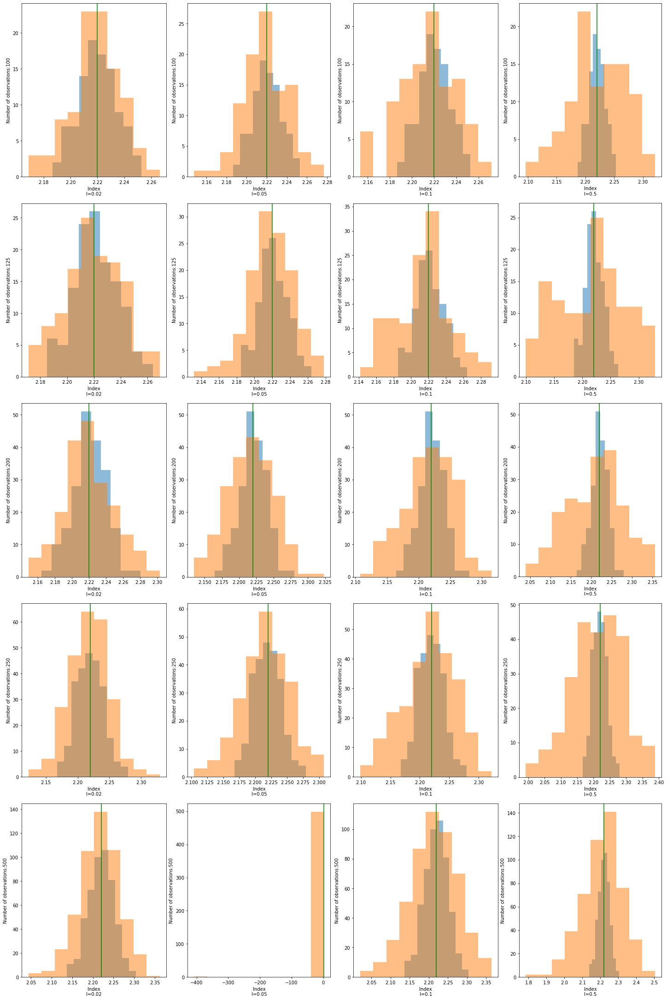

In [45]:
fig = plt.figure(figsize=[20,30],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 4, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[0])
for n in range(5):
    ax = fig.add_subplot(gs1[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][1], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.02')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs2 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[1])
for n in range(5):
    ax = fig.add_subplot(gs2[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][2], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.05')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

gs3 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[2])
for n in range(5):
    ax = fig.add_subplot(gs3[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][3], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.1')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs4 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[3])
for n in range(5):
    ax = fig.add_subplot(gs4[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][4], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.5')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

plt.show()

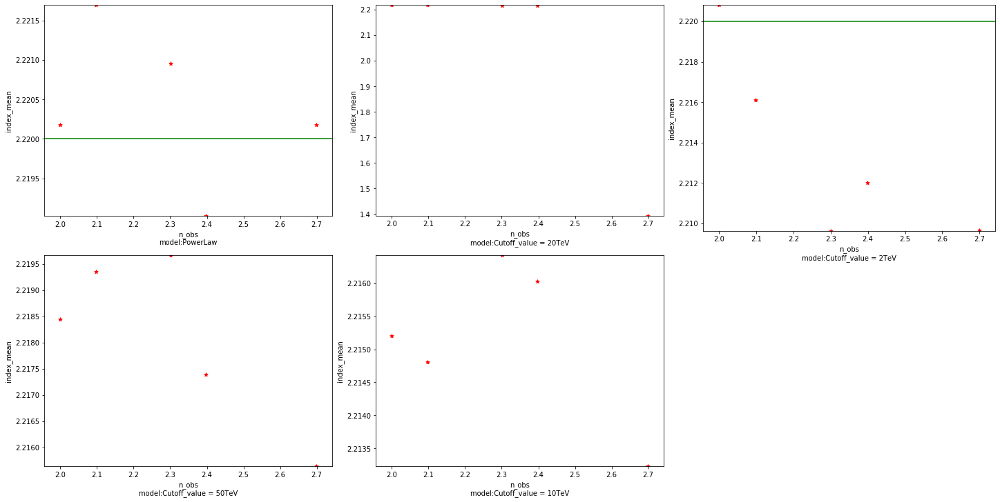

In [46]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n]}')
    plt.ylabel('index_mean')
    plt.axhline(y=model_simu.parameters["index"].value, color="green")
    plt.ylim(min([row[n] for row in mu]),max([row[n] for row in mu]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+2]}')
    plt.ylabel('index_mean')
    plt.axhline(y=model_simu.parameters["index"].value, color="green")
    plt.ylim(min([row[n+2] for row in mu]),max([row[n+2] for row in mu]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(1):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+4]}')
    plt.ylabel('index_mean')
    plt.axhline(y=model_simu.parameters["index"].value, color="green")
    plt.ylim(min([row[n+4] for row in mu]),max([row[n+4] for row in mu]))

plt.show()

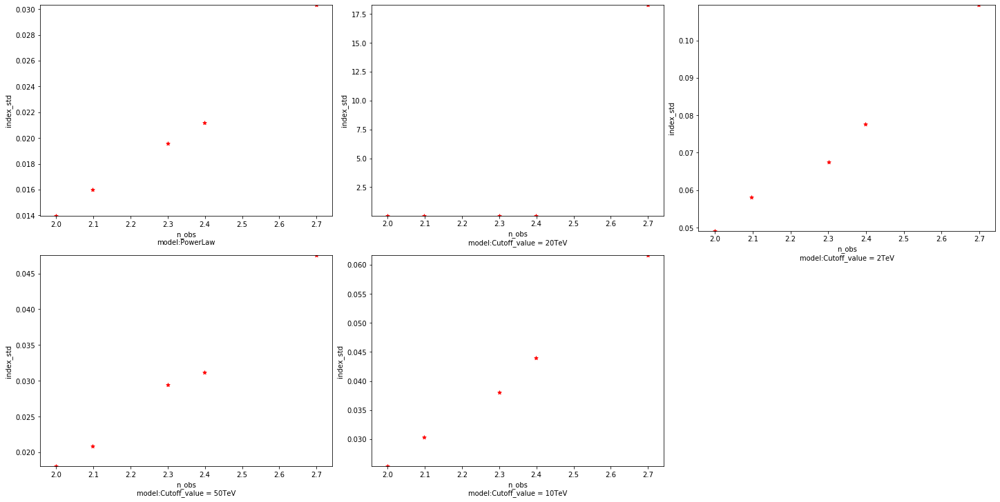

In [47]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n]}')
    plt.ylabel('index_std')
    plt.ylim(min([row[n] for row in sigma]),max([row[n] for row in sigma]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+2]}')
    plt.ylabel('index_std')
    plt.ylim(min([row[n+2] for row in sigma]),max([row[n+2] for row in sigma]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(1):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+4]}')
    plt.ylabel('index_std')
    plt.ylim(min([row[n+4] for row in sigma]),max([row[n+4] for row in sigma]))

plt.show()

In [48]:
for j in range(5):
    print(f"model: {j}")
    for i in range(5):
        mu[i][j]=amplitude[i][j].mean()
        sigma[i][j]=amplitude[i][j].std()
        print(f"amplitude: {amplitude[i][j].mean()} += {amplitude[i][j].std()}")

model: 0
amplitude: 1.2876338368636386e-12 += 3.012746334665229e-14
amplitude: 1.2846571766699697e-12 += 3.434165906679815e-14
amplitude: 1.2844615805590017e-12 += 4.214236797546734e-14
amplitude: 1.2841085058440728e-12 += 4.696933655825604e-14
amplitude: 1.2871695127986633e-12 += 6.426854162861659e-14
model: 1
amplitude: 1.2902387286805775e-12 += 3.9006046000713775e-14
amplitude: 1.2902923009817897e-12 += 4.6350800263067896e-14
amplitude: 1.2913360359789449e-12 += 6.465555934276816e-14
amplitude: 1.2922101732118028e-12 += 6.928687534547986e-14
amplitude: 1.3037697185789542e-12 += 1.0655648589565331e-13
model: 2
amplitude: 1.2900973595246905e-12 += 4.966494946896324e-14
amplitude: 1.2886607738371461e-12 += 6.018657486275612e-14
amplitude: 1.295368578549244e-12 += 7.325062985682673e-14
amplitude: 1.299220956299682e-12 += 8.661891318587932e-14
amplitude: 1.1557788262863972e-12 += 3.4612780012530106e-12
model: 3
amplitude: 1.2956267075103207e-12 += 6.011036129690028e-14
amplitude: 1.30054

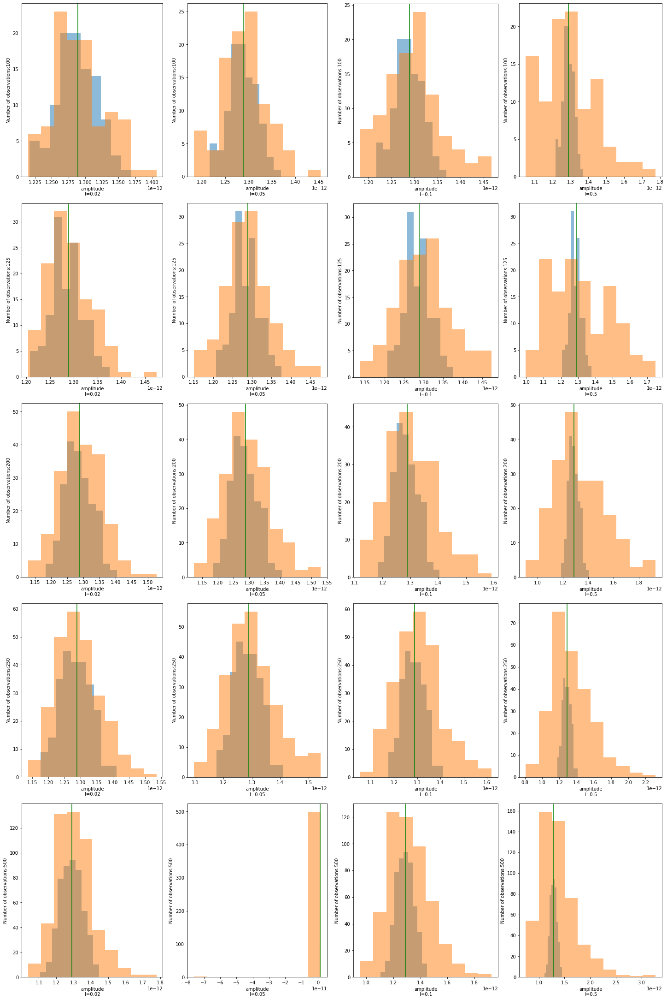

In [49]:
fig = plt.figure(figsize=[20,30],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 4, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[0])
for n in range(5):
    ax = fig.add_subplot(gs1[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][1], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.02')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs2 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[1])
for n in range(5):
    ax = fig.add_subplot(gs2[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][2], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.05')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

gs3 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[2])
for n in range(5):
    ax = fig.add_subplot(gs3[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][3], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.1')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs4 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[3])
for n in range(5):
    ax = fig.add_subplot(gs4[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][4], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.5')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

plt.show()

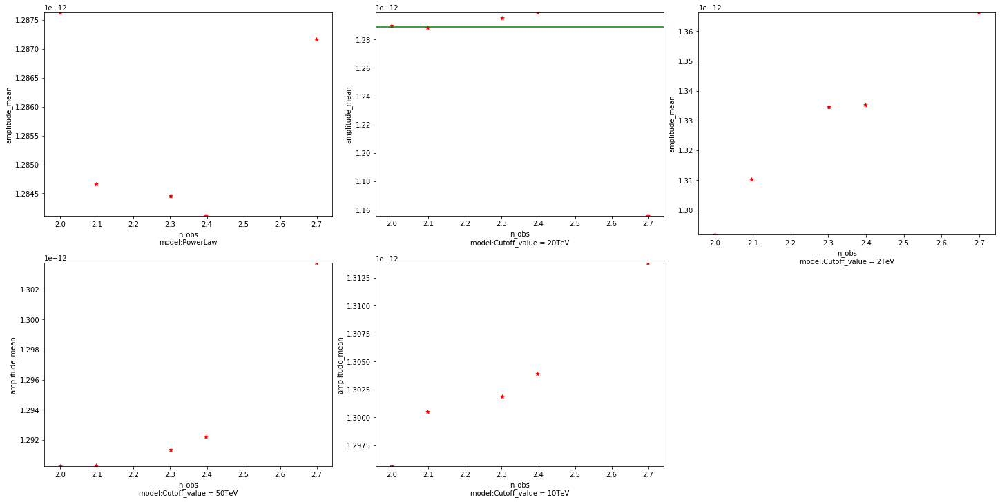

In [50]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n]}')
    plt.ylabel('amplitude_mean')
    plt.axhline(y=model_simu.parameters["amplitude"].value, color="green")
    plt.ylim(min([row[n] for row in mu]),max([row[n] for row in mu]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+2]}')
    plt.ylabel('amplitude_mean')
    plt.axhline(y=model_simu.parameters["amplitude"].value, color="green")
    plt.ylim(min([row[n+2] for row in mu]),max([row[n+2] for row in mu]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(1):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+4]}')
    plt.ylabel('amplitude_mean')
    plt.axhline(y=model_simu.parameters["amplitude"].value, color="green")
    plt.ylim(min([row[n+4] for row in mu]),max([row[n+4] for row in mu]))

plt.show()

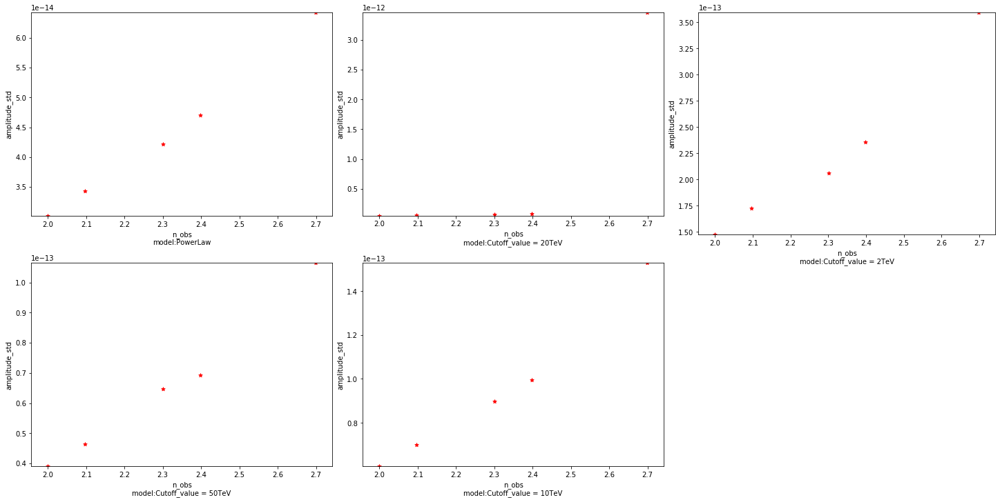

In [51]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n]}')
    plt.ylabel('amplitude_std')
    plt.ylim(min([row[n] for row in sigma]),max([row[n] for row in sigma]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+2]}')
    plt.ylabel('amplitude_std')
    plt.ylim(min([row[n+2] for row in sigma]),max([row[n+2] for row in sigma]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(1):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+4]}')
    plt.ylabel('amplitude_std')
    plt.ylim(min([row[n+4] for row in sigma]),max([row[n+4] for row in sigma]))

plt.show()

In [52]:
for j in range(4):
    print(f"model: {j}")
    for i in range(5):
        mu[i][j]=lambda_[i][j].mean()
        sigma[i][j]=lambda_[i][j].std()
        print(f"lambda_: {lambda_[i][j].mean()} += {lambda_[i][j].std()}")

model: 0
lambda_: 0.021332122518187512 += 0.006874194764426253
lambda_: 0.021559047562141102 += 0.007608988526343697
lambda_: 0.021766889892458473 += 0.010953846475441719
lambda_: 0.022227468691415096 += 0.012545365361086556
lambda_: 0.02516078361278347 += 0.021208358727235047
model: 1
lambda_: 0.05181690420791621 += 0.012497130924176734
lambda_: 0.05187835330270879 += 0.013659899382592555
lambda_: 0.0534611662355259 += 0.0176583792561417
lambda_: 0.054861576749435356 += 0.0229916192534532
lambda_: 0.05862115984219797 += 0.031746233626772445
model: 2
lambda_: 0.10346781234902654 += 0.0172881718223158
lambda_: 0.10588887278329268 += 0.021395690264315422
lambda_: 0.10660063844760191 += 0.02792368412226071
lambda_: 0.10795252970606309 += 0.03126026824970748
lambda_: 0.11054607540762883 += 0.04616042807850996
model: 3
lambda_: 0.5033444590589774 += 0.08802637041821045
lambda_: 0.5123524109196763 += 0.10061082539608704
lambda_: 0.5259170640292848 += 0.11839018065005166
lambda_: 0.5245477925

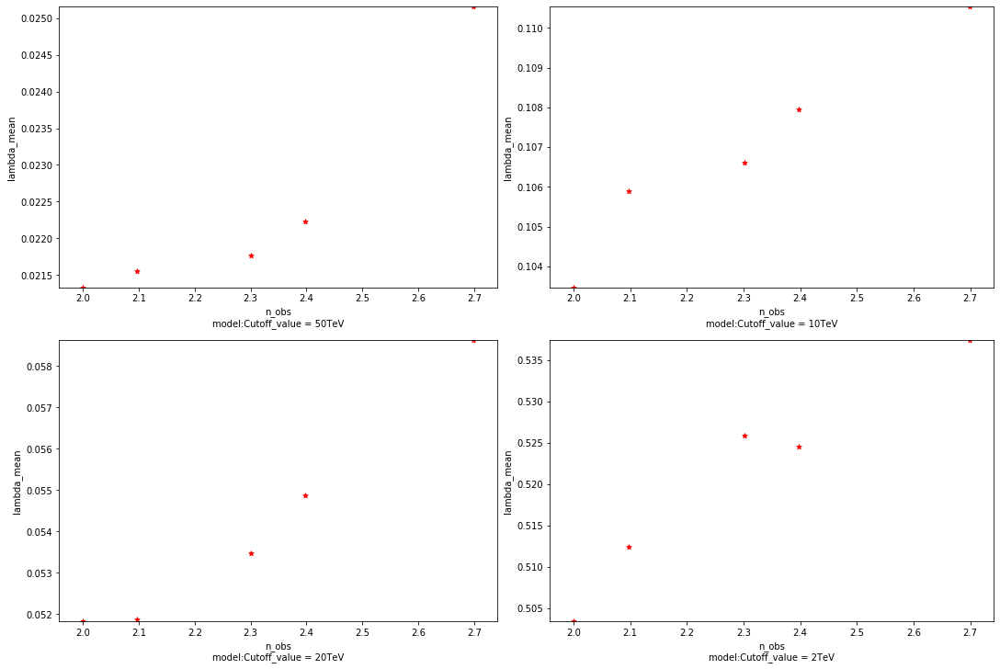

In [53]:
fig = plt.figure(figsize=[15,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 2, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+1]}')
    plt.ylabel('lambda_mean')
    plt.axhline(y=l[n], color="green")
    plt.ylim(min([row[n] for row in mu]),max([row[n] for row in mu]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+3]}')
    plt.ylabel('lambda_mean')
    plt.axhline(y=l[n+2], color="green")
    plt.ylim(min([row[n+2] for row in mu]),max([row[n+2] for row in mu]))

plt.show()

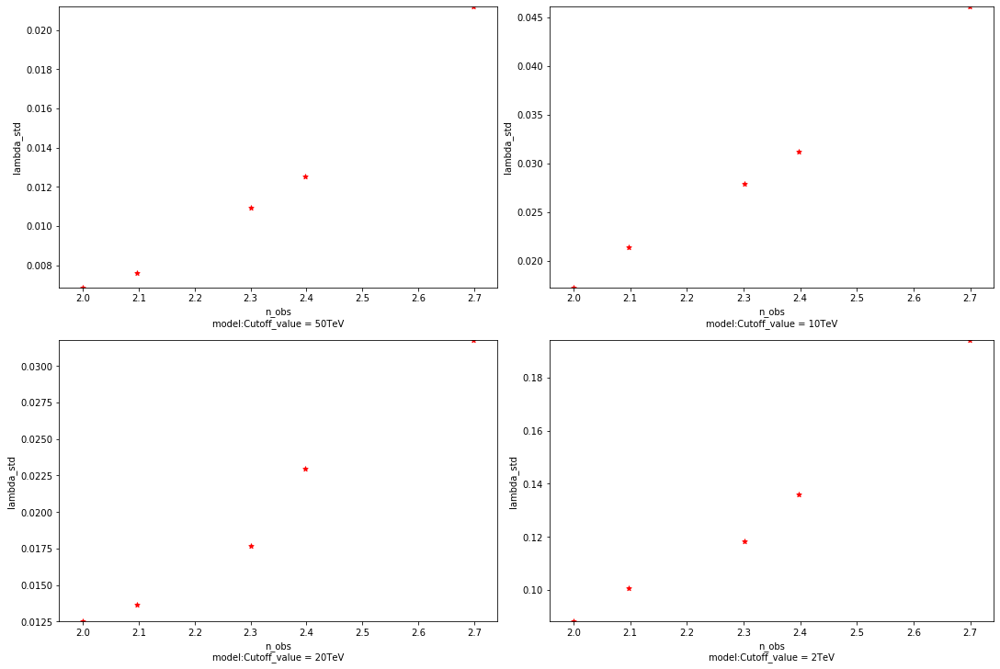

In [54]:
fig = plt.figure(figsize=[15,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 2, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+1]}')
    plt.ylabel('lambda_std')
    plt.ylim(min([row[n] for row in sigma]),max([row[n] for row in sigma]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+3]}')
    plt.ylabel('lambda_std')
    plt.ylim(min([row[n+2] for row in sigma]),max([row[n+2] for row in sigma]))

plt.show()

In [55]:
sim = [[0 for i in range(cols)] for j in range(rows)]
for i in range(5):
    s = PowerLawSpectralModel(
        index=index[i][0].mean(),
        amplitude=amplitude[i][0].mean() * u.Unit("cm-2 s-1 TeV-1"),
        reference=1 * u.TeV,
    )
    print(s) 
    sim[i][0]=s
    
for j in range(4):
    for i in range(5):
        s = ExpCutoffPowerLawSpectralModel(
            index=index[i][j+1].mean(),
            amplitude=amplitude[i][j+1].mean() * u.Unit("cm-2 s-1 TeV-1"),
            reference=1 * u.TeV,
            lambda_=lambda_[i][j].mean() * u.Unit("TeV-1"),
            alpha = 1,
        )
        print(s)
        sim[i][j+1]=s

PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.285e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.284e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --

<function matplotlib.pyplot.show(*args, **kw)>

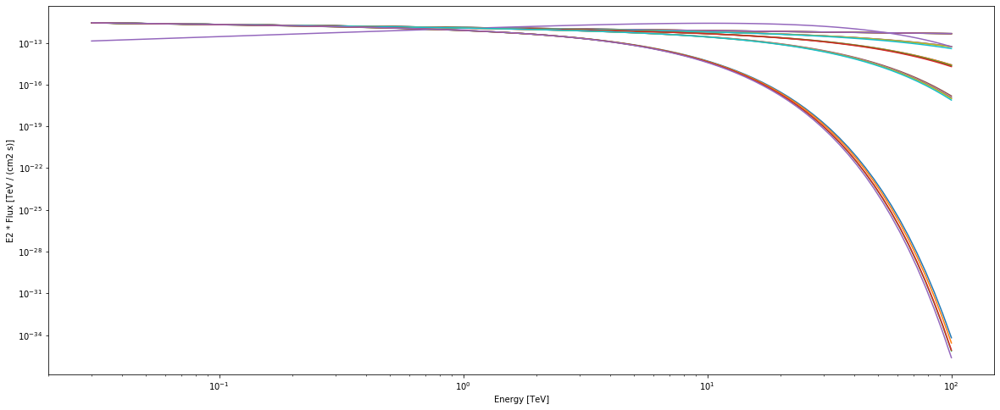

In [56]:
plt.figure(figsize=[20,8])
energy_range = [0.03, 100] * u.TeV
for j in range(5):
    for i in range(5):
        sim[i][j].plot(energy_range=energy_range, energy_power=2)
plt.show

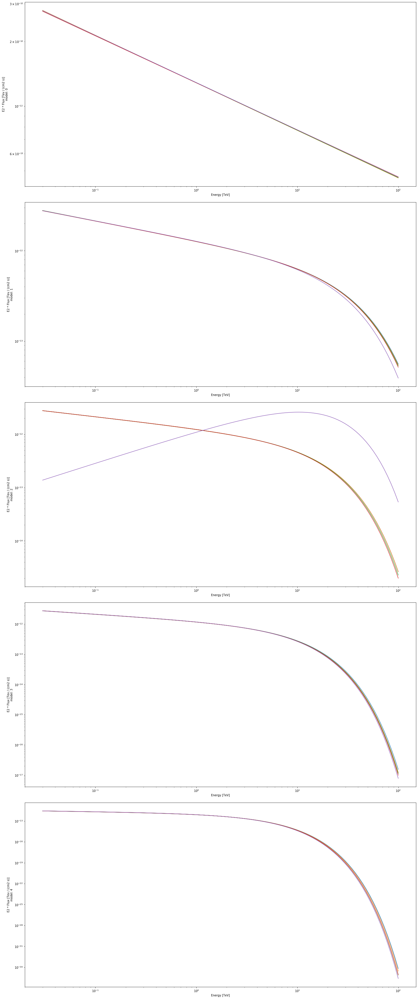

In [57]:
fig = plt.figure(figsize=[20,48],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 1, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[0])
for n in range(5):
    ax = fig.add_subplot(gs1[n])
    for i in range(5):
        sim[i][n].plot(energy_range=energy_range, energy_power=2)
    plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {n}')
    
plt.show()

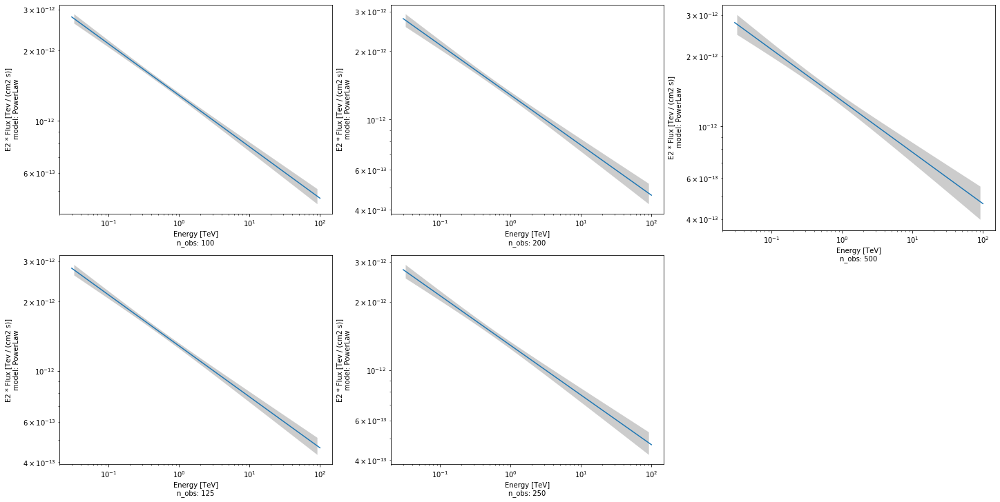

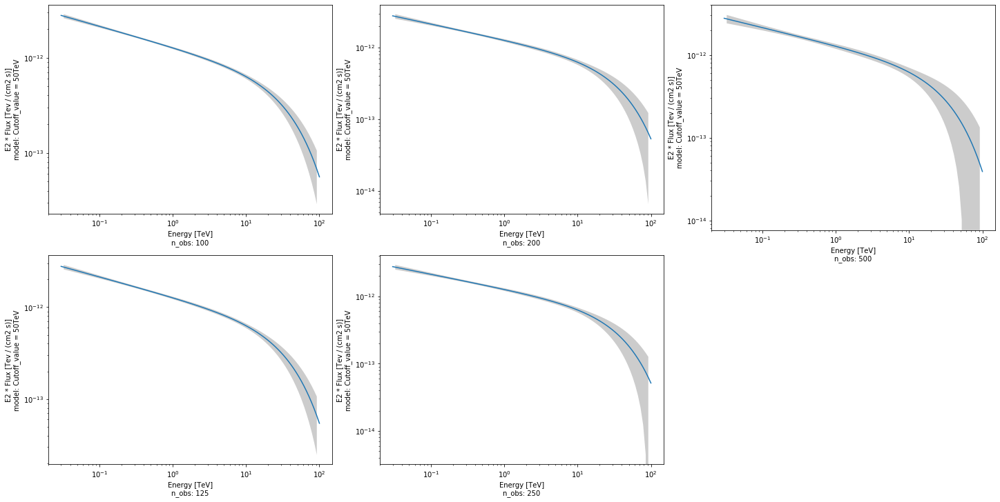

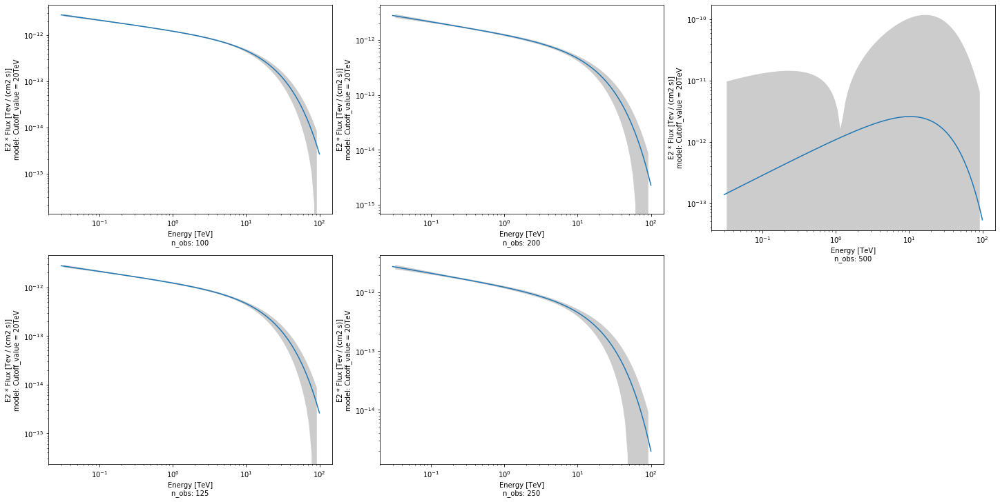

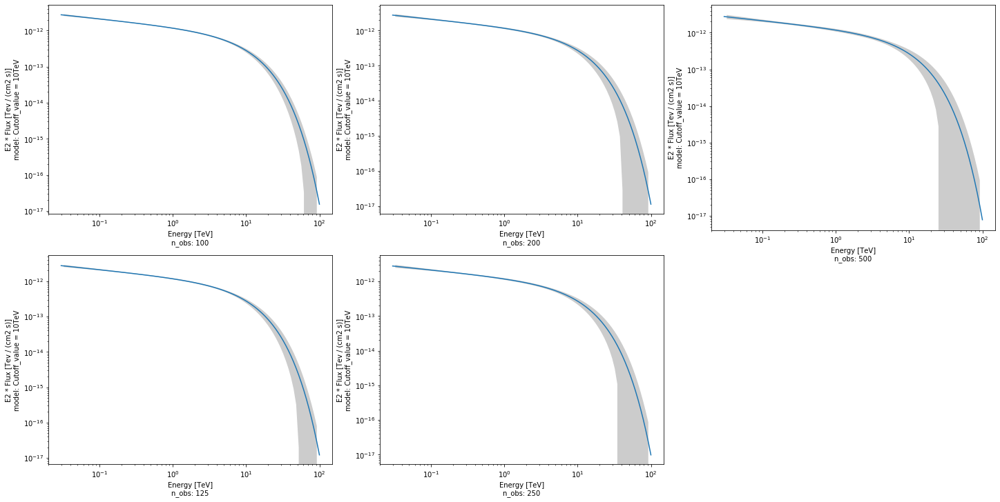

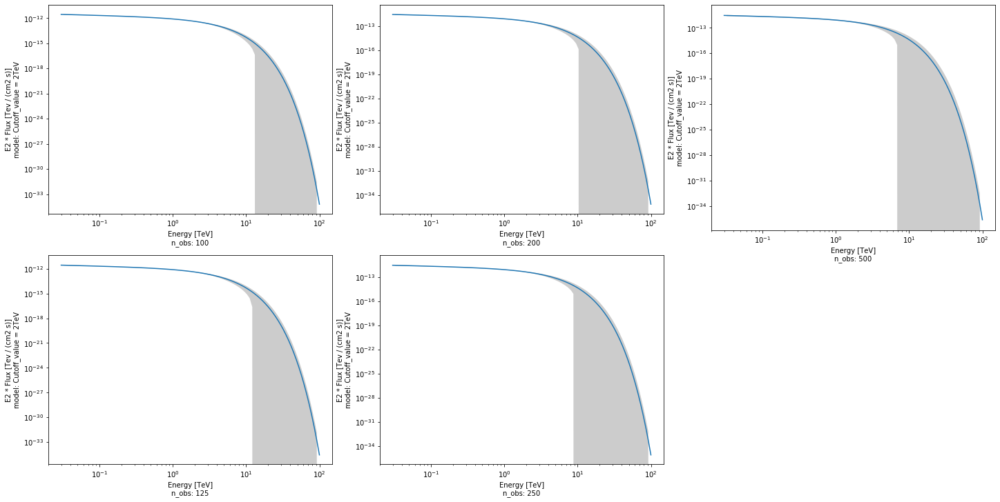

In [58]:
for i in range(5):    
    fig = plt.figure(figsize=[20,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 3, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim[n][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n][i], covar=covar[n][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i]}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim[n+2][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+2][i], covar=covar[n+2][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+2]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i]}')

    gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
    for n in range(1):
        ax = fig.add_subplot(gs3[n])
        sim[n+4][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+4][i], covar=covar[n+4][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+4]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i]}')


    plt.show()

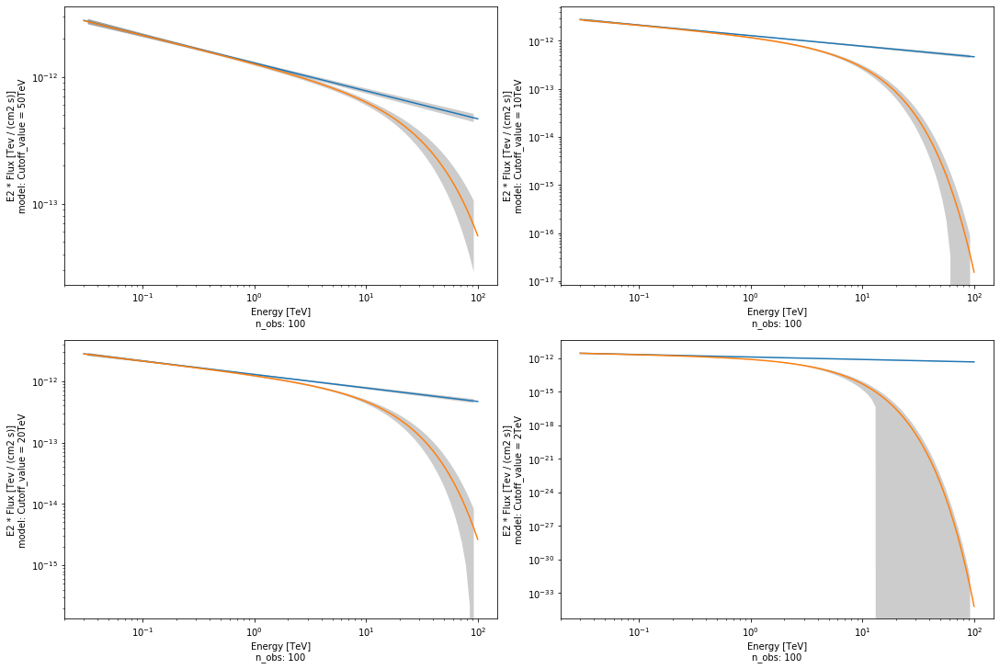

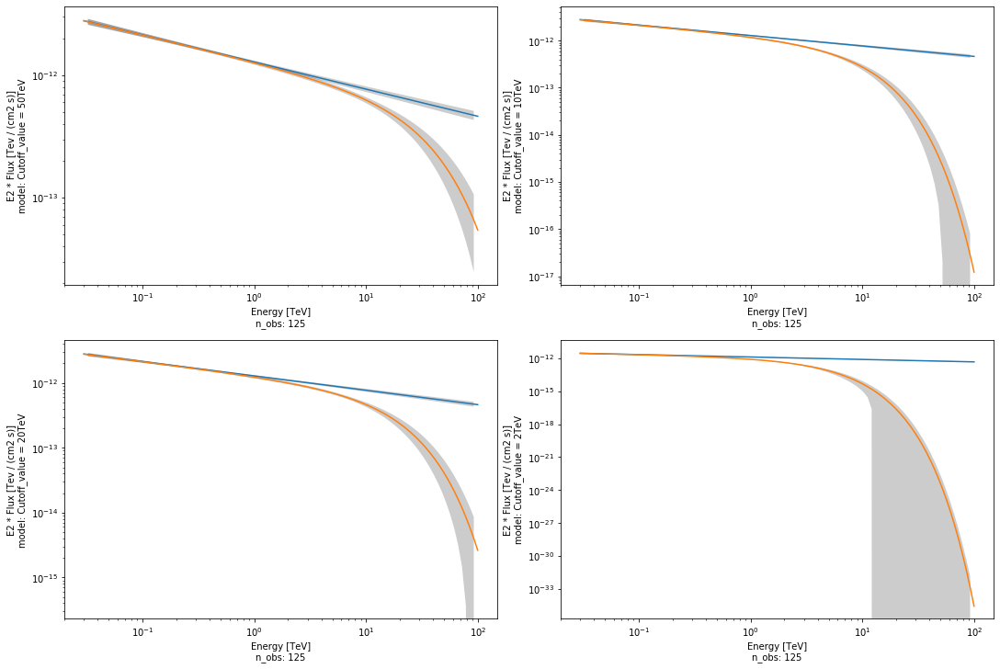

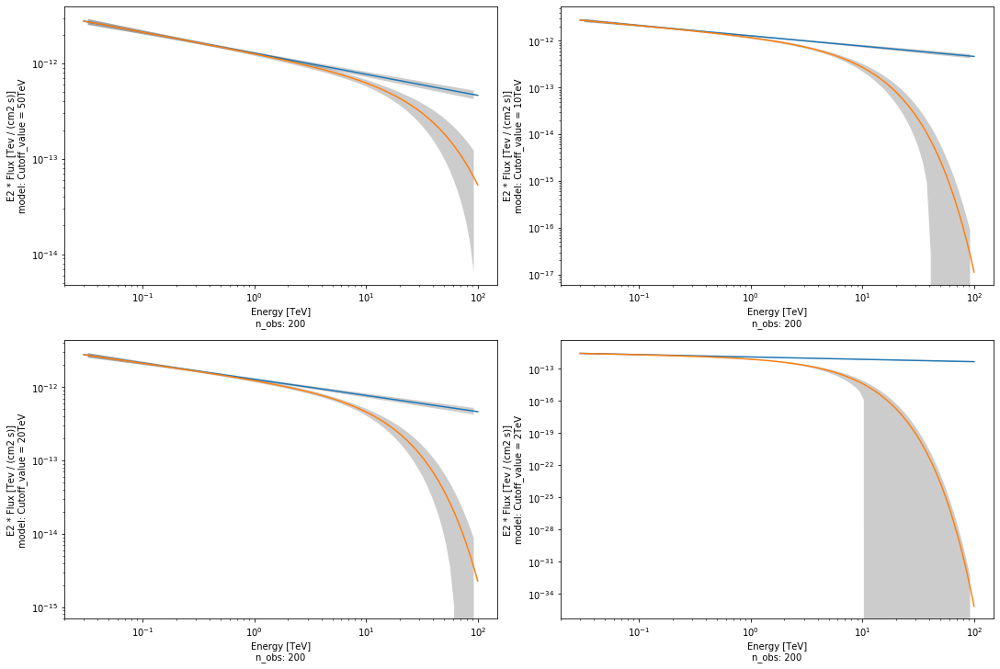

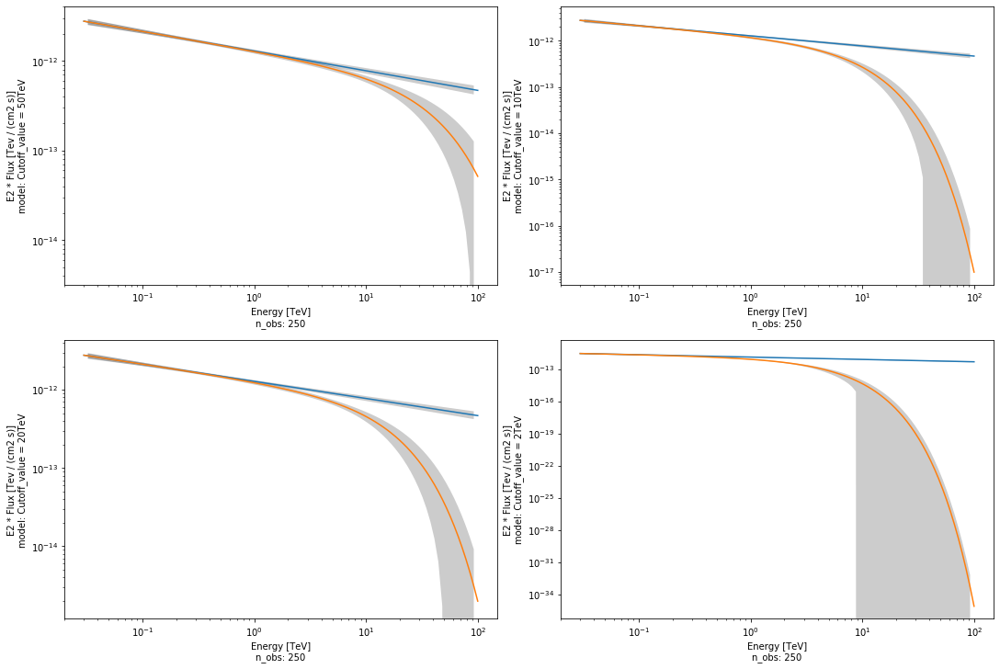

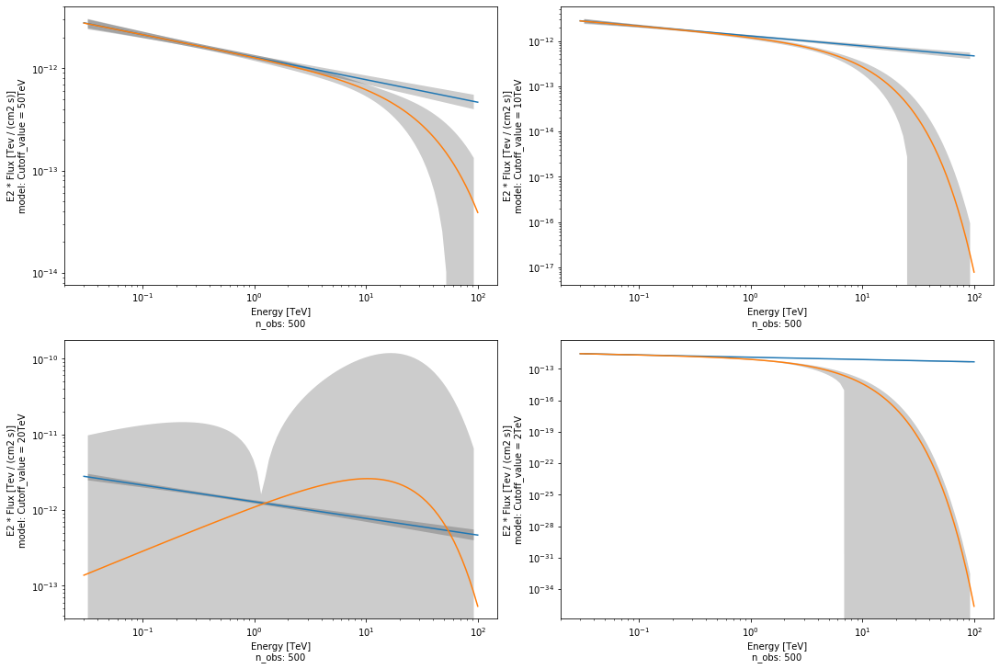

In [59]:
for i in range(5):    
    fig = plt.figure(figsize=[15,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 2, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim[i][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][0], covar=covar[i][0],energy_range=energy_range, energy_power=2)
        sim[i][n+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][n+1], covar=covar[i][n+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[i]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[n+1]}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim[i][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][0], covar=covar[i][0],energy_range=energy_range, energy_power=2)
        sim[i][n+3].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][n+3], covar=covar[i][n+3],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[i]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[n+3]}')


    plt.show()

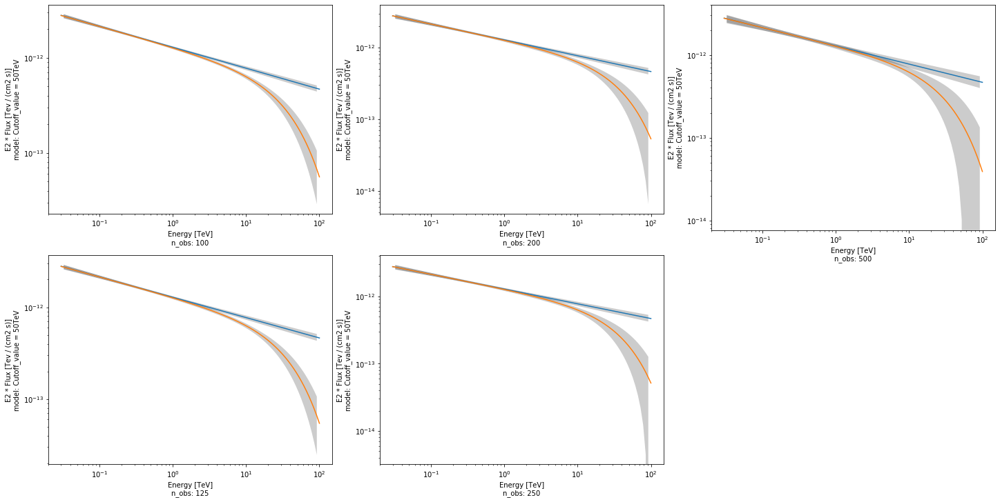

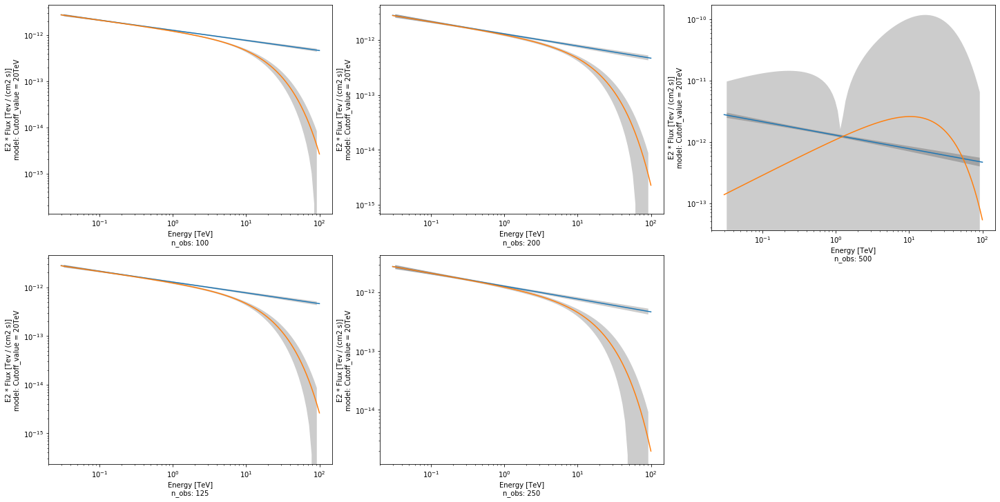

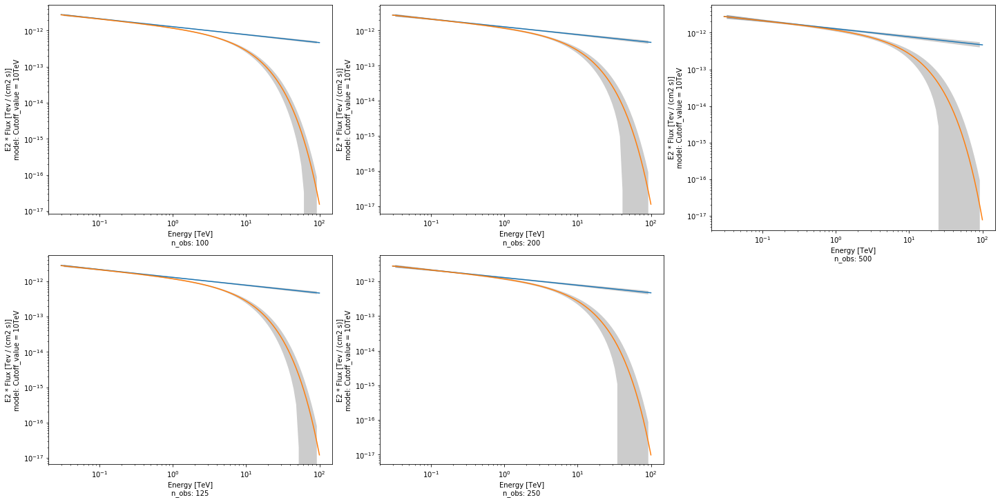

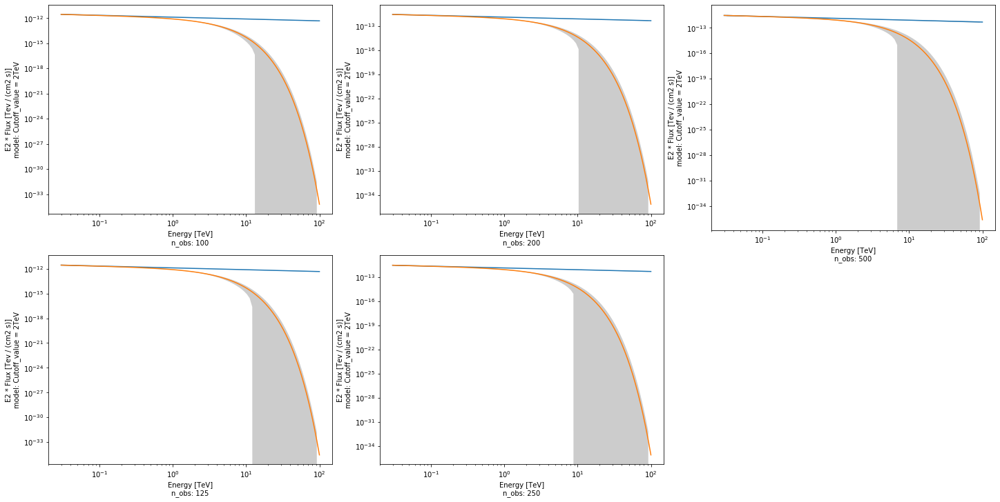

In [60]:
for i in range(4):    
    fig = plt.figure(figsize=[20,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 3, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim[n][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n][0], covar=covar[n][0],energy_range=energy_range, energy_power=2)
        sim[n][i+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n][i+1], covar=covar[n][i+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i+1]}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim[n+2][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+2][0], covar=covar[n+2][0],energy_range=energy_range, energy_power=2)
        sim[n+2][i+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+2][i+1], covar=covar[n+2][i+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+2]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i+1]}')

    gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
    for n in range(1):
        ax = fig.add_subplot(gs3[n])
        sim[n+4][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+4][0], covar=covar[n+4][0],energy_range=energy_range, energy_power=2)
        sim[n+4][i+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+4][i+1], covar=covar[n+4][i+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+4]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i+1]}')


    plt.show()

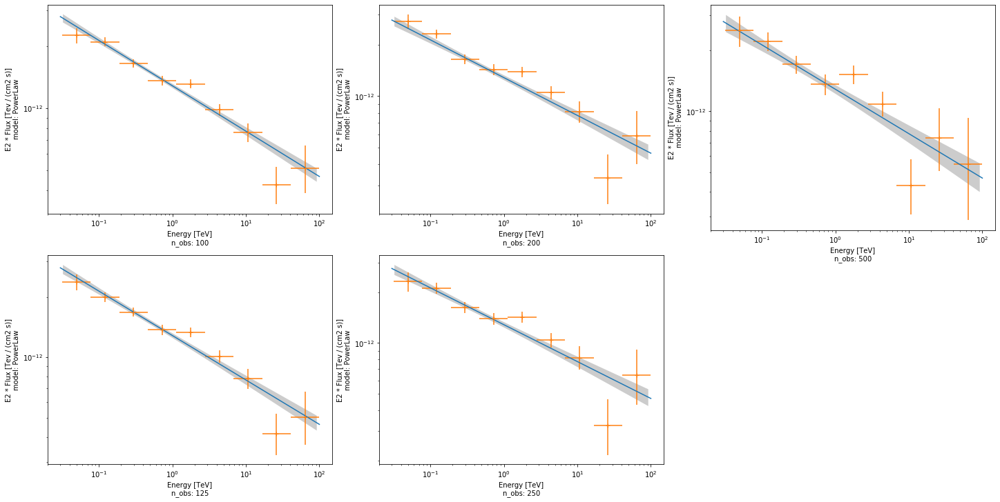

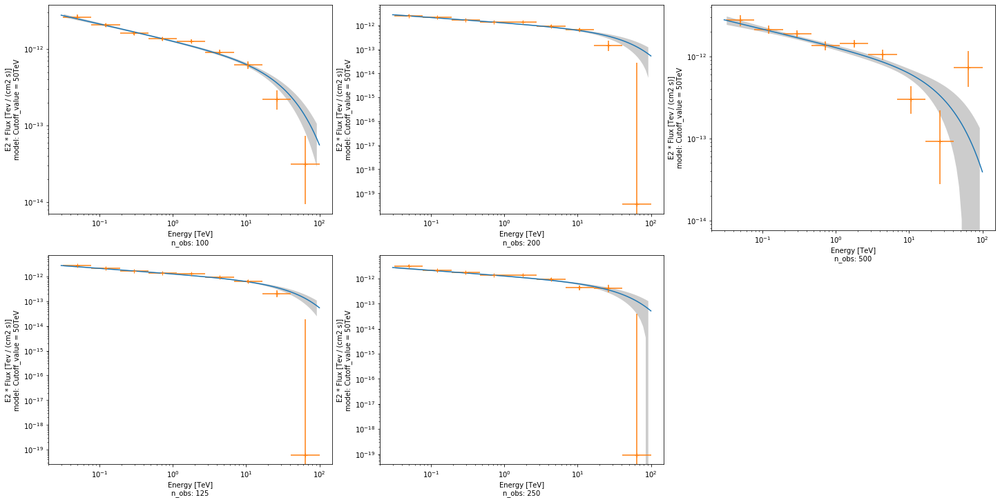

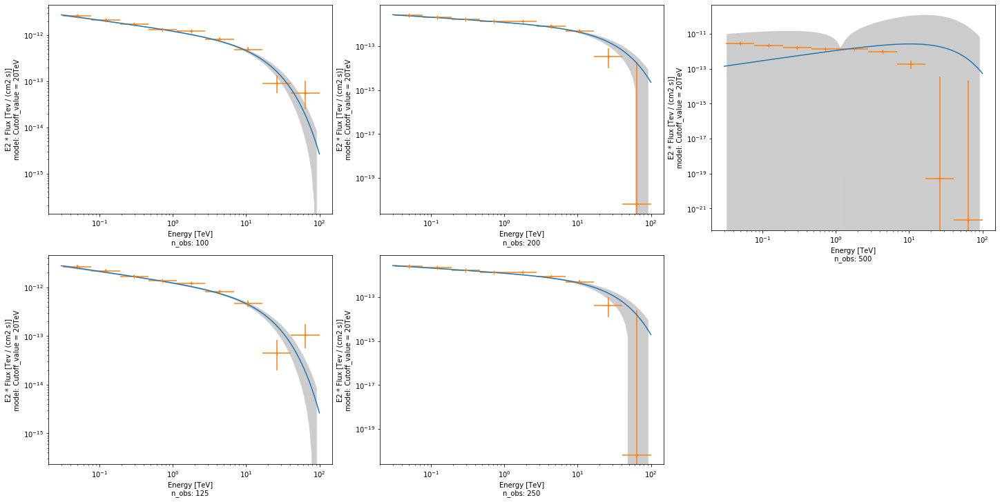

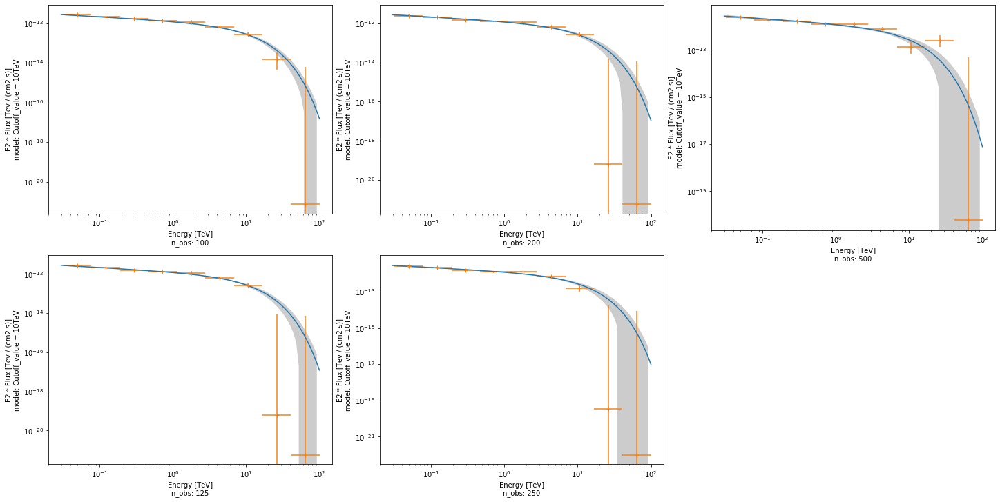

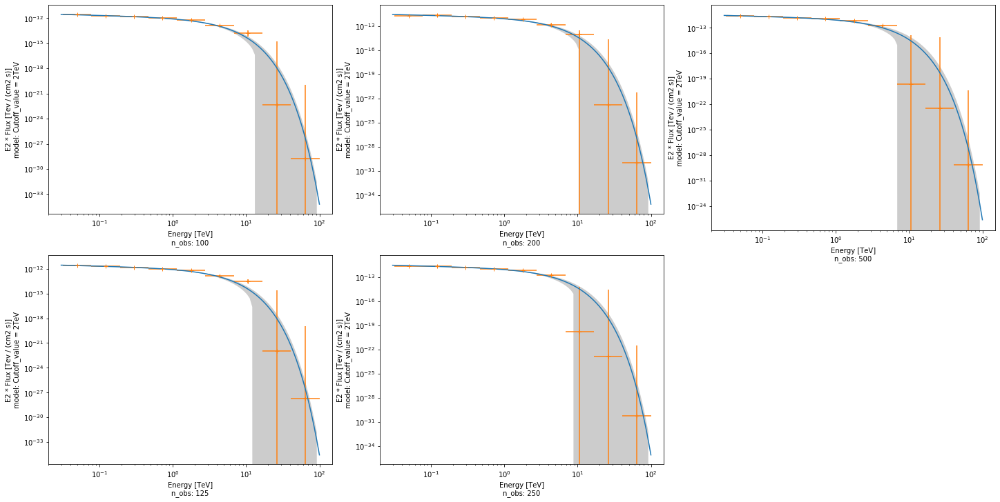

In [61]:
for i in range(5):    
    fig = plt.figure(figsize=[20,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 3, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim[n][i].plot(energy_range=energy_range, energy_power=2)
        fpes_all[n][i][0].plot(energy_power=2)
        plot_error(self=sim[n][i], covar=covar[n][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i]}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim[n+2][i].plot(energy_range=energy_range, energy_power=2)
        fpes_all[n+2][i][0].plot(energy_power=2)
        plot_error(self=sim[n+2][i], covar=covar[n+2][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+2]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i]}')

    gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
    for n in range(1):
        ax = fig.add_subplot(gs3[n])
        sim[n+4][i].plot(energy_range=energy_range, energy_power=2)
        fpes_all[n+4][i][0].plot(energy_power=2)
        plot_error(self=sim[n+4][i], covar=covar[n+4][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+4]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i]}')


    plt.show()